# Objective: fine-tuning DETR

-   This notebook based on: https://github.com/woctezuma/finetune-detr
-   Official DETR repository: https://github.com/facebookresearch/detr
-   Discussion about fine-tuning in [a Github issue](https://github.com/facebookresearch/detr/issues/9).

## Define useful boilerplate functions

Adapted from:
-   https://colab.research.google.com/github/facebookresearch/detr/blob/colab/notebooks/detr_attention.ipynb

In [32]:
pip install torch==1.8.0+cu111 torchvision==0.9.0+cu111 torchaudio==0.8.0 -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 1982.3 MB 7.7 kB/s  eta 0:00:01     |██████████████████████████████  | 1862.7 MB 12.2 MB/s eta 0:00:10
  Using cached https://download.pytorch.org/whl/cu111/torchvision-0.9.0%2Bcu111-cp39-cp39-linux_x86_64.whl (17.6 MB)
  Using cached torchaudio-0.8.0-cp39-cp39-manylinux1_x86_64.whl (1.9 MB)
  Attempting uninstall: torch
    Found existing installation: torch 1.8.0
    Uninstalling torch-1.8.0:
      Successfully uninstalled torch-1.8.0
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.9.0
    Uninstalling torchvision-0.9.0:
      Successfully uninstalled torchvision-0.9.0
  Attempting uninstall: torchaudio
    Found existing installation: torchaudio 0.10.1
    Uninstalling torchaudio-0.10.1:
      Successfully uninstalled torchaudio-0.10.1
Note: you may need to restart the kernel to use updated packages.


In [1]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

torch.set_grad_enabled(False);

1.8.0+cu111 True


In [2]:
import torchvision.transforms as T

# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

In [3]:
def filter_bboxes_from_outputs(outputs,
                               threshold=0.7):
  
  # keep only predictions with confidence above threshold
  probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
  keep = probas.max(-1).values > threshold

  probas_to_keep = probas[keep]

  # convert boxes from [0; 1] to image scales
  bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
  
  return probas_to_keep, bboxes_scaled

In [4]:
# COCO classes
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

In [5]:
import matplotlib.pyplot as plt

def plot_results(pil_img, prob=None, boxes=None):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    if prob is not None and boxes is not None:
      for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
          ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                    fill=False, color=c, linewidth=3))
          cl = p.argmax()
          text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
          ax.text(xmin, ymin, text, fontsize=15,
                  bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

## Load an image for a demo

In [6]:
model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
model.eval();

Using cache found in /home/sn/.cache/torch/hub/facebookresearch_detr_master


In [7]:
from PIL import Image
import requests

url = 'http://images.cocodataset.org/train2017/000000310645.jpg'
im = Image.open(requests.get(url, stream=True).raw)

In [8]:
# mean-std normalize the input image (batch-size: 1)
img = transform(im).unsqueeze(0)

# propagate through the model
outputs = model(img)

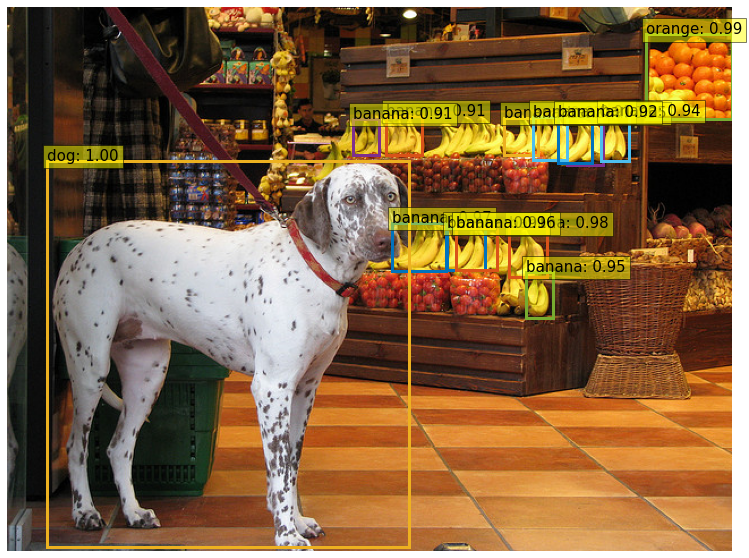

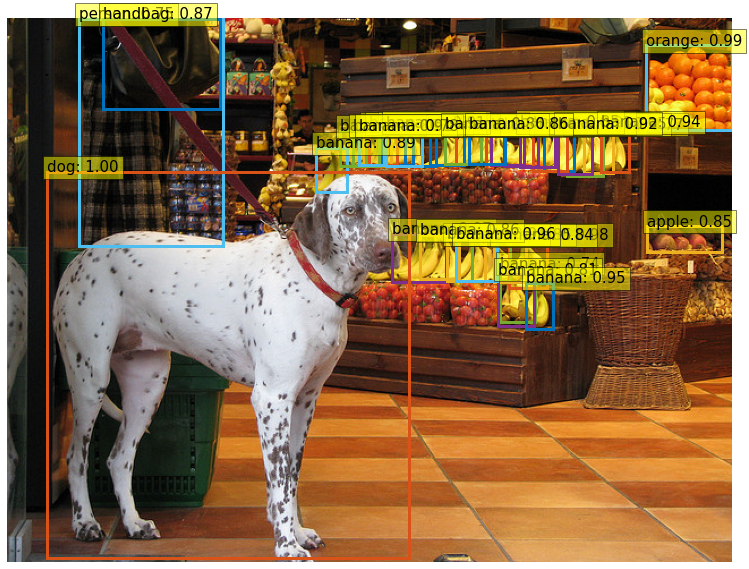

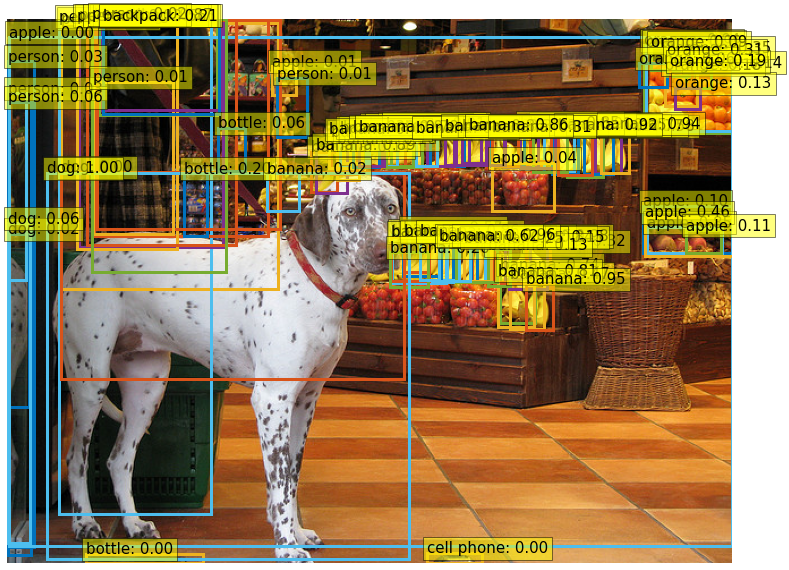

In [9]:
for threshold in [0.9, 0.7, 0.0]:
  
  probas_to_keep, bboxes_scaled = filter_bboxes_from_outputs(outputs,
                                                            threshold=threshold)

  plot_results(im, probas_to_keep, bboxes_scaled)

NB: if the threshold is equal to zero, then you will see all of the 100 query slots. The zero-threshold is only used for illustration. In usual cases, most query slots have a low confidence score, so that irrelevant query slots would be pruned with a higher threshold, such as 0.7 or 0.9.

Reference: https://github.com/facebookresearch/detr/issues/9#issuecomment-635357693


## Clone custom code of DETR

In [11]:
%cd /home/sn/EVA7/capstone/

!rm -rf detr
!git clone https://github.com/woctezuma/detr.git

%cd detr/

!git checkout finetune

/home/sn/EVA7/capstone
Cloning into 'detr'...
remote: Enumerating objects: 239, done.
remote: Total 239 (delta 0), reused 0 (delta 0), pack-reused 239
Receiving objects: 100% (239/239), 284.62 KiB | 787.00 KiB/s, done.
Resolving deltas: 100% (131/131), done.
/home/sn/EVA7/capstone/detr
Branch 'finetune' set up to track remote branch 'finetune' from 'origin'.
Switched to a new branch 'finetune'


## Load pre-trained weights

Load a check-point (urls can be found [here](https://github.com/facebookresearch/detr#model-zoo)), then remove the classification head.

In [12]:
# Get pretrained weights
checkpoint = torch.hub.load_state_dict_from_url(
            url='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth',
            map_location='cpu',
            check_hash=True)

# Remove class weights
del checkpoint["model"]["class_embed.weight"]
del checkpoint["model"]["class_embed.bias"]

# Save
torch.save(checkpoint,
           'detr-r50_no-class-head.pth')

## Prepare the dataset for fine-tuning

In [13]:
# Choose whether to start indexing categories with 0 or with 1.
#
# NB: convention in COCO dataset is such that the 1st class (person) has ID n°1.
#
# NB²: this is why we chose to set to 1 the default value of `first_class_index`
# in `via2coco.convert()`.

first_class_index = 0

In [90]:
data_path = !pwd
data_path = data_path[0] + '/'
data_path

first_class_index = 0
num_classes = 4
finetuned_classes = [
    'outlier',
    'rebar',
    'spall',
    'crack'
]

We expect the directory structure to be the following:
```
path/to/coco/
├ annotations/  # JSON annotations
│  ├ annotations/custom_train.json
│  └ annotations/custom_val.json
├ train2017/    # training images
└ val2017/      # validation images
```

In [15]:
pwd

'/home/sn/EVA7/capstone/detr'

In [16]:
!mkdir -p '/home/sn/EVA7/capstone/data/custom/annotations'

!mv /home/sn/EVA7/capstone/dataset/annotations/custom_train.json /home/sn/EVA7/capstone/data/custom/annotations/custom_train.json
!mv /home/sn/EVA7/capstone/dataset/annotations/custom_val.json /home/sn/EVA7/capstone/data/custom/annotations/custom_val.json

!mkdir -p /home/sn/EVA7/capstone/data/custom/train2017/

!mv /home/sn/EVA7/capstone/dataset/train_images/*.jpg /home/sn/EVA7/capstone/data/custom/train2017/

!mkdir -p /home/sn/EVA7/capstone/data/custom/val2017/

!mv /home/sn/EVA7/capstone/dataset/test_images/*.jpg /home/sn/EVA7/capstone/data/custom/val2017/


## Check the dataset after it was pre-processed for fine-tuning

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:
-   Demo of COCO API: https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocoDemo.ipynb

In [ ]:
# pip install pycocotools

In [17]:
# pip install scikit-image

     |████████████████████████████████| 13.8 MB 6.9 MB/s eta 0:00:01
     |████████████████████████████████| 6.6 MB 4.0 MB/s eta 0:00:01
     |████████████████████████████████| 1.9 MB 4.2 MB/s eta 0:00:01
     |████████████████████████████████| 178 kB 3.1 MB/s eta 0:00:01
     |████████████████████████████████| 3.3 MB 3.5 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [91]:
%matplotlib inline
import pycocotools.coco as coco
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import pylab
pylab.rcParams['figure.figsize'] = (10.0, 8.0)

In [92]:
dataDir='/home/sn/EVA7/capstone/data/custom/'  #'/content/data/custom/'
dataType='train2017'
annFile='{}annotations/custom_train.json'.format(dataDir)

In [93]:
# initialize COCO api for instance annotations
coco=COCO(annFile)

loading annotations into memory...
Done (t=0.03s)
creating index...
index created!


In [94]:
# display COCO categories and supercategories
cats = coco.loadCats(coco.getCatIds())

nms=[cat['name'] for cat in cats]
print('Categories: {}'.format(nms))

nms = set([cat['supercategory'] for cat in cats])
print('Super-categories: {}'.format(nms))

Categories: ['outlier', 'rebar', 'spall', 'crack']
Super-categories: {'crack', 'outlier', 'spall', 'rebar'}


In [97]:
# load and display image
catIds = coco.getCatIds(catNms=['outlier', 'rebar', 'spall', 'crack']);
imgIds = coco.getImgIds(catIds=catIds );

In [100]:
catIds = [2] ## Select images for spall
imgIds = coco.getImgIds(catIds=catIds)
len(imgIds)

249

Image n°126
Image name: /home/sn/EVA7/capstone/data/custom//train2017/000135.jpg


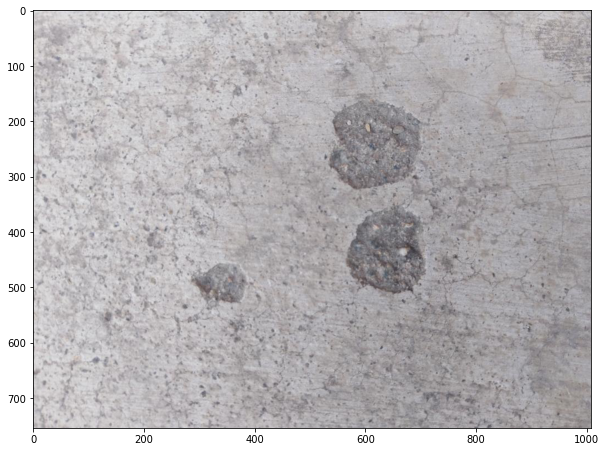

In [101]:
img_id = imgIds[np.random.randint(0,len(imgIds))]
print('Image n°{}'.format(img_id))

img = coco.loadImgs(img_id)[0]

img_name = '%s/%s/%s'%(dataDir, dataType, img['file_name'])
print('Image name: {}'.format(img_name))

I = io.imread(img_name)
plt.figure()
plt.imshow(I)

In [102]:
annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds)
anns = coco.loadAnns(annIds)

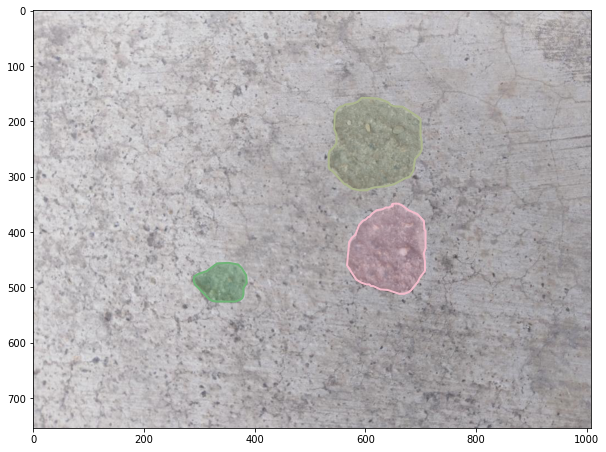

In [103]:
# load and display instance annotations
plt.imshow(I)
coco.showAnns(anns, draw_bbox=False)

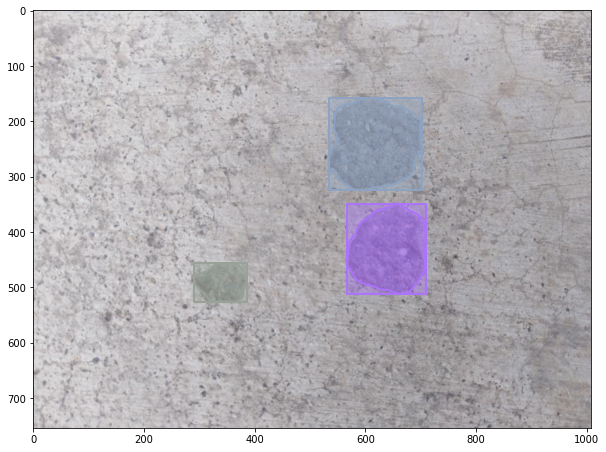

In [104]:
plt.imshow(I)
coco.showAnns(anns, draw_bbox=True)

## Fine-tuning

In [118]:
assert(first_class_index in [0, 1])

if first_class_index == 0:

  # There are three concreate defect classes rebar, spall and crack. outlier is everything else!

  num_classes = 4

  finetuned_classes = [
      'outlier',
      'rebar',
      'spall',
      'crack'
  ]

  # The `no_object` class will be automatically reserved by DETR with ID equal
  # to `num_classes`, so ID n°1 here.  

else:

  # There are three concreate defect classes rebar, spall and crack. Outlier is everything else!

  num_classes = 4

  finetuned_classes = [
      'N/A', 'rebar', 'spall', 'crack'
  ]

print('First class index: {}'.format(first_class_index))  
print('Parameter num_classes: {}'.format(num_classes))
print('Fine-tuned classes: {}'.format(finetuned_classes))

First class index: 0
Parameter num_classes: 4
Fine-tuned classes: ['outlier', 'rebar', 'spall', 'crack']


In [119]:
%cd /home/sn/EVA7/capstone/detr/

/home/sn/EVA7/capstone/detr


In [120]:
!python main.py \
  --dataset_file "custom" \
  --coco_path "/home/sn/EVA7/capstone/data/custom/" \
  --output_dir "outputs" \
  --resume "detr-r50_no-class-head.pth" \
  --num_classes $num_classes \
  --epochs 25

Not using distributed mode
git:
  sha: e42a3b174d2325c28f82d7114138c755ac7c095a, status: clean, branch: finetune

Namespace(lr=0.0001, lr_backbone=1e-05, batch_size=2, weight_decay=0.0001, epochs=25, lr_drop=200, clip_max_norm=0.1, frozen_weights=None, backbone='resnet50', dilation=False, position_embedding='sine', enc_layers=6, dec_layers=6, dim_feedforward=2048, hidden_dim=256, dropout=0.1, nheads=8, num_queries=100, pre_norm=False, masks=False, aux_loss=True, set_cost_class=1, set_cost_bbox=5, set_cost_giou=2, mask_loss_coef=1, dice_loss_coef=1, bbox_loss_coef=5, giou_loss_coef=2, eos_coef=0.1, num_classes=4, dataset_file='custom', coco_path='/home/sn/EVA7/capstone/data/custom/', coco_panoptic_path=None, remove_difficult=False, output_dir='outputs', device='cuda', seed=42, resume='detr-r50_no-class-head.pth', start_epoch=0, eval=False, num_workers=2, world_size=1, dist_url='env://', distributed=False)
number of params: 41280009
loading annotations into memory...
Done (t=0.04s)
creat

Epoch: [0]  [ 50/594]  eta: 0:02:08  lr: 0.000100  class_error: 100.00  loss: 10.5586 (15.1855)  loss_ce: 0.4397 (0.6978)  loss_bbox: 0.5850 (0.8871)  loss_giou: 0.7723 (0.7897)  loss_ce_0: 0.6413 (1.0158)  loss_bbox_0: 0.6320 (0.9450)  loss_giou_0: 0.7500 (0.8310)  loss_ce_1: 0.5944 (0.9256)  loss_bbox_1: 0.5012 (0.9118)  loss_giou_1: 0.5610 (0.7917)  loss_ce_2: 0.5094 (0.8216)  loss_bbox_2: 0.5621 (0.9065)  loss_giou_2: 0.5910 (0.7865)  loss_ce_3: 0.4902 (0.7634)  loss_bbox_3: 0.6590 (0.9019)  loss_giou_3: 0.6536 (0.7980)  loss_ce_4: 0.4499 (0.7261)  loss_bbox_4: 0.6195 (0.8947)  loss_giou_4: 0.7707 (0.7915)  loss_ce_unscaled: 0.4397 (0.6978)  class_error_unscaled: 100.0000 (96.2418)  loss_bbox_unscaled: 0.1170 (0.1774)  loss_giou_unscaled: 0.3862 (0.3949)  cardinality_error_unscaled: 1.0000 (9.5098)  loss_ce_0_unscaled: 0.6413 (1.0158)  loss_bbox_0_unscaled: 0.1264 (0.1890)  loss_giou_0_unscaled: 0.3750 (0.4155)  cardinality_error_0_unscaled: 1.0000 (26.2549)  loss_ce_1_unscaled: 0.

Epoch: [0]  [100/594]  eta: 0:01:52  lr: 0.000100  class_error: 100.00  loss: 9.2265 (12.9782)  loss_ce: 0.4372 (0.6024)  loss_bbox: 0.3924 (0.7222)  loss_giou: 0.4892 (0.7271)  loss_ce_0: 0.5294 (0.8116)  loss_bbox_0: 0.4789 (0.7915)  loss_giou_0: 0.5234 (0.7732)  loss_ce_1: 0.4959 (0.7462)  loss_bbox_1: 0.3835 (0.7543)  loss_giou_1: 0.6448 (0.7416)  loss_ce_2: 0.4679 (0.6715)  loss_bbox_2: 0.3980 (0.7348)  loss_giou_2: 0.5679 (0.7319)  loss_ce_3: 0.4666 (0.6399)  loss_bbox_3: 0.3404 (0.7322)  loss_giou_3: 0.5162 (0.7330)  loss_ce_4: 0.4370 (0.6169)  loss_bbox_4: 0.3717 (0.7220)  loss_giou_4: 0.5305 (0.7259)  loss_ce_unscaled: 0.4372 (0.6024)  class_error_unscaled: 100.0000 (98.1023)  loss_bbox_unscaled: 0.0785 (0.1444)  loss_giou_unscaled: 0.2446 (0.3636)  cardinality_error_unscaled: 1.0000 (5.5149)  loss_ce_0_unscaled: 0.5294 (0.8116)  loss_bbox_0_unscaled: 0.0958 (0.1583)  loss_giou_0_unscaled: 0.2617 (0.3866)  cardinality_error_0_unscaled: 1.0000 (14.0594)  loss_ce_1_unscaled: 0.4

Epoch: [0]  [150/594]  eta: 0:01:39  lr: 0.000100  class_error: 100.00  loss: 8.7070 (11.8912)  loss_ce: 0.3948 (0.5628)  loss_bbox: 0.3983 (0.6627)  loss_giou: 0.6817 (0.6807)  loss_ce_0: 0.4949 (0.7226)  loss_bbox_0: 0.4519 (0.7017)  loss_giou_0: 0.5174 (0.7080)  loss_ce_1: 0.4505 (0.6715)  loss_bbox_1: 0.4403 (0.6738)  loss_giou_1: 0.4792 (0.6877)  loss_ce_2: 0.4115 (0.6130)  loss_bbox_2: 0.3687 (0.6687)  loss_giou_2: 0.5846 (0.6834)  loss_ce_3: 0.4250 (0.5927)  loss_bbox_3: 0.3452 (0.6676)  loss_giou_3: 0.6059 (0.6843)  loss_ce_4: 0.3984 (0.5729)  loss_bbox_4: 0.3970 (0.6598)  loss_giou_4: 0.6513 (0.6772)  loss_ce_unscaled: 0.3948 (0.5628)  class_error_unscaled: 100.0000 (98.7307)  loss_bbox_unscaled: 0.0797 (0.1325)  loss_giou_unscaled: 0.3409 (0.3403)  cardinality_error_unscaled: 1.0000 (4.1656)  loss_ce_0_unscaled: 0.4949 (0.7226)  loss_bbox_0_unscaled: 0.0904 (0.1403)  loss_giou_0_unscaled: 0.2587 (0.3540)  cardinality_error_0_unscaled: 1.0000 (9.8675)  loss_ce_1_unscaled: 0.45

Epoch: [0]  [200/594]  eta: 0:01:28  lr: 0.000100  class_error: 100.00  loss: 7.7701 (11.4390)  loss_ce: 0.3877 (0.5376)  loss_bbox: 0.2799 (0.6244)  loss_giou: 0.4601 (0.6744)  loss_ce_0: 0.4236 (0.6667)  loss_bbox_0: 0.2995 (0.6729)  loss_giou_0: 0.4693 (0.7097)  loss_ce_1: 0.3913 (0.6232)  loss_bbox_1: 0.2828 (0.6468)  loss_giou_1: 0.5233 (0.6876)  loss_ce_2: 0.3875 (0.5766)  loss_bbox_2: 0.3646 (0.6354)  loss_giou_2: 0.4068 (0.6784)  loss_ce_3: 0.3953 (0.5621)  loss_bbox_3: 0.3077 (0.6294)  loss_giou_3: 0.4423 (0.6772)  loss_ce_4: 0.3996 (0.5463)  loss_bbox_4: 0.3012 (0.6201)  loss_giou_4: 0.4405 (0.6701)  loss_ce_unscaled: 0.3877 (0.5376)  class_error_unscaled: 100.0000 (99.0464)  loss_bbox_unscaled: 0.0560 (0.1249)  loss_giou_unscaled: 0.2300 (0.3372)  cardinality_error_unscaled: 1.0000 (3.4876)  loss_ce_0_unscaled: 0.4236 (0.6667)  loss_bbox_0_unscaled: 0.0599 (0.1346)  loss_giou_0_unscaled: 0.2346 (0.3549)  cardinality_error_0_unscaled: 1.0000 (7.7711)  loss_ce_1_unscaled: 0.39

Epoch: [0]  [250/594]  eta: 0:01:16  lr: 0.000100  class_error: 100.00  loss: 7.9950 (10.8727)  loss_ce: 0.3853 (0.5137)  loss_bbox: 0.3278 (0.5830)  loss_giou: 0.4777 (0.6572)  loss_ce_0: 0.4587 (0.6288)  loss_bbox_0: 0.3267 (0.6230)  loss_giou_0: 0.5507 (0.6879)  loss_ce_1: 0.4164 (0.5881)  loss_bbox_1: 0.3068 (0.5993)  loss_giou_1: 0.4622 (0.6659)  loss_ce_2: 0.4065 (0.5474)  loss_bbox_2: 0.2755 (0.5884)  loss_giou_2: 0.3921 (0.6602)  loss_ce_3: 0.4169 (0.5357)  loss_bbox_3: 0.3162 (0.5818)  loss_giou_3: 0.4577 (0.6582)  loss_ce_4: 0.4043 (0.5214)  loss_bbox_4: 0.3220 (0.5782)  loss_giou_4: 0.4739 (0.6544)  loss_ce_unscaled: 0.3853 (0.5137)  class_error_unscaled: 100.0000 (99.0372)  loss_bbox_unscaled: 0.0656 (0.1166)  loss_giou_unscaled: 0.2389 (0.3286)  cardinality_error_unscaled: 1.0000 (3.0637)  loss_ce_0_unscaled: 0.4587 (0.6288)  loss_bbox_0_unscaled: 0.0653 (0.1246)  loss_giou_0_unscaled: 0.2754 (0.3439)  cardinality_error_0_unscaled: 1.0000 (6.5199)  loss_ce_1_unscaled: 0.41

Epoch: [0]  [300/594]  eta: 0:01:05  lr: 0.000100  class_error: 100.00  loss: 6.8320 (10.5345)  loss_ce: 0.3367 (0.4958)  loss_bbox: 0.3130 (0.5529)  loss_giou: 0.5271 (0.6510)  loss_ce_0: 0.3982 (0.5999)  loss_bbox_0: 0.2605 (0.5974)  loss_giou_0: 0.5281 (0.6840)  loss_ce_1: 0.3721 (0.5625)  loss_bbox_1: 0.3001 (0.5694)  loss_giou_1: 0.5130 (0.6620)  loss_ce_2: 0.3593 (0.5257)  loss_bbox_2: 0.2563 (0.5586)  loss_giou_2: 0.3935 (0.6587)  loss_ce_3: 0.3579 (0.5160)  loss_bbox_3: 0.2717 (0.5517)  loss_giou_3: 0.4929 (0.6541)  loss_ce_4: 0.3568 (0.5034)  loss_bbox_4: 0.2660 (0.5457)  loss_giou_4: 0.4961 (0.6457)  loss_ce_unscaled: 0.3367 (0.4958)  class_error_unscaled: 100.0000 (99.0864)  loss_bbox_unscaled: 0.0626 (0.1106)  loss_giou_unscaled: 0.2635 (0.3255)  cardinality_error_unscaled: 1.0000 (2.7890)  loss_ce_0_unscaled: 0.3982 (0.5999)  loss_bbox_0_unscaled: 0.0521 (0.1195)  loss_giou_0_unscaled: 0.2641 (0.3420)  cardinality_error_0_unscaled: 1.0000 (5.7126)  loss_ce_1_unscaled: 0.37

Epoch: [0]  [350/594]  eta: 0:00:54  lr: 0.000100  class_error: 100.00  loss: 7.3165 (10.2257)  loss_ce: 0.3777 (0.4818)  loss_bbox: 0.2782 (0.5333)  loss_giou: 0.4551 (0.6379)  loss_ce_0: 0.3974 (0.5752)  loss_bbox_0: 0.3301 (0.5845)  loss_giou_0: 0.5354 (0.6731)  loss_ce_1: 0.3823 (0.5414)  loss_bbox_1: 0.2885 (0.5515)  loss_giou_1: 0.4580 (0.6496)  loss_ce_2: 0.3854 (0.5081)  loss_bbox_2: 0.3524 (0.5365)  loss_giou_2: 0.4862 (0.6404)  loss_ce_3: 0.3683 (0.4998)  loss_bbox_3: 0.2655 (0.5275)  loss_giou_3: 0.4763 (0.6375)  loss_ce_4: 0.3749 (0.4879)  loss_bbox_4: 0.3290 (0.5265)  loss_giou_4: 0.4172 (0.6329)  loss_ce_unscaled: 0.3777 (0.4818)  class_error_unscaled: 100.0000 (98.8367)  loss_bbox_unscaled: 0.0556 (0.1067)  loss_giou_unscaled: 0.2276 (0.3189)  cardinality_error_unscaled: 1.0000 (2.5812)  loss_ce_0_unscaled: 0.3974 (0.5752)  loss_bbox_0_unscaled: 0.0660 (0.1169)  loss_giou_0_unscaled: 0.2677 (0.3366)  cardinality_error_0_unscaled: 1.0000 (5.1026)  loss_ce_1_unscaled: 0.38

Epoch: [0]  [400/594]  eta: 0:00:43  lr: 0.000100  class_error: 100.00  loss: 8.0455 (9.9969)  loss_ce: 0.3510 (0.4695)  loss_bbox: 0.2505 (0.5152)  loss_giou: 0.4879 (0.6291)  loss_ce_0: 0.3929 (0.5566)  loss_bbox_0: 0.2633 (0.5723)  loss_giou_0: 0.6559 (0.6684)  loss_ce_1: 0.3594 (0.5246)  loss_bbox_1: 0.2784 (0.5362)  loss_giou_1: 0.5038 (0.6445)  loss_ce_2: 0.3691 (0.4954)  loss_bbox_2: 0.2472 (0.5182)  loss_giou_2: 0.4609 (0.6320)  loss_ce_3: 0.3622 (0.4870)  loss_bbox_3: 0.1906 (0.5086)  loss_giou_3: 0.4561 (0.6290)  loss_ce_4: 0.3386 (0.4751)  loss_bbox_4: 0.2302 (0.5091)  loss_giou_4: 0.4810 (0.6261)  loss_ce_unscaled: 0.3510 (0.4695)  class_error_unscaled: 100.0000 (98.5578)  loss_bbox_unscaled: 0.0501 (0.1030)  loss_giou_unscaled: 0.2439 (0.3146)  cardinality_error_unscaled: 1.0000 (2.4377)  loss_ce_0_unscaled: 0.3929 (0.5566)  loss_bbox_0_unscaled: 0.0527 (0.1145)  loss_giou_0_unscaled: 0.3280 (0.3342)  cardinality_error_0_unscaled: 1.5000 (4.6746)  loss_ce_1_unscaled: 0.359

Epoch: [0]  [450/594]  eta: 0:00:31  lr: 0.000100  class_error: 100.00  loss: 7.5996 (9.7822)  loss_ce: 0.3269 (0.4592)  loss_bbox: 0.3245 (0.5043)  loss_giou: 0.4447 (0.6185)  loss_ce_0: 0.4065 (0.5422)  loss_bbox_0: 0.2776 (0.5570)  loss_giou_0: 0.4919 (0.6553)  loss_ce_1: 0.3646 (0.5111)  loss_bbox_1: 0.2459 (0.5223)  loss_giou_1: 0.4394 (0.6303)  loss_ce_2: 0.3369 (0.4837)  loss_bbox_2: 0.3145 (0.5090)  loss_giou_2: 0.3563 (0.6210)  loss_ce_3: 0.3034 (0.4758)  loss_bbox_3: 0.3439 (0.4986)  loss_giou_3: 0.3892 (0.6183)  loss_ce_4: 0.3278 (0.4648)  loss_bbox_4: 0.2786 (0.4976)  loss_giou_4: 0.4267 (0.6132)  loss_ce_unscaled: 0.3269 (0.4592)  class_error_unscaled: 100.0000 (97.8529)  loss_bbox_unscaled: 0.0649 (0.1009)  loss_giou_unscaled: 0.2223 (0.3092)  cardinality_error_unscaled: 1.0000 (2.3137)  loss_ce_0_unscaled: 0.4065 (0.5422)  loss_bbox_0_unscaled: 0.0555 (0.1114)  loss_giou_0_unscaled: 0.2460 (0.3277)  cardinality_error_0_unscaled: 1.0000 (4.3259)  loss_ce_1_unscaled: 0.364

Epoch: [0]  [500/594]  eta: 0:00:20  lr: 0.000100  class_error: 80.00  loss: 5.9030 (9.6220)  loss_ce: 0.3533 (0.4533)  loss_bbox: 0.2611 (0.4903)  loss_giou: 0.3380 (0.6136)  loss_ce_0: 0.3621 (0.5319)  loss_bbox_0: 0.2701 (0.5411)  loss_giou_0: 0.3370 (0.6507)  loss_ce_1: 0.3660 (0.5023)  loss_bbox_1: 0.2210 (0.5077)  loss_giou_1: 0.2899 (0.6227)  loss_ce_2: 0.3462 (0.4770)  loss_bbox_2: 0.2441 (0.4961)  loss_giou_2: 0.2757 (0.6154)  loss_ce_3: 0.3424 (0.4685)  loss_bbox_3: 0.2833 (0.4870)  loss_giou_3: 0.3831 (0.6145)  loss_ce_4: 0.3610 (0.4582)  loss_bbox_4: 0.2427 (0.4838)  loss_giou_4: 0.3341 (0.6080)  loss_ce_unscaled: 0.3533 (0.4533)  class_error_unscaled: 100.0000 (97.1623)  loss_bbox_unscaled: 0.0522 (0.0981)  loss_giou_unscaled: 0.1690 (0.3068)  cardinality_error_unscaled: 1.0000 (2.2226)  loss_ce_0_unscaled: 0.3621 (0.5319)  loss_bbox_0_unscaled: 0.0540 (0.1082)  loss_giou_0_unscaled: 0.1685 (0.3254)  cardinality_error_0_unscaled: 1.0000 (4.0409)  loss_ce_1_unscaled: 0.3660

Epoch: [0]  [550/594]  eta: 0:00:09  lr: 0.000100  class_error: 33.33  loss: 7.3368 (9.4923)  loss_ce: 0.3554 (0.4479)  loss_bbox: 0.3214 (0.4837)  loss_giou: 0.4543 (0.6067)  loss_ce_0: 0.3807 (0.5236)  loss_bbox_0: 0.3700 (0.5332)  loss_giou_0: 0.5344 (0.6412)  loss_ce_1: 0.3748 (0.4952)  loss_bbox_1: 0.2701 (0.4970)  loss_giou_1: 0.4314 (0.6125)  loss_ce_2: 0.3946 (0.4710)  loss_bbox_2: 0.2716 (0.4894)  loss_giou_2: 0.4391 (0.6079)  loss_ce_3: 0.3516 (0.4620)  loss_bbox_3: 0.3551 (0.4803)  loss_giou_3: 0.4671 (0.6081)  loss_ce_4: 0.3628 (0.4523)  loss_bbox_4: 0.2757 (0.4777)  loss_giou_4: 0.3878 (0.6027)  loss_ce_unscaled: 0.3554 (0.4479)  class_error_unscaled: 66.6667 (96.0296)  loss_bbox_unscaled: 0.0643 (0.0967)  loss_giou_unscaled: 0.2271 (0.3034)  cardinality_error_unscaled: 1.5000 (2.1579)  loss_ce_0_unscaled: 0.3807 (0.5236)  loss_bbox_0_unscaled: 0.0740 (0.1066)  loss_giou_0_unscaled: 0.2672 (0.3206)  cardinality_error_0_unscaled: 1.5000 (3.8176)  loss_ce_1_unscaled: 0.3748 

Epoch: [0]  [593/594]  eta: 0:00:00  lr: 0.000100  class_error: 100.00  loss: 7.9189 (9.4319)  loss_ce: 0.3496 (0.4417)  loss_bbox: 0.3800 (0.4789)  loss_giou: 0.5080 (0.6069)  loss_ce_0: 0.3805 (0.5167)  loss_bbox_0: 0.4418 (0.5290)  loss_giou_0: 0.4823 (0.6407)  loss_ce_1: 0.3858 (0.4889)  loss_bbox_1: 0.3556 (0.4948)  loss_giou_1: 0.4744 (0.6148)  loss_ce_2: 0.3473 (0.4655)  loss_bbox_2: 0.3559 (0.4852)  loss_giou_2: 0.5264 (0.6071)  loss_ce_3: 0.3295 (0.4561)  loss_bbox_3: 0.3217 (0.4764)  loss_giou_3: 0.5245 (0.6081)  loss_ce_4: 0.3362 (0.4460)  loss_bbox_4: 0.3891 (0.4727)  loss_giou_4: 0.5368 (0.6022)  loss_ce_unscaled: 0.3496 (0.4417)  class_error_unscaled: 75.0000 (94.8131)  loss_bbox_unscaled: 0.0760 (0.0958)  loss_giou_unscaled: 0.2540 (0.3034)  cardinality_error_unscaled: 1.0000 (2.0901)  loss_ce_0_unscaled: 0.3805 (0.5167)  loss_bbox_0_unscaled: 0.0884 (0.1058)  loss_giou_0_unscaled: 0.2411 (0.3204)  cardinality_error_0_unscaled: 1.5000 (3.6599)  loss_ce_1_unscaled: 0.3858

Test:  [ 30/149]  eta: 0:00:15  class_error: 100.00  loss: 8.1384 (9.6287)  loss_ce: 0.2799 (0.3523)  loss_bbox: 0.3302 (0.5027)  loss_giou: 0.6133 (0.7458)  loss_ce_0: 0.3335 (0.4003)  loss_bbox_0: 0.4044 (0.4872)  loss_giou_0: 0.6708 (0.7409)  loss_ce_1: 0.3286 (0.3876)  loss_bbox_1: 0.3770 (0.5093)  loss_giou_1: 0.6463 (0.7012)  loss_ce_2: 0.3164 (0.3834)  loss_bbox_2: 0.3261 (0.4910)  loss_giou_2: 0.6305 (0.7105)  loss_ce_3: 0.3008 (0.3769)  loss_bbox_3: 0.3077 (0.4981)  loss_giou_3: 0.6739 (0.7231)  loss_ce_4: 0.2887 (0.3640)  loss_bbox_4: 0.3499 (0.5091)  loss_giou_4: 0.6602 (0.7452)  loss_ce_unscaled: 0.2799 (0.3523)  class_error_unscaled: 66.6667 (69.1935)  loss_bbox_unscaled: 0.0660 (0.1005)  loss_giou_unscaled: 0.3067 (0.3729)  cardinality_error_unscaled: 1.0000 (1.4516)  loss_ce_0_unscaled: 0.3335 (0.4003)  loss_bbox_0_unscaled: 0.0809 (0.0974)  loss_giou_0_unscaled: 0.3354 (0.3705)  cardinality_error_0_unscaled: 1.0000 (1.8710)  loss_ce_1_unscaled: 0.3286 (0.3876)  loss_bbo

Test:  [ 80/149]  eta: 0:00:08  class_error: 66.67  loss: 7.9518 (8.8203)  loss_ce: 0.3437 (0.3362)  loss_bbox: 0.2913 (0.4459)  loss_giou: 0.6661 (0.6773)  loss_ce_0: 0.3476 (0.3938)  loss_bbox_0: 0.3160 (0.4522)  loss_giou_0: 0.6375 (0.7022)  loss_ce_1: 0.3883 (0.3785)  loss_bbox_1: 0.2375 (0.4367)  loss_giou_1: 0.6194 (0.6331)  loss_ce_2: 0.3484 (0.3624)  loss_bbox_2: 0.2616 (0.4313)  loss_giou_2: 0.6589 (0.6542)  loss_ce_3: 0.3413 (0.3577)  loss_bbox_3: 0.2437 (0.4276)  loss_giou_3: 0.6370 (0.6628)  loss_ce_4: 0.3368 (0.3474)  loss_bbox_4: 0.2592 (0.4461)  loss_giou_4: 0.6805 (0.6751)  loss_ce_unscaled: 0.3437 (0.3362)  class_error_unscaled: 75.0000 (72.6749)  loss_bbox_unscaled: 0.0583 (0.0892)  loss_giou_unscaled: 0.3331 (0.3386)  cardinality_error_unscaled: 1.0000 (1.4136)  loss_ce_0_unscaled: 0.3476 (0.3938)  loss_bbox_0_unscaled: 0.0632 (0.0904)  loss_giou_0_unscaled: 0.3188 (0.3511)  cardinality_error_0_unscaled: 1.5000 (1.7778)  loss_ce_1_unscaled: 0.3883 (0.3785)  loss_bbox

Test:  [130/149]  eta: 0:00:02  class_error: 100.00  loss: 7.2756 (8.6125)  loss_ce: 0.3138 (0.3447)  loss_bbox: 0.2752 (0.4220)  loss_giou: 0.5498 (0.6513)  loss_ce_0: 0.3666 (0.3972)  loss_bbox_0: 0.2704 (0.4306)  loss_giou_0: 0.4233 (0.6757)  loss_ce_1: 0.3603 (0.3859)  loss_bbox_1: 0.2516 (0.4166)  loss_giou_1: 0.5129 (0.6264)  loss_ce_2: 0.3290 (0.3700)  loss_bbox_2: 0.2631 (0.4054)  loss_giou_2: 0.4995 (0.6384)  loss_ce_3: 0.3367 (0.3626)  loss_bbox_3: 0.2527 (0.4069)  loss_giou_3: 0.5653 (0.6499)  loss_ce_4: 0.3256 (0.3533)  loss_bbox_4: 0.3067 (0.4200)  loss_giou_4: 0.5680 (0.6555)  loss_ce_unscaled: 0.3138 (0.3447)  class_error_unscaled: 100.0000 (74.9839)  loss_bbox_unscaled: 0.0550 (0.0844)  loss_giou_unscaled: 0.2749 (0.3257)  cardinality_error_unscaled: 1.0000 (1.4275)  loss_ce_0_unscaled: 0.3666 (0.3972)  loss_bbox_0_unscaled: 0.0541 (0.0861)  loss_giou_0_unscaled: 0.2117 (0.3378)  cardinality_error_0_unscaled: 1.5000 (1.7214)  loss_ce_1_unscaled: 0.3603 (0.3859)  loss_bb

Epoch: [1]  [ 10/594]  eta: 0:02:17  lr: 0.000100  class_error: 100.00  loss: 6.5185 (6.6936)  loss_ce: 0.2852 (0.3070)  loss_bbox: 0.3174 (0.3380)  loss_giou: 0.5119 (0.4269)  loss_ce_0: 0.3658 (0.3892)  loss_bbox_0: 0.3708 (0.3924)  loss_giou_0: 0.4166 (0.4493)  loss_ce_1: 0.3738 (0.3714)  loss_bbox_1: 0.2708 (0.3574)  loss_giou_1: 0.3634 (0.4037)  loss_ce_2: 0.3279 (0.3486)  loss_bbox_2: 0.2126 (0.3416)  loss_giou_2: 0.3693 (0.4216)  loss_ce_3: 0.3336 (0.3544)  loss_bbox_3: 0.1792 (0.3207)  loss_giou_3: 0.3884 (0.3885)  loss_ce_4: 0.3065 (0.3311)  loss_bbox_4: 0.3013 (0.3309)  loss_giou_4: 0.3924 (0.4209)  loss_ce_unscaled: 0.2852 (0.3070)  class_error_unscaled: 100.0000 (88.0303)  loss_bbox_unscaled: 0.0635 (0.0676)  loss_giou_unscaled: 0.2559 (0.2135)  cardinality_error_unscaled: 1.0000 (2.0455)  loss_ce_0_unscaled: 0.3658 (0.3892)  loss_bbox_0_unscaled: 0.0742 (0.0785)  loss_giou_0_unscaled: 0.2083 (0.2247)  cardinality_error_0_unscaled: 1.5000 (2.6364)  loss_ce_1_unscaled: 0.373

Epoch: [1]  [ 60/594]  eta: 0:01:56  lr: 0.000100  class_error: 50.00  loss: 6.5457 (7.2535)  loss_ce: 0.2796 (0.3206)  loss_bbox: 0.3343 (0.3873)  loss_giou: 0.3535 (0.4955)  loss_ce_0: 0.3131 (0.3823)  loss_bbox_0: 0.3708 (0.3855)  loss_giou_0: 0.4784 (0.5183)  loss_ce_1: 0.3134 (0.3694)  loss_bbox_1: 0.3595 (0.3513)  loss_giou_1: 0.3679 (0.4744)  loss_ce_2: 0.3052 (0.3500)  loss_bbox_2: 0.4174 (0.3645)  loss_giou_2: 0.3785 (0.4746)  loss_ce_3: 0.2782 (0.3374)  loss_bbox_3: 0.3150 (0.3625)  loss_giou_3: 0.4326 (0.5083)  loss_ce_4: 0.2975 (0.3313)  loss_bbox_4: 0.3460 (0.3497)  loss_giou_4: 0.3467 (0.4904)  loss_ce_unscaled: 0.2796 (0.3206)  class_error_unscaled: 100.0000 (87.3224)  loss_bbox_unscaled: 0.0669 (0.0775)  loss_giou_unscaled: 0.1767 (0.2478)  cardinality_error_unscaled: 1.0000 (1.5082)  loss_ce_0_unscaled: 0.3131 (0.3823)  loss_bbox_0_unscaled: 0.0742 (0.0771)  loss_giou_0_unscaled: 0.2392 (0.2592)  cardinality_error_0_unscaled: 1.0000 (1.5492)  loss_ce_1_unscaled: 0.3134

Epoch: [1]  [110/594]  eta: 0:01:47  lr: 0.000100  class_error: 100.00  loss: 7.3342 (7.8889)  loss_ce: 0.3297 (0.3436)  loss_bbox: 0.2307 (0.3996)  loss_giou: 0.5676 (0.5654)  loss_ce_0: 0.3697 (0.3941)  loss_bbox_0: 0.2980 (0.4105)  loss_giou_0: 0.6134 (0.5800)  loss_ce_1: 0.3636 (0.3816)  loss_bbox_1: 0.2388 (0.3847)  loss_giou_1: 0.6139 (0.5499)  loss_ce_2: 0.3201 (0.3654)  loss_bbox_2: 0.2450 (0.3791)  loss_giou_2: 0.5448 (0.5466)  loss_ce_3: 0.3233 (0.3546)  loss_bbox_3: 0.2679 (0.3840)  loss_giou_3: 0.5778 (0.5684)  loss_ce_4: 0.3091 (0.3497)  loss_bbox_4: 0.2563 (0.3787)  loss_giou_4: 0.5721 (0.5530)  loss_ce_unscaled: 0.3297 (0.3436)  class_error_unscaled: 66.6667 (82.9580)  loss_bbox_unscaled: 0.0461 (0.0799)  loss_giou_unscaled: 0.2838 (0.2827)  cardinality_error_unscaled: 1.5000 (1.5541)  loss_ce_0_unscaled: 0.3697 (0.3941)  loss_bbox_0_unscaled: 0.0596 (0.0821)  loss_giou_0_unscaled: 0.3067 (0.2900)  cardinality_error_0_unscaled: 1.0000 (1.4550)  loss_ce_1_unscaled: 0.3636

Epoch: [1]  [160/594]  eta: 0:01:36  lr: 0.000100  class_error: 66.67  loss: 7.6428 (7.9447)  loss_ce: 0.2597 (0.3333)  loss_bbox: 0.2724 (0.3930)  loss_giou: 0.6072 (0.5854)  loss_ce_0: 0.2985 (0.3802)  loss_bbox_0: 0.3132 (0.4149)  loss_giou_0: 0.6266 (0.6004)  loss_ce_1: 0.2790 (0.3694)  loss_bbox_1: 0.3104 (0.3889)  loss_giou_1: 0.5805 (0.5709)  loss_ce_2: 0.2595 (0.3541)  loss_bbox_2: 0.2992 (0.3809)  loss_giou_2: 0.5937 (0.5694)  loss_ce_3: 0.2613 (0.3451)  loss_bbox_3: 0.2906 (0.3851)  loss_giou_3: 0.6619 (0.5854)  loss_ce_4: 0.2512 (0.3395)  loss_bbox_4: 0.2579 (0.3739)  loss_giou_4: 0.6193 (0.5747)  loss_ce_unscaled: 0.2597 (0.3333)  class_error_unscaled: 50.0000 (78.2402)  loss_bbox_unscaled: 0.0545 (0.0786)  loss_giou_unscaled: 0.3036 (0.2927)  cardinality_error_unscaled: 1.0000 (1.4720)  loss_ce_0_unscaled: 0.2985 (0.3802)  loss_bbox_0_unscaled: 0.0626 (0.0830)  loss_giou_0_unscaled: 0.3133 (0.3002)  cardinality_error_0_unscaled: 1.0000 (1.3634)  loss_ce_1_unscaled: 0.2790 

Epoch: [1]  [210/594]  eta: 0:01:26  lr: 0.000100  class_error: 50.00  loss: 5.8267 (7.8550)  loss_ce: 0.2255 (0.3364)  loss_bbox: 0.2945 (0.3906)  loss_giou: 0.4076 (0.5647)  loss_ce_0: 0.3006 (0.3763)  loss_bbox_0: 0.3318 (0.4227)  loss_giou_0: 0.3889 (0.5927)  loss_ce_1: 0.2535 (0.3645)  loss_bbox_1: 0.2633 (0.3903)  loss_giou_1: 0.3279 (0.5533)  loss_ce_2: 0.2251 (0.3521)  loss_bbox_2: 0.2826 (0.3863)  loss_giou_2: 0.3150 (0.5516)  loss_ce_3: 0.2300 (0.3450)  loss_bbox_3: 0.2908 (0.3867)  loss_giou_3: 0.3691 (0.5646)  loss_ce_4: 0.2336 (0.3407)  loss_bbox_4: 0.3349 (0.3801)  loss_giou_4: 0.4185 (0.5567)  loss_ce_unscaled: 0.2255 (0.3364)  class_error_unscaled: 50.0000 (76.8382)  loss_bbox_unscaled: 0.0589 (0.0781)  loss_giou_unscaled: 0.2038 (0.2823)  cardinality_error_unscaled: 1.5000 (1.5000)  loss_ce_0_unscaled: 0.3006 (0.3763)  loss_bbox_0_unscaled: 0.0664 (0.0845)  loss_giou_0_unscaled: 0.1944 (0.2963)  cardinality_error_0_unscaled: 1.0000 (1.3318)  loss_ce_1_unscaled: 0.2535 

Epoch: [1]  [260/594]  eta: 0:01:14  lr: 0.000100  class_error: 50.00  loss: 6.8198 (7.8187)  loss_ce: 0.2478 (0.3302)  loss_bbox: 0.2425 (0.3961)  loss_giou: 0.4728 (0.5565)  loss_ce_0: 0.2859 (0.3685)  loss_bbox_0: 0.3302 (0.4290)  loss_giou_0: 0.5636 (0.5906)  loss_ce_1: 0.2721 (0.3573)  loss_bbox_1: 0.2805 (0.3939)  loss_giou_1: 0.4580 (0.5476)  loss_ce_2: 0.2622 (0.3449)  loss_bbox_2: 0.2556 (0.3945)  loss_giou_2: 0.4033 (0.5439)  loss_ce_3: 0.2684 (0.3374)  loss_bbox_3: 0.2611 (0.3963)  loss_giou_3: 0.4740 (0.5592)  loss_ce_4: 0.2578 (0.3337)  loss_bbox_4: 0.2722 (0.3886)  loss_giou_4: 0.4731 (0.5503)  loss_ce_unscaled: 0.2478 (0.3302)  class_error_unscaled: 66.6667 (76.4885)  loss_bbox_unscaled: 0.0485 (0.0792)  loss_giou_unscaled: 0.2364 (0.2783)  cardinality_error_unscaled: 2.0000 (1.5805)  loss_ce_0_unscaled: 0.2859 (0.3685)  loss_bbox_0_unscaled: 0.0660 (0.0858)  loss_giou_0_unscaled: 0.2818 (0.2953)  cardinality_error_0_unscaled: 1.5000 (1.3851)  loss_ce_1_unscaled: 0.2721 

Epoch: [1]  [310/594]  eta: 0:01:03  lr: 0.000100  class_error: 100.00  loss: 6.6212 (7.8376)  loss_ce: 0.2314 (0.3272)  loss_bbox: 0.4362 (0.3991)  loss_giou: 0.4617 (0.5624)  loss_ce_0: 0.2875 (0.3658)  loss_bbox_0: 0.3892 (0.4309)  loss_giou_0: 0.4639 (0.5934)  loss_ce_1: 0.2941 (0.3561)  loss_bbox_1: 0.3460 (0.3960)  loss_giou_1: 0.3807 (0.5507)  loss_ce_2: 0.2512 (0.3432)  loss_bbox_2: 0.3213 (0.3961)  loss_giou_2: 0.4546 (0.5444)  loss_ce_3: 0.2457 (0.3357)  loss_bbox_3: 0.3124 (0.3963)  loss_giou_3: 0.4102 (0.5587)  loss_ce_4: 0.2280 (0.3306)  loss_bbox_4: 0.3428 (0.3942)  loss_giou_4: 0.4175 (0.5567)  loss_ce_unscaled: 0.2314 (0.3272)  class_error_unscaled: 50.0000 (74.0949)  loss_bbox_unscaled: 0.0872 (0.0798)  loss_giou_unscaled: 0.2309 (0.2812)  cardinality_error_unscaled: 1.0000 (1.5965)  loss_ce_0_unscaled: 0.2875 (0.3658)  loss_bbox_0_unscaled: 0.0778 (0.0862)  loss_giou_0_unscaled: 0.2319 (0.2967)  cardinality_error_0_unscaled: 1.0000 (1.4196)  loss_ce_1_unscaled: 0.2941

Epoch: [1]  [360/594]  eta: 0:00:52  lr: 0.000100  class_error: 50.00  loss: 6.9649 (7.8175)  loss_ce: 0.2009 (0.3185)  loss_bbox: 0.2522 (0.3985)  loss_giou: 0.6416 (0.5700)  loss_ce_0: 0.2744 (0.3622)  loss_bbox_0: 0.2459 (0.4260)  loss_giou_0: 0.6214 (0.5939)  loss_ce_1: 0.2652 (0.3514)  loss_bbox_1: 0.2908 (0.3932)  loss_giou_1: 0.5673 (0.5542)  loss_ce_2: 0.2315 (0.3372)  loss_bbox_2: 0.2821 (0.3955)  loss_giou_2: 0.5389 (0.5501)  loss_ce_3: 0.2099 (0.3280)  loss_bbox_3: 0.3090 (0.3950)  loss_giou_3: 0.5929 (0.5636)  loss_ce_4: 0.1936 (0.3219)  loss_bbox_4: 0.2872 (0.3941)  loss_giou_4: 0.6513 (0.5641)  loss_ce_unscaled: 0.2009 (0.3185)  class_error_unscaled: 66.6667 (72.3066)  loss_bbox_unscaled: 0.0504 (0.0797)  loss_giou_unscaled: 0.3208 (0.2850)  cardinality_error_unscaled: 1.0000 (1.5845)  loss_ce_0_unscaled: 0.2744 (0.3622)  loss_bbox_0_unscaled: 0.0492 (0.0852)  loss_giou_0_unscaled: 0.3107 (0.2970)  cardinality_error_0_unscaled: 1.0000 (1.4474)  loss_ce_1_unscaled: 0.2652 

Epoch: [1]  [410/594]  eta: 0:00:41  lr: 0.000100  class_error: 0.00  loss: 7.2943 (7.7900)  loss_ce: 0.3252 (0.3136)  loss_bbox: 0.3125 (0.3982)  loss_giou: 0.5362 (0.5726)  loss_ce_0: 0.3283 (0.3584)  loss_bbox_0: 0.2987 (0.4200)  loss_giou_0: 0.4623 (0.5919)  loss_ce_1: 0.2913 (0.3480)  loss_bbox_1: 0.2379 (0.3906)  loss_giou_1: 0.3682 (0.5562)  loss_ce_2: 0.2620 (0.3328)  loss_bbox_2: 0.2632 (0.3920)  loss_giou_2: 0.3811 (0.5542)  loss_ce_3: 0.2532 (0.3234)  loss_bbox_3: 0.3132 (0.3933)  loss_giou_3: 0.5019 (0.5671)  loss_ce_4: 0.2760 (0.3169)  loss_bbox_4: 0.3256 (0.3940)  loss_giou_4: 0.4467 (0.5667)  loss_ce_unscaled: 0.3252 (0.3136)  class_error_unscaled: 50.0000 (69.8240)  loss_bbox_unscaled: 0.0625 (0.0796)  loss_giou_unscaled: 0.2681 (0.2863)  cardinality_error_unscaled: 1.5000 (1.5645)  loss_ce_0_unscaled: 0.3283 (0.3584)  loss_bbox_0_unscaled: 0.0597 (0.0840)  loss_giou_0_unscaled: 0.2311 (0.2959)  cardinality_error_0_unscaled: 1.0000 (1.4635)  loss_ce_1_unscaled: 0.2913 (

Epoch: [1]  [460/594]  eta: 0:00:29  lr: 0.000100  class_error: 50.00  loss: 5.6418 (7.7121)  loss_ce: 0.2638 (0.3103)  loss_bbox: 0.2789 (0.3916)  loss_giou: 0.3725 (0.5699)  loss_ce_0: 0.3216 (0.3556)  loss_bbox_0: 0.2175 (0.4150)  loss_giou_0: 0.3667 (0.5890)  loss_ce_1: 0.2886 (0.3444)  loss_bbox_1: 0.2662 (0.3855)  loss_giou_1: 0.3535 (0.5513)  loss_ce_2: 0.2851 (0.3289)  loss_bbox_2: 0.2336 (0.3856)  loss_giou_2: 0.3844 (0.5521)  loss_ce_3: 0.2573 (0.3190)  loss_bbox_3: 0.2606 (0.3859)  loss_giou_3: 0.3816 (0.5627)  loss_ce_4: 0.2769 (0.3137)  loss_bbox_4: 0.2622 (0.3872)  loss_giou_4: 0.3369 (0.5643)  loss_ce_unscaled: 0.2638 (0.3103)  class_error_unscaled: 50.0000 (68.2704)  loss_bbox_unscaled: 0.0558 (0.0783)  loss_giou_unscaled: 0.1862 (0.2849)  cardinality_error_unscaled: 1.5000 (1.5868)  loss_ce_0_unscaled: 0.3216 (0.3556)  loss_bbox_0_unscaled: 0.0435 (0.0830)  loss_giou_0_unscaled: 0.1834 (0.2945)  cardinality_error_0_unscaled: 2.0000 (1.5011)  loss_ce_1_unscaled: 0.2886 

Epoch: [1]  [510/594]  eta: 0:00:18  lr: 0.000100  class_error: 0.00  loss: 6.3410 (7.7773)  loss_ce: 0.1899 (0.3129)  loss_bbox: 0.3880 (0.3938)  loss_giou: 0.4227 (0.5779)  loss_ce_0: 0.2421 (0.3560)  loss_bbox_0: 0.3886 (0.4147)  loss_giou_0: 0.4809 (0.5971)  loss_ce_1: 0.2191 (0.3445)  loss_bbox_1: 0.3377 (0.3865)  loss_giou_1: 0.3817 (0.5606)  loss_ce_2: 0.2365 (0.3313)  loss_bbox_2: 0.2822 (0.3849)  loss_giou_2: 0.4370 (0.5589)  loss_ce_3: 0.2134 (0.3225)  loss_bbox_3: 0.3671 (0.3887)  loss_giou_3: 0.4826 (0.5687)  loss_ce_4: 0.1893 (0.3167)  loss_bbox_4: 0.3787 (0.3898)  loss_giou_4: 0.4418 (0.5718)  loss_ce_unscaled: 0.1899 (0.3129)  class_error_unscaled: 50.0000 (67.9156)  loss_bbox_unscaled: 0.0776 (0.0788)  loss_giou_unscaled: 0.2114 (0.2890)  cardinality_error_unscaled: 1.0000 (1.5499)  loss_ce_0_unscaled: 0.2421 (0.3560)  loss_bbox_0_unscaled: 0.0777 (0.0829)  loss_giou_0_unscaled: 0.2405 (0.2986)  cardinality_error_0_unscaled: 1.0000 (1.4716)  loss_ce_1_unscaled: 0.2191 (

Epoch: [1]  [560/594]  eta: 0:00:07  lr: 0.000100  class_error: 100.00  loss: 5.0621 (7.7406)  loss_ce: 0.2200 (0.3123)  loss_bbox: 0.2355 (0.3936)  loss_giou: 0.3333 (0.5723)  loss_ce_0: 0.2556 (0.3544)  loss_bbox_0: 0.2579 (0.4143)  loss_giou_0: 0.2997 (0.5895)  loss_ce_1: 0.2507 (0.3437)  loss_bbox_1: 0.2314 (0.3898)  loss_giou_1: 0.2698 (0.5560)  loss_ce_2: 0.2628 (0.3309)  loss_bbox_2: 0.2363 (0.3865)  loss_giou_2: 0.3853 (0.5522)  loss_ce_3: 0.1739 (0.3209)  loss_bbox_3: 0.2566 (0.3883)  loss_giou_3: 0.3089 (0.5629)  loss_ce_4: 0.2288 (0.3157)  loss_bbox_4: 0.2290 (0.3912)  loss_giou_4: 0.3548 (0.5662)  loss_ce_unscaled: 0.2200 (0.3123)  class_error_unscaled: 50.0000 (67.3761)  loss_bbox_unscaled: 0.0471 (0.0787)  loss_giou_unscaled: 0.1667 (0.2861)  cardinality_error_unscaled: 1.0000 (1.5722)  loss_ce_0_unscaled: 0.2556 (0.3544)  loss_bbox_0_unscaled: 0.0516 (0.0829)  loss_giou_0_unscaled: 0.1498 (0.2947)  cardinality_error_0_unscaled: 1.0000 (1.4643)  loss_ce_1_unscaled: 0.2507

Test:  [  0/149]  eta: 0:00:44  class_error: 50.00  loss: 5.3670 (5.3670)  loss_ce: 0.1297 (0.1297)  loss_bbox: 0.1990 (0.1990)  loss_giou: 0.2676 (0.2676)  loss_ce_0: 0.2557 (0.2557)  loss_bbox_0: 0.4162 (0.4162)  loss_giou_0: 0.3213 (0.3213)  loss_ce_1: 0.1396 (0.1396)  loss_bbox_1: 0.5420 (0.5420)  loss_giou_1: 0.4224 (0.4224)  loss_ce_2: 0.3330 (0.3330)  loss_bbox_2: 0.3683 (0.3683)  loss_giou_2: 0.3232 (0.3232)  loss_ce_3: 0.1123 (0.1123)  loss_bbox_3: 0.3904 (0.3904)  loss_giou_3: 0.3913 (0.3913)  loss_ce_4: 0.1016 (0.1016)  loss_bbox_4: 0.3415 (0.3415)  loss_giou_4: 0.3121 (0.3121)  loss_ce_unscaled: 0.1297 (0.1297)  class_error_unscaled: 50.0000 (50.0000)  loss_bbox_unscaled: 0.0398 (0.0398)  loss_giou_unscaled: 0.1338 (0.1338)  cardinality_error_unscaled: 0.5000 (0.5000)  loss_ce_0_unscaled: 0.2557 (0.2557)  loss_bbox_0_unscaled: 0.0832 (0.0832)  loss_giou_0_unscaled: 0.1607 (0.1607)  cardinality_error_0_unscaled: 1.0000 (1.0000)  loss_ce_1_unscaled: 0.1396 (0.1396)  loss_bbox

Test:  [ 50/149]  eta: 0:00:12  class_error: 50.00  loss: 6.4149 (7.9129)  loss_ce: 0.2678 (0.2775)  loss_bbox: 0.2551 (0.3822)  loss_giou: 0.4378 (0.6687)  loss_ce_0: 0.2822 (0.3052)  loss_bbox_0: 0.3449 (0.4107)  loss_giou_0: 0.5261 (0.6434)  loss_ce_1: 0.2835 (0.2913)  loss_bbox_1: 0.2700 (0.3631)  loss_giou_1: 0.4935 (0.6161)  loss_ce_2: 0.2326 (0.2799)  loss_bbox_2: 0.2848 (0.3781)  loss_giou_2: 0.5142 (0.6568)  loss_ce_3: 0.2862 (0.2754)  loss_bbox_3: 0.3107 (0.3848)  loss_giou_3: 0.4296 (0.6627)  loss_ce_4: 0.2560 (0.2787)  loss_bbox_4: 0.2784 (0.3824)  loss_giou_4: 0.4301 (0.6559)  loss_ce_unscaled: 0.2678 (0.2775)  class_error_unscaled: 50.0000 (52.6797)  loss_bbox_unscaled: 0.0510 (0.0764)  loss_giou_unscaled: 0.2189 (0.3343)  cardinality_error_unscaled: 1.0000 (1.7745)  loss_ce_0_unscaled: 0.2822 (0.3052)  loss_bbox_0_unscaled: 0.0690 (0.0821)  loss_giou_0_unscaled: 0.2631 (0.3217)  cardinality_error_0_unscaled: 2.0000 (2.0588)  loss_ce_1_unscaled: 0.2835 (0.2913)  loss_bbox

Test:  [100/149]  eta: 0:00:06  class_error: 50.00  loss: 5.2750 (7.4373)  loss_ce: 0.2140 (0.2616)  loss_bbox: 0.2881 (0.3615)  loss_giou: 0.3520 (0.6039)  loss_ce_0: 0.2788 (0.3029)  loss_bbox_0: 0.2928 (0.4069)  loss_giou_0: 0.4257 (0.5982)  loss_ce_1: 0.2573 (0.2923)  loss_bbox_1: 0.2432 (0.3593)  loss_giou_1: 0.3682 (0.5731)  loss_ce_2: 0.2438 (0.2812)  loss_bbox_2: 0.2516 (0.3601)  loss_giou_2: 0.3255 (0.5801)  loss_ce_3: 0.2452 (0.2722)  loss_bbox_3: 0.2329 (0.3743)  loss_giou_3: 0.3459 (0.5928)  loss_ce_4: 0.2195 (0.2698)  loss_bbox_4: 0.2764 (0.3600)  loss_giou_4: 0.3512 (0.5870)  loss_ce_unscaled: 0.2140 (0.2616)  class_error_unscaled: 50.0000 (45.8310)  loss_bbox_unscaled: 0.0576 (0.0723)  loss_giou_unscaled: 0.1760 (0.3020)  cardinality_error_unscaled: 1.0000 (1.8515)  loss_ce_0_unscaled: 0.2788 (0.3029)  loss_bbox_0_unscaled: 0.0586 (0.0814)  loss_giou_0_unscaled: 0.2129 (0.2991)  cardinality_error_0_unscaled: 1.0000 (2.1188)  loss_ce_1_unscaled: 0.2573 (0.2923)  loss_bbox

Test:  [148/149]  eta: 0:00:00  class_error: 100.00  loss: 6.1562 (7.2990)  loss_ce: 0.2320 (0.2649)  loss_bbox: 0.2402 (0.3550)  loss_giou: 0.3257 (0.5821)  loss_ce_0: 0.2492 (0.3072)  loss_bbox_0: 0.3068 (0.3972)  loss_giou_0: 0.3817 (0.5824)  loss_ce_1: 0.2685 (0.2957)  loss_bbox_1: 0.2490 (0.3525)  loss_giou_1: 0.4336 (0.5548)  loss_ce_2: 0.2921 (0.2840)  loss_bbox_2: 0.2977 (0.3545)  loss_giou_2: 0.4063 (0.5647)  loss_ce_3: 0.2309 (0.2761)  loss_bbox_3: 0.3279 (0.3611)  loss_giou_3: 0.3740 (0.5696)  loss_ce_4: 0.2769 (0.2745)  loss_bbox_4: 0.2677 (0.3533)  loss_giou_4: 0.2893 (0.5694)  loss_ce_unscaled: 0.2320 (0.2649)  class_error_unscaled: 50.0000 (46.8281)  loss_bbox_unscaled: 0.0480 (0.0710)  loss_giou_unscaled: 0.1628 (0.2911)  cardinality_error_unscaled: 1.5000 (1.8456)  loss_ce_0_unscaled: 0.2492 (0.3072)  loss_bbox_0_unscaled: 0.0614 (0.0794)  loss_giou_0_unscaled: 0.1908 (0.2912)  cardinality_error_0_unscaled: 2.5000 (2.1174)  loss_ce_1_unscaled: 0.2685 (0.2957)  loss_bbo

Epoch: [2]  [ 30/594]  eta: 0:02:15  lr: 0.000100  class_error: 50.00  loss: 6.9410 (6.9899)  loss_ce: 0.2487 (0.2629)  loss_bbox: 0.3320 (0.3785)  loss_giou: 0.4700 (0.5526)  loss_ce_0: 0.2792 (0.3020)  loss_bbox_0: 0.3004 (0.3683)  loss_giou_0: 0.5010 (0.5536)  loss_ce_1: 0.3433 (0.3134)  loss_bbox_1: 0.2297 (0.2996)  loss_giou_1: 0.4221 (0.4824)  loss_ce_2: 0.2465 (0.2689)  loss_bbox_2: 0.2851 (0.3556)  loss_giou_2: 0.4455 (0.5406)  loss_ce_3: 0.2332 (0.2758)  loss_bbox_3: 0.3128 (0.3328)  loss_giou_3: 0.5062 (0.5268)  loss_ce_4: 0.2308 (0.2625)  loss_bbox_4: 0.3097 (0.3795)  loss_giou_4: 0.4617 (0.5342)  loss_ce_unscaled: 0.2487 (0.2629)  class_error_unscaled: 50.0000 (49.2320)  loss_bbox_unscaled: 0.0664 (0.0757)  loss_giou_unscaled: 0.2350 (0.2763)  cardinality_error_unscaled: 0.5000 (1.6290)  loss_ce_0_unscaled: 0.2792 (0.3020)  loss_bbox_0_unscaled: 0.0601 (0.0737)  loss_giou_0_unscaled: 0.2505 (0.2768)  cardinality_error_0_unscaled: 1.0000 (1.9516)  loss_ce_1_unscaled: 0.3433 

Epoch: [2]  [ 80/594]  eta: 0:02:01  lr: 0.000100  class_error: 100.00  loss: 6.5507 (7.1987)  loss_ce: 0.1752 (0.2499)  loss_bbox: 0.3219 (0.4131)  loss_giou: 0.6507 (0.5478)  loss_ce_0: 0.2697 (0.3018)  loss_bbox_0: 0.2667 (0.3993)  loss_giou_0: 0.5770 (0.5647)  loss_ce_1: 0.2712 (0.3026)  loss_bbox_1: 0.3301 (0.3567)  loss_giou_1: 0.5484 (0.5048)  loss_ce_2: 0.2096 (0.2685)  loss_bbox_2: 0.3163 (0.3925)  loss_giou_2: 0.6040 (0.5418)  loss_ce_3: 0.1877 (0.2627)  loss_bbox_3: 0.3077 (0.3763)  loss_giou_3: 0.6550 (0.5319)  loss_ce_4: 0.2254 (0.2621)  loss_bbox_4: 0.2770 (0.3932)  loss_giou_4: 0.6529 (0.5289)  loss_ce_unscaled: 0.1752 (0.2499)  class_error_unscaled: 50.0000 (47.6337)  loss_bbox_unscaled: 0.0644 (0.0826)  loss_giou_unscaled: 0.3253 (0.2739)  cardinality_error_unscaled: 0.5000 (1.4012)  loss_ce_0_unscaled: 0.2697 (0.3018)  loss_bbox_0_unscaled: 0.0533 (0.0799)  loss_giou_0_unscaled: 0.2885 (0.2823)  cardinality_error_0_unscaled: 1.0000 (1.5864)  loss_ce_1_unscaled: 0.2712

Epoch: [2]  [130/594]  eta: 0:01:45  lr: 0.000100  class_error: 100.00  loss: 6.6022 (7.4728)  loss_ce: 0.1963 (0.2846)  loss_bbox: 0.3214 (0.4006)  loss_giou: 0.5286 (0.5599)  loss_ce_0: 0.2432 (0.3228)  loss_bbox_0: 0.2906 (0.4060)  loss_giou_0: 0.5481 (0.5930)  loss_ce_1: 0.3338 (0.3259)  loss_bbox_1: 0.2240 (0.3628)  loss_giou_1: 0.4457 (0.5382)  loss_ce_2: 0.2653 (0.2993)  loss_bbox_2: 0.3205 (0.3960)  loss_giou_2: 0.4458 (0.5555)  loss_ce_3: 0.1748 (0.2916)  loss_bbox_3: 0.3190 (0.3758)  loss_giou_3: 0.5677 (0.5462)  loss_ce_4: 0.1833 (0.2892)  loss_bbox_4: 0.2585 (0.3800)  loss_giou_4: 0.4254 (0.5453)  loss_ce_unscaled: 0.1963 (0.2846)  class_error_unscaled: 50.0000 (51.8811)  loss_bbox_unscaled: 0.0643 (0.0801)  loss_giou_unscaled: 0.2643 (0.2800)  cardinality_error_unscaled: 0.5000 (1.2595)  loss_ce_0_unscaled: 0.2432 (0.3228)  loss_bbox_0_unscaled: 0.0581 (0.0812)  loss_giou_0_unscaled: 0.2740 (0.2965)  cardinality_error_0_unscaled: 1.0000 (1.4542)  loss_ce_1_unscaled: 0.3338

Epoch: [2]  [180/594]  eta: 0:01:31  lr: 0.000100  class_error: 33.33  loss: 7.1441 (7.5256)  loss_ce: 0.2439 (0.2873)  loss_bbox: 0.2439 (0.4018)  loss_giou: 0.5025 (0.5573)  loss_ce_0: 0.3687 (0.3357)  loss_bbox_0: 0.2493 (0.4066)  loss_giou_0: 0.5596 (0.5773)  loss_ce_1: 0.3119 (0.3304)  loss_bbox_1: 0.2787 (0.3844)  loss_giou_1: 0.4399 (0.5433)  loss_ce_2: 0.3551 (0.3058)  loss_bbox_2: 0.2825 (0.4023)  loss_giou_2: 0.5409 (0.5511)  loss_ce_3: 0.2552 (0.2938)  loss_bbox_3: 0.2372 (0.3844)  loss_giou_3: 0.4275 (0.5399)  loss_ce_4: 0.2951 (0.2942)  loss_bbox_4: 0.2369 (0.3846)  loss_giou_4: 0.4794 (0.5454)  loss_ce_unscaled: 0.2439 (0.2873)  class_error_unscaled: 50.0000 (53.8262)  loss_bbox_unscaled: 0.0488 (0.0804)  loss_giou_unscaled: 0.2512 (0.2786)  cardinality_error_unscaled: 0.5000 (1.2265)  loss_ce_0_unscaled: 0.3687 (0.3357)  loss_bbox_0_unscaled: 0.0499 (0.0813)  loss_giou_0_unscaled: 0.2798 (0.2886)  cardinality_error_0_unscaled: 2.0000 (1.5304)  loss_ce_1_unscaled: 0.3119 

Epoch: [2]  [230/594]  eta: 0:01:21  lr: 0.000100  class_error: 50.00  loss: 5.5437 (7.3013)  loss_ce: 0.2750 (0.2794)  loss_bbox: 0.3479 (0.3934)  loss_giou: 0.3981 (0.5427)  loss_ce_0: 0.2758 (0.3275)  loss_bbox_0: 0.2855 (0.3948)  loss_giou_0: 0.3565 (0.5569)  loss_ce_1: 0.2406 (0.3173)  loss_bbox_1: 0.2636 (0.3705)  loss_giou_1: 0.3413 (0.5254)  loss_ce_2: 0.1811 (0.2927)  loss_bbox_2: 0.3298 (0.3893)  loss_giou_2: 0.4052 (0.5335)  loss_ce_3: 0.2445 (0.2796)  loss_bbox_3: 0.3046 (0.3761)  loss_giou_3: 0.4558 (0.5296)  loss_ce_4: 0.2373 (0.2835)  loss_bbox_4: 0.3414 (0.3780)  loss_giou_4: 0.3794 (0.5313)  loss_ce_unscaled: 0.2750 (0.2794)  class_error_unscaled: 50.0000 (52.2580)  loss_bbox_unscaled: 0.0696 (0.0787)  loss_giou_unscaled: 0.1990 (0.2713)  cardinality_error_unscaled: 0.5000 (1.1797)  loss_ce_0_unscaled: 0.2758 (0.3275)  loss_bbox_0_unscaled: 0.0571 (0.0790)  loss_giou_0_unscaled: 0.1783 (0.2784)  cardinality_error_0_unscaled: 1.0000 (1.5693)  loss_ce_1_unscaled: 0.2406 

Epoch: [2]  [280/594]  eta: 0:01:09  lr: 0.000100  class_error: 50.00  loss: 4.2115 (7.0666)  loss_ce: 0.1956 (0.2693)  loss_bbox: 0.3034 (0.3827)  loss_giou: 0.2868 (0.5253)  loss_ce_0: 0.2177 (0.3199)  loss_bbox_0: 0.2770 (0.3784)  loss_giou_0: 0.2473 (0.5338)  loss_ce_1: 0.2646 (0.3057)  loss_bbox_1: 0.2469 (0.3598)  loss_giou_1: 0.2217 (0.5067)  loss_ce_2: 0.1699 (0.2827)  loss_bbox_2: 0.2475 (0.3774)  loss_giou_2: 0.2468 (0.5165)  loss_ce_3: 0.1732 (0.2707)  loss_bbox_3: 0.2912 (0.3663)  loss_giou_3: 0.2515 (0.5132)  loss_ce_4: 0.1855 (0.2709)  loss_bbox_4: 0.3206 (0.3713)  loss_giou_4: 0.2845 (0.5160)  loss_ce_unscaled: 0.1956 (0.2693)  class_error_unscaled: 50.0000 (50.6572)  loss_bbox_unscaled: 0.0607 (0.0765)  loss_giou_unscaled: 0.1434 (0.2627)  cardinality_error_unscaled: 0.5000 (1.1263)  loss_ce_0_unscaled: 0.2177 (0.3199)  loss_bbox_0_unscaled: 0.0554 (0.0757)  loss_giou_0_unscaled: 0.1236 (0.2669)  cardinality_error_0_unscaled: 1.5000 (1.5783)  loss_ce_1_unscaled: 0.2646 

Epoch: [2]  [330/594]  eta: 0:00:58  lr: 0.000100  class_error: 50.00  loss: 5.7102 (7.0481)  loss_ce: 0.1666 (0.2638)  loss_bbox: 0.3195 (0.3818)  loss_giou: 0.4518 (0.5303)  loss_ce_0: 0.2199 (0.3162)  loss_bbox_0: 0.2763 (0.3720)  loss_giou_0: 0.3715 (0.5348)  loss_ce_1: 0.2150 (0.3012)  loss_bbox_1: 0.2437 (0.3588)  loss_giou_1: 0.4495 (0.5115)  loss_ce_2: 0.1952 (0.2779)  loss_bbox_2: 0.3177 (0.3733)  loss_giou_2: 0.4151 (0.5199)  loss_ce_3: 0.1870 (0.2672)  loss_bbox_3: 0.2553 (0.3628)  loss_giou_3: 0.4470 (0.5172)  loss_ce_4: 0.1773 (0.2656)  loss_bbox_4: 0.3348 (0.3707)  loss_giou_4: 0.4154 (0.5230)  loss_ce_unscaled: 0.1666 (0.2638)  class_error_unscaled: 25.0000 (49.2761)  loss_bbox_unscaled: 0.0639 (0.0764)  loss_giou_unscaled: 0.2259 (0.2651)  cardinality_error_unscaled: 0.5000 (1.1465)  loss_ce_0_unscaled: 0.2199 (0.3162)  loss_bbox_0_unscaled: 0.0553 (0.0744)  loss_giou_0_unscaled: 0.1858 (0.2674)  cardinality_error_0_unscaled: 1.5000 (1.5891)  loss_ce_1_unscaled: 0.2150 

Epoch: [2]  [380/594]  eta: 0:00:47  lr: 0.000100  class_error: 0.00  loss: 5.9597 (7.0661)  loss_ce: 0.1639 (0.2647)  loss_bbox: 0.2550 (0.3770)  loss_giou: 0.5364 (0.5375)  loss_ce_0: 0.2303 (0.3172)  loss_bbox_0: 0.2737 (0.3693)  loss_giou_0: 0.6300 (0.5432)  loss_ce_1: 0.2108 (0.3018)  loss_bbox_1: 0.2646 (0.3524)  loss_giou_1: 0.4715 (0.5162)  loss_ce_2: 0.1862 (0.2799)  loss_bbox_2: 0.2397 (0.3675)  loss_giou_2: 0.5269 (0.5266)  loss_ce_3: 0.1580 (0.2674)  loss_bbox_3: 0.2663 (0.3593)  loss_giou_3: 0.5065 (0.5229)  loss_ce_4: 0.1659 (0.2665)  loss_bbox_4: 0.2561 (0.3678)  loss_giou_4: 0.5419 (0.5289)  loss_ce_unscaled: 0.1639 (0.2647)  class_error_unscaled: 50.0000 (48.3127)  loss_bbox_unscaled: 0.0510 (0.0754)  loss_giou_unscaled: 0.2682 (0.2687)  cardinality_error_unscaled: 1.0000 (1.1470)  loss_ce_0_unscaled: 0.2303 (0.3172)  loss_bbox_0_unscaled: 0.0547 (0.0739)  loss_giou_0_unscaled: 0.3150 (0.2716)  cardinality_error_0_unscaled: 0.5000 (1.5446)  loss_ce_1_unscaled: 0.2108 (

Epoch: [2]  [430/594]  eta: 0:00:36  lr: 0.000100  class_error: 0.00  loss: 4.4824 (6.9045)  loss_ce: 0.1498 (0.2596)  loss_bbox: 0.2485 (0.3651)  loss_giou: 0.3101 (0.5243)  loss_ce_0: 0.1920 (0.3120)  loss_bbox_0: 0.2412 (0.3627)  loss_giou_0: 0.3341 (0.5307)  loss_ce_1: 0.1478 (0.2957)  loss_bbox_1: 0.1999 (0.3450)  loss_giou_1: 0.3165 (0.5079)  loss_ce_2: 0.1472 (0.2748)  loss_bbox_2: 0.2464 (0.3570)  loss_giou_2: 0.3327 (0.5151)  loss_ce_3: 0.1497 (0.2626)  loss_bbox_3: 0.2157 (0.3488)  loss_giou_3: 0.2254 (0.5096)  loss_ce_4: 0.1532 (0.2621)  loss_bbox_4: 0.2497 (0.3565)  loss_giou_4: 0.2472 (0.5150)  loss_ce_unscaled: 0.1498 (0.2596)  class_error_unscaled: 50.0000 (46.6744)  loss_bbox_unscaled: 0.0497 (0.0730)  loss_giou_unscaled: 0.1551 (0.2621)  cardinality_error_unscaled: 0.0000 (1.1299)  loss_ce_0_unscaled: 0.1920 (0.3120)  loss_bbox_0_unscaled: 0.0482 (0.0725)  loss_giou_0_unscaled: 0.1671 (0.2654)  cardinality_error_0_unscaled: 0.5000 (1.5336)  loss_ce_1_unscaled: 0.1478 (

Epoch: [2]  [480/594]  eta: 0:00:25  lr: 0.000100  class_error: 33.33  loss: 5.3595 (6.8600)  loss_ce: 0.1507 (0.2574)  loss_bbox: 0.3011 (0.3632)  loss_giou: 0.3441 (0.5193)  loss_ce_0: 0.2022 (0.3105)  loss_bbox_0: 0.2879 (0.3626)  loss_giou_0: 0.2896 (0.5242)  loss_ce_1: 0.2254 (0.2941)  loss_bbox_1: 0.2650 (0.3457)  loss_giou_1: 0.3192 (0.5023)  loss_ce_2: 0.1649 (0.2722)  loss_bbox_2: 0.3587 (0.3586)  loss_giou_2: 0.3401 (0.5101)  loss_ce_3: 0.1816 (0.2609)  loss_bbox_3: 0.2398 (0.3481)  loss_giou_3: 0.3249 (0.5040)  loss_ce_4: 0.1333 (0.2601)  loss_bbox_4: 0.2693 (0.3566)  loss_giou_4: 0.3162 (0.5102)  loss_ce_unscaled: 0.1507 (0.2574)  class_error_unscaled: 25.0000 (46.2023)  loss_bbox_unscaled: 0.0602 (0.0726)  loss_giou_unscaled: 0.1721 (0.2596)  cardinality_error_unscaled: 1.0000 (1.1019)  loss_ce_0_unscaled: 0.2022 (0.3105)  loss_bbox_0_unscaled: 0.0576 (0.0725)  loss_giou_0_unscaled: 0.1448 (0.2621)  cardinality_error_0_unscaled: 0.5000 (1.4802)  loss_ce_1_unscaled: 0.2254 

Epoch: [2]  [530/594]  eta: 0:00:14  lr: 0.000100  class_error: 0.00  loss: 6.6819 (6.8408)  loss_ce: 0.1968 (0.2553)  loss_bbox: 0.2602 (0.3571)  loss_giou: 0.5592 (0.5222)  loss_ce_0: 0.2514 (0.3074)  loss_bbox_0: 0.2733 (0.3605)  loss_giou_0: 0.5230 (0.5298)  loss_ce_1: 0.2244 (0.2910)  loss_bbox_1: 0.2379 (0.3418)  loss_giou_1: 0.6014 (0.5063)  loss_ce_2: 0.2305 (0.2713)  loss_bbox_2: 0.1990 (0.3524)  loss_giou_2: 0.4338 (0.5122)  loss_ce_3: 0.2154 (0.2600)  loss_bbox_3: 0.2552 (0.3429)  loss_giou_3: 0.5934 (0.5086)  loss_ce_4: 0.1995 (0.2584)  loss_bbox_4: 0.2431 (0.3507)  loss_giou_4: 0.5484 (0.5129)  loss_ce_unscaled: 0.1968 (0.2553)  class_error_unscaled: 50.0000 (45.8726)  loss_bbox_unscaled: 0.0520 (0.0714)  loss_giou_unscaled: 0.2796 (0.2611)  cardinality_error_unscaled: 1.0000 (1.0734)  loss_ce_0_unscaled: 0.2514 (0.3074)  loss_bbox_0_unscaled: 0.0547 (0.0721)  loss_giou_0_unscaled: 0.2615 (0.2649)  cardinality_error_0_unscaled: 0.5000 (1.4322)  loss_ce_1_unscaled: 0.2244 (

Epoch: [2]  [580/594]  eta: 0:00:03  lr: 0.000100  class_error: 50.00  loss: 6.4822 (6.9057)  loss_ce: 0.2128 (0.2557)  loss_bbox: 0.3123 (0.3593)  loss_giou: 0.3764 (0.5277)  loss_ce_0: 0.2452 (0.3085)  loss_bbox_0: 0.2710 (0.3646)  loss_giou_0: 0.5428 (0.5377)  loss_ce_1: 0.2458 (0.2908)  loss_bbox_1: 0.3103 (0.3454)  loss_giou_1: 0.5212 (0.5152)  loss_ce_2: 0.2292 (0.2710)  loss_bbox_2: 0.3443 (0.3548)  loss_giou_2: 0.4206 (0.5195)  loss_ce_3: 0.2020 (0.2594)  loss_bbox_3: 0.2683 (0.3474)  loss_giou_3: 0.4275 (0.5169)  loss_ce_4: 0.2076 (0.2583)  loss_bbox_4: 0.3447 (0.3539)  loss_giou_4: 0.4385 (0.5196)  loss_ce_unscaled: 0.2128 (0.2557)  class_error_unscaled: 50.0000 (45.8491)  loss_bbox_unscaled: 0.0625 (0.0719)  loss_giou_unscaled: 0.1882 (0.2638)  cardinality_error_unscaled: 0.5000 (1.0964)  loss_ce_0_unscaled: 0.2452 (0.3085)  loss_bbox_0_unscaled: 0.0542 (0.0729)  loss_giou_0_unscaled: 0.2714 (0.2688)  cardinality_error_0_unscaled: 1.0000 (1.4269)  loss_ce_1_unscaled: 0.2458 

Test:  [ 10/149]  eta: 0:00:20  class_error: 33.33  loss: 5.9618 (5.9490)  loss_ce: 0.1922 (0.2260)  loss_bbox: 0.2130 (0.2447)  loss_giou: 0.4919 (0.4980)  loss_ce_0: 0.2479 (0.2835)  loss_bbox_0: 0.1905 (0.2609)  loss_giou_0: 0.4962 (0.4738)  loss_ce_1: 0.2435 (0.2627)  loss_bbox_1: 0.2270 (0.2880)  loss_giou_1: 0.5136 (0.5182)  loss_ce_2: 0.2339 (0.2528)  loss_bbox_2: 0.2362 (0.2370)  loss_giou_2: 0.5197 (0.4734)  loss_ce_3: 0.2258 (0.2226)  loss_bbox_3: 0.2023 (0.2454)  loss_giou_3: 0.5213 (0.4877)  loss_ce_4: 0.1989 (0.2303)  loss_bbox_4: 0.2169 (0.2506)  loss_giou_4: 0.4812 (0.4932)  loss_ce_unscaled: 0.1922 (0.2260)  class_error_unscaled: 50.0000 (39.5455)  loss_bbox_unscaled: 0.0426 (0.0489)  loss_giou_unscaled: 0.2460 (0.2490)  cardinality_error_unscaled: 1.0000 (1.4091)  loss_ce_0_unscaled: 0.2479 (0.2835)  loss_bbox_0_unscaled: 0.0381 (0.0522)  loss_giou_0_unscaled: 0.2481 (0.2369)  cardinality_error_0_unscaled: 1.0000 (1.3182)  loss_ce_1_unscaled: 0.2435 (0.2627)  loss_bbox

Test:  [ 60/149]  eta: 0:00:11  class_error: 0.00  loss: 4.6691 (6.6814)  loss_ce: 0.0997 (0.2123)  loss_bbox: 0.2292 (0.3345)  loss_giou: 0.3353 (0.5359)  loss_ce_0: 0.1997 (0.2749)  loss_bbox_0: 0.2685 (0.3665)  loss_giou_0: 0.3758 (0.5448)  loss_ce_1: 0.2034 (0.2416)  loss_bbox_1: 0.2387 (0.3456)  loss_giou_1: 0.3134 (0.5435)  loss_ce_2: 0.1265 (0.2273)  loss_bbox_2: 0.2059 (0.3153)  loss_giou_2: 0.2465 (0.5324)  loss_ce_3: 0.1029 (0.2095)  loss_bbox_3: 0.2178 (0.3576)  loss_giou_3: 0.3721 (0.5566)  loss_ce_4: 0.1029 (0.2162)  loss_bbox_4: 0.2298 (0.3358)  loss_giou_4: 0.3505 (0.5311)  loss_ce_unscaled: 0.0997 (0.2123)  class_error_unscaled: 0.0000 (37.6503)  loss_bbox_unscaled: 0.0458 (0.0669)  loss_giou_unscaled: 0.1677 (0.2679)  cardinality_error_unscaled: 0.5000 (0.9672)  loss_ce_0_unscaled: 0.1997 (0.2749)  loss_bbox_0_unscaled: 0.0537 (0.0733)  loss_giou_0_unscaled: 0.1879 (0.2724)  cardinality_error_0_unscaled: 1.0000 (1.3279)  loss_ce_1_unscaled: 0.2034 (0.2416)  loss_bbox_1

Test:  [110/149]  eta: 0:00:04  class_error: 0.00  loss: 4.0714 (6.2901)  loss_ce: 0.0904 (0.2064)  loss_bbox: 0.2206 (0.2973)  loss_giou: 0.2755 (0.5061)  loss_ce_0: 0.1643 (0.2708)  loss_bbox_0: 0.2462 (0.3331)  loss_giou_0: 0.2856 (0.5130)  loss_ce_1: 0.1725 (0.2445)  loss_bbox_1: 0.2012 (0.3154)  loss_giou_1: 0.2761 (0.5128)  loss_ce_2: 0.1367 (0.2268)  loss_bbox_2: 0.2193 (0.2918)  loss_giou_2: 0.2993 (0.5068)  loss_ce_3: 0.1042 (0.2111)  loss_bbox_3: 0.2112 (0.3180)  loss_giou_3: 0.2884 (0.5258)  loss_ce_4: 0.1041 (0.2091)  loss_bbox_4: 0.2110 (0.2995)  loss_giou_4: 0.2765 (0.5018)  loss_ce_unscaled: 0.0904 (0.2064)  class_error_unscaled: 0.0000 (35.4483)  loss_bbox_unscaled: 0.0441 (0.0595)  loss_giou_unscaled: 0.1377 (0.2530)  cardinality_error_unscaled: 0.5000 (0.9324)  loss_ce_0_unscaled: 0.1643 (0.2708)  loss_bbox_0_unscaled: 0.0492 (0.0666)  loss_giou_0_unscaled: 0.1428 (0.2565)  cardinality_error_0_unscaled: 1.0000 (1.3423)  loss_ce_1_unscaled: 0.1725 (0.2445)  loss_bbox_1

Test: Total time: 0:00:18 (0.1264 s / it)
Averaged stats: class_error: 0.00  loss: 4.9740 (6.3682)  loss_ce: 0.1976 (0.2159)  loss_bbox: 0.2310 (0.2996)  loss_giou: 0.3652 (0.5052)  loss_ce_0: 0.1994 (0.2768)  loss_bbox_0: 0.2781 (0.3404)  loss_giou_0: 0.3571 (0.5166)  loss_ce_1: 0.2134 (0.2547)  loss_bbox_1: 0.2289 (0.3228)  loss_giou_1: 0.3491 (0.5151)  loss_ce_2: 0.2192 (0.2344)  loss_bbox_2: 0.2283 (0.2952)  loss_giou_2: 0.3634 (0.5113)  loss_ce_3: 0.1938 (0.2229)  loss_bbox_3: 0.2625 (0.3167)  loss_giou_3: 0.4199 (0.5235)  loss_ce_4: 0.1985 (0.2219)  loss_bbox_4: 0.2094 (0.2973)  loss_giou_4: 0.3445 (0.4979)  loss_ce_unscaled: 0.1976 (0.2159)  class_error_unscaled: 50.0000 (35.9668)  loss_bbox_unscaled: 0.0462 (0.0599)  loss_giou_unscaled: 0.1826 (0.2526)  cardinality_error_unscaled: 1.0000 (0.8960)  loss_ce_0_unscaled: 0.1994 (0.2768)  loss_bbox_0_unscaled: 0.0556 (0.0681)  loss_giou_0_unscaled: 0.1786 (0.2583)  cardinality_error_0_unscaled: 1.0000 (1.2852)  loss_ce_1_unscaled: 0

Epoch: [3]  [ 40/594]  eta: 0:02:02  lr: 0.000100  class_error: 0.00  loss: 7.4149 (6.7845)  loss_ce: 0.2100 (0.2602)  loss_bbox: 0.2634 (0.3358)  loss_giou: 0.5618 (0.5457)  loss_ce_0: 0.2872 (0.3053)  loss_bbox_0: 0.2675 (0.2972)  loss_giou_0: 0.5633 (0.5193)  loss_ce_1: 0.2580 (0.2929)  loss_bbox_1: 0.2744 (0.3232)  loss_giou_1: 0.4632 (0.5323)  loss_ce_2: 0.2334 (0.2582)  loss_bbox_2: 0.2379 (0.3290)  loss_giou_2: 0.6157 (0.5463)  loss_ce_3: 0.1859 (0.2552)  loss_bbox_3: 0.3073 (0.3354)  loss_giou_3: 0.5246 (0.5423)  loss_ce_4: 0.2525 (0.2650)  loss_bbox_4: 0.2721 (0.3170)  loss_giou_4: 0.6286 (0.5244)  loss_ce_unscaled: 0.2100 (0.2602)  class_error_unscaled: 50.0000 (44.9303)  loss_bbox_unscaled: 0.0527 (0.0672)  loss_giou_unscaled: 0.2809 (0.2728)  cardinality_error_unscaled: 0.5000 (0.7561)  loss_ce_0_unscaled: 0.2872 (0.3053)  loss_bbox_0_unscaled: 0.0535 (0.0594)  loss_giou_0_unscaled: 0.2816 (0.2596)  cardinality_error_0_unscaled: 1.0000 (1.1098)  loss_ce_1_unscaled: 0.2580 (

Epoch: [3]  [ 90/594]  eta: 0:01:50  lr: 0.000100  class_error: 100.00  loss: 6.3129 (6.7603)  loss_ce: 0.1513 (0.2408)  loss_bbox: 0.3410 (0.3417)  loss_giou: 0.4444 (0.5288)  loss_ce_0: 0.1949 (0.2887)  loss_bbox_0: 0.2603 (0.3306)  loss_giou_0: 0.4599 (0.5281)  loss_ce_1: 0.1859 (0.2652)  loss_bbox_1: 0.3483 (0.3516)  loss_giou_1: 0.5530 (0.5292)  loss_ce_2: 0.1873 (0.2460)  loss_bbox_2: 0.2775 (0.3487)  loss_giou_2: 0.5856 (0.5423)  loss_ce_3: 0.1461 (0.2414)  loss_bbox_3: 0.3383 (0.3505)  loss_giou_3: 0.5016 (0.5305)  loss_ce_4: 0.1441 (0.2363)  loss_bbox_4: 0.3492 (0.3372)  loss_giou_4: 0.5221 (0.5228)  loss_ce_unscaled: 0.1513 (0.2408)  class_error_unscaled: 33.3333 (42.0186)  loss_bbox_unscaled: 0.0682 (0.0683)  loss_giou_unscaled: 0.2222 (0.2644)  cardinality_error_unscaled: 1.0000 (0.8352)  loss_ce_0_unscaled: 0.1949 (0.2887)  loss_bbox_0_unscaled: 0.0521 (0.0661)  loss_giou_0_unscaled: 0.2300 (0.2641)  cardinality_error_0_unscaled: 1.0000 (1.3736)  loss_ce_1_unscaled: 0.1859

Epoch: [3]  [140/594]  eta: 0:01:38  lr: 0.000100  class_error: 50.00  loss: 4.6055 (6.7126)  loss_ce: 0.1869 (0.2373)  loss_bbox: 0.2235 (0.3347)  loss_giou: 0.2926 (0.5168)  loss_ce_0: 0.2674 (0.2876)  loss_bbox_0: 0.2177 (0.3455)  loss_giou_0: 0.3280 (0.5290)  loss_ce_1: 0.2245 (0.2658)  loss_bbox_1: 0.2331 (0.3563)  loss_giou_1: 0.3340 (0.5306)  loss_ce_2: 0.2070 (0.2451)  loss_bbox_2: 0.2189 (0.3419)  loss_giou_2: 0.3424 (0.5289)  loss_ce_3: 0.1900 (0.2371)  loss_bbox_3: 0.2196 (0.3463)  loss_giou_3: 0.3427 (0.5245)  loss_ce_4: 0.1908 (0.2321)  loss_bbox_4: 0.2272 (0.3372)  loss_giou_4: 0.3440 (0.5161)  loss_ce_unscaled: 0.1869 (0.2373)  class_error_unscaled: 50.0000 (41.4446)  loss_bbox_unscaled: 0.0447 (0.0669)  loss_giou_unscaled: 0.1463 (0.2584)  cardinality_error_unscaled: 1.0000 (0.9681)  loss_ce_0_unscaled: 0.2674 (0.2876)  loss_bbox_0_unscaled: 0.0435 (0.0691)  loss_giou_0_unscaled: 0.1640 (0.2645)  cardinality_error_0_unscaled: 0.5000 (1.2908)  loss_ce_1_unscaled: 0.2245 

Epoch: [3]  [190/594]  eta: 0:01:28  lr: 0.000100  class_error: 66.67  loss: 5.9272 (6.8636)  loss_ce: 0.1966 (0.2383)  loss_bbox: 0.2964 (0.3518)  loss_giou: 0.4478 (0.5299)  loss_ce_0: 0.1894 (0.2907)  loss_bbox_0: 0.2954 (0.3528)  loss_giou_0: 0.4311 (0.5405)  loss_ce_1: 0.1960 (0.2686)  loss_bbox_1: 0.2682 (0.3629)  loss_giou_1: 0.5413 (0.5356)  loss_ce_2: 0.1917 (0.2489)  loss_bbox_2: 0.2808 (0.3579)  loss_giou_2: 0.4670 (0.5420)  loss_ce_3: 0.2102 (0.2407)  loss_bbox_3: 0.2807 (0.3575)  loss_giou_3: 0.4874 (0.5361)  loss_ce_4: 0.1901 (0.2336)  loss_bbox_4: 0.2683 (0.3523)  loss_giou_4: 0.4963 (0.5233)  loss_ce_unscaled: 0.1966 (0.2383)  class_error_unscaled: 50.0000 (42.5590)  loss_bbox_unscaled: 0.0593 (0.0704)  loss_giou_unscaled: 0.2239 (0.2650)  cardinality_error_unscaled: 0.5000 (0.9712)  loss_ce_0_unscaled: 0.1894 (0.2907)  loss_bbox_0_unscaled: 0.0591 (0.0706)  loss_giou_0_unscaled: 0.2155 (0.2702)  cardinality_error_0_unscaled: 1.0000 (1.2277)  loss_ce_1_unscaled: 0.1960 

Epoch: [3]  [240/594]  eta: 0:01:17  lr: 0.000100  class_error: 0.00  loss: 6.6182 (6.8569)  loss_ce: 0.1875 (0.2405)  loss_bbox: 0.2293 (0.3485)  loss_giou: 0.5786 (0.5304)  loss_ce_0: 0.2807 (0.2945)  loss_bbox_0: 0.2997 (0.3595)  loss_giou_0: 0.5079 (0.5422)  loss_ce_1: 0.2520 (0.2661)  loss_bbox_1: 0.2547 (0.3687)  loss_giou_1: 0.5771 (0.5365)  loss_ce_2: 0.2164 (0.2468)  loss_bbox_2: 0.2200 (0.3557)  loss_giou_2: 0.5368 (0.5398)  loss_ce_3: 0.1770 (0.2403)  loss_bbox_3: 0.2067 (0.3520)  loss_giou_3: 0.5503 (0.5319)  loss_ce_4: 0.1647 (0.2382)  loss_bbox_4: 0.2147 (0.3454)  loss_giou_4: 0.5668 (0.5198)  loss_ce_unscaled: 0.1875 (0.2405)  class_error_unscaled: 50.0000 (43.2591)  loss_bbox_unscaled: 0.0459 (0.0697)  loss_giou_unscaled: 0.2893 (0.2652)  cardinality_error_unscaled: 0.5000 (0.9730)  loss_ce_0_unscaled: 0.2807 (0.2945)  loss_bbox_0_unscaled: 0.0599 (0.0719)  loss_giou_0_unscaled: 0.2540 (0.2711)  cardinality_error_0_unscaled: 1.5000 (1.2967)  loss_ce_1_unscaled: 0.2520 (

Epoch: [3]  [290/594]  eta: 0:01:06  lr: 0.000100  class_error: 100.00  loss: 4.3663 (6.6796)  loss_ce: 0.1311 (0.2328)  loss_bbox: 0.2323 (0.3403)  loss_giou: 0.3317 (0.5159)  loss_ce_0: 0.1896 (0.2876)  loss_bbox_0: 0.2535 (0.3526)  loss_giou_0: 0.3407 (0.5284)  loss_ce_1: 0.1671 (0.2615)  loss_bbox_1: 0.2495 (0.3579)  loss_giou_1: 0.3131 (0.5188)  loss_ce_2: 0.0890 (0.2397)  loss_bbox_2: 0.2778 (0.3494)  loss_giou_2: 0.3040 (0.5271)  loss_ce_3: 0.0774 (0.2334)  loss_bbox_3: 0.2498 (0.3439)  loss_giou_3: 0.2546 (0.5170)  loss_ce_4: 0.0816 (0.2313)  loss_bbox_4: 0.2360 (0.3374)  loss_giou_4: 0.2643 (0.5046)  loss_ce_unscaled: 0.1311 (0.2328)  class_error_unscaled: 0.0000 (41.8400)  loss_bbox_unscaled: 0.0465 (0.0681)  loss_giou_unscaled: 0.1659 (0.2579)  cardinality_error_unscaled: 0.5000 (0.9175)  loss_ce_0_unscaled: 0.1896 (0.2876)  loss_bbox_0_unscaled: 0.0507 (0.0705)  loss_giou_0_unscaled: 0.1703 (0.2642)  cardinality_error_0_unscaled: 1.0000 (1.3058)  loss_ce_1_unscaled: 0.1671 

Epoch: [3]  [340/594]  eta: 0:00:55  lr: 0.000100  class_error: 50.00  loss: 5.4212 (6.7485)  loss_ce: 0.1891 (0.2331)  loss_bbox: 0.2935 (0.3496)  loss_giou: 0.3569 (0.5235)  loss_ce_0: 0.2606 (0.2892)  loss_bbox_0: 0.3150 (0.3529)  loss_giou_0: 0.3345 (0.5299)  loss_ce_1: 0.2236 (0.2652)  loss_bbox_1: 0.3006 (0.3586)  loss_giou_1: 0.4663 (0.5179)  loss_ce_2: 0.1782 (0.2414)  loss_bbox_2: 0.2948 (0.3560)  loss_giou_2: 0.3538 (0.5273)  loss_ce_3: 0.2006 (0.2353)  loss_bbox_3: 0.2541 (0.3543)  loss_giou_3: 0.3506 (0.5211)  loss_ce_4: 0.1493 (0.2316)  loss_bbox_4: 0.3455 (0.3480)  loss_giou_4: 0.3790 (0.5137)  loss_ce_unscaled: 0.1891 (0.2331)  class_error_unscaled: 50.0000 (40.4083)  loss_bbox_unscaled: 0.0587 (0.0699)  loss_giou_unscaled: 0.1784 (0.2617)  cardinality_error_unscaled: 0.5000 (0.9252)  loss_ce_0_unscaled: 0.2606 (0.2892)  loss_bbox_0_unscaled: 0.0630 (0.0706)  loss_giou_0_unscaled: 0.1672 (0.2649)  cardinality_error_0_unscaled: 1.0000 (1.3065)  loss_ce_1_unscaled: 0.2236 

Epoch: [3]  [390/594]  eta: 0:00:44  lr: 0.000100  class_error: 33.33  loss: 5.1218 (6.5980)  loss_ce: 0.0695 (0.2230)  loss_bbox: 0.2414 (0.3444)  loss_giou: 0.3385 (0.5157)  loss_ce_0: 0.1680 (0.2837)  loss_bbox_0: 0.2560 (0.3479)  loss_giou_0: 0.3838 (0.5210)  loss_ce_1: 0.1376 (0.2592)  loss_bbox_1: 0.2156 (0.3480)  loss_giou_1: 0.3279 (0.5048)  loss_ce_2: 0.0867 (0.2348)  loss_bbox_2: 0.2164 (0.3455)  loss_giou_2: 0.2876 (0.5158)  loss_ce_3: 0.0829 (0.2275)  loss_bbox_3: 0.2278 (0.3468)  loss_giou_3: 0.3516 (0.5124)  loss_ce_4: 0.0778 (0.2232)  loss_bbox_4: 0.2270 (0.3402)  loss_giou_4: 0.3698 (0.5041)  loss_ce_unscaled: 0.0695 (0.2230)  class_error_unscaled: 0.0000 (38.0359)  loss_bbox_unscaled: 0.0483 (0.0689)  loss_giou_unscaled: 0.1692 (0.2579)  cardinality_error_unscaled: 0.5000 (0.9527)  loss_ce_0_unscaled: 0.1680 (0.2837)  loss_bbox_0_unscaled: 0.0512 (0.0696)  loss_giou_0_unscaled: 0.1919 (0.2605)  cardinality_error_0_unscaled: 1.0000 (1.3760)  loss_ce_1_unscaled: 0.1376 (

Epoch: [3]  [440/594]  eta: 0:00:33  lr: 0.000100  class_error: 20.00  loss: 5.4489 (6.6339)  loss_ce: 0.2193 (0.2260)  loss_bbox: 0.3173 (0.3440)  loss_giou: 0.4349 (0.5201)  loss_ce_0: 0.2755 (0.2837)  loss_bbox_0: 0.3367 (0.3510)  loss_giou_0: 0.4704 (0.5268)  loss_ce_1: 0.2680 (0.2599)  loss_bbox_1: 0.2894 (0.3448)  loss_giou_1: 0.3906 (0.5085)  loss_ce_2: 0.2211 (0.2361)  loss_bbox_2: 0.2841 (0.3444)  loss_giou_2: 0.4802 (0.5206)  loss_ce_3: 0.2207 (0.2290)  loss_bbox_3: 0.2908 (0.3462)  loss_giou_3: 0.4359 (0.5174)  loss_ce_4: 0.2208 (0.2260)  loss_bbox_4: 0.2862 (0.3400)  loss_giou_4: 0.4235 (0.5094)  loss_ce_unscaled: 0.2193 (0.2260)  class_error_unscaled: 33.3333 (38.3278)  loss_bbox_unscaled: 0.0635 (0.0688)  loss_giou_unscaled: 0.2174 (0.2601)  cardinality_error_unscaled: 0.5000 (0.9399)  loss_ce_0_unscaled: 0.2755 (0.2837)  loss_bbox_0_unscaled: 0.0673 (0.0702)  loss_giou_0_unscaled: 0.2352 (0.2634)  cardinality_error_0_unscaled: 1.0000 (1.3265)  loss_ce_1_unscaled: 0.2680 

Epoch: [3]  [490/594]  eta: 0:00:22  lr: 0.000100  class_error: 0.00  loss: 7.1037 (6.7446)  loss_ce: 0.2430 (0.2301)  loss_bbox: 0.3108 (0.3510)  loss_giou: 0.4886 (0.5273)  loss_ce_0: 0.2164 (0.2865)  loss_bbox_0: 0.3295 (0.3599)  loss_giou_0: 0.4718 (0.5376)  loss_ce_1: 0.2161 (0.2624)  loss_bbox_1: 0.2736 (0.3560)  loss_giou_1: 0.5242 (0.5194)  loss_ce_2: 0.1898 (0.2377)  loss_bbox_2: 0.2802 (0.3511)  loss_giou_2: 0.5206 (0.5277)  loss_ce_3: 0.2478 (0.2322)  loss_bbox_3: 0.3147 (0.3521)  loss_giou_3: 0.4850 (0.5239)  loss_ce_4: 0.2292 (0.2293)  loss_bbox_4: 0.3539 (0.3452)  loss_giou_4: 0.4740 (0.5153)  loss_ce_unscaled: 0.2430 (0.2301)  class_error_unscaled: 50.0000 (38.9326)  loss_bbox_unscaled: 0.0622 (0.0702)  loss_giou_unscaled: 0.2443 (0.2637)  cardinality_error_unscaled: 0.5000 (0.9796)  loss_ce_0_unscaled: 0.2164 (0.2865)  loss_bbox_0_unscaled: 0.0659 (0.0720)  loss_giou_0_unscaled: 0.2359 (0.2688)  cardinality_error_0_unscaled: 1.0000 (1.3727)  loss_ce_1_unscaled: 0.2161 (

Epoch: [3]  [540/594]  eta: 0:00:11  lr: 0.000100  class_error: 50.00  loss: 5.3276 (6.7172)  loss_ce: 0.2031 (0.2278)  loss_bbox: 0.3103 (0.3498)  loss_giou: 0.4115 (0.5260)  loss_ce_0: 0.1735 (0.2845)  loss_bbox_0: 0.3315 (0.3582)  loss_giou_0: 0.4523 (0.5356)  loss_ce_1: 0.1872 (0.2607)  loss_bbox_1: 0.2801 (0.3534)  loss_giou_1: 0.3296 (0.5164)  loss_ce_2: 0.2042 (0.2374)  loss_bbox_2: 0.3289 (0.3518)  loss_giou_2: 0.4259 (0.5254)  loss_ce_3: 0.2202 (0.2308)  loss_bbox_3: 0.3014 (0.3499)  loss_giou_3: 0.4166 (0.5229)  loss_ce_4: 0.2294 (0.2279)  loss_bbox_4: 0.2663 (0.3443)  loss_giou_4: 0.3577 (0.5146)  loss_ce_unscaled: 0.2031 (0.2278)  class_error_unscaled: 50.0000 (38.4075)  loss_bbox_unscaled: 0.0621 (0.0700)  loss_giou_unscaled: 0.2057 (0.2630)  cardinality_error_unscaled: 0.5000 (0.9723)  loss_ce_0_unscaled: 0.1735 (0.2845)  loss_bbox_0_unscaled: 0.0663 (0.0716)  loss_giou_0_unscaled: 0.2262 (0.2678)  cardinality_error_0_unscaled: 0.5000 (1.3725)  loss_ce_1_unscaled: 0.1872 

Epoch: [3]  [590/594]  eta: 0:00:00  lr: 0.000100  class_error: 0.00  loss: 5.4848 (6.6731)  loss_ce: 0.1708 (0.2253)  loss_bbox: 0.2849 (0.3520)  loss_giou: 0.3520 (0.5204)  loss_ce_0: 0.2359 (0.2829)  loss_bbox_0: 0.2902 (0.3570)  loss_giou_0: 0.4611 (0.5295)  loss_ce_1: 0.2108 (0.2588)  loss_bbox_1: 0.2563 (0.3533)  loss_giou_1: 0.3593 (0.5100)  loss_ce_2: 0.1765 (0.2344)  loss_bbox_2: 0.3353 (0.3532)  loss_giou_2: 0.4072 (0.5202)  loss_ce_3: 0.1535 (0.2282)  loss_bbox_3: 0.3072 (0.3506)  loss_giou_3: 0.3802 (0.5174)  loss_ce_4: 0.1627 (0.2254)  loss_bbox_4: 0.3019 (0.3452)  loss_giou_4: 0.3437 (0.5093)  loss_ce_unscaled: 0.1708 (0.2253)  class_error_unscaled: 33.3333 (37.4283)  loss_bbox_unscaled: 0.0570 (0.0704)  loss_giou_unscaled: 0.1760 (0.2602)  cardinality_error_unscaled: 0.5000 (0.9983)  loss_ce_0_unscaled: 0.2359 (0.2829)  loss_bbox_0_unscaled: 0.0580 (0.0714)  loss_giou_0_unscaled: 0.2305 (0.2648)  cardinality_error_0_unscaled: 1.0000 (1.4010)  loss_ce_1_unscaled: 0.2108 (

Test:  [ 20/149]  eta: 0:00:17  class_error: 75.00  loss: 5.5012 (5.8722)  loss_ce: 0.1700 (0.1945)  loss_bbox: 0.2210 (0.2953)  loss_giou: 0.4774 (0.5228)  loss_ce_0: 0.2330 (0.2453)  loss_bbox_0: 0.2613 (0.2821)  loss_giou_0: 0.4511 (0.5336)  loss_ce_1: 0.2163 (0.2304)  loss_bbox_1: 0.1942 (0.2470)  loss_giou_1: 0.4025 (0.5044)  loss_ce_2: 0.1923 (0.2045)  loss_bbox_2: 0.1839 (0.2291)  loss_giou_2: 0.4034 (0.4675)  loss_ce_3: 0.1651 (0.1785)  loss_bbox_3: 0.2171 (0.2573)  loss_giou_3: 0.4615 (0.5108)  loss_ce_4: 0.1778 (0.1822)  loss_bbox_4: 0.1882 (0.2793)  loss_giou_4: 0.4432 (0.5077)  loss_ce_unscaled: 0.1700 (0.1945)  class_error_unscaled: 33.3333 (33.8095)  loss_bbox_unscaled: 0.0442 (0.0591)  loss_giou_unscaled: 0.2387 (0.2614)  cardinality_error_unscaled: 1.5000 (1.4286)  loss_ce_0_unscaled: 0.2330 (0.2453)  loss_bbox_0_unscaled: 0.0523 (0.0564)  loss_giou_0_unscaled: 0.2255 (0.2668)  cardinality_error_0_unscaled: 1.0000 (1.2381)  loss_ce_1_unscaled: 0.2163 (0.2304)  loss_bbox

Test:  [ 70/149]  eta: 0:00:10  class_error: 50.00  loss: 5.3942 (6.1247)  loss_ce: 0.1484 (0.1833)  loss_bbox: 0.2127 (0.3144)  loss_giou: 0.4126 (0.5312)  loss_ce_0: 0.1798 (0.2231)  loss_bbox_0: 0.2320 (0.3468)  loss_giou_0: 0.3777 (0.5389)  loss_ce_1: 0.1780 (0.2126)  loss_bbox_1: 0.2153 (0.2832)  loss_giou_1: 0.3958 (0.5055)  loss_ce_2: 0.1537 (0.1924)  loss_bbox_2: 0.2124 (0.2916)  loss_giou_2: 0.4363 (0.5050)  loss_ce_3: 0.1481 (0.1850)  loss_bbox_3: 0.2013 (0.2983)  loss_giou_3: 0.3992 (0.5188)  loss_ce_4: 0.1476 (0.1812)  loss_bbox_4: 0.1959 (0.2980)  loss_giou_4: 0.3634 (0.5155)  loss_ce_unscaled: 0.1484 (0.1833)  class_error_unscaled: 0.0000 (30.4695)  loss_bbox_unscaled: 0.0425 (0.0629)  loss_giou_unscaled: 0.2063 (0.2656)  cardinality_error_unscaled: 1.0000 (1.2676)  loss_ce_0_unscaled: 0.1798 (0.2231)  loss_bbox_0_unscaled: 0.0464 (0.0694)  loss_giou_0_unscaled: 0.1888 (0.2694)  cardinality_error_0_unscaled: 1.0000 (1.4859)  loss_ce_1_unscaled: 0.1780 (0.2126)  loss_bbox_

Test:  [120/149]  eta: 0:00:03  class_error: 0.00  loss: 4.3243 (5.9376)  loss_ce: 0.1155 (0.1805)  loss_bbox: 0.1717 (0.2984)  loss_giou: 0.3214 (0.5027)  loss_ce_0: 0.1894 (0.2251)  loss_bbox_0: 0.2332 (0.3231)  loss_giou_0: 0.3710 (0.5147)  loss_ce_1: 0.1727 (0.2104)  loss_bbox_1: 0.2061 (0.2848)  loss_giou_1: 0.3955 (0.4960)  loss_ce_2: 0.1501 (0.1919)  loss_bbox_2: 0.2019 (0.2876)  loss_giou_2: 0.3718 (0.4889)  loss_ce_3: 0.1285 (0.1837)  loss_bbox_3: 0.1931 (0.2912)  loss_giou_3: 0.3125 (0.5015)  loss_ce_4: 0.1155 (0.1824)  loss_bbox_4: 0.1841 (0.2874)  loss_giou_4: 0.2876 (0.4873)  loss_ce_unscaled: 0.1155 (0.1805)  class_error_unscaled: 0.0000 (27.4751)  loss_bbox_unscaled: 0.0343 (0.0597)  loss_giou_unscaled: 0.1607 (0.2514)  cardinality_error_unscaled: 0.5000 (1.0868)  loss_ce_0_unscaled: 0.1894 (0.2251)  loss_bbox_0_unscaled: 0.0466 (0.0646)  loss_giou_0_unscaled: 0.1855 (0.2574)  cardinality_error_0_unscaled: 0.5000 (1.4298)  loss_ce_1_unscaled: 0.1727 (0.2104)  loss_bbox_1

DONE (t=0.19s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.402
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.594
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.428
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.129
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.325
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.520
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.414
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.549
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.600
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.230
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.514
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.748
Epoch: 

Epoch: [4]  [ 50/594]  eta: 0:02:00  lr: 0.000100  class_error: 50.00  loss: 5.7242 (6.4882)  loss_ce: 0.1304 (0.1570)  loss_bbox: 0.2981 (0.3758)  loss_giou: 0.3582 (0.5182)  loss_ce_0: 0.2035 (0.2262)  loss_bbox_0: 0.4224 (0.4108)  loss_giou_0: 0.3829 (0.5673)  loss_ce_1: 0.2326 (0.2047)  loss_bbox_1: 0.3057 (0.3648)  loss_giou_1: 0.3279 (0.5143)  loss_ce_2: 0.1532 (0.1826)  loss_bbox_2: 0.2732 (0.3782)  loss_giou_2: 0.3641 (0.5114)  loss_ce_3: 0.1860 (0.1815)  loss_bbox_3: 0.2928 (0.3641)  loss_giou_3: 0.3657 (0.5060)  loss_ce_4: 0.1377 (0.1650)  loss_bbox_4: 0.3004 (0.3616)  loss_giou_4: 0.3324 (0.4987)  loss_ce_unscaled: 0.1304 (0.1570)  class_error_unscaled: 50.0000 (37.2549)  loss_bbox_unscaled: 0.0596 (0.0752)  loss_giou_unscaled: 0.1791 (0.2591)  cardinality_error_unscaled: 0.5000 (0.7157)  loss_ce_0_unscaled: 0.2035 (0.2262)  loss_bbox_0_unscaled: 0.0845 (0.0822)  loss_giou_0_unscaled: 0.1914 (0.2837)  cardinality_error_0_unscaled: 1.0000 (0.9706)  loss_ce_1_unscaled: 0.2326 

Epoch: [4]  [100/594]  eta: 0:01:49  lr: 0.000100  class_error: 33.33  loss: 4.5925 (5.9401)  loss_ce: 0.1128 (0.1562)  loss_bbox: 0.2007 (0.3472)  loss_giou: 0.3418 (0.4696)  loss_ce_0: 0.1858 (0.2137)  loss_bbox_0: 0.2335 (0.3570)  loss_giou_0: 0.3647 (0.5004)  loss_ce_1: 0.1854 (0.1990)  loss_bbox_1: 0.2408 (0.3315)  loss_giou_1: 0.3219 (0.4664)  loss_ce_2: 0.1361 (0.1752)  loss_bbox_2: 0.2409 (0.3460)  loss_giou_2: 0.3583 (0.4674)  loss_ce_3: 0.1203 (0.1669)  loss_bbox_3: 0.2129 (0.3367)  loss_giou_3: 0.3439 (0.4644)  loss_ce_4: 0.1131 (0.1578)  loss_bbox_4: 0.2155 (0.3317)  loss_giou_4: 0.3142 (0.4529)  loss_ce_unscaled: 0.1128 (0.1562)  class_error_unscaled: 0.0000 (33.3451)  loss_bbox_unscaled: 0.0401 (0.0694)  loss_giou_unscaled: 0.1709 (0.2348)  cardinality_error_unscaled: 1.0000 (0.9406)  loss_ce_0_unscaled: 0.1858 (0.2137)  loss_bbox_0_unscaled: 0.0467 (0.0714)  loss_giou_0_unscaled: 0.1824 (0.2502)  cardinality_error_0_unscaled: 1.5000 (1.2129)  loss_ce_1_unscaled: 0.1854 (

Epoch: [4]  [150/594]  eta: 0:01:39  lr: 0.000100  class_error: 0.00  loss: 5.8613 (6.2182)  loss_ce: 0.1331 (0.1709)  loss_bbox: 0.3240 (0.3635)  loss_giou: 0.4218 (0.4981)  loss_ce_0: 0.2263 (0.2289)  loss_bbox_0: 0.2934 (0.3567)  loss_giou_0: 0.4370 (0.5159)  loss_ce_1: 0.1920 (0.2107)  loss_bbox_1: 0.3012 (0.3405)  loss_giou_1: 0.4158 (0.4860)  loss_ce_2: 0.1855 (0.1914)  loss_bbox_2: 0.2602 (0.3488)  loss_giou_2: 0.3565 (0.4858)  loss_ce_3: 0.2068 (0.1814)  loss_bbox_3: 0.2608 (0.3440)  loss_giou_3: 0.3909 (0.4866)  loss_ce_4: 0.1440 (0.1736)  loss_bbox_4: 0.3332 (0.3487)  loss_giou_4: 0.4282 (0.4867)  loss_ce_unscaled: 0.1331 (0.1709)  class_error_unscaled: 33.3333 (33.4752)  loss_bbox_unscaled: 0.0648 (0.0727)  loss_giou_unscaled: 0.2109 (0.2491)  cardinality_error_unscaled: 1.0000 (0.9801)  loss_ce_0_unscaled: 0.2263 (0.2289)  loss_bbox_0_unscaled: 0.0587 (0.0713)  loss_giou_0_unscaled: 0.2185 (0.2579)  cardinality_error_0_unscaled: 1.0000 (1.2417)  loss_ce_1_unscaled: 0.1920 (

Epoch: [4]  [200/594]  eta: 0:01:26  lr: 0.000100  class_error: 100.00  loss: 4.8157 (6.1101)  loss_ce: 0.1572 (0.1780)  loss_bbox: 0.2723 (0.3514)  loss_giou: 0.3409 (0.4770)  loss_ce_0: 0.2545 (0.2360)  loss_bbox_0: 0.2521 (0.3493)  loss_giou_0: 0.3841 (0.4960)  loss_ce_1: 0.1865 (0.2186)  loss_bbox_1: 0.2259 (0.3382)  loss_giou_1: 0.3681 (0.4731)  loss_ce_2: 0.2542 (0.1991)  loss_bbox_2: 0.2507 (0.3440)  loss_giou_2: 0.4368 (0.4716)  loss_ce_3: 0.1235 (0.1870)  loss_bbox_3: 0.2946 (0.3381)  loss_giou_3: 0.4046 (0.4715)  loss_ce_4: 0.1938 (0.1825)  loss_bbox_4: 0.2483 (0.3355)  loss_giou_4: 0.3589 (0.4631)  loss_ce_unscaled: 0.1572 (0.1780)  class_error_unscaled: 20.0000 (33.8297)  loss_bbox_unscaled: 0.0545 (0.0703)  loss_giou_unscaled: 0.1704 (0.2385)  cardinality_error_unscaled: 0.5000 (0.9950)  loss_ce_0_unscaled: 0.2545 (0.2360)  loss_bbox_0_unscaled: 0.0504 (0.0699)  loss_giou_0_unscaled: 0.1921 (0.2480)  cardinality_error_0_unscaled: 2.0000 (1.3632)  loss_ce_1_unscaled: 0.1865

Epoch: [4]  [250/594]  eta: 0:01:16  lr: 0.000100  class_error: 25.00  loss: 6.3339 (6.2360)  loss_ce: 0.1846 (0.1924)  loss_bbox: 0.2749 (0.3489)  loss_giou: 0.4699 (0.4891)  loss_ce_0: 0.3018 (0.2483)  loss_bbox_0: 0.2495 (0.3476)  loss_giou_0: 0.4151 (0.5071)  loss_ce_1: 0.2207 (0.2306)  loss_bbox_1: 0.2931 (0.3336)  loss_giou_1: 0.4524 (0.4842)  loss_ce_2: 0.1783 (0.2078)  loss_bbox_2: 0.2481 (0.3424)  loss_giou_2: 0.3944 (0.4828)  loss_ce_3: 0.2266 (0.1997)  loss_bbox_3: 0.2567 (0.3354)  loss_giou_3: 0.4131 (0.4801)  loss_ce_4: 0.1741 (0.1934)  loss_bbox_4: 0.2640 (0.3340)  loss_giou_4: 0.4778 (0.4785)  loss_ce_unscaled: 0.1846 (0.1924)  class_error_unscaled: 33.3333 (34.3616)  loss_bbox_unscaled: 0.0550 (0.0698)  loss_giou_unscaled: 0.2350 (0.2446)  cardinality_error_unscaled: 1.0000 (1.1972)  loss_ce_0_unscaled: 0.3018 (0.2483)  loss_bbox_0_unscaled: 0.0499 (0.0695)  loss_giou_0_unscaled: 0.2076 (0.2536)  cardinality_error_0_unscaled: 1.5000 (1.5677)  loss_ce_1_unscaled: 0.2207 

Epoch: [4]  [300/594]  eta: 0:01:05  lr: 0.000100  class_error: 50.00  loss: 5.9132 (6.2010)  loss_ce: 0.1432 (0.1954)  loss_bbox: 0.2280 (0.3421)  loss_giou: 0.3853 (0.4854)  loss_ce_0: 0.2388 (0.2514)  loss_bbox_0: 0.2407 (0.3410)  loss_giou_0: 0.4084 (0.5013)  loss_ce_1: 0.2010 (0.2328)  loss_bbox_1: 0.2325 (0.3315)  loss_giou_1: 0.3930 (0.4793)  loss_ce_2: 0.1483 (0.2063)  loss_bbox_2: 0.2674 (0.3395)  loss_giou_2: 0.3972 (0.4815)  loss_ce_3: 0.1445 (0.2008)  loss_bbox_3: 0.2109 (0.3337)  loss_giou_3: 0.3696 (0.4761)  loss_ce_4: 0.1113 (0.1947)  loss_bbox_4: 0.2307 (0.3315)  loss_giou_4: 0.4199 (0.4766)  loss_ce_unscaled: 0.1432 (0.1954)  class_error_unscaled: 0.0000 (33.8072)  loss_bbox_unscaled: 0.0456 (0.0684)  loss_giou_unscaled: 0.1926 (0.2427)  cardinality_error_unscaled: 1.0000 (1.2110)  loss_ce_0_unscaled: 0.2388 (0.2514)  loss_bbox_0_unscaled: 0.0481 (0.0682)  loss_giou_0_unscaled: 0.2042 (0.2507)  cardinality_error_0_unscaled: 2.0000 (1.6794)  loss_ce_1_unscaled: 0.2010 (

Epoch: [4]  [350/594]  eta: 0:00:53  lr: 0.000100  class_error: 0.00  loss: 4.7989 (6.1538)  loss_ce: 0.1267 (0.1939)  loss_bbox: 0.2871 (0.3392)  loss_giou: 0.2952 (0.4798)  loss_ce_0: 0.2335 (0.2499)  loss_bbox_0: 0.2586 (0.3397)  loss_giou_0: 0.2804 (0.4968)  loss_ce_1: 0.1847 (0.2306)  loss_bbox_1: 0.2632 (0.3298)  loss_giou_1: 0.2896 (0.4743)  loss_ce_2: 0.1441 (0.2021)  loss_bbox_2: 0.3064 (0.3386)  loss_giou_2: 0.3078 (0.4811)  loss_ce_3: 0.1558 (0.1975)  loss_bbox_3: 0.2945 (0.3314)  loss_giou_3: 0.2782 (0.4741)  loss_ce_4: 0.1294 (0.1920)  loss_bbox_4: 0.2688 (0.3297)  loss_giou_4: 0.3055 (0.4733)  loss_ce_unscaled: 0.1267 (0.1939)  class_error_unscaled: 0.0000 (33.1461)  loss_bbox_unscaled: 0.0574 (0.0678)  loss_giou_unscaled: 0.1476 (0.2399)  cardinality_error_unscaled: 0.5000 (1.1795)  loss_ce_0_unscaled: 0.2335 (0.2499)  loss_bbox_0_unscaled: 0.0517 (0.0679)  loss_giou_0_unscaled: 0.1402 (0.2484)  cardinality_error_0_unscaled: 1.0000 (1.6994)  loss_ce_1_unscaled: 0.1847 (0

Epoch: [4]  [400/594]  eta: 0:00:43  lr: 0.000100  class_error: 0.00  loss: 6.4578 (6.2930)  loss_ce: 0.1574 (0.1944)  loss_bbox: 0.2660 (0.3464)  loss_giou: 0.4807 (0.4989)  loss_ce_0: 0.2525 (0.2522)  loss_bbox_0: 0.2965 (0.3432)  loss_giou_0: 0.5819 (0.5115)  loss_ce_1: 0.2304 (0.2344)  loss_bbox_1: 0.2516 (0.3288)  loss_giou_1: 0.4246 (0.4875)  loss_ce_2: 0.1881 (0.2032)  loss_bbox_2: 0.2740 (0.3412)  loss_giou_2: 0.5038 (0.4968)  loss_ce_3: 0.1851 (0.1991)  loss_bbox_3: 0.2759 (0.3378)  loss_giou_3: 0.4076 (0.4906)  loss_ce_4: 0.1589 (0.1938)  loss_bbox_4: 0.2712 (0.3401)  loss_giou_4: 0.4441 (0.4931)  loss_ce_unscaled: 0.1574 (0.1944)  class_error_unscaled: 25.0000 (32.5662)  loss_bbox_unscaled: 0.0532 (0.0693)  loss_giou_unscaled: 0.2404 (0.2495)  cardinality_error_unscaled: 1.5000 (1.1933)  loss_ce_0_unscaled: 0.2525 (0.2522)  loss_bbox_0_unscaled: 0.0593 (0.0686)  loss_giou_0_unscaled: 0.2910 (0.2557)  cardinality_error_0_unscaled: 2.0000 (1.8217)  loss_ce_1_unscaled: 0.2304 (

Epoch: [4]  [450/594]  eta: 0:00:31  lr: 0.000100  class_error: 0.00  loss: 4.8832 (6.2486)  loss_ce: 0.0695 (0.1923)  loss_bbox: 0.2713 (0.3448)  loss_giou: 0.3722 (0.4939)  loss_ce_0: 0.1768 (0.2479)  loss_bbox_0: 0.2980 (0.3424)  loss_giou_0: 0.3598 (0.5058)  loss_ce_1: 0.1166 (0.2301)  loss_bbox_1: 0.3216 (0.3304)  loss_giou_1: 0.4124 (0.4867)  loss_ce_2: 0.1070 (0.2005)  loss_bbox_2: 0.3000 (0.3418)  loss_giou_2: 0.4068 (0.4945)  loss_ce_3: 0.1107 (0.1979)  loss_bbox_3: 0.2631 (0.3349)  loss_giou_3: 0.3896 (0.4856)  loss_ce_4: 0.0769 (0.1914)  loss_bbox_4: 0.2640 (0.3393)  loss_giou_4: 0.3491 (0.4882)  loss_ce_unscaled: 0.0695 (0.1923)  class_error_unscaled: 0.0000 (32.1017)  loss_bbox_unscaled: 0.0543 (0.0690)  loss_giou_unscaled: 0.1861 (0.2470)  cardinality_error_unscaled: 0.5000 (1.1763)  loss_ce_0_unscaled: 0.1768 (0.2479)  loss_bbox_0_unscaled: 0.0596 (0.0685)  loss_giou_0_unscaled: 0.1799 (0.2529)  cardinality_error_0_unscaled: 1.0000 (1.8104)  loss_ce_1_unscaled: 0.1166 (0

Epoch: [4]  [500/594]  eta: 0:00:20  lr: 0.000100  class_error: 50.00  loss: 4.7337 (6.2297)  loss_ce: 0.1306 (0.1939)  loss_bbox: 0.1771 (0.3408)  loss_giou: 0.4010 (0.4919)  loss_ce_0: 0.2016 (0.2484)  loss_bbox_0: 0.2254 (0.3399)  loss_giou_0: 0.3948 (0.5045)  loss_ce_1: 0.1836 (0.2313)  loss_bbox_1: 0.1977 (0.3269)  loss_giou_1: 0.3844 (0.4850)  loss_ce_2: 0.1348 (0.2013)  loss_bbox_2: 0.1827 (0.3392)  loss_giou_2: 0.4242 (0.4938)  loss_ce_3: 0.1339 (0.1997)  loss_bbox_3: 0.1919 (0.3327)  loss_giou_3: 0.4870 (0.4859)  loss_ce_4: 0.1137 (0.1935)  loss_bbox_4: 0.1679 (0.3355)  loss_giou_4: 0.4040 (0.4855)  loss_ce_unscaled: 0.1306 (0.1939)  class_error_unscaled: 50.0000 (32.5539)  loss_bbox_unscaled: 0.0354 (0.0682)  loss_giou_unscaled: 0.2005 (0.2459)  cardinality_error_unscaled: 1.0000 (1.1447)  loss_ce_0_unscaled: 0.2016 (0.2484)  loss_bbox_0_unscaled: 0.0451 (0.0680)  loss_giou_0_unscaled: 0.1974 (0.2522)  cardinality_error_0_unscaled: 1.5000 (1.8004)  loss_ce_1_unscaled: 0.1836 

Epoch: [4]  [550/594]  eta: 0:00:09  lr: 0.000100  class_error: 0.00  loss: 5.5618 (6.3222)  loss_ce: 0.1537 (0.1983)  loss_bbox: 0.2423 (0.3461)  loss_giou: 0.4892 (0.4968)  loss_ce_0: 0.2226 (0.2537)  loss_bbox_0: 0.2504 (0.3452)  loss_giou_0: 0.5425 (0.5094)  loss_ce_1: 0.2231 (0.2372)  loss_bbox_1: 0.2274 (0.3333)  loss_giou_1: 0.4869 (0.4886)  loss_ce_2: 0.2034 (0.2068)  loss_bbox_2: 0.2436 (0.3441)  loss_giou_2: 0.5642 (0.4989)  loss_ce_3: 0.1532 (0.2035)  loss_bbox_3: 0.2309 (0.3398)  loss_giou_3: 0.5283 (0.4910)  loss_ce_4: 0.1597 (0.1983)  loss_bbox_4: 0.2396 (0.3410)  loss_giou_4: 0.5116 (0.4902)  loss_ce_unscaled: 0.1537 (0.1983)  class_error_unscaled: 25.0000 (32.7457)  loss_bbox_unscaled: 0.0485 (0.0692)  loss_giou_unscaled: 0.2446 (0.2484)  cardinality_error_unscaled: 1.5000 (1.1960)  loss_ce_0_unscaled: 0.2226 (0.2537)  loss_bbox_0_unscaled: 0.0501 (0.0690)  loss_giou_0_unscaled: 0.2713 (0.2547)  cardinality_error_0_unscaled: 1.5000 (1.7922)  loss_ce_1_unscaled: 0.2231 (

Epoch: [4]  [593/594]  eta: 0:00:00  lr: 0.000100  class_error: 66.67  loss: 6.1871 (6.3394)  loss_ce: 0.2534 (0.2010)  loss_bbox: 0.2255 (0.3449)  loss_giou: 0.4812 (0.4956)  loss_ce_0: 0.2551 (0.2564)  loss_bbox_0: 0.3384 (0.3436)  loss_giou_0: 0.4511 (0.5079)  loss_ce_1: 0.2580 (0.2396)  loss_bbox_1: 0.2434 (0.3339)  loss_giou_1: 0.4699 (0.4888)  loss_ce_2: 0.2780 (0.2099)  loss_bbox_2: 0.2558 (0.3458)  loss_giou_2: 0.5295 (0.5008)  loss_ce_3: 0.1943 (0.2055)  loss_bbox_3: 0.2350 (0.3416)  loss_giou_3: 0.4295 (0.4922)  loss_ce_4: 0.2002 (0.1999)  loss_bbox_4: 0.2300 (0.3413)  loss_giou_4: 0.4921 (0.4907)  loss_ce_unscaled: 0.2534 (0.2010)  class_error_unscaled: 50.0000 (32.9742)  loss_bbox_unscaled: 0.0451 (0.0690)  loss_giou_unscaled: 0.2406 (0.2478)  cardinality_error_unscaled: 1.0000 (1.1944)  loss_ce_0_unscaled: 0.2551 (0.2564)  loss_bbox_0_unscaled: 0.0677 (0.0687)  loss_giou_0_unscaled: 0.2256 (0.2540)  cardinality_error_0_unscaled: 1.5000 (1.7719)  loss_ce_1_unscaled: 0.2580 

Test:  [ 30/149]  eta: 0:00:15  class_error: 0.00  loss: 5.7862 (7.7337)  loss_ce: 0.1908 (0.2268)  loss_bbox: 0.2874 (0.3968)  loss_giou: 0.5477 (0.6725)  loss_ce_0: 0.2751 (0.2859)  loss_bbox_0: 0.2482 (0.3569)  loss_giou_0: 0.6048 (0.6382)  loss_ce_1: 0.3171 (0.2877)  loss_bbox_1: 0.2809 (0.4002)  loss_giou_1: 0.5821 (0.6577)  loss_ce_2: 0.1976 (0.2432)  loss_bbox_2: 0.2814 (0.3683)  loss_giou_2: 0.4748 (0.6610)  loss_ce_3: 0.1889 (0.2379)  loss_bbox_3: 0.2835 (0.3710)  loss_giou_3: 0.5801 (0.6447)  loss_ce_4: 0.1912 (0.2305)  loss_bbox_4: 0.3126 (0.3859)  loss_giou_4: 0.5213 (0.6686)  loss_ce_unscaled: 0.1908 (0.2268)  class_error_unscaled: 50.0000 (39.4086)  loss_bbox_unscaled: 0.0575 (0.0794)  loss_giou_unscaled: 0.2739 (0.3362)  cardinality_error_unscaled: 0.5000 (1.2097)  loss_ce_0_unscaled: 0.2751 (0.2859)  loss_bbox_0_unscaled: 0.0496 (0.0714)  loss_giou_0_unscaled: 0.3024 (0.3191)  cardinality_error_0_unscaled: 1.0000 (1.2742)  loss_ce_1_unscaled: 0.3171 (0.2877)  loss_bbox_

Test:  [ 80/149]  eta: 0:00:08  class_error: 33.33  loss: 7.1357 (6.9166)  loss_ce: 0.2068 (0.2037)  loss_bbox: 0.3548 (0.3597)  loss_giou: 0.6409 (0.5837)  loss_ce_0: 0.2416 (0.2712)  loss_bbox_0: 0.2835 (0.3260)  loss_giou_0: 0.4834 (0.5522)  loss_ce_1: 0.2623 (0.2642)  loss_bbox_1: 0.2454 (0.3533)  loss_giou_1: 0.4658 (0.5709)  loss_ce_2: 0.2290 (0.2171)  loss_bbox_2: 0.3216 (0.3525)  loss_giou_2: 0.5930 (0.5792)  loss_ce_3: 0.2274 (0.2120)  loss_bbox_3: 0.3917 (0.3493)  loss_giou_3: 0.5812 (0.5837)  loss_ce_4: 0.2136 (0.2149)  loss_bbox_4: 0.2975 (0.3511)  loss_giou_4: 0.5891 (0.5720)  loss_ce_unscaled: 0.2068 (0.2037)  class_error_unscaled: 33.3333 (33.2922)  loss_bbox_unscaled: 0.0710 (0.0719)  loss_giou_unscaled: 0.3204 (0.2919)  cardinality_error_unscaled: 1.0000 (1.1296)  loss_ce_0_unscaled: 0.2416 (0.2712)  loss_bbox_0_unscaled: 0.0567 (0.0652)  loss_giou_0_unscaled: 0.2417 (0.2761)  cardinality_error_0_unscaled: 1.0000 (1.1914)  loss_ce_1_unscaled: 0.2623 (0.2642)  loss_bbox

Test:  [130/149]  eta: 0:00:02  class_error: 0.00  loss: 5.8716 (6.6455)  loss_ce: 0.1399 (0.1953)  loss_bbox: 0.2649 (0.3429)  loss_giou: 0.5098 (0.5549)  loss_ce_0: 0.1865 (0.2601)  loss_bbox_0: 0.2931 (0.3261)  loss_giou_0: 0.4774 (0.5439)  loss_ce_1: 0.1738 (0.2454)  loss_bbox_1: 0.2952 (0.3414)  loss_giou_1: 0.5260 (0.5516)  loss_ce_2: 0.1513 (0.2047)  loss_bbox_2: 0.2671 (0.3399)  loss_giou_2: 0.4889 (0.5561)  loss_ce_3: 0.1623 (0.1989)  loss_bbox_3: 0.2596 (0.3428)  loss_giou_3: 0.4966 (0.5583)  loss_ce_4: 0.1388 (0.2033)  loss_bbox_4: 0.2767 (0.3372)  loss_giou_4: 0.4844 (0.5427)  loss_ce_unscaled: 0.1399 (0.1953)  class_error_unscaled: 33.3333 (32.8378)  loss_bbox_unscaled: 0.0530 (0.0686)  loss_giou_unscaled: 0.2549 (0.2774)  cardinality_error_unscaled: 0.5000 (1.0573)  loss_ce_0_unscaled: 0.1865 (0.2601)  loss_bbox_0_unscaled: 0.0586 (0.0652)  loss_giou_0_unscaled: 0.2387 (0.2719)  cardinality_error_0_unscaled: 1.0000 (1.2099)  loss_ce_1_unscaled: 0.1738 (0.2454)  loss_bbox_

Epoch: [5]  [ 10/594]  eta: 0:02:19  lr: 0.000100  class_error: 50.00  loss: 5.8194 (6.1952)  loss_ce: 0.1133 (0.1376)  loss_bbox: 0.4069 (0.4475)  loss_giou: 0.4151 (0.4841)  loss_ce_0: 0.1672 (0.1713)  loss_bbox_0: 0.3257 (0.3744)  loss_giou_0: 0.4305 (0.4643)  loss_ce_1: 0.1841 (0.1760)  loss_bbox_1: 0.3679 (0.4078)  loss_giou_1: 0.3747 (0.4618)  loss_ce_2: 0.1099 (0.1465)  loss_bbox_2: 0.3266 (0.3733)  loss_giou_2: 0.3469 (0.4408)  loss_ce_3: 0.1511 (0.1560)  loss_bbox_3: 0.3579 (0.4145)  loss_giou_3: 0.3682 (0.4811)  loss_ce_4: 0.1465 (0.1563)  loss_bbox_4: 0.3678 (0.4216)  loss_giou_4: 0.4287 (0.4802)  loss_ce_unscaled: 0.1133 (0.1376)  class_error_unscaled: 0.0000 (21.2121)  loss_bbox_unscaled: 0.0814 (0.0895)  loss_giou_unscaled: 0.2075 (0.2420)  cardinality_error_unscaled: 1.0000 (1.7273)  loss_ce_0_unscaled: 0.1672 (0.1713)  loss_bbox_0_unscaled: 0.0651 (0.0749)  loss_giou_0_unscaled: 0.2152 (0.2321)  cardinality_error_0_unscaled: 1.5000 (1.3636)  loss_ce_1_unscaled: 0.1841 (

Epoch: [5]  [ 60/594]  eta: 0:01:58  lr: 0.000100  class_error: 33.33  loss: 4.8556 (5.6425)  loss_ce: 0.0595 (0.1686)  loss_bbox: 0.2662 (0.3059)  loss_giou: 0.3546 (0.4397)  loss_ce_0: 0.1151 (0.2223)  loss_bbox_0: 0.2087 (0.3136)  loss_giou_0: 0.3593 (0.4700)  loss_ce_1: 0.1060 (0.2087)  loss_bbox_1: 0.2174 (0.3100)  loss_giou_1: 0.3888 (0.4565)  loss_ce_2: 0.0774 (0.1768)  loss_bbox_2: 0.2332 (0.3035)  loss_giou_2: 0.3610 (0.4476)  loss_ce_3: 0.0713 (0.1787)  loss_bbox_3: 0.2308 (0.3013)  loss_giou_3: 0.3891 (0.4379)  loss_ce_4: 0.0639 (0.1807)  loss_bbox_4: 0.2542 (0.2933)  loss_giou_4: 0.3530 (0.4274)  loss_ce_unscaled: 0.0595 (0.1686)  class_error_unscaled: 0.0000 (28.0952)  loss_bbox_unscaled: 0.0532 (0.0612)  loss_giou_unscaled: 0.1773 (0.2198)  cardinality_error_unscaled: 0.5000 (1.0492)  loss_ce_0_unscaled: 0.1151 (0.2223)  loss_bbox_0_unscaled: 0.0417 (0.0627)  loss_giou_0_unscaled: 0.1797 (0.2350)  cardinality_error_0_unscaled: 1.0000 (1.1885)  loss_ce_1_unscaled: 0.1060 (

Epoch: [5]  [110/594]  eta: 0:01:47  lr: 0.000100  class_error: 100.00  loss: 5.1092 (5.8096)  loss_ce: 0.1713 (0.1869)  loss_bbox: 0.2124 (0.3057)  loss_giou: 0.3181 (0.4445)  loss_ce_0: 0.2793 (0.2429)  loss_bbox_0: 0.2366 (0.3201)  loss_giou_0: 0.5011 (0.4869)  loss_ce_1: 0.2500 (0.2241)  loss_bbox_1: 0.2179 (0.2993)  loss_giou_1: 0.4510 (0.4630)  loss_ce_2: 0.1981 (0.2047)  loss_bbox_2: 0.1989 (0.3002)  loss_giou_2: 0.4865 (0.4567)  loss_ce_3: 0.2494 (0.2008)  loss_bbox_3: 0.2397 (0.3024)  loss_giou_3: 0.4767 (0.4463)  loss_ce_4: 0.2488 (0.1933)  loss_bbox_4: 0.1876 (0.2954)  loss_giou_4: 0.4371 (0.4362)  loss_ce_unscaled: 0.1713 (0.1869)  class_error_unscaled: 50.0000 (30.4419)  loss_bbox_unscaled: 0.0425 (0.0611)  loss_giou_unscaled: 0.1591 (0.2222)  cardinality_error_unscaled: 1.0000 (1.1081)  loss_ce_0_unscaled: 0.2793 (0.2429)  loss_bbox_0_unscaled: 0.0473 (0.0640)  loss_giou_0_unscaled: 0.2505 (0.2435)  cardinality_error_0_unscaled: 1.0000 (1.0766)  loss_ce_1_unscaled: 0.2500

Epoch: [5]  [160/594]  eta: 0:01:35  lr: 0.000100  class_error: 66.67  loss: 5.8097 (6.1436)  loss_ce: 0.2248 (0.2054)  loss_bbox: 0.3077 (0.3187)  loss_giou: 0.4342 (0.4758)  loss_ce_0: 0.2689 (0.2548)  loss_bbox_0: 0.2610 (0.3353)  loss_giou_0: 0.3364 (0.5069)  loss_ce_1: 0.2552 (0.2366)  loss_bbox_1: 0.2222 (0.3053)  loss_giou_1: 0.3849 (0.4819)  loss_ce_2: 0.2398 (0.2207)  loss_bbox_2: 0.2435 (0.3187)  loss_giou_2: 0.4703 (0.4863)  loss_ce_3: 0.2541 (0.2172)  loss_bbox_3: 0.2632 (0.3163)  loss_giou_3: 0.4480 (0.4756)  loss_ce_4: 0.2397 (0.2102)  loss_bbox_4: 0.2995 (0.3084)  loss_giou_4: 0.4337 (0.4695)  loss_ce_unscaled: 0.2248 (0.2054)  class_error_unscaled: 50.0000 (34.8388)  loss_bbox_unscaled: 0.0615 (0.0637)  loss_giou_unscaled: 0.2171 (0.2379)  cardinality_error_unscaled: 0.5000 (0.9814)  loss_ce_0_unscaled: 0.2689 (0.2548)  loss_bbox_0_unscaled: 0.0522 (0.0671)  loss_giou_0_unscaled: 0.1682 (0.2535)  cardinality_error_0_unscaled: 0.5000 (1.0528)  loss_ce_1_unscaled: 0.2552 

Epoch: [5]  [210/594]  eta: 0:01:24  lr: 0.000100  class_error: 66.67  loss: 4.3687 (6.0165)  loss_ce: 0.1743 (0.2003)  loss_bbox: 0.1894 (0.3216)  loss_giou: 0.2705 (0.4642)  loss_ce_0: 0.1979 (0.2469)  loss_bbox_0: 0.2660 (0.3335)  loss_giou_0: 0.3163 (0.4931)  loss_ce_1: 0.1797 (0.2327)  loss_bbox_1: 0.2000 (0.3019)  loss_giou_1: 0.2346 (0.4638)  loss_ce_2: 0.1574 (0.2136)  loss_bbox_2: 0.2217 (0.3168)  loss_giou_2: 0.2535 (0.4713)  loss_ce_3: 0.1642 (0.2126)  loss_bbox_3: 0.1887 (0.3137)  loss_giou_3: 0.2301 (0.4582)  loss_ce_4: 0.1738 (0.2049)  loss_bbox_4: 0.2025 (0.3080)  loss_giou_4: 0.2492 (0.4594)  loss_ce_unscaled: 0.1743 (0.2003)  class_error_unscaled: 50.0000 (35.3904)  loss_bbox_unscaled: 0.0379 (0.0643)  loss_giou_unscaled: 0.1352 (0.2321)  cardinality_error_unscaled: 0.0000 (0.9028)  loss_ce_0_unscaled: 0.1979 (0.2469)  loss_bbox_0_unscaled: 0.0532 (0.0667)  loss_giou_0_unscaled: 0.1582 (0.2465)  cardinality_error_0_unscaled: 0.5000 (1.0332)  loss_ce_1_unscaled: 0.1797 

Epoch: [5]  [260/594]  eta: 0:01:13  lr: 0.000100  class_error: 0.00  loss: 4.2967 (6.1432)  loss_ce: 0.1464 (0.2094)  loss_bbox: 0.2348 (0.3241)  loss_giou: 0.3289 (0.4725)  loss_ce_0: 0.2544 (0.2554)  loss_bbox_0: 0.2161 (0.3386)  loss_giou_0: 0.2647 (0.5005)  loss_ce_1: 0.1901 (0.2403)  loss_bbox_1: 0.2246 (0.3073)  loss_giou_1: 0.2716 (0.4716)  loss_ce_2: 0.1825 (0.2218)  loss_bbox_2: 0.2366 (0.3215)  loss_giou_2: 0.2803 (0.4788)  loss_ce_3: 0.1966 (0.2243)  loss_bbox_3: 0.2142 (0.3158)  loss_giou_3: 0.2718 (0.4668)  loss_ce_4: 0.1657 (0.2125)  loss_bbox_4: 0.2558 (0.3136)  loss_giou_4: 0.3238 (0.4683)  loss_ce_unscaled: 0.1464 (0.2094)  class_error_unscaled: 33.3333 (36.4077)  loss_bbox_unscaled: 0.0470 (0.0648)  loss_giou_unscaled: 0.1645 (0.2363)  cardinality_error_unscaled: 1.0000 (0.9425)  loss_ce_0_unscaled: 0.2544 (0.2554)  loss_bbox_0_unscaled: 0.0432 (0.0677)  loss_giou_0_unscaled: 0.1323 (0.2502)  cardinality_error_0_unscaled: 1.0000 (1.0402)  loss_ce_1_unscaled: 0.1901 (

Epoch: [5]  [310/594]  eta: 0:01:02  lr: 0.000100  class_error: 0.00  loss: 6.1402 (6.2406)  loss_ce: 0.2076 (0.2118)  loss_bbox: 0.3028 (0.3305)  loss_giou: 0.4662 (0.4792)  loss_ce_0: 0.2806 (0.2579)  loss_bbox_0: 0.2357 (0.3388)  loss_giou_0: 0.4522 (0.5034)  loss_ce_1: 0.2718 (0.2433)  loss_bbox_1: 0.2566 (0.3141)  loss_giou_1: 0.4139 (0.4733)  loss_ce_2: 0.2562 (0.2247)  loss_bbox_2: 0.2734 (0.3323)  loss_giou_2: 0.5243 (0.4897)  loss_ce_3: 0.2437 (0.2266)  loss_bbox_3: 0.2790 (0.3275)  loss_giou_3: 0.4358 (0.4743)  loss_ce_4: 0.2147 (0.2144)  loss_bbox_4: 0.2629 (0.3238)  loss_giou_4: 0.4731 (0.4751)  loss_ce_unscaled: 0.2076 (0.2118)  class_error_unscaled: 40.0000 (35.6455)  loss_bbox_unscaled: 0.0606 (0.0661)  loss_giou_unscaled: 0.2331 (0.2396)  cardinality_error_unscaled: 0.5000 (0.9293)  loss_ce_0_unscaled: 0.2806 (0.2579)  loss_bbox_0_unscaled: 0.0471 (0.0678)  loss_giou_0_unscaled: 0.2261 (0.2517)  cardinality_error_0_unscaled: 1.0000 (1.0723)  loss_ce_1_unscaled: 0.2718 (

Epoch: [5]  [360/594]  eta: 0:00:51  lr: 0.000100  class_error: 100.00  loss: 5.7888 (6.2908)  loss_ce: 0.1563 (0.2126)  loss_bbox: 0.2479 (0.3305)  loss_giou: 0.5004 (0.4938)  loss_ce_0: 0.1873 (0.2558)  loss_bbox_0: 0.2596 (0.3327)  loss_giou_0: 0.5985 (0.5118)  loss_ce_1: 0.1876 (0.2406)  loss_bbox_1: 0.2259 (0.3104)  loss_giou_1: 0.5318 (0.4860)  loss_ce_2: 0.1632 (0.2234)  loss_bbox_2: 0.2701 (0.3275)  loss_giou_2: 0.5280 (0.5009)  loss_ce_3: 0.1483 (0.2250)  loss_bbox_3: 0.2503 (0.3253)  loss_giou_3: 0.4917 (0.4866)  loss_ce_4: 0.1609 (0.2160)  loss_bbox_4: 0.2444 (0.3234)  loss_giou_4: 0.4773 (0.4884)  loss_ce_unscaled: 0.1563 (0.2126)  class_error_unscaled: 50.0000 (35.2059)  loss_bbox_unscaled: 0.0496 (0.0661)  loss_giou_unscaled: 0.2502 (0.2469)  cardinality_error_unscaled: 1.5000 (0.9861)  loss_ce_0_unscaled: 0.1873 (0.2558)  loss_bbox_0_unscaled: 0.0519 (0.0665)  loss_giou_0_unscaled: 0.2992 (0.2559)  cardinality_error_0_unscaled: 0.5000 (1.1260)  loss_ce_1_unscaled: 0.1876

Epoch: [5]  [410/594]  eta: 0:00:40  lr: 0.000100  class_error: 0.00  loss: 4.2314 (6.2350)  loss_ce: 0.0803 (0.2103)  loss_bbox: 0.2058 (0.3265)  loss_giou: 0.3045 (0.4910)  loss_ce_0: 0.1628 (0.2550)  loss_bbox_0: 0.2567 (0.3315)  loss_giou_0: 0.2356 (0.5060)  loss_ce_1: 0.1162 (0.2382)  loss_bbox_1: 0.2383 (0.3089)  loss_giou_1: 0.3231 (0.4842)  loss_ce_2: 0.0847 (0.2205)  loss_bbox_2: 0.2064 (0.3224)  loss_giou_2: 0.3274 (0.4964)  loss_ce_3: 0.0886 (0.2216)  loss_bbox_3: 0.2270 (0.3204)  loss_giou_3: 0.3592 (0.4819)  loss_ce_4: 0.0806 (0.2120)  loss_bbox_4: 0.2141 (0.3225)  loss_giou_4: 0.3238 (0.4859)  loss_ce_unscaled: 0.0803 (0.2103)  class_error_unscaled: 0.0000 (34.4081)  loss_bbox_unscaled: 0.0412 (0.0653)  loss_giou_unscaled: 0.1522 (0.2455)  cardinality_error_unscaled: 0.5000 (0.9550)  loss_ce_0_unscaled: 0.1628 (0.2550)  loss_bbox_0_unscaled: 0.0513 (0.0663)  loss_giou_0_unscaled: 0.1178 (0.2530)  cardinality_error_0_unscaled: 1.0000 (1.1217)  loss_ce_1_unscaled: 0.1162 (0

Epoch: [5]  [460/594]  eta: 0:00:29  lr: 0.000100  class_error: 33.33  loss: 4.8305 (6.2292)  loss_ce: 0.2014 (0.2132)  loss_bbox: 0.2612 (0.3271)  loss_giou: 0.3865 (0.4867)  loss_ce_0: 0.2365 (0.2581)  loss_bbox_0: 0.2648 (0.3318)  loss_giou_0: 0.4021 (0.5047)  loss_ce_1: 0.2498 (0.2399)  loss_bbox_1: 0.2778 (0.3085)  loss_giou_1: 0.3700 (0.4808)  loss_ce_2: 0.2620 (0.2242)  loss_bbox_2: 0.2217 (0.3213)  loss_giou_2: 0.3000 (0.4922)  loss_ce_3: 0.2185 (0.2232)  loss_bbox_3: 0.2348 (0.3191)  loss_giou_3: 0.3797 (0.4788)  loss_ce_4: 0.1829 (0.2147)  loss_bbox_4: 0.2377 (0.3228)  loss_giou_4: 0.3495 (0.4819)  loss_ce_unscaled: 0.2014 (0.2132)  class_error_unscaled: 50.0000 (34.9553)  loss_bbox_unscaled: 0.0522 (0.0654)  loss_giou_unscaled: 0.1933 (0.2434)  cardinality_error_unscaled: 0.5000 (0.9501)  loss_ce_0_unscaled: 0.2365 (0.2581)  loss_bbox_0_unscaled: 0.0530 (0.0664)  loss_giou_0_unscaled: 0.2011 (0.2524)  cardinality_error_0_unscaled: 1.0000 (1.1388)  loss_ce_1_unscaled: 0.2498 

Epoch: [5]  [510/594]  eta: 0:00:18  lr: 0.000100  class_error: 0.00  loss: 5.1506 (6.1589)  loss_ce: 0.1236 (0.2100)  loss_bbox: 0.2287 (0.3191)  loss_giou: 0.3450 (0.4828)  loss_ce_0: 0.1694 (0.2554)  loss_bbox_0: 0.2857 (0.3299)  loss_giou_0: 0.3751 (0.5024)  loss_ce_1: 0.1626 (0.2370)  loss_bbox_1: 0.2339 (0.3045)  loss_giou_1: 0.3871 (0.4780)  loss_ce_2: 0.1278 (0.2211)  loss_bbox_2: 0.2595 (0.3176)  loss_giou_2: 0.3841 (0.4892)  loss_ce_3: 0.1849 (0.2198)  loss_bbox_3: 0.2313 (0.3125)  loss_giou_3: 0.2904 (0.4757)  loss_ce_4: 0.1538 (0.2123)  loss_bbox_4: 0.2044 (0.3146)  loss_giou_4: 0.2947 (0.4770)  loss_ce_unscaled: 0.1236 (0.2100)  class_error_unscaled: 33.3333 (34.8324)  loss_bbox_unscaled: 0.0457 (0.0638)  loss_giou_unscaled: 0.1725 (0.2414)  cardinality_error_unscaled: 0.5000 (0.9344)  loss_ce_0_unscaled: 0.1694 (0.2554)  loss_bbox_0_unscaled: 0.0571 (0.0660)  loss_giou_0_unscaled: 0.1875 (0.2512)  cardinality_error_0_unscaled: 1.0000 (1.1409)  loss_ce_1_unscaled: 0.1626 (

Epoch: [5]  [560/594]  eta: 0:00:07  lr: 0.000100  class_error: 33.33  loss: 5.3633 (6.1726)  loss_ce: 0.2027 (0.2090)  loss_bbox: 0.2865 (0.3206)  loss_giou: 0.5321 (0.4851)  loss_ce_0: 0.2420 (0.2549)  loss_bbox_0: 0.3000 (0.3311)  loss_giou_0: 0.4887 (0.5033)  loss_ce_1: 0.2367 (0.2365)  loss_bbox_1: 0.3144 (0.3071)  loss_giou_1: 0.4259 (0.4791)  loss_ce_2: 0.1774 (0.2206)  loss_bbox_2: 0.2776 (0.3182)  loss_giou_2: 0.4849 (0.4909)  loss_ce_3: 0.1880 (0.2184)  loss_bbox_3: 0.2435 (0.3130)  loss_giou_3: 0.5448 (0.4779)  loss_ce_4: 0.1970 (0.2121)  loss_bbox_4: 0.2797 (0.3157)  loss_giou_4: 0.5448 (0.4790)  loss_ce_unscaled: 0.2027 (0.2090)  class_error_unscaled: 33.3333 (34.3687)  loss_bbox_unscaled: 0.0573 (0.0641)  loss_giou_unscaled: 0.2660 (0.2426)  cardinality_error_unscaled: 1.5000 (0.9777)  loss_ce_0_unscaled: 0.2420 (0.2549)  loss_bbox_0_unscaled: 0.0600 (0.0662)  loss_giou_0_unscaled: 0.2444 (0.2517)  cardinality_error_0_unscaled: 2.0000 (1.2094)  loss_ce_1_unscaled: 0.2367 

Epoch: [5] Total time: 0:02:11 (0.2214 s / it)
Averaged stats: lr: 0.000100  class_error: 50.00  loss: 5.3987 (6.1749)  loss_ce: 0.1638 (0.2086)  loss_bbox: 0.2442 (0.3202)  loss_giou: 0.4253 (0.4846)  loss_ce_0: 0.2653 (0.2549)  loss_bbox_0: 0.2978 (0.3318)  loss_giou_0: 0.4478 (0.5030)  loss_ce_1: 0.2341 (0.2360)  loss_bbox_1: 0.2756 (0.3097)  loss_giou_1: 0.4453 (0.4811)  loss_ce_2: 0.1931 (0.2208)  loss_bbox_2: 0.2553 (0.3182)  loss_giou_2: 0.3896 (0.4901)  loss_ce_3: 0.1717 (0.2180)  loss_bbox_3: 0.2363 (0.3137)  loss_giou_3: 0.4238 (0.4779)  loss_ce_4: 0.1937 (0.2120)  loss_bbox_4: 0.2820 (0.3155)  loss_giou_4: 0.4211 (0.4789)  loss_ce_unscaled: 0.1638 (0.2086)  class_error_unscaled: 33.3333 (34.3701)  loss_bbox_unscaled: 0.0488 (0.0640)  loss_giou_unscaled: 0.2127 (0.2423)  cardinality_error_unscaled: 1.0000 (0.9764)  loss_ce_0_unscaled: 0.2653 (0.2549)  loss_bbox_0_unscaled: 0.0596 (0.0664)  loss_giou_0_unscaled: 0.2239 (0.2515)  cardinality_error_0_unscaled: 1.0000 (1.2340)  l

Test:  [ 40/149]  eta: 0:00:14  class_error: 50.00  loss: 6.4673 (7.0722)  loss_ce: 0.1842 (0.1992)  loss_bbox: 0.3980 (0.3746)  loss_giou: 0.5455 (0.6062)  loss_ce_0: 0.2501 (0.2696)  loss_bbox_0: 0.4310 (0.3678)  loss_giou_0: 0.5066 (0.5865)  loss_ce_1: 0.2606 (0.2311)  loss_bbox_1: 0.3036 (0.3433)  loss_giou_1: 0.4041 (0.5747)  loss_ce_2: 0.1932 (0.2169)  loss_bbox_2: 0.3396 (0.3724)  loss_giou_2: 0.5432 (0.6024)  loss_ce_3: 0.2144 (0.2078)  loss_bbox_3: 0.3171 (0.3612)  loss_giou_3: 0.5021 (0.5966)  loss_ce_4: 0.1825 (0.2017)  loss_bbox_4: 0.3757 (0.3624)  loss_giou_4: 0.5432 (0.5980)  loss_ce_unscaled: 0.1842 (0.1992)  class_error_unscaled: 50.0000 (36.0569)  loss_bbox_unscaled: 0.0796 (0.0749)  loss_giou_unscaled: 0.2728 (0.3031)  cardinality_error_unscaled: 0.5000 (0.9512)  loss_ce_0_unscaled: 0.2501 (0.2696)  loss_bbox_0_unscaled: 0.0862 (0.0736)  loss_giou_0_unscaled: 0.2533 (0.2932)  cardinality_error_0_unscaled: 1.0000 (1.0488)  loss_ce_1_unscaled: 0.2606 (0.2311)  loss_bbox

Test:  [ 90/149]  eta: 0:00:07  class_error: 25.00  loss: 6.4777 (6.5545)  loss_ce: 0.1517 (0.1882)  loss_bbox: 0.2695 (0.3504)  loss_giou: 0.6243 (0.5671)  loss_ce_0: 0.2135 (0.2465)  loss_bbox_0: 0.2617 (0.3474)  loss_giou_0: 0.4550 (0.5449)  loss_ce_1: 0.2269 (0.2191)  loss_bbox_1: 0.2690 (0.3255)  loss_giou_1: 0.5495 (0.5281)  loss_ce_2: 0.2063 (0.2060)  loss_bbox_2: 0.2349 (0.3388)  loss_giou_2: 0.5096 (0.5515)  loss_ce_3: 0.1957 (0.1977)  loss_bbox_3: 0.2224 (0.3320)  loss_giou_3: 0.5651 (0.5435)  loss_ce_4: 0.2293 (0.1937)  loss_bbox_4: 0.2211 (0.3364)  loss_giou_4: 0.4877 (0.5379)  loss_ce_unscaled: 0.1517 (0.1882)  class_error_unscaled: 25.0000 (29.6023)  loss_bbox_unscaled: 0.0539 (0.0701)  loss_giou_unscaled: 0.3121 (0.2835)  cardinality_error_unscaled: 0.5000 (0.8132)  loss_ce_0_unscaled: 0.2135 (0.2465)  loss_bbox_0_unscaled: 0.0523 (0.0695)  loss_giou_0_unscaled: 0.2275 (0.2725)  cardinality_error_0_unscaled: 0.5000 (1.0055)  loss_ce_1_unscaled: 0.2269 (0.2191)  loss_bbox

Test:  [140/149]  eta: 0:00:01  class_error: 0.00  loss: 5.7145 (6.3604)  loss_ce: 0.1375 (0.1845)  loss_bbox: 0.2968 (0.3456)  loss_giou: 0.5088 (0.5434)  loss_ce_0: 0.2447 (0.2394)  loss_bbox_0: 0.3022 (0.3385)  loss_giou_0: 0.4676 (0.5169)  loss_ce_1: 0.1717 (0.2086)  loss_bbox_1: 0.2817 (0.3296)  loss_giou_1: 0.4742 (0.5126)  loss_ce_2: 0.1738 (0.1966)  loss_bbox_2: 0.2551 (0.3344)  loss_giou_2: 0.4794 (0.5300)  loss_ce_3: 0.0896 (0.1875)  loss_bbox_3: 0.3005 (0.3269)  loss_giou_3: 0.4652 (0.5274)  loss_ce_4: 0.1525 (0.1872)  loss_bbox_4: 0.3015 (0.3311)  loss_giou_4: 0.5160 (0.5203)  loss_ce_unscaled: 0.1375 (0.1845)  class_error_unscaled: 0.0000 (26.4393)  loss_bbox_unscaled: 0.0594 (0.0691)  loss_giou_unscaled: 0.2544 (0.2717)  cardinality_error_unscaled: 1.0000 (0.8511)  loss_ce_0_unscaled: 0.2447 (0.2394)  loss_bbox_0_unscaled: 0.0604 (0.0677)  loss_giou_0_unscaled: 0.2338 (0.2585)  cardinality_error_0_unscaled: 1.0000 (0.9823)  loss_ce_1_unscaled: 0.1717 (0.2086)  loss_bbox_1

Epoch: [6]  [ 20/594]  eta: 0:02:11  lr: 0.000100  class_error: 50.00  loss: 6.5789 (7.5593)  loss_ce: 0.1741 (0.2287)  loss_bbox: 0.3474 (0.4210)  loss_giou: 0.5721 (0.6439)  loss_ce_0: 0.2196 (0.2883)  loss_bbox_0: 0.3236 (0.3985)  loss_giou_0: 0.4508 (0.5861)  loss_ce_1: 0.2003 (0.2750)  loss_bbox_1: 0.2943 (0.3636)  loss_giou_1: 0.5257 (0.6164)  loss_ce_2: 0.1682 (0.2119)  loss_bbox_2: 0.3080 (0.4001)  loss_giou_2: 0.4939 (0.6345)  loss_ce_3: 0.1795 (0.2195)  loss_bbox_3: 0.3124 (0.4012)  loss_giou_3: 0.5108 (0.6076)  loss_ce_4: 0.1799 (0.2245)  loss_bbox_4: 0.3730 (0.4129)  loss_giou_4: 0.5395 (0.6255)  loss_ce_unscaled: 0.1741 (0.2287)  class_error_unscaled: 50.0000 (40.0416)  loss_bbox_unscaled: 0.0695 (0.0842)  loss_giou_unscaled: 0.2861 (0.3220)  cardinality_error_unscaled: 1.0000 (1.3095)  loss_ce_0_unscaled: 0.2196 (0.2883)  loss_bbox_0_unscaled: 0.0647 (0.0797)  loss_giou_0_unscaled: 0.2254 (0.2931)  cardinality_error_0_unscaled: 1.5000 (1.4524)  loss_ce_1_unscaled: 0.2003 

Epoch: [6]  [ 70/594]  eta: 0:01:55  lr: 0.000100  class_error: 50.00  loss: 6.3482 (6.3412)  loss_ce: 0.1992 (0.1987)  loss_bbox: 0.2609 (0.3699)  loss_giou: 0.3279 (0.4908)  loss_ce_0: 0.2294 (0.2488)  loss_bbox_0: 0.3437 (0.3821)  loss_giou_0: 0.5073 (0.5032)  loss_ce_1: 0.1068 (0.2295)  loss_bbox_1: 0.2841 (0.3437)  loss_giou_1: 0.3808 (0.4808)  loss_ce_2: 0.1894 (0.2093)  loss_bbox_2: 0.2837 (0.3332)  loss_giou_2: 0.3582 (0.4712)  loss_ce_3: 0.1850 (0.2027)  loss_bbox_3: 0.2935 (0.3512)  loss_giou_3: 0.3613 (0.4771)  loss_ce_4: 0.1828 (0.1991)  loss_bbox_4: 0.3305 (0.3632)  loss_giou_4: 0.3117 (0.4866)  loss_ce_unscaled: 0.1992 (0.1987)  class_error_unscaled: 50.0000 (34.7977)  loss_bbox_unscaled: 0.0522 (0.0740)  loss_giou_unscaled: 0.1639 (0.2454)  cardinality_error_unscaled: 0.5000 (1.0282)  loss_ce_0_unscaled: 0.2294 (0.2488)  loss_bbox_0_unscaled: 0.0687 (0.0764)  loss_giou_0_unscaled: 0.2537 (0.2516)  cardinality_error_0_unscaled: 1.0000 (1.3944)  loss_ce_1_unscaled: 0.1068 

Epoch: [6]  [120/594]  eta: 0:01:45  lr: 0.000100  class_error: 100.00  loss: 5.6821 (6.2399)  loss_ce: 0.2370 (0.2068)  loss_bbox: 0.2178 (0.3512)  loss_giou: 0.2870 (0.4834)  loss_ce_0: 0.2100 (0.2431)  loss_bbox_0: 0.2569 (0.3769)  loss_giou_0: 0.4915 (0.4940)  loss_ce_1: 0.2303 (0.2258)  loss_bbox_1: 0.2837 (0.3413)  loss_giou_1: 0.4188 (0.4748)  loss_ce_2: 0.1681 (0.2058)  loss_bbox_2: 0.2230 (0.3317)  loss_giou_2: 0.3630 (0.4690)  loss_ce_3: 0.1768 (0.2109)  loss_bbox_3: 0.2279 (0.3345)  loss_giou_3: 0.3775 (0.4703)  loss_ce_4: 0.1682 (0.2062)  loss_bbox_4: 0.2391 (0.3416)  loss_giou_4: 0.3227 (0.4727)  loss_ce_unscaled: 0.2370 (0.2068)  class_error_unscaled: 50.0000 (35.7766)  loss_bbox_unscaled: 0.0436 (0.0702)  loss_giou_unscaled: 0.1435 (0.2417)  cardinality_error_unscaled: 0.5000 (0.8471)  loss_ce_0_unscaled: 0.2100 (0.2431)  loss_bbox_0_unscaled: 0.0514 (0.0754)  loss_giou_0_unscaled: 0.2457 (0.2470)  cardinality_error_0_unscaled: 1.0000 (1.2769)  loss_ce_1_unscaled: 0.2303

Epoch: [6]  [170/594]  eta: 0:01:34  lr: 0.000100  class_error: 50.00  loss: 6.4388 (6.5860)  loss_ce: 0.1858 (0.2115)  loss_bbox: 0.3020 (0.3560)  loss_giou: 0.3854 (0.5078)  loss_ce_0: 0.2259 (0.2476)  loss_bbox_0: 0.3309 (0.4066)  loss_giou_0: 0.6406 (0.5454)  loss_ce_1: 0.1857 (0.2299)  loss_bbox_1: 0.3230 (0.3699)  loss_giou_1: 0.5629 (0.5189)  loss_ce_2: 0.2182 (0.2150)  loss_bbox_2: 0.3015 (0.3540)  loss_giou_2: 0.4477 (0.5036)  loss_ce_3: 0.2223 (0.2168)  loss_bbox_3: 0.2639 (0.3427)  loss_giou_3: 0.4269 (0.5029)  loss_ce_4: 0.2008 (0.2108)  loss_bbox_4: 0.2970 (0.3477)  loss_giou_4: 0.3508 (0.4989)  loss_ce_unscaled: 0.1858 (0.2115)  class_error_unscaled: 50.0000 (37.2844)  loss_bbox_unscaled: 0.0604 (0.0712)  loss_giou_unscaled: 0.1927 (0.2539)  cardinality_error_unscaled: 1.0000 (0.9532)  loss_ce_0_unscaled: 0.2259 (0.2476)  loss_bbox_0_unscaled: 0.0662 (0.0813)  loss_giou_0_unscaled: 0.3203 (0.2727)  cardinality_error_0_unscaled: 1.0000 (1.2485)  loss_ce_1_unscaled: 0.1857 

Epoch: [6]  [220/594]  eta: 0:01:23  lr: 0.000100  class_error: 0.00  loss: 6.3878 (6.5274)  loss_ce: 0.1372 (0.2055)  loss_bbox: 0.2583 (0.3542)  loss_giou: 0.4351 (0.5038)  loss_ce_0: 0.1910 (0.2447)  loss_bbox_0: 0.2450 (0.4024)  loss_giou_0: 0.4305 (0.5416)  loss_ce_1: 0.2182 (0.2272)  loss_bbox_1: 0.3705 (0.3690)  loss_giou_1: 0.4028 (0.5131)  loss_ce_2: 0.1814 (0.2111)  loss_bbox_2: 0.2992 (0.3506)  loss_giou_2: 0.4476 (0.5019)  loss_ce_3: 0.1986 (0.2137)  loss_bbox_3: 0.2689 (0.3359)  loss_giou_3: 0.3943 (0.4959)  loss_ce_4: 0.2071 (0.2058)  loss_bbox_4: 0.2921 (0.3522)  loss_giou_4: 0.4589 (0.4989)  loss_ce_unscaled: 0.1372 (0.2055)  class_error_unscaled: 33.3333 (36.0964)  loss_bbox_unscaled: 0.0517 (0.0708)  loss_giou_unscaled: 0.2176 (0.2519)  cardinality_error_unscaled: 1.0000 (0.9457)  loss_ce_0_unscaled: 0.1910 (0.2447)  loss_bbox_0_unscaled: 0.0490 (0.0805)  loss_giou_0_unscaled: 0.2152 (0.2708)  cardinality_error_0_unscaled: 1.5000 (1.2941)  loss_ce_1_unscaled: 0.2182 (

Epoch: [6]  [270/594]  eta: 0:01:12  lr: 0.000100  class_error: 66.67  loss: 5.0312 (6.4637)  loss_ce: 0.1346 (0.2023)  loss_bbox: 0.2647 (0.3439)  loss_giou: 0.3265 (0.5073)  loss_ce_0: 0.2309 (0.2440)  loss_bbox_0: 0.2517 (0.3904)  loss_giou_0: 0.4102 (0.5393)  loss_ce_1: 0.1620 (0.2277)  loss_bbox_1: 0.2493 (0.3557)  loss_giou_1: 0.4126 (0.5080)  loss_ce_2: 0.1083 (0.2075)  loss_bbox_2: 0.2374 (0.3469)  loss_giou_2: 0.4083 (0.5079)  loss_ce_3: 0.1443 (0.2098)  loss_bbox_3: 0.2625 (0.3277)  loss_giou_3: 0.3571 (0.4993)  loss_ce_4: 0.1427 (0.2027)  loss_bbox_4: 0.2557 (0.3408)  loss_giou_4: 0.3887 (0.5026)  loss_ce_unscaled: 0.1346 (0.2023)  class_error_unscaled: 33.3333 (36.4107)  loss_bbox_unscaled: 0.0529 (0.0688)  loss_giou_unscaled: 0.1632 (0.2536)  cardinality_error_unscaled: 1.0000 (0.9465)  loss_ce_0_unscaled: 0.2309 (0.2440)  loss_bbox_0_unscaled: 0.0503 (0.0781)  loss_giou_0_unscaled: 0.2051 (0.2696)  cardinality_error_0_unscaled: 1.0000 (1.3856)  loss_ce_1_unscaled: 0.1620 

Epoch: [6]  [320/594]  eta: 0:01:00  lr: 0.000100  class_error: 33.33  loss: 5.4192 (6.4402)  loss_ce: 0.1293 (0.2047)  loss_bbox: 0.2527 (0.3408)  loss_giou: 0.3307 (0.5055)  loss_ce_0: 0.2285 (0.2491)  loss_bbox_0: 0.2322 (0.3798)  loss_giou_0: 0.2682 (0.5301)  loss_ce_1: 0.1924 (0.2296)  loss_bbox_1: 0.2503 (0.3515)  loss_giou_1: 0.3704 (0.5030)  loss_ce_2: 0.1612 (0.2099)  loss_bbox_2: 0.2190 (0.3451)  loss_giou_2: 0.3781 (0.5078)  loss_ce_3: 0.1729 (0.2106)  loss_bbox_3: 0.2307 (0.3285)  loss_giou_3: 0.3709 (0.4994)  loss_ce_4: 0.1633 (0.2049)  loss_bbox_4: 0.2504 (0.3381)  loss_giou_4: 0.3288 (0.5017)  loss_ce_unscaled: 0.1293 (0.2047)  class_error_unscaled: 33.3333 (36.0409)  loss_bbox_unscaled: 0.0505 (0.0682)  loss_giou_unscaled: 0.1653 (0.2528)  cardinality_error_unscaled: 0.5000 (0.9502)  loss_ce_0_unscaled: 0.2285 (0.2491)  loss_bbox_0_unscaled: 0.0464 (0.0760)  loss_giou_0_unscaled: 0.1341 (0.2651)  cardinality_error_0_unscaled: 1.0000 (1.3707)  loss_ce_1_unscaled: 0.1924 

Epoch: [6]  [370/594]  eta: 0:00:49  lr: 0.000100  class_error: 25.00  loss: 4.5527 (6.4578)  loss_ce: 0.1784 (0.2086)  loss_bbox: 0.2324 (0.3403)  loss_giou: 0.4313 (0.5085)  loss_ce_0: 0.2517 (0.2495)  loss_bbox_0: 0.2110 (0.3781)  loss_giou_0: 0.3866 (0.5341)  loss_ce_1: 0.2221 (0.2336)  loss_bbox_1: 0.2351 (0.3470)  loss_giou_1: 0.3850 (0.5050)  loss_ce_2: 0.1858 (0.2142)  loss_bbox_2: 0.1896 (0.3393)  loss_giou_2: 0.3658 (0.5091)  loss_ce_3: 0.1745 (0.2141)  loss_bbox_3: 0.1890 (0.3253)  loss_giou_3: 0.3596 (0.5026)  loss_ce_4: 0.1693 (0.2092)  loss_bbox_4: 0.2092 (0.3369)  loss_giou_4: 0.3685 (0.5023)  loss_ce_unscaled: 0.1784 (0.2086)  class_error_unscaled: 50.0000 (36.5590)  loss_bbox_unscaled: 0.0465 (0.0681)  loss_giou_unscaled: 0.2156 (0.2542)  cardinality_error_unscaled: 0.5000 (0.9515)  loss_ce_0_unscaled: 0.2517 (0.2495)  loss_bbox_0_unscaled: 0.0422 (0.0756)  loss_giou_0_unscaled: 0.1933 (0.2670)  cardinality_error_0_unscaled: 1.5000 (1.3437)  loss_ce_1_unscaled: 0.2221 

Epoch: [6]  [420/594]  eta: 0:00:38  lr: 0.000100  class_error: 20.00  loss: 5.5791 (6.3877)  loss_ce: 0.1774 (0.2063)  loss_bbox: 0.2697 (0.3330)  loss_giou: 0.4615 (0.5055)  loss_ce_0: 0.2446 (0.2501)  loss_bbox_0: 0.3293 (0.3729)  loss_giou_0: 0.4514 (0.5304)  loss_ce_1: 0.2372 (0.2338)  loss_bbox_1: 0.2750 (0.3402)  loss_giou_1: 0.4574 (0.5006)  loss_ce_2: 0.2425 (0.2149)  loss_bbox_2: 0.2908 (0.3317)  loss_giou_2: 0.4422 (0.5022)  loss_ce_3: 0.1683 (0.2119)  loss_bbox_3: 0.2919 (0.3200)  loss_giou_3: 0.4221 (0.4976)  loss_ce_4: 0.2089 (0.2071)  loss_bbox_4: 0.2712 (0.3304)  loss_giou_4: 0.4463 (0.4992)  loss_ce_unscaled: 0.1774 (0.2063)  class_error_unscaled: 25.0000 (35.3525)  loss_bbox_unscaled: 0.0539 (0.0666)  loss_giou_unscaled: 0.2307 (0.2528)  cardinality_error_unscaled: 1.5000 (1.0000)  loss_ce_0_unscaled: 0.2446 (0.2501)  loss_bbox_0_unscaled: 0.0659 (0.0746)  loss_giou_0_unscaled: 0.2257 (0.2652)  cardinality_error_0_unscaled: 1.0000 (1.3670)  loss_ce_1_unscaled: 0.2372 

Epoch: [6]  [470/594]  eta: 0:00:27  lr: 0.000100  class_error: 0.00  loss: 3.3803 (6.3956)  loss_ce: 0.0984 (0.2061)  loss_bbox: 0.2238 (0.3341)  loss_giou: 0.2545 (0.5052)  loss_ce_0: 0.2058 (0.2510)  loss_bbox_0: 0.2856 (0.3722)  loss_giou_0: 0.2889 (0.5308)  loss_ce_1: 0.1920 (0.2348)  loss_bbox_1: 0.2004 (0.3409)  loss_giou_1: 0.2295 (0.5012)  loss_ce_2: 0.1267 (0.2170)  loss_bbox_2: 0.2031 (0.3326)  loss_giou_2: 0.2148 (0.5013)  loss_ce_3: 0.1017 (0.2113)  loss_bbox_3: 0.1834 (0.3235)  loss_giou_3: 0.2306 (0.4979)  loss_ce_4: 0.1001 (0.2077)  loss_bbox_4: 0.1609 (0.3303)  loss_giou_4: 0.2236 (0.4975)  loss_ce_unscaled: 0.0984 (0.2061)  class_error_unscaled: 50.0000 (35.0332)  loss_bbox_unscaled: 0.0448 (0.0668)  loss_giou_unscaled: 0.1272 (0.2526)  cardinality_error_unscaled: 0.5000 (1.0276)  loss_ce_0_unscaled: 0.2058 (0.2510)  loss_bbox_0_unscaled: 0.0571 (0.0744)  loss_giou_0_unscaled: 0.1445 (0.2654)  cardinality_error_0_unscaled: 1.5000 (1.3694)  loss_ce_1_unscaled: 0.1920 (

Epoch: [6]  [520/594]  eta: 0:00:16  lr: 0.000100  class_error: 50.00  loss: 6.7703 (6.4270)  loss_ce: 0.1317 (0.2049)  loss_bbox: 0.2180 (0.3411)  loss_giou: 0.6579 (0.5096)  loss_ce_0: 0.2488 (0.2501)  loss_bbox_0: 0.2636 (0.3743)  loss_giou_0: 0.6502 (0.5346)  loss_ce_1: 0.1857 (0.2328)  loss_bbox_1: 0.2052 (0.3424)  loss_giou_1: 0.5009 (0.5010)  loss_ce_2: 0.1412 (0.2152)  loss_bbox_2: 0.2396 (0.3354)  loss_giou_2: 0.5659 (0.5034)  loss_ce_3: 0.1539 (0.2096)  loss_bbox_3: 0.2199 (0.3293)  loss_giou_3: 0.6077 (0.5011)  loss_ce_4: 0.2298 (0.2071)  loss_bbox_4: 0.1937 (0.3349)  loss_giou_4: 0.6136 (0.5002)  loss_ce_unscaled: 0.1317 (0.2049)  class_error_unscaled: 33.3333 (34.5054)  loss_bbox_unscaled: 0.0436 (0.0682)  loss_giou_unscaled: 0.3290 (0.2548)  cardinality_error_unscaled: 1.0000 (1.0480)  loss_ce_0_unscaled: 0.2488 (0.2501)  loss_bbox_0_unscaled: 0.0527 (0.0749)  loss_giou_0_unscaled: 0.3251 (0.2673)  cardinality_error_0_unscaled: 1.5000 (1.4347)  loss_ce_1_unscaled: 0.1857 

Epoch: [6]  [570/594]  eta: 0:00:05  lr: 0.000100  class_error: 75.00  loss: 4.9046 (6.3928)  loss_ce: 0.1528 (0.2031)  loss_bbox: 0.1926 (0.3378)  loss_giou: 0.3300 (0.5071)  loss_ce_0: 0.2231 (0.2478)  loss_bbox_0: 0.2002 (0.3711)  loss_giou_0: 0.3878 (0.5350)  loss_ce_1: 0.1782 (0.2306)  loss_bbox_1: 0.2351 (0.3416)  loss_giou_1: 0.3916 (0.5014)  loss_ce_2: 0.1459 (0.2141)  loss_bbox_2: 0.2104 (0.3327)  loss_giou_2: 0.3779 (0.5024)  loss_ce_3: 0.1640 (0.2079)  loss_bbox_3: 0.2080 (0.3266)  loss_giou_3: 0.2956 (0.4992)  loss_ce_4: 0.1577 (0.2056)  loss_bbox_4: 0.1945 (0.3312)  loss_giou_4: 0.3111 (0.4975)  loss_ce_unscaled: 0.1528 (0.2031)  class_error_unscaled: 25.0000 (34.8689)  loss_bbox_unscaled: 0.0385 (0.0676)  loss_giou_unscaled: 0.1650 (0.2536)  cardinality_error_unscaled: 1.5000 (1.0876)  loss_ce_0_unscaled: 0.2231 (0.2478)  loss_bbox_0_unscaled: 0.0400 (0.0742)  loss_giou_0_unscaled: 0.1939 (0.2675)  cardinality_error_0_unscaled: 2.0000 (1.4904)  loss_ce_1_unscaled: 0.1782 

Test:  [  0/149]  eta: 0:00:46  class_error: 0.00  loss: 2.5877 (2.5877)  loss_ce: 0.0147 (0.0147)  loss_bbox: 0.2597 (0.2597)  loss_giou: 0.1965 (0.1965)  loss_ce_0: 0.0337 (0.0337)  loss_bbox_0: 0.2182 (0.2182)  loss_giou_0: 0.1356 (0.1356)  loss_ce_1: 0.0212 (0.0212)  loss_bbox_1: 0.1919 (0.1919)  loss_giou_1: 0.2066 (0.2066)  loss_ce_2: 0.0181 (0.0181)  loss_bbox_2: 0.2047 (0.2047)  loss_giou_2: 0.2069 (0.2069)  loss_ce_3: 0.0197 (0.0197)  loss_bbox_3: 0.2344 (0.2344)  loss_giou_3: 0.1938 (0.1938)  loss_ce_4: 0.0162 (0.0162)  loss_bbox_4: 0.2192 (0.2192)  loss_giou_4: 0.1966 (0.1966)  loss_ce_unscaled: 0.0147 (0.0147)  class_error_unscaled: 0.0000 (0.0000)  loss_bbox_unscaled: 0.0519 (0.0519)  loss_giou_unscaled: 0.0983 (0.0983)  cardinality_error_unscaled: 0.0000 (0.0000)  loss_ce_0_unscaled: 0.0337 (0.0337)  loss_bbox_0_unscaled: 0.0436 (0.0436)  loss_giou_0_unscaled: 0.0678 (0.0678)  cardinality_error_0_unscaled: 0.5000 (0.5000)  loss_ce_1_unscaled: 0.0212 (0.0212)  loss_bbox_1_

Test:  [ 50/149]  eta: 0:00:12  class_error: 0.00  loss: 4.1234 (6.6573)  loss_ce: 0.0621 (0.1729)  loss_bbox: 0.2444 (0.3320)  loss_giou: 0.2908 (0.5785)  loss_ce_0: 0.1250 (0.1971)  loss_bbox_0: 0.2783 (0.3809)  loss_giou_0: 0.4344 (0.6282)  loss_ce_1: 0.1635 (0.2071)  loss_bbox_1: 0.2511 (0.3490)  loss_giou_1: 0.3725 (0.5865)  loss_ce_2: 0.1272 (0.1913)  loss_bbox_2: 0.2151 (0.3370)  loss_giou_2: 0.3299 (0.5641)  loss_ce_3: 0.0720 (0.1884)  loss_bbox_3: 0.2131 (0.3187)  loss_giou_3: 0.2848 (0.5638)  loss_ce_4: 0.0694 (0.1779)  loss_bbox_4: 0.2341 (0.3177)  loss_giou_4: 0.2858 (0.5663)  loss_ce_unscaled: 0.0621 (0.1729)  class_error_unscaled: 0.0000 (28.7255)  loss_bbox_unscaled: 0.0489 (0.0664)  loss_giou_unscaled: 0.1454 (0.2892)  cardinality_error_unscaled: 0.0000 (0.6765)  loss_ce_0_unscaled: 0.1250 (0.1971)  loss_bbox_0_unscaled: 0.0557 (0.0762)  loss_giou_0_unscaled: 0.2172 (0.3141)  cardinality_error_0_unscaled: 0.5000 (1.1275)  loss_ce_1_unscaled: 0.1635 (0.2071)  loss_bbox_1

Test:  [100/149]  eta: 0:00:06  class_error: 0.00  loss: 4.1519 (6.0929)  loss_ce: 0.0411 (0.1646)  loss_bbox: 0.2079 (0.3071)  loss_giou: 0.3137 (0.5134)  loss_ce_0: 0.1204 (0.1882)  loss_bbox_0: 0.2638 (0.3497)  loss_giou_0: 0.3970 (0.5598)  loss_ce_1: 0.0846 (0.1815)  loss_bbox_1: 0.2955 (0.3382)  loss_giou_1: 0.4015 (0.5364)  loss_ce_2: 0.0553 (0.1730)  loss_bbox_2: 0.2461 (0.3204)  loss_giou_2: 0.3690 (0.5227)  loss_ce_3: 0.0488 (0.1759)  loss_bbox_3: 0.2305 (0.2925)  loss_giou_3: 0.2821 (0.5039)  loss_ce_4: 0.0601 (0.1705)  loss_bbox_4: 0.2129 (0.2904)  loss_giou_4: 0.3321 (0.5045)  loss_ce_unscaled: 0.0411 (0.1646)  class_error_unscaled: 0.0000 (27.4470)  loss_bbox_unscaled: 0.0416 (0.0614)  loss_giou_unscaled: 0.1568 (0.2567)  cardinality_error_unscaled: 0.5000 (0.6485)  loss_ce_0_unscaled: 0.1204 (0.1882)  loss_bbox_0_unscaled: 0.0528 (0.0699)  loss_giou_0_unscaled: 0.1985 (0.2799)  cardinality_error_0_unscaled: 1.0000 (1.1584)  loss_ce_1_unscaled: 0.0846 (0.1815)  loss_bbox_1

Test:  [148/149]  eta: 0:00:00  class_error: 100.00  loss: 5.8309 (6.1032)  loss_ce: 0.1159 (0.1687)  loss_bbox: 0.2555 (0.3071)  loss_giou: 0.3304 (0.5047)  loss_ce_0: 0.1310 (0.1939)  loss_bbox_0: 0.3087 (0.3552)  loss_giou_0: 0.3883 (0.5527)  loss_ce_1: 0.1221 (0.1816)  loss_bbox_1: 0.3073 (0.3400)  loss_giou_1: 0.4314 (0.5316)  loss_ce_2: 0.1178 (0.1787)  loss_bbox_2: 0.2581 (0.3217)  loss_giou_2: 0.4100 (0.5192)  loss_ce_3: 0.0955 (0.1736)  loss_bbox_3: 0.2493 (0.3004)  loss_giou_3: 0.4503 (0.5030)  loss_ce_4: 0.1136 (0.1744)  loss_bbox_4: 0.2425 (0.2963)  loss_giou_4: 0.3841 (0.5006)  loss_ce_unscaled: 0.1159 (0.1687)  class_error_unscaled: 33.3333 (26.7303)  loss_bbox_unscaled: 0.0511 (0.0614)  loss_giou_unscaled: 0.1652 (0.2523)  cardinality_error_unscaled: 0.5000 (0.6477)  loss_ce_0_unscaled: 0.1310 (0.1939)  loss_bbox_0_unscaled: 0.0617 (0.0710)  loss_giou_0_unscaled: 0.1942 (0.2763)  cardinality_error_0_unscaled: 1.0000 (1.1443)  loss_ce_1_unscaled: 0.1221 (0.1816)  loss_bbo

Epoch: [7]  [ 30/594]  eta: 0:02:07  lr: 0.000100  class_error: 100.00  loss: 5.3769 (6.0700)  loss_ce: 0.1645 (0.1791)  loss_bbox: 0.2171 (0.2956)  loss_giou: 0.3444 (0.4864)  loss_ce_0: 0.2370 (0.2197)  loss_bbox_0: 0.2705 (0.3326)  loss_giou_0: 0.4087 (0.5326)  loss_ce_1: 0.2509 (0.2023)  loss_bbox_1: 0.2740 (0.3486)  loss_giou_1: 0.4588 (0.5455)  loss_ce_2: 0.1919 (0.1981)  loss_bbox_2: 0.3109 (0.3221)  loss_giou_2: 0.4285 (0.5126)  loss_ce_3: 0.1630 (0.1880)  loss_bbox_3: 0.2708 (0.2770)  loss_giou_3: 0.3965 (0.4854)  loss_ce_4: 0.1660 (0.1873)  loss_bbox_4: 0.2324 (0.2773)  loss_giou_4: 0.4019 (0.4796)  loss_ce_unscaled: 0.1645 (0.1791)  class_error_unscaled: 33.3333 (33.8172)  loss_bbox_unscaled: 0.0434 (0.0591)  loss_giou_unscaled: 0.1722 (0.2432)  cardinality_error_unscaled: 0.5000 (0.5161)  loss_ce_0_unscaled: 0.2370 (0.2197)  loss_bbox_0_unscaled: 0.0541 (0.0665)  loss_giou_0_unscaled: 0.2044 (0.2663)  cardinality_error_0_unscaled: 1.0000 (1.0323)  loss_ce_1_unscaled: 0.2509

Epoch: [7]  [ 80/594]  eta: 0:01:54  lr: 0.000100  class_error: 33.33  loss: 5.7272 (6.0022)  loss_ce: 0.1184 (0.1814)  loss_bbox: 0.2816 (0.3045)  loss_giou: 0.4282 (0.4756)  loss_ce_0: 0.2106 (0.2237)  loss_bbox_0: 0.2784 (0.3375)  loss_giou_0: 0.5136 (0.5144)  loss_ce_1: 0.2160 (0.2125)  loss_bbox_1: 0.2645 (0.3284)  loss_giou_1: 0.4005 (0.5026)  loss_ce_2: 0.1720 (0.2071)  loss_bbox_2: 0.2671 (0.3218)  loss_giou_2: 0.3405 (0.4813)  loss_ce_3: 0.1846 (0.1954)  loss_bbox_3: 0.2293 (0.2920)  loss_giou_3: 0.4072 (0.4767)  loss_ce_4: 0.1386 (0.1904)  loss_bbox_4: 0.2277 (0.2946)  loss_giou_4: 0.4050 (0.4623)  loss_ce_unscaled: 0.1184 (0.1814)  class_error_unscaled: 33.3333 (32.5691)  loss_bbox_unscaled: 0.0563 (0.0609)  loss_giou_unscaled: 0.2141 (0.2378)  cardinality_error_unscaled: 1.0000 (0.9012)  loss_ce_0_unscaled: 0.2106 (0.2237)  loss_bbox_0_unscaled: 0.0557 (0.0675)  loss_giou_0_unscaled: 0.2568 (0.2572)  cardinality_error_0_unscaled: 1.0000 (1.3025)  loss_ce_1_unscaled: 0.2160 

Epoch: [7]  [130/594]  eta: 0:01:43  lr: 0.000100  class_error: 0.00  loss: 4.6654 (5.7676)  loss_ce: 0.1008 (0.1780)  loss_bbox: 0.1882 (0.2861)  loss_giou: 0.3036 (0.4646)  loss_ce_0: 0.1691 (0.2197)  loss_bbox_0: 0.2623 (0.3185)  loss_giou_0: 0.3408 (0.5016)  loss_ce_1: 0.1289 (0.2013)  loss_bbox_1: 0.2242 (0.3010)  loss_giou_1: 0.2905 (0.4830)  loss_ce_2: 0.1253 (0.1935)  loss_bbox_2: 0.2353 (0.3024)  loss_giou_2: 0.3064 (0.4684)  loss_ce_3: 0.1089 (0.1869)  loss_bbox_3: 0.1851 (0.2819)  loss_giou_3: 0.2772 (0.4676)  loss_ce_4: 0.1066 (0.1853)  loss_bbox_4: 0.1652 (0.2783)  loss_giou_4: 0.3055 (0.4495)  loss_ce_unscaled: 0.1008 (0.1780)  class_error_unscaled: 0.0000 (28.6532)  loss_bbox_unscaled: 0.0376 (0.0572)  loss_giou_unscaled: 0.1518 (0.2323)  cardinality_error_unscaled: 0.5000 (0.9695)  loss_ce_0_unscaled: 0.1691 (0.2197)  loss_bbox_0_unscaled: 0.0525 (0.0637)  loss_giou_0_unscaled: 0.1704 (0.2508)  cardinality_error_0_unscaled: 1.0000 (1.5725)  loss_ce_1_unscaled: 0.1289 (0

Epoch: [7]  [180/594]  eta: 0:01:32  lr: 0.000100  class_error: 50.00  loss: 6.0663 (5.9286)  loss_ce: 0.1519 (0.1768)  loss_bbox: 0.2859 (0.2956)  loss_giou: 0.4998 (0.4728)  loss_ce_0: 0.2575 (0.2241)  loss_bbox_0: 0.3017 (0.3336)  loss_giou_0: 0.5895 (0.5174)  loss_ce_1: 0.1823 (0.2042)  loss_bbox_1: 0.2871 (0.3303)  loss_giou_1: 0.5407 (0.5045)  loss_ce_2: 0.1837 (0.1926)  loss_bbox_2: 0.2944 (0.3146)  loss_giou_2: 0.5592 (0.4821)  loss_ce_3: 0.1527 (0.1845)  loss_bbox_3: 0.3033 (0.2899)  loss_giou_3: 0.5352 (0.4767)  loss_ce_4: 0.1570 (0.1846)  loss_bbox_4: 0.2452 (0.2853)  loss_giou_4: 0.5323 (0.4591)  loss_ce_unscaled: 0.1519 (0.1768)  class_error_unscaled: 25.0000 (27.8962)  loss_bbox_unscaled: 0.0572 (0.0591)  loss_giou_unscaled: 0.2499 (0.2364)  cardinality_error_unscaled: 1.0000 (0.9392)  loss_ce_0_unscaled: 0.2575 (0.2241)  loss_bbox_0_unscaled: 0.0603 (0.0667)  loss_giou_0_unscaled: 0.2947 (0.2587)  cardinality_error_0_unscaled: 1.0000 (1.3923)  loss_ce_1_unscaled: 0.1823 

Epoch: [7]  [230/594]  eta: 0:01:21  lr: 0.000100  class_error: 75.00  loss: 7.7863 (6.2179)  loss_ce: 0.2564 (0.1898)  loss_bbox: 0.3114 (0.3085)  loss_giou: 0.6206 (0.4972)  loss_ce_0: 0.3056 (0.2337)  loss_bbox_0: 0.3997 (0.3607)  loss_giou_0: 0.6390 (0.5419)  loss_ce_1: 0.3462 (0.2182)  loss_bbox_1: 0.2724 (0.3347)  loss_giou_1: 0.5998 (0.5168)  loss_ce_2: 0.3482 (0.2054)  loss_bbox_2: 0.3106 (0.3242)  loss_giou_2: 0.6020 (0.5043)  loss_ce_3: 0.3099 (0.1965)  loss_bbox_3: 0.3254 (0.3057)  loss_giou_3: 0.5665 (0.4980)  loss_ce_4: 0.2609 (0.1953)  loss_bbox_4: 0.3072 (0.3020)  loss_giou_4: 0.6200 (0.4848)  loss_ce_unscaled: 0.2564 (0.1898)  class_error_unscaled: 50.0000 (30.2274)  loss_bbox_unscaled: 0.0623 (0.0617)  loss_giou_unscaled: 0.3103 (0.2486)  cardinality_error_unscaled: 0.5000 (0.9524)  loss_ce_0_unscaled: 0.3056 (0.2337)  loss_bbox_0_unscaled: 0.0799 (0.0721)  loss_giou_0_unscaled: 0.3195 (0.2710)  cardinality_error_0_unscaled: 1.0000 (1.3939)  loss_ce_1_unscaled: 0.3462 

Epoch: [7]  [280/594]  eta: 0:01:09  lr: 0.000100  class_error: 0.00  loss: 5.6530 (6.1521)  loss_ce: 0.1682 (0.1885)  loss_bbox: 0.2201 (0.3076)  loss_giou: 0.3304 (0.4893)  loss_ce_0: 0.1942 (0.2333)  loss_bbox_0: 0.2678 (0.3574)  loss_giou_0: 0.3712 (0.5301)  loss_ce_1: 0.2174 (0.2193)  loss_bbox_1: 0.2547 (0.3335)  loss_giou_1: 0.4327 (0.5080)  loss_ce_2: 0.2031 (0.2031)  loss_bbox_2: 0.2716 (0.3249)  loss_giou_2: 0.4522 (0.4997)  loss_ce_3: 0.2050 (0.1975)  loss_bbox_3: 0.2060 (0.3033)  loss_giou_3: 0.3298 (0.4880)  loss_ce_4: 0.2006 (0.1950)  loss_bbox_4: 0.2444 (0.2986)  loss_giou_4: 0.3061 (0.4751)  loss_ce_unscaled: 0.1682 (0.1885)  class_error_unscaled: 33.3333 (30.9679)  loss_bbox_unscaled: 0.0440 (0.0615)  loss_giou_unscaled: 0.1652 (0.2447)  cardinality_error_unscaled: 1.0000 (0.9413)  loss_ce_0_unscaled: 0.1942 (0.2333)  loss_bbox_0_unscaled: 0.0536 (0.0715)  loss_giou_0_unscaled: 0.1856 (0.2650)  cardinality_error_0_unscaled: 1.0000 (1.3826)  loss_ce_1_unscaled: 0.2174 (

Epoch: [7]  [330/594]  eta: 0:00:58  lr: 0.000100  class_error: 0.00  loss: 5.4296 (6.2145)  loss_ce: 0.1643 (0.1923)  loss_bbox: 0.3029 (0.3104)  loss_giou: 0.3317 (0.4929)  loss_ce_0: 0.2140 (0.2386)  loss_bbox_0: 0.3275 (0.3652)  loss_giou_0: 0.4137 (0.5389)  loss_ce_1: 0.1560 (0.2231)  loss_bbox_1: 0.2553 (0.3358)  loss_giou_1: 0.3086 (0.5102)  loss_ce_2: 0.1710 (0.2074)  loss_bbox_2: 0.2724 (0.3248)  loss_giou_2: 0.3418 (0.4998)  loss_ce_3: 0.1892 (0.2002)  loss_bbox_3: 0.2857 (0.3073)  loss_giou_3: 0.2997 (0.4898)  loss_ce_4: 0.1742 (0.1977)  loss_bbox_4: 0.2760 (0.3022)  loss_giou_4: 0.3273 (0.4780)  loss_ce_unscaled: 0.1643 (0.1923)  class_error_unscaled: 33.3333 (31.8478)  loss_bbox_unscaled: 0.0606 (0.0621)  loss_giou_unscaled: 0.1658 (0.2465)  cardinality_error_unscaled: 0.5000 (0.9849)  loss_ce_0_unscaled: 0.2140 (0.2386)  loss_bbox_0_unscaled: 0.0655 (0.0730)  loss_giou_0_unscaled: 0.2068 (0.2694)  cardinality_error_0_unscaled: 1.0000 (1.4109)  loss_ce_1_unscaled: 0.1560 (

Epoch: [7]  [380/594]  eta: 0:00:47  lr: 0.000100  class_error: 0.00  loss: 4.7937 (6.0693)  loss_ce: 0.0555 (0.1849)  loss_bbox: 0.2130 (0.3022)  loss_giou: 0.4432 (0.4852)  loss_ce_0: 0.1669 (0.2362)  loss_bbox_0: 0.2107 (0.3537)  loss_giou_0: 0.4153 (0.5302)  loss_ce_1: 0.1281 (0.2169)  loss_bbox_1: 0.2111 (0.3247)  loss_giou_1: 0.3422 (0.5005)  loss_ce_2: 0.0802 (0.2009)  loss_bbox_2: 0.2080 (0.3149)  loss_giou_2: 0.3870 (0.4897)  loss_ce_3: 0.0766 (0.1925)  loss_bbox_3: 0.2045 (0.2998)  loss_giou_3: 0.4064 (0.4817)  loss_ce_4: 0.0707 (0.1906)  loss_bbox_4: 0.2042 (0.2939)  loss_giou_4: 0.3859 (0.4707)  loss_ce_unscaled: 0.0555 (0.1849)  class_error_unscaled: 0.0000 (31.3975)  loss_bbox_unscaled: 0.0426 (0.0604)  loss_giou_unscaled: 0.2216 (0.2426)  cardinality_error_unscaled: 0.5000 (0.9777)  loss_ce_0_unscaled: 0.1669 (0.2362)  loss_bbox_0_unscaled: 0.0421 (0.0707)  loss_giou_0_unscaled: 0.2076 (0.2651)  cardinality_error_0_unscaled: 1.0000 (1.4186)  loss_ce_1_unscaled: 0.1281 (0

Epoch: [7]  [430/594]  eta: 0:00:36  lr: 0.000100  class_error: 100.00  loss: 4.7713 (5.9956)  loss_ce: 0.1730 (0.1846)  loss_bbox: 0.2206 (0.2976)  loss_giou: 0.3521 (0.4806)  loss_ce_0: 0.2204 (0.2337)  loss_bbox_0: 0.2198 (0.3448)  loss_giou_0: 0.3858 (0.5228)  loss_ce_1: 0.1656 (0.2141)  loss_bbox_1: 0.2261 (0.3182)  loss_giou_1: 0.3104 (0.4924)  loss_ce_2: 0.1693 (0.1989)  loss_bbox_2: 0.2285 (0.3112)  loss_giou_2: 0.3247 (0.4848)  loss_ce_3: 0.1590 (0.1909)  loss_bbox_3: 0.2463 (0.2980)  loss_giou_3: 0.3792 (0.4763)  loss_ce_4: 0.1660 (0.1887)  loss_bbox_4: 0.2417 (0.2914)  loss_giou_4: 0.3459 (0.4668)  loss_ce_unscaled: 0.1730 (0.1846)  class_error_unscaled: 50.0000 (31.8467)  loss_bbox_unscaled: 0.0441 (0.0595)  loss_giou_unscaled: 0.1760 (0.2403)  cardinality_error_unscaled: 1.0000 (0.9756)  loss_ce_0_unscaled: 0.2204 (0.2337)  loss_bbox_0_unscaled: 0.0440 (0.0690)  loss_giou_0_unscaled: 0.1929 (0.2614)  cardinality_error_0_unscaled: 1.0000 (1.3735)  loss_ce_1_unscaled: 0.1656

Epoch: [7]  [480/594]  eta: 0:00:25  lr: 0.000100  class_error: 0.00  loss: 5.0505 (5.9734)  loss_ce: 0.1138 (0.1834)  loss_bbox: 0.2289 (0.2978)  loss_giou: 0.3902 (0.4758)  loss_ce_0: 0.2365 (0.2340)  loss_bbox_0: 0.2703 (0.3435)  loss_giou_0: 0.3464 (0.5181)  loss_ce_1: 0.1559 (0.2126)  loss_bbox_1: 0.2530 (0.3183)  loss_giou_1: 0.3329 (0.4883)  loss_ce_2: 0.1212 (0.1971)  loss_bbox_2: 0.2349 (0.3131)  loss_giou_2: 0.3544 (0.4819)  loss_ce_3: 0.1145 (0.1893)  loss_bbox_3: 0.2240 (0.3018)  loss_giou_3: 0.3643 (0.4740)  loss_ce_4: 0.1179 (0.1871)  loss_bbox_4: 0.2407 (0.2936)  loss_giou_4: 0.3759 (0.4636)  loss_ce_unscaled: 0.1138 (0.1834)  class_error_unscaled: 33.3333 (32.0429)  loss_bbox_unscaled: 0.0458 (0.0596)  loss_giou_unscaled: 0.1951 (0.2379)  cardinality_error_unscaled: 0.5000 (0.9615)  loss_ce_0_unscaled: 0.2365 (0.2340)  loss_bbox_0_unscaled: 0.0541 (0.0687)  loss_giou_0_unscaled: 0.1732 (0.2590)  cardinality_error_0_unscaled: 0.5000 (1.3347)  loss_ce_1_unscaled: 0.1559 (

Epoch: [7]  [530/594]  eta: 0:00:14  lr: 0.000100  class_error: 0.00  loss: 4.1452 (5.8888)  loss_ce: 0.0518 (0.1779)  loss_bbox: 0.2577 (0.2988)  loss_giou: 0.3483 (0.4688)  loss_ce_0: 0.1704 (0.2297)  loss_bbox_0: 0.1927 (0.3403)  loss_giou_0: 0.2918 (0.5070)  loss_ce_1: 0.1050 (0.2082)  loss_bbox_1: 0.2220 (0.3171)  loss_giou_1: 0.3372 (0.4782)  loss_ce_2: 0.0643 (0.1917)  loss_bbox_2: 0.2318 (0.3127)  loss_giou_2: 0.3138 (0.4729)  loss_ce_3: 0.0592 (0.1850)  loss_bbox_3: 0.2232 (0.3015)  loss_giou_3: 0.2919 (0.4646)  loss_ce_4: 0.0579 (0.1826)  loss_bbox_4: 0.2434 (0.2942)  loss_giou_4: 0.3741 (0.4577)  loss_ce_unscaled: 0.0518 (0.1779)  class_error_unscaled: 0.0000 (31.0030)  loss_bbox_unscaled: 0.0515 (0.0598)  loss_giou_unscaled: 0.1741 (0.2344)  cardinality_error_unscaled: 0.5000 (0.9331)  loss_ce_0_unscaled: 0.1704 (0.2297)  loss_bbox_0_unscaled: 0.0385 (0.0681)  loss_giou_0_unscaled: 0.1459 (0.2535)  cardinality_error_0_unscaled: 0.5000 (1.2853)  loss_ce_1_unscaled: 0.1050 (0

Epoch: [7]  [580/594]  eta: 0:00:03  lr: 0.000100  class_error: 42.86  loss: 4.5853 (5.8651)  loss_ce: 0.1531 (0.1791)  loss_bbox: 0.2301 (0.2984)  loss_giou: 0.3351 (0.4662)  loss_ce_0: 0.1865 (0.2292)  loss_bbox_0: 0.3046 (0.3365)  loss_giou_0: 0.3585 (0.5030)  loss_ce_1: 0.1807 (0.2076)  loss_bbox_1: 0.2199 (0.3147)  loss_giou_1: 0.3063 (0.4745)  loss_ce_2: 0.1911 (0.1918)  loss_bbox_2: 0.2166 (0.3114)  loss_giou_2: 0.3278 (0.4711)  loss_ce_3: 0.1711 (0.1861)  loss_bbox_3: 0.2008 (0.2998)  loss_giou_3: 0.2986 (0.4624)  loss_ce_4: 0.1732 (0.1835)  loss_bbox_4: 0.2167 (0.2939)  loss_giou_4: 0.3271 (0.4558)  loss_ce_unscaled: 0.1531 (0.1791)  class_error_unscaled: 33.3333 (31.0021)  loss_bbox_unscaled: 0.0460 (0.0597)  loss_giou_unscaled: 0.1676 (0.2331)  cardinality_error_unscaled: 0.5000 (0.9294)  loss_ce_0_unscaled: 0.1865 (0.2292)  loss_bbox_0_unscaled: 0.0609 (0.0673)  loss_giou_0_unscaled: 0.1792 (0.2515)  cardinality_error_0_unscaled: 1.0000 (1.2840)  loss_ce_1_unscaled: 0.1807 

Test:  [ 10/149]  eta: 0:00:20  class_error: 0.00  loss: 4.5958 (5.6394)  loss_ce: 0.1121 (0.1527)  loss_bbox: 0.1811 (0.2709)  loss_giou: 0.4333 (0.5082)  loss_ce_0: 0.2216 (0.2204)  loss_bbox_0: 0.2516 (0.2848)  loss_giou_0: 0.4309 (0.5194)  loss_ce_1: 0.2117 (0.2267)  loss_bbox_1: 0.2007 (0.2234)  loss_giou_1: 0.4278 (0.4535)  loss_ce_2: 0.1534 (0.1901)  loss_bbox_2: 0.1582 (0.2450)  loss_giou_2: 0.4619 (0.5125)  loss_ce_3: 0.1187 (0.1753)  loss_bbox_3: 0.1854 (0.2454)  loss_giou_3: 0.4243 (0.4967)  loss_ce_4: 0.1365 (0.1671)  loss_bbox_4: 0.1670 (0.2472)  loss_giou_4: 0.4497 (0.5003)  loss_ce_unscaled: 0.1121 (0.1527)  class_error_unscaled: 0.0000 (28.1818)  loss_bbox_unscaled: 0.0362 (0.0542)  loss_giou_unscaled: 0.2167 (0.2541)  cardinality_error_unscaled: 1.0000 (1.0455)  loss_ce_0_unscaled: 0.2216 (0.2204)  loss_bbox_0_unscaled: 0.0503 (0.0570)  loss_giou_0_unscaled: 0.2154 (0.2597)  cardinality_error_0_unscaled: 1.0000 (1.6818)  loss_ce_1_unscaled: 0.2117 (0.2267)  loss_bbox_1

Test:  [ 60/149]  eta: 0:00:11  class_error: 0.00  loss: 4.3782 (6.8430)  loss_ce: 0.0852 (0.1752)  loss_bbox: 0.2220 (0.3963)  loss_giou: 0.3212 (0.5634)  loss_ce_0: 0.1599 (0.2288)  loss_bbox_0: 0.2472 (0.3615)  loss_giou_0: 0.3028 (0.5671)  loss_ce_1: 0.1599 (0.2243)  loss_bbox_1: 0.1947 (0.3380)  loss_giou_1: 0.3207 (0.5277)  loss_ce_2: 0.1083 (0.2020)  loss_bbox_2: 0.2462 (0.3861)  loss_giou_2: 0.2431 (0.5595)  loss_ce_3: 0.1039 (0.1926)  loss_bbox_3: 0.2025 (0.3990)  loss_giou_3: 0.3467 (0.5730)  loss_ce_4: 0.0880 (0.1804)  loss_bbox_4: 0.2361 (0.3974)  loss_giou_4: 0.3142 (0.5708)  loss_ce_unscaled: 0.0852 (0.1752)  class_error_unscaled: 33.3333 (32.8962)  loss_bbox_unscaled: 0.0444 (0.0793)  loss_giou_unscaled: 0.1606 (0.2817)  cardinality_error_unscaled: 0.0000 (0.8361)  loss_ce_0_unscaled: 0.1599 (0.2288)  loss_bbox_0_unscaled: 0.0494 (0.0723)  loss_giou_0_unscaled: 0.1514 (0.2835)  cardinality_error_0_unscaled: 1.0000 (1.2377)  loss_ce_1_unscaled: 0.1599 (0.2243)  loss_bbox_

Test:  [110/149]  eta: 0:00:04  class_error: 0.00  loss: 4.4327 (6.7408)  loss_ce: 0.0579 (0.1859)  loss_bbox: 0.2400 (0.3800)  loss_giou: 0.3001 (0.5453)  loss_ce_0: 0.0960 (0.2342)  loss_bbox_0: 0.2153 (0.3555)  loss_giou_0: 0.4044 (0.5561)  loss_ce_1: 0.0834 (0.2234)  loss_bbox_1: 0.2239 (0.3392)  loss_giou_1: 0.3140 (0.5285)  loss_ce_2: 0.0690 (0.2052)  loss_bbox_2: 0.2171 (0.3820)  loss_giou_2: 0.3437 (0.5559)  loss_ce_3: 0.0624 (0.1979)  loss_bbox_3: 0.2306 (0.3835)  loss_giou_3: 0.2797 (0.5543)  loss_ce_4: 0.0612 (0.1881)  loss_bbox_4: 0.2277 (0.3764)  loss_giou_4: 0.3473 (0.5497)  loss_ce_unscaled: 0.0579 (0.1859)  class_error_unscaled: 0.0000 (32.7231)  loss_bbox_unscaled: 0.0480 (0.0760)  loss_giou_unscaled: 0.1501 (0.2726)  cardinality_error_unscaled: 0.5000 (0.9369)  loss_ce_0_unscaled: 0.0960 (0.2342)  loss_bbox_0_unscaled: 0.0431 (0.0711)  loss_giou_0_unscaled: 0.2022 (0.2781)  cardinality_error_0_unscaled: 1.5000 (1.4820)  loss_ce_1_unscaled: 0.0834 (0.2234)  loss_bbox_1

Test: Total time: 0:00:18 (0.1264 s / it)
Averaged stats: class_error: 0.00  loss: 6.2047 (7.0154)  loss_ce: 0.1812 (0.1914)  loss_bbox: 0.3219 (0.4058)  loss_giou: 0.4328 (0.5576)  loss_ce_0: 0.2045 (0.2438)  loss_bbox_0: 0.2926 (0.3827)  loss_giou_0: 0.3824 (0.5527)  loss_ce_1: 0.1676 (0.2316)  loss_bbox_1: 0.3160 (0.3738)  loss_giou_1: 0.5020 (0.5380)  loss_ce_2: 0.1766 (0.2131)  loss_bbox_2: 0.3091 (0.4177)  loss_giou_2: 0.3377 (0.5699)  loss_ce_3: 0.1928 (0.2028)  loss_bbox_3: 0.3710 (0.4107)  loss_giou_3: 0.3926 (0.5652)  loss_ce_4: 0.1847 (0.1944)  loss_bbox_4: 0.3088 (0.4020)  loss_giou_4: 0.3346 (0.5622)  loss_ce_unscaled: 0.1812 (0.1914)  class_error_unscaled: 25.0000 (32.5040)  loss_bbox_unscaled: 0.0644 (0.0812)  loss_giou_unscaled: 0.2164 (0.2788)  cardinality_error_unscaled: 0.5000 (0.9195)  loss_ce_0_unscaled: 0.2045 (0.2438)  loss_bbox_0_unscaled: 0.0585 (0.0765)  loss_giou_0_unscaled: 0.1912 (0.2763)  cardinality_error_0_unscaled: 1.0000 (1.4564)  loss_ce_1_unscaled: 0

Epoch: [8]  [ 40/594]  eta: 0:02:05  lr: 0.000100  class_error: 66.67  loss: 5.6678 (6.8510)  loss_ce: 0.1682 (0.1979)  loss_bbox: 0.2853 (0.4005)  loss_giou: 0.4702 (0.5311)  loss_ce_0: 0.2198 (0.2433)  loss_bbox_0: 0.2644 (0.4259)  loss_giou_0: 0.4572 (0.5395)  loss_ce_1: 0.2030 (0.2245)  loss_bbox_1: 0.3059 (0.3830)  loss_giou_1: 0.4524 (0.5318)  loss_ce_2: 0.1877 (0.2149)  loss_bbox_2: 0.2912 (0.3814)  loss_giou_2: 0.4707 (0.5069)  loss_ce_3: 0.1552 (0.2023)  loss_bbox_3: 0.3384 (0.4153)  loss_giou_3: 0.4602 (0.5235)  loss_ce_4: 0.1710 (0.1981)  loss_bbox_4: 0.3248 (0.4017)  loss_giou_4: 0.4424 (0.5294)  loss_ce_unscaled: 0.1682 (0.1979)  class_error_unscaled: 33.3333 (36.9648)  loss_bbox_unscaled: 0.0571 (0.0801)  loss_giou_unscaled: 0.2351 (0.2655)  cardinality_error_unscaled: 0.5000 (0.8415)  loss_ce_0_unscaled: 0.2198 (0.2433)  loss_bbox_0_unscaled: 0.0529 (0.0852)  loss_giou_0_unscaled: 0.2286 (0.2697)  cardinality_error_0_unscaled: 1.5000 (1.2805)  loss_ce_1_unscaled: 0.2030 

Epoch: [8]  [ 90/594]  eta: 0:01:52  lr: 0.000100  class_error: 100.00  loss: 6.5851 (6.6912)  loss_ce: 0.1792 (0.1995)  loss_bbox: 0.2556 (0.3713)  loss_giou: 0.5090 (0.5213)  loss_ce_0: 0.2430 (0.2637)  loss_bbox_0: 0.3278 (0.3915)  loss_giou_0: 0.5760 (0.5370)  loss_ce_1: 0.2775 (0.2378)  loss_bbox_1: 0.3109 (0.3483)  loss_giou_1: 0.5526 (0.5188)  loss_ce_2: 0.2225 (0.2246)  loss_bbox_2: 0.2932 (0.3706)  loss_giou_2: 0.5922 (0.5125)  loss_ce_3: 0.2215 (0.2121)  loss_bbox_3: 0.3076 (0.3818)  loss_giou_3: 0.5433 (0.5149)  loss_ce_4: 0.2112 (0.2051)  loss_bbox_4: 0.2286 (0.3589)  loss_giou_4: 0.5430 (0.5216)  loss_ce_unscaled: 0.1792 (0.1995)  class_error_unscaled: 33.3333 (35.5433)  loss_bbox_unscaled: 0.0511 (0.0743)  loss_giou_unscaled: 0.2545 (0.2607)  cardinality_error_unscaled: 1.0000 (0.8901)  loss_ce_0_unscaled: 0.2430 (0.2637)  loss_bbox_0_unscaled: 0.0656 (0.0783)  loss_giou_0_unscaled: 0.2880 (0.2685)  cardinality_error_0_unscaled: 1.0000 (1.2582)  loss_ce_1_unscaled: 0.2775

Epoch: [8]  [140/594]  eta: 0:01:42  lr: 0.000100  class_error: 66.67  loss: 5.9268 (6.5983)  loss_ce: 0.1587 (0.1872)  loss_bbox: 0.2160 (0.3683)  loss_giou: 0.4101 (0.5209)  loss_ce_0: 0.1848 (0.2410)  loss_bbox_0: 0.2783 (0.3857)  loss_giou_0: 0.4575 (0.5484)  loss_ce_1: 0.1844 (0.2220)  loss_bbox_1: 0.2509 (0.3564)  loss_giou_1: 0.3973 (0.5152)  loss_ce_2: 0.1473 (0.2075)  loss_bbox_2: 0.2331 (0.3734)  loss_giou_2: 0.5241 (0.5131)  loss_ce_3: 0.1125 (0.1957)  loss_bbox_3: 0.2397 (0.3778)  loss_giou_3: 0.4385 (0.5156)  loss_ce_4: 0.1095 (0.1901)  loss_bbox_4: 0.2569 (0.3605)  loss_giou_4: 0.3323 (0.5195)  loss_ce_unscaled: 0.1587 (0.1872)  class_error_unscaled: 25.0000 (32.4704)  loss_bbox_unscaled: 0.0432 (0.0737)  loss_giou_unscaled: 0.2051 (0.2605)  cardinality_error_unscaled: 0.0000 (0.9823)  loss_ce_0_unscaled: 0.1848 (0.2410)  loss_bbox_0_unscaled: 0.0557 (0.0771)  loss_giou_0_unscaled: 0.2287 (0.2742)  cardinality_error_0_unscaled: 0.5000 (1.2128)  loss_ce_1_unscaled: 0.1844 

Epoch: [8]  [190/594]  eta: 0:01:29  lr: 0.000100  class_error: 25.00  loss: 5.5553 (6.8416)  loss_ce: 0.2196 (0.1907)  loss_bbox: 0.3877 (0.3841)  loss_giou: 0.4014 (0.5434)  loss_ce_0: 0.1973 (0.2367)  loss_bbox_0: 0.4668 (0.4051)  loss_giou_0: 0.5100 (0.5672)  loss_ce_1: 0.1886 (0.2190)  loss_bbox_1: 0.4480 (0.3829)  loss_giou_1: 0.4056 (0.5398)  loss_ce_2: 0.2158 (0.2081)  loss_bbox_2: 0.4518 (0.3888)  loss_giou_2: 0.4266 (0.5368)  loss_ce_3: 0.2355 (0.1988)  loss_bbox_3: 0.4342 (0.3913)  loss_giou_3: 0.4181 (0.5358)  loss_ce_4: 0.2273 (0.1946)  loss_bbox_4: 0.4207 (0.3782)  loss_giou_4: 0.4039 (0.5402)  loss_ce_unscaled: 0.2196 (0.1907)  class_error_unscaled: 40.0000 (32.4346)  loss_bbox_unscaled: 0.0775 (0.0768)  loss_giou_unscaled: 0.2007 (0.2717)  cardinality_error_unscaled: 0.5000 (0.9503)  loss_ce_0_unscaled: 0.1973 (0.2367)  loss_bbox_0_unscaled: 0.0934 (0.0810)  loss_giou_0_unscaled: 0.2550 (0.2836)  cardinality_error_0_unscaled: 1.0000 (1.3796)  loss_ce_1_unscaled: 0.1886 

Epoch: [8]  [240/594]  eta: 0:01:18  lr: 0.000100  class_error: 0.00  loss: 3.8352 (6.5962)  loss_ce: 0.0466 (0.1807)  loss_bbox: 0.2022 (0.3677)  loss_giou: 0.2943 (0.5334)  loss_ce_0: 0.1234 (0.2296)  loss_bbox_0: 0.2636 (0.3821)  loss_giou_0: 0.3177 (0.5493)  loss_ce_1: 0.0913 (0.2117)  loss_bbox_1: 0.2258 (0.3690)  loss_giou_1: 0.4496 (0.5270)  loss_ce_2: 0.0770 (0.2008)  loss_bbox_2: 0.2241 (0.3679)  loss_giou_2: 0.2648 (0.5212)  loss_ce_3: 0.0694 (0.1897)  loss_bbox_3: 0.2418 (0.3726)  loss_giou_3: 0.2620 (0.5202)  loss_ce_4: 0.0669 (0.1841)  loss_bbox_4: 0.2082 (0.3610)  loss_giou_4: 0.2821 (0.5283)  loss_ce_unscaled: 0.0466 (0.1807)  class_error_unscaled: 0.0000 (31.1095)  loss_bbox_unscaled: 0.0404 (0.0735)  loss_giou_unscaled: 0.1472 (0.2667)  cardinality_error_unscaled: 0.0000 (0.9170)  loss_ce_0_unscaled: 0.1234 (0.2296)  loss_bbox_0_unscaled: 0.0527 (0.0764)  loss_giou_0_unscaled: 0.1588 (0.2746)  cardinality_error_0_unscaled: 0.5000 (1.3797)  loss_ce_1_unscaled: 0.0913 (0

Epoch: [8]  [290/594]  eta: 0:01:07  lr: 0.000100  class_error: 33.33  loss: 4.9431 (6.4871)  loss_ce: 0.1429 (0.1784)  loss_bbox: 0.2796 (0.3597)  loss_giou: 0.3829 (0.5270)  loss_ce_0: 0.1866 (0.2292)  loss_bbox_0: 0.2304 (0.3689)  loss_giou_0: 0.4026 (0.5355)  loss_ce_1: 0.1642 (0.2094)  loss_bbox_1: 0.2402 (0.3566)  loss_giou_1: 0.4303 (0.5186)  loss_ce_2: 0.1306 (0.1990)  loss_bbox_2: 0.2479 (0.3571)  loss_giou_2: 0.3698 (0.5151)  loss_ce_3: 0.0964 (0.1887)  loss_bbox_3: 0.2675 (0.3636)  loss_giou_3: 0.4229 (0.5178)  loss_ce_4: 0.1109 (0.1807)  loss_bbox_4: 0.2617 (0.3553)  loss_giou_4: 0.4590 (0.5265)  loss_ce_unscaled: 0.1429 (0.1784)  class_error_unscaled: 25.0000 (30.3194)  loss_bbox_unscaled: 0.0559 (0.0719)  loss_giou_unscaled: 0.1914 (0.2635)  cardinality_error_unscaled: 0.5000 (0.8780)  loss_ce_0_unscaled: 0.1866 (0.2292)  loss_bbox_0_unscaled: 0.0461 (0.0738)  loss_giou_0_unscaled: 0.2013 (0.2678)  cardinality_error_0_unscaled: 1.5000 (1.3814)  loss_ce_1_unscaled: 0.1642 

Epoch: [8]  [340/594]  eta: 0:00:56  lr: 0.000100  class_error: 50.00  loss: 5.1486 (6.4066)  loss_ce: 0.1822 (0.1771)  loss_bbox: 0.2413 (0.3527)  loss_giou: 0.3196 (0.5215)  loss_ce_0: 0.2018 (0.2244)  loss_bbox_0: 0.2540 (0.3616)  loss_giou_0: 0.3730 (0.5316)  loss_ce_1: 0.1691 (0.2052)  loss_bbox_1: 0.2449 (0.3533)  loss_giou_1: 0.4139 (0.5140)  loss_ce_2: 0.1735 (0.1968)  loss_bbox_2: 0.2529 (0.3522)  loss_giou_2: 0.4131 (0.5098)  loss_ce_3: 0.1590 (0.1867)  loss_bbox_3: 0.2521 (0.3572)  loss_giou_3: 0.4446 (0.5130)  loss_ce_4: 0.1362 (0.1788)  loss_bbox_4: 0.2443 (0.3493)  loss_giou_4: 0.3673 (0.5212)  loss_ce_unscaled: 0.1822 (0.1771)  class_error_unscaled: 25.0000 (30.4192)  loss_bbox_unscaled: 0.0483 (0.0705)  loss_giou_unscaled: 0.1598 (0.2608)  cardinality_error_unscaled: 0.5000 (0.8504)  loss_ce_0_unscaled: 0.2018 (0.2244)  loss_bbox_0_unscaled: 0.0508 (0.0723)  loss_giou_0_unscaled: 0.1865 (0.2658)  cardinality_error_0_unscaled: 1.0000 (1.4413)  loss_ce_1_unscaled: 0.1691 

Epoch: [8]  [390/594]  eta: 0:00:44  lr: 0.000100  class_error: 50.00  loss: 4.8200 (6.3206)  loss_ce: 0.0703 (0.1749)  loss_bbox: 0.2472 (0.3438)  loss_giou: 0.3971 (0.5175)  loss_ce_0: 0.1697 (0.2217)  loss_bbox_0: 0.3027 (0.3548)  loss_giou_0: 0.4179 (0.5273)  loss_ce_1: 0.1313 (0.2024)  loss_bbox_1: 0.2681 (0.3456)  loss_giou_1: 0.4162 (0.5098)  loss_ce_2: 0.1177 (0.1941)  loss_bbox_2: 0.2502 (0.3462)  loss_giou_2: 0.4027 (0.5067)  loss_ce_3: 0.0772 (0.1848)  loss_bbox_3: 0.2533 (0.3489)  loss_giou_3: 0.4108 (0.5075)  loss_ce_4: 0.0922 (0.1769)  loss_bbox_4: 0.2320 (0.3411)  loss_giou_4: 0.3921 (0.5169)  loss_ce_unscaled: 0.0703 (0.1749)  class_error_unscaled: 0.0000 (30.0629)  loss_bbox_unscaled: 0.0494 (0.0688)  loss_giou_unscaled: 0.1985 (0.2587)  cardinality_error_unscaled: 1.0000 (0.8645)  loss_ce_0_unscaled: 0.1697 (0.2217)  loss_bbox_0_unscaled: 0.0605 (0.0710)  loss_giou_0_unscaled: 0.2090 (0.2636)  cardinality_error_0_unscaled: 1.0000 (1.4258)  loss_ce_1_unscaled: 0.1313 (

Epoch: [8]  [440/594]  eta: 0:00:33  lr: 0.000100  class_error: 0.00  loss: 4.6156 (6.1847)  loss_ce: 0.1315 (0.1688)  loss_bbox: 0.2335 (0.3367)  loss_giou: 0.3234 (0.5073)  loss_ce_0: 0.2116 (0.2179)  loss_bbox_0: 0.2771 (0.3477)  loss_giou_0: 0.3849 (0.5159)  loss_ce_1: 0.1530 (0.1969)  loss_bbox_1: 0.2351 (0.3384)  loss_giou_1: 0.3557 (0.5000)  loss_ce_2: 0.1740 (0.1883)  loss_bbox_2: 0.2484 (0.3396)  loss_giou_2: 0.4137 (0.4984)  loss_ce_3: 0.1300 (0.1791)  loss_bbox_3: 0.2933 (0.3406)  loss_giou_3: 0.4091 (0.4979)  loss_ce_4: 0.1244 (0.1715)  loss_bbox_4: 0.2327 (0.3337)  loss_giou_4: 0.4385 (0.5060)  loss_ce_unscaled: 0.1315 (0.1688)  class_error_unscaled: 33.3333 (29.2351)  loss_bbox_unscaled: 0.0467 (0.0673)  loss_giou_unscaled: 0.1617 (0.2536)  cardinality_error_unscaled: 0.5000 (0.8277)  loss_ce_0_unscaled: 0.2116 (0.2179)  loss_bbox_0_unscaled: 0.0554 (0.0695)  loss_giou_0_unscaled: 0.1924 (0.2580)  cardinality_error_0_unscaled: 0.5000 (1.3707)  loss_ce_1_unscaled: 0.1530 (

Epoch: [8]  [490/594]  eta: 0:00:22  lr: 0.000100  class_error: 0.00  loss: 4.8018 (6.1197)  loss_ce: 0.1854 (0.1689)  loss_bbox: 0.2261 (0.3319)  loss_giou: 0.3472 (0.4994)  loss_ce_0: 0.1931 (0.2159)  loss_bbox_0: 0.2872 (0.3459)  loss_giou_0: 0.3376 (0.5125)  loss_ce_1: 0.1766 (0.1956)  loss_bbox_1: 0.2371 (0.3352)  loss_giou_1: 0.4028 (0.4953)  loss_ce_2: 0.2017 (0.1872)  loss_bbox_2: 0.2183 (0.3368)  loss_giou_2: 0.3480 (0.4936)  loss_ce_3: 0.1743 (0.1786)  loss_bbox_3: 0.2054 (0.3355)  loss_giou_3: 0.3132 (0.4896)  loss_ce_4: 0.2025 (0.1721)  loss_bbox_4: 0.1934 (0.3285)  loss_giou_4: 0.3388 (0.4971)  loss_ce_unscaled: 0.1854 (0.1689)  class_error_unscaled: 33.3333 (29.2112)  loss_bbox_unscaled: 0.0452 (0.0664)  loss_giou_unscaled: 0.1736 (0.2497)  cardinality_error_unscaled: 0.5000 (0.8411)  loss_ce_0_unscaled: 0.1931 (0.2159)  loss_bbox_0_unscaled: 0.0574 (0.0692)  loss_giou_0_unscaled: 0.1688 (0.2563)  cardinality_error_0_unscaled: 0.5000 (1.3910)  loss_ce_1_unscaled: 0.1766 (

Epoch: [8]  [540/594]  eta: 0:00:11  lr: 0.000100  class_error: 25.00  loss: 4.5966 (6.0702)  loss_ce: 0.1207 (0.1684)  loss_bbox: 0.2319 (0.3298)  loss_giou: 0.3087 (0.4938)  loss_ce_0: 0.1246 (0.2143)  loss_bbox_0: 0.2459 (0.3457)  loss_giou_0: 0.3854 (0.5074)  loss_ce_1: 0.1133 (0.1941)  loss_bbox_1: 0.2389 (0.3338)  loss_giou_1: 0.3347 (0.4920)  loss_ce_2: 0.0977 (0.1857)  loss_bbox_2: 0.2704 (0.3341)  loss_giou_2: 0.3932 (0.4901)  loss_ce_3: 0.0922 (0.1774)  loss_bbox_3: 0.2275 (0.3317)  loss_giou_3: 0.3837 (0.4853)  loss_ce_4: 0.0975 (0.1715)  loss_bbox_4: 0.1847 (0.3253)  loss_giou_4: 0.3131 (0.4898)  loss_ce_unscaled: 0.1207 (0.1684)  class_error_unscaled: 33.3333 (28.9769)  loss_bbox_unscaled: 0.0464 (0.0660)  loss_giou_unscaled: 0.1544 (0.2469)  cardinality_error_unscaled: 0.5000 (0.8290)  loss_ce_0_unscaled: 0.1246 (0.2143)  loss_bbox_0_unscaled: 0.0492 (0.0691)  loss_giou_0_unscaled: 0.1927 (0.2537)  cardinality_error_0_unscaled: 0.5000 (1.3521)  loss_ce_1_unscaled: 0.1133 

Epoch: [8]  [590/594]  eta: 0:00:00  lr: 0.000100  class_error: 50.00  loss: 4.8853 (6.0648)  loss_ce: 0.1762 (0.1692)  loss_bbox: 0.2657 (0.3289)  loss_giou: 0.3106 (0.4923)  loss_ce_0: 0.2081 (0.2141)  loss_bbox_0: 0.2612 (0.3456)  loss_giou_0: 0.3976 (0.5078)  loss_ce_1: 0.1639 (0.1938)  loss_bbox_1: 0.2376 (0.3343)  loss_giou_1: 0.3263 (0.4937)  loss_ce_2: 0.1546 (0.1853)  loss_bbox_2: 0.2366 (0.3325)  loss_giou_2: 0.3408 (0.4901)  loss_ce_3: 0.1624 (0.1779)  loss_bbox_3: 0.2449 (0.3304)  loss_giou_3: 0.2841 (0.4845)  loss_ce_4: 0.1636 (0.1720)  loss_bbox_4: 0.2512 (0.3238)  loss_giou_4: 0.3163 (0.4886)  loss_ce_unscaled: 0.1762 (0.1692)  class_error_unscaled: 33.3333 (29.4526)  loss_bbox_unscaled: 0.0531 (0.0658)  loss_giou_unscaled: 0.1553 (0.2462)  cardinality_error_unscaled: 0.5000 (0.8063)  loss_ce_0_unscaled: 0.2081 (0.2141)  loss_bbox_0_unscaled: 0.0522 (0.0691)  loss_giou_0_unscaled: 0.1988 (0.2539)  cardinality_error_0_unscaled: 0.5000 (1.3359)  loss_ce_1_unscaled: 0.1639 

Test:  [ 20/149]  eta: 0:00:17  class_error: 25.00  loss: 5.9055 (6.5740)  loss_ce: 0.0787 (0.1243)  loss_bbox: 0.2489 (0.3148)  loss_giou: 0.5889 (0.6144)  loss_ce_0: 0.1492 (0.1892)  loss_bbox_0: 0.2121 (0.3322)  loss_giou_0: 0.6094 (0.6407)  loss_ce_1: 0.1286 (0.1550)  loss_bbox_1: 0.2272 (0.3357)  loss_giou_1: 0.5786 (0.6060)  loss_ce_2: 0.0975 (0.1325)  loss_bbox_2: 0.2483 (0.3287)  loss_giou_2: 0.5867 (0.6458)  loss_ce_3: 0.0867 (0.1356)  loss_bbox_3: 0.2483 (0.3263)  loss_giou_3: 0.6275 (0.6422)  loss_ce_4: 0.0798 (0.1267)  loss_bbox_4: 0.2589 (0.3114)  loss_giou_4: 0.6146 (0.6125)  loss_ce_unscaled: 0.0787 (0.1243)  class_error_unscaled: 0.0000 (19.9206)  loss_bbox_unscaled: 0.0498 (0.0630)  loss_giou_unscaled: 0.2944 (0.3072)  cardinality_error_unscaled: 0.5000 (0.9524)  loss_ce_0_unscaled: 0.1492 (0.1892)  loss_bbox_0_unscaled: 0.0424 (0.0664)  loss_giou_0_unscaled: 0.3047 (0.3203)  cardinality_error_0_unscaled: 1.5000 (1.7381)  loss_ce_1_unscaled: 0.1286 (0.1550)  loss_bbox_

Test:  [ 70/149]  eta: 0:00:10  class_error: 0.00  loss: 4.9697 (6.5683)  loss_ce: 0.0756 (0.1457)  loss_bbox: 0.2089 (0.3377)  loss_giou: 0.4723 (0.5799)  loss_ce_0: 0.1537 (0.1925)  loss_bbox_0: 0.2728 (0.3574)  loss_giou_0: 0.5124 (0.6365)  loss_ce_1: 0.1067 (0.1805)  loss_bbox_1: 0.2083 (0.3409)  loss_giou_1: 0.4038 (0.5645)  loss_ce_2: 0.1044 (0.1587)  loss_bbox_2: 0.2249 (0.3355)  loss_giou_2: 0.3823 (0.5843)  loss_ce_3: 0.0744 (0.1542)  loss_bbox_3: 0.2078 (0.3438)  loss_giou_3: 0.4329 (0.6038)  loss_ce_4: 0.0790 (0.1473)  loss_bbox_4: 0.1967 (0.3320)  loss_giou_4: 0.3507 (0.5731)  loss_ce_unscaled: 0.0756 (0.1457)  class_error_unscaled: 0.0000 (24.4366)  loss_bbox_unscaled: 0.0418 (0.0675)  loss_giou_unscaled: 0.2361 (0.2899)  cardinality_error_unscaled: 1.0000 (0.8592)  loss_ce_0_unscaled: 0.1537 (0.1925)  loss_bbox_0_unscaled: 0.0546 (0.0715)  loss_giou_0_unscaled: 0.2562 (0.3182)  cardinality_error_0_unscaled: 1.5000 (1.4718)  loss_ce_1_unscaled: 0.1067 (0.1805)  loss_bbox_1

Test:  [120/149]  eta: 0:00:03  class_error: 33.33  loss: 4.2705 (6.2298)  loss_ce: 0.0644 (0.1458)  loss_bbox: 0.1918 (0.3167)  loss_giou: 0.3960 (0.5479)  loss_ce_0: 0.0930 (0.1971)  loss_bbox_0: 0.1864 (0.3294)  loss_giou_0: 0.3995 (0.5911)  loss_ce_1: 0.0922 (0.1781)  loss_bbox_1: 0.2218 (0.3178)  loss_giou_1: 0.3339 (0.5245)  loss_ce_2: 0.0846 (0.1588)  loss_bbox_2: 0.1964 (0.3175)  loss_giou_2: 0.3847 (0.5513)  loss_ce_3: 0.0670 (0.1488)  loss_bbox_3: 0.2006 (0.3273)  loss_giou_3: 0.3863 (0.5726)  loss_ce_4: 0.0692 (0.1461)  loss_bbox_4: 0.1837 (0.3132)  loss_giou_4: 0.3973 (0.5457)  loss_ce_unscaled: 0.0644 (0.1458)  class_error_unscaled: 0.0000 (22.1766)  loss_bbox_unscaled: 0.0384 (0.0633)  loss_giou_unscaled: 0.1980 (0.2740)  cardinality_error_unscaled: 0.0000 (0.8388)  loss_ce_0_unscaled: 0.0930 (0.1971)  loss_bbox_0_unscaled: 0.0373 (0.0659)  loss_giou_0_unscaled: 0.1998 (0.2955)  cardinality_error_0_unscaled: 0.5000 (1.4545)  loss_ce_1_unscaled: 0.0922 (0.1781)  loss_bbox_

DONE (t=0.19s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.413
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.611
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.449
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.130
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.336
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.529
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.419
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.550
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.592
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.174
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.476
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.775
Epoch: 

Epoch: [9]  [ 50/594]  eta: 0:02:02  lr: 0.000100  class_error: 50.00  loss: 4.6967 (5.7994)  loss_ce: 0.1052 (0.1402)  loss_bbox: 0.2034 (0.2993)  loss_giou: 0.3687 (0.4965)  loss_ce_0: 0.1417 (0.1988)  loss_bbox_0: 0.2141 (0.3085)  loss_giou_0: 0.4584 (0.5143)  loss_ce_1: 0.1389 (0.1828)  loss_bbox_1: 0.2062 (0.2968)  loss_giou_1: 0.4246 (0.5015)  loss_ce_2: 0.1166 (0.1475)  loss_bbox_2: 0.2103 (0.3164)  loss_giou_2: 0.4754 (0.5137)  loss_ce_3: 0.1124 (0.1377)  loss_bbox_3: 0.2224 (0.3124)  loss_giou_3: 0.3983 (0.5005)  loss_ce_4: 0.1113 (0.1418)  loss_bbox_4: 0.2200 (0.2964)  loss_giou_4: 0.3997 (0.4943)  loss_ce_unscaled: 0.1052 (0.1402)  class_error_unscaled: 33.3333 (21.0271)  loss_bbox_unscaled: 0.0407 (0.0599)  loss_giou_unscaled: 0.1843 (0.2482)  cardinality_error_unscaled: 0.5000 (1.2059)  loss_ce_0_unscaled: 0.1417 (0.1988)  loss_bbox_0_unscaled: 0.0428 (0.0617)  loss_giou_0_unscaled: 0.2292 (0.2572)  cardinality_error_0_unscaled: 1.5000 (1.7941)  loss_ce_1_unscaled: 0.1389 

Epoch: [9]  [100/594]  eta: 0:01:49  lr: 0.000100  class_error: 33.33  loss: 5.7782 (6.1840)  loss_ce: 0.0915 (0.1605)  loss_bbox: 0.2992 (0.3328)  loss_giou: 0.5587 (0.4984)  loss_ce_0: 0.1388 (0.2060)  loss_bbox_0: 0.3289 (0.3597)  loss_giou_0: 0.4079 (0.5299)  loss_ce_1: 0.1049 (0.1866)  loss_bbox_1: 0.2884 (0.3379)  loss_giou_1: 0.5484 (0.5180)  loss_ce_2: 0.0894 (0.1598)  loss_bbox_2: 0.2697 (0.3546)  loss_giou_2: 0.5512 (0.5267)  loss_ce_3: 0.0948 (0.1599)  loss_bbox_3: 0.3160 (0.3438)  loss_giou_3: 0.5769 (0.5181)  loss_ce_4: 0.0911 (0.1614)  loss_bbox_4: 0.2619 (0.3242)  loss_giou_4: 0.5733 (0.5056)  loss_ce_unscaled: 0.0915 (0.1605)  class_error_unscaled: 17.6471 (25.9904)  loss_bbox_unscaled: 0.0598 (0.0666)  loss_giou_unscaled: 0.2793 (0.2492)  cardinality_error_unscaled: 0.5000 (1.0000)  loss_ce_0_unscaled: 0.1388 (0.2060)  loss_bbox_0_unscaled: 0.0658 (0.0719)  loss_giou_0_unscaled: 0.2040 (0.2649)  cardinality_error_0_unscaled: 1.0000 (1.7030)  loss_ce_1_unscaled: 0.1049 

Epoch: [9]  [150/594]  eta: 0:01:38  lr: 0.000100  class_error: 0.00  loss: 3.9691 (6.0739)  loss_ce: 0.0816 (0.1581)  loss_bbox: 0.2353 (0.3227)  loss_giou: 0.3294 (0.4912)  loss_ce_0: 0.2188 (0.2034)  loss_bbox_0: 0.3023 (0.3642)  loss_giou_0: 0.2613 (0.5305)  loss_ce_1: 0.1187 (0.1822)  loss_bbox_1: 0.2843 (0.3321)  loss_giou_1: 0.3027 (0.5130)  loss_ce_2: 0.1169 (0.1593)  loss_bbox_2: 0.2984 (0.3415)  loss_giou_2: 0.2888 (0.5097)  loss_ce_3: 0.0874 (0.1601)  loss_bbox_3: 0.2200 (0.3278)  loss_giou_3: 0.3114 (0.5043)  loss_ce_4: 0.0954 (0.1564)  loss_bbox_4: 0.2324 (0.3218)  loss_giou_4: 0.3342 (0.4956)  loss_ce_unscaled: 0.0816 (0.1581)  class_error_unscaled: 25.0000 (26.1802)  loss_bbox_unscaled: 0.0471 (0.0645)  loss_giou_unscaled: 0.1647 (0.2456)  cardinality_error_unscaled: 0.0000 (1.0265)  loss_ce_0_unscaled: 0.2188 (0.2034)  loss_bbox_0_unscaled: 0.0605 (0.0728)  loss_giou_0_unscaled: 0.1307 (0.2653)  cardinality_error_0_unscaled: 1.5000 (1.7881)  loss_ce_1_unscaled: 0.1187 (

Epoch: [9]  [200/594]  eta: 0:01:27  lr: 0.000100  class_error: 0.00  loss: 5.5943 (6.0505)  loss_ce: 0.1516 (0.1608)  loss_bbox: 0.2552 (0.3171)  loss_giou: 0.3517 (0.4900)  loss_ce_0: 0.1367 (0.1995)  loss_bbox_0: 0.2723 (0.3590)  loss_giou_0: 0.4122 (0.5360)  loss_ce_1: 0.1145 (0.1805)  loss_bbox_1: 0.2580 (0.3326)  loss_giou_1: 0.3856 (0.5118)  loss_ce_2: 0.0805 (0.1636)  loss_bbox_2: 0.2756 (0.3373)  loss_giou_2: 0.3892 (0.5054)  loss_ce_3: 0.0713 (0.1634)  loss_bbox_3: 0.2531 (0.3226)  loss_giou_3: 0.3309 (0.5010)  loss_ce_4: 0.0797 (0.1593)  loss_bbox_4: 0.2673 (0.3169)  loss_giou_4: 0.3862 (0.4936)  loss_ce_unscaled: 0.1516 (0.1608)  class_error_unscaled: 33.3333 (28.0093)  loss_bbox_unscaled: 0.0510 (0.0634)  loss_giou_unscaled: 0.1758 (0.2450)  cardinality_error_unscaled: 0.5000 (0.8980)  loss_ce_0_unscaled: 0.1367 (0.1995)  loss_bbox_0_unscaled: 0.0545 (0.0718)  loss_giou_0_unscaled: 0.2061 (0.2680)  cardinality_error_0_unscaled: 1.0000 (1.6567)  loss_ce_1_unscaled: 0.1145 (

Epoch: [9]  [250/594]  eta: 0:01:16  lr: 0.000100  class_error: 0.00  loss: 3.6814 (5.9570)  loss_ce: 0.0592 (0.1593)  loss_bbox: 0.2420 (0.3119)  loss_giou: 0.2632 (0.4834)  loss_ce_0: 0.1544 (0.1996)  loss_bbox_0: 0.2497 (0.3478)  loss_giou_0: 0.2389 (0.5175)  loss_ce_1: 0.0867 (0.1797)  loss_bbox_1: 0.2532 (0.3304)  loss_giou_1: 0.2735 (0.4978)  loss_ce_2: 0.0828 (0.1642)  loss_bbox_2: 0.2486 (0.3319)  loss_giou_2: 0.2696 (0.4957)  loss_ce_3: 0.1032 (0.1622)  loss_bbox_3: 0.2192 (0.3210)  loss_giou_3: 0.2410 (0.4950)  loss_ce_4: 0.0613 (0.1583)  loss_bbox_4: 0.2400 (0.3131)  loss_giou_4: 0.2433 (0.4883)  loss_ce_unscaled: 0.0592 (0.1593)  class_error_unscaled: 0.0000 (27.7485)  loss_bbox_unscaled: 0.0484 (0.0624)  loss_giou_unscaled: 0.1316 (0.2417)  cardinality_error_unscaled: 0.5000 (0.8327)  loss_ce_0_unscaled: 0.1544 (0.1996)  loss_bbox_0_unscaled: 0.0499 (0.0696)  loss_giou_0_unscaled: 0.1194 (0.2588)  cardinality_error_0_unscaled: 0.5000 (1.4880)  loss_ce_1_unscaled: 0.0867 (0

Epoch: [9]  [300/594]  eta: 0:01:05  lr: 0.000100  class_error: 0.00  loss: 4.9906 (5.9155)  loss_ce: 0.1478 (0.1610)  loss_bbox: 0.2492 (0.3098)  loss_giou: 0.3764 (0.4808)  loss_ce_0: 0.2473 (0.2032)  loss_bbox_0: 0.2572 (0.3417)  loss_giou_0: 0.3403 (0.5079)  loss_ce_1: 0.2174 (0.1812)  loss_bbox_1: 0.2821 (0.3280)  loss_giou_1: 0.3651 (0.4944)  loss_ce_2: 0.1881 (0.1665)  loss_bbox_2: 0.2469 (0.3277)  loss_giou_2: 0.3245 (0.4863)  loss_ce_3: 0.1673 (0.1673)  loss_bbox_3: 0.2588 (0.3190)  loss_giou_3: 0.2928 (0.4859)  loss_ce_4: 0.1515 (0.1607)  loss_bbox_4: 0.2625 (0.3107)  loss_giou_4: 0.3885 (0.4833)  loss_ce_unscaled: 0.1478 (0.1610)  class_error_unscaled: 33.3333 (27.6795)  loss_bbox_unscaled: 0.0498 (0.0620)  loss_giou_unscaled: 0.1882 (0.2404)  cardinality_error_unscaled: 0.5000 (0.8488)  loss_ce_0_unscaled: 0.2473 (0.2032)  loss_bbox_0_unscaled: 0.0514 (0.0683)  loss_giou_0_unscaled: 0.1702 (0.2540)  cardinality_error_0_unscaled: 1.0000 (1.5631)  loss_ce_1_unscaled: 0.2174 (

Epoch: [9]  [350/594]  eta: 0:00:54  lr: 0.000100  class_error: 100.00  loss: 4.4926 (5.8779)  loss_ce: 0.0967 (0.1625)  loss_bbox: 0.2529 (0.3082)  loss_giou: 0.3455 (0.4769)  loss_ce_0: 0.1289 (0.2042)  loss_bbox_0: 0.2634 (0.3363)  loss_giou_0: 0.3811 (0.5029)  loss_ce_1: 0.1203 (0.1846)  loss_bbox_1: 0.2120 (0.3214)  loss_giou_1: 0.4160 (0.4870)  loss_ce_2: 0.1184 (0.1691)  loss_bbox_2: 0.2207 (0.3254)  loss_giou_2: 0.3432 (0.4830)  loss_ce_3: 0.0989 (0.1693)  loss_bbox_3: 0.2825 (0.3166)  loss_giou_3: 0.3596 (0.4820)  loss_ce_4: 0.0966 (0.1630)  loss_bbox_4: 0.2576 (0.3075)  loss_giou_4: 0.3583 (0.4778)  loss_ce_unscaled: 0.0967 (0.1625)  class_error_unscaled: 33.3333 (28.1471)  loss_bbox_unscaled: 0.0506 (0.0616)  loss_giou_unscaled: 0.1728 (0.2385)  cardinality_error_unscaled: 1.0000 (0.9060)  loss_ce_0_unscaled: 0.1289 (0.2042)  loss_bbox_0_unscaled: 0.0527 (0.0673)  loss_giou_0_unscaled: 0.1905 (0.2515)  cardinality_error_0_unscaled: 1.5000 (1.6111)  loss_ce_1_unscaled: 0.1203

Epoch: [9]  [400/594]  eta: 0:00:42  lr: 0.000100  class_error: 0.00  loss: 4.7432 (5.8292)  loss_ce: 0.0965 (0.1626)  loss_bbox: 0.2330 (0.2997)  loss_giou: 0.3170 (0.4740)  loss_ce_0: 0.1644 (0.2039)  loss_bbox_0: 0.2741 (0.3287)  loss_giou_0: 0.3104 (0.5021)  loss_ce_1: 0.1302 (0.1846)  loss_bbox_1: 0.2739 (0.3153)  loss_giou_1: 0.3485 (0.4861)  loss_ce_2: 0.1260 (0.1689)  loss_bbox_2: 0.2501 (0.3193)  loss_giou_2: 0.3621 (0.4851)  loss_ce_3: 0.1159 (0.1688)  loss_bbox_3: 0.2580 (0.3091)  loss_giou_3: 0.3421 (0.4818)  loss_ce_4: 0.1286 (0.1634)  loss_bbox_4: 0.2309 (0.3000)  loss_giou_4: 0.3422 (0.4758)  loss_ce_unscaled: 0.0965 (0.1626)  class_error_unscaled: 25.0000 (28.1842)  loss_bbox_unscaled: 0.0466 (0.0599)  loss_giou_unscaled: 0.1585 (0.2370)  cardinality_error_unscaled: 0.5000 (0.9389)  loss_ce_0_unscaled: 0.1644 (0.2039)  loss_bbox_0_unscaled: 0.0548 (0.0657)  loss_giou_0_unscaled: 0.1552 (0.2510)  cardinality_error_0_unscaled: 0.5000 (1.5773)  loss_ce_1_unscaled: 0.1302 (

Epoch: [9]  [450/594]  eta: 0:00:31  lr: 0.000100  class_error: 0.00  loss: 5.9784 (5.9521)  loss_ce: 0.1304 (0.1650)  loss_bbox: 0.2230 (0.3061)  loss_giou: 0.5105 (0.4878)  loss_ce_0: 0.1397 (0.2066)  loss_bbox_0: 0.2115 (0.3356)  loss_giou_0: 0.6787 (0.5174)  loss_ce_1: 0.1124 (0.1853)  loss_bbox_1: 0.2204 (0.3220)  loss_giou_1: 0.5168 (0.4979)  loss_ce_2: 0.0878 (0.1703)  loss_bbox_2: 0.2563 (0.3246)  loss_giou_2: 0.4901 (0.4978)  loss_ce_3: 0.1100 (0.1699)  loss_bbox_3: 0.2007 (0.3140)  loss_giou_3: 0.5786 (0.4924)  loss_ce_4: 0.1188 (0.1651)  loss_bbox_4: 0.2442 (0.3065)  loss_giou_4: 0.5504 (0.4880)  loss_ce_unscaled: 0.1304 (0.1650)  class_error_unscaled: 33.3333 (28.5850)  loss_bbox_unscaled: 0.0446 (0.0612)  loss_giou_unscaled: 0.2552 (0.2439)  cardinality_error_unscaled: 1.0000 (0.9701)  loss_ce_0_unscaled: 0.1397 (0.2066)  loss_bbox_0_unscaled: 0.0423 (0.0671)  loss_giou_0_unscaled: 0.3393 (0.2587)  cardinality_error_0_unscaled: 1.5000 (1.6009)  loss_ce_1_unscaled: 0.1124 (

Epoch: [9]  [500/594]  eta: 0:00:20  lr: 0.000100  class_error: 0.00  loss: 4.8140 (5.9255)  loss_ce: 0.0901 (0.1646)  loss_bbox: 0.2455 (0.3050)  loss_giou: 0.3791 (0.4831)  loss_ce_0: 0.1915 (0.2079)  loss_bbox_0: 0.2626 (0.3344)  loss_giou_0: 0.4348 (0.5120)  loss_ce_1: 0.1232 (0.1853)  loss_bbox_1: 0.2499 (0.3229)  loss_giou_1: 0.4547 (0.4949)  loss_ce_2: 0.0924 (0.1703)  loss_bbox_2: 0.2392 (0.3240)  loss_giou_2: 0.4408 (0.4946)  loss_ce_3: 0.0813 (0.1682)  loss_bbox_3: 0.2390 (0.3145)  loss_giou_3: 0.4407 (0.4886)  loss_ce_4: 0.0740 (0.1638)  loss_bbox_4: 0.2502 (0.3070)  loss_giou_4: 0.4223 (0.4844)  loss_ce_unscaled: 0.0901 (0.1646)  class_error_unscaled: 0.0000 (27.9362)  loss_bbox_unscaled: 0.0491 (0.0610)  loss_giou_unscaled: 0.1895 (0.2415)  cardinality_error_unscaled: 1.5000 (0.9990)  loss_ce_0_unscaled: 0.1915 (0.2079)  loss_bbox_0_unscaled: 0.0525 (0.0669)  loss_giou_0_unscaled: 0.2174 (0.2560)  cardinality_error_0_unscaled: 1.5000 (1.5938)  loss_ce_1_unscaled: 0.1232 (0

Epoch: [9]  [550/594]  eta: 0:00:09  lr: 0.000100  class_error: 0.00  loss: 5.3296 (5.8816)  loss_ce: 0.1590 (0.1648)  loss_bbox: 0.2033 (0.3047)  loss_giou: 0.3412 (0.4774)  loss_ce_0: 0.1659 (0.2074)  loss_bbox_0: 0.2177 (0.3322)  loss_giou_0: 0.3930 (0.5059)  loss_ce_1: 0.1512 (0.1850)  loss_bbox_1: 0.2724 (0.3224)  loss_giou_1: 0.3871 (0.4907)  loss_ce_2: 0.1392 (0.1707)  loss_bbox_2: 0.2086 (0.3227)  loss_giou_2: 0.3065 (0.4870)  loss_ce_3: 0.1893 (0.1693)  loss_bbox_3: 0.1993 (0.3120)  loss_giou_3: 0.2738 (0.4805)  loss_ce_4: 0.1818 (0.1644)  loss_bbox_4: 0.2052 (0.3064)  loss_giou_4: 0.4057 (0.4781)  loss_ce_unscaled: 0.1590 (0.1648)  class_error_unscaled: 20.0000 (28.1779)  loss_bbox_unscaled: 0.0407 (0.0609)  loss_giou_unscaled: 0.1706 (0.2387)  cardinality_error_unscaled: 0.5000 (0.9492)  loss_ce_0_unscaled: 0.1659 (0.2074)  loss_bbox_0_unscaled: 0.0435 (0.0664)  loss_giou_0_unscaled: 0.1965 (0.2529)  cardinality_error_0_unscaled: 1.0000 (1.5508)  loss_ce_1_unscaled: 0.1512 (

Epoch: [9]  [593/594]  eta: 0:00:00  lr: 0.000100  class_error: 0.00  loss: 4.1156 (5.8755)  loss_ce: 0.0821 (0.1632)  loss_bbox: 0.2413 (0.3066)  loss_giou: 0.3401 (0.4764)  loss_ce_0: 0.0989 (0.2059)  loss_bbox_0: 0.2651 (0.3351)  loss_giou_0: 0.3414 (0.5059)  loss_ce_1: 0.0696 (0.1838)  loss_bbox_1: 0.2227 (0.3255)  loss_giou_1: 0.3665 (0.4881)  loss_ce_2: 0.0856 (0.1696)  loss_bbox_2: 0.2420 (0.3234)  loss_giou_2: 0.3278 (0.4850)  loss_ce_3: 0.0537 (0.1680)  loss_bbox_3: 0.2120 (0.3136)  loss_giou_3: 0.3917 (0.4793)  loss_ce_4: 0.0798 (0.1629)  loss_bbox_4: 0.2328 (0.3074)  loss_giou_4: 0.3514 (0.4757)  loss_ce_unscaled: 0.0821 (0.1632)  class_error_unscaled: 0.0000 (27.9586)  loss_bbox_unscaled: 0.0483 (0.0613)  loss_giou_unscaled: 0.1700 (0.2382)  cardinality_error_unscaled: 0.5000 (0.9512)  loss_ce_0_unscaled: 0.0989 (0.2059)  loss_bbox_0_unscaled: 0.0530 (0.0670)  loss_giou_0_unscaled: 0.1707 (0.2530)  cardinality_error_0_unscaled: 1.0000 (1.5522)  loss_ce_1_unscaled: 0.0696 (0

Test:  [ 30/149]  eta: 0:00:15  class_error: 100.00  loss: 5.7597 (7.2213)  loss_ce: 0.1117 (0.2010)  loss_bbox: 0.2102 (0.3434)  loss_giou: 0.5315 (0.6178)  loss_ce_0: 0.2168 (0.2410)  loss_bbox_0: 0.2851 (0.3802)  loss_giou_0: 0.5407 (0.6695)  loss_ce_1: 0.1718 (0.2275)  loss_bbox_1: 0.3061 (0.3720)  loss_giou_1: 0.4564 (0.6502)  loss_ce_2: 0.1318 (0.2137)  loss_bbox_2: 0.2271 (0.3529)  loss_giou_2: 0.5600 (0.6415)  loss_ce_3: 0.1231 (0.1956)  loss_bbox_3: 0.1814 (0.3467)  loss_giou_3: 0.5598 (0.6115)  loss_ce_4: 0.1162 (0.1878)  loss_bbox_4: 0.2179 (0.3512)  loss_giou_4: 0.5485 (0.6178)  loss_ce_unscaled: 0.1117 (0.2010)  class_error_unscaled: 33.3333 (33.9247)  loss_bbox_unscaled: 0.0420 (0.0687)  loss_giou_unscaled: 0.2658 (0.3089)  cardinality_error_unscaled: 0.5000 (0.8226)  loss_ce_0_unscaled: 0.2168 (0.2410)  loss_bbox_0_unscaled: 0.0570 (0.0760)  loss_giou_0_unscaled: 0.2704 (0.3347)  cardinality_error_0_unscaled: 1.5000 (1.8226)  loss_ce_1_unscaled: 0.1718 (0.2275)  loss_bbo

Test:  [ 80/149]  eta: 0:00:08  class_error: 33.33  loss: 5.7536 (6.5601)  loss_ce: 0.1278 (0.1844)  loss_bbox: 0.2157 (0.3216)  loss_giou: 0.4234 (0.5477)  loss_ce_0: 0.1717 (0.2186)  loss_bbox_0: 0.2646 (0.3564)  loss_giou_0: 0.4915 (0.5998)  loss_ce_1: 0.1532 (0.1992)  loss_bbox_1: 0.2350 (0.3528)  loss_giou_1: 0.4245 (0.5747)  loss_ce_2: 0.1470 (0.1857)  loss_bbox_2: 0.2215 (0.3513)  loss_giou_2: 0.4197 (0.5741)  loss_ce_3: 0.1075 (0.1741)  loss_bbox_3: 0.2288 (0.3320)  loss_giou_3: 0.4394 (0.5434)  loss_ce_4: 0.1201 (0.1748)  loss_bbox_4: 0.2283 (0.3286)  loss_giou_4: 0.4177 (0.5408)  loss_ce_unscaled: 0.1278 (0.1844)  class_error_unscaled: 50.0000 (32.4133)  loss_bbox_unscaled: 0.0431 (0.0643)  loss_giou_unscaled: 0.2117 (0.2739)  cardinality_error_unscaled: 0.5000 (0.6543)  loss_ce_0_unscaled: 0.1717 (0.2186)  loss_bbox_0_unscaled: 0.0529 (0.0713)  loss_giou_0_unscaled: 0.2457 (0.2999)  cardinality_error_0_unscaled: 1.5000 (1.5185)  loss_ce_1_unscaled: 0.1532 (0.1992)  loss_bbox

Test:  [130/149]  eta: 0:00:02  class_error: 0.00  loss: 4.6116 (6.1484)  loss_ce: 0.0649 (0.1660)  loss_bbox: 0.2071 (0.3031)  loss_giou: 0.4111 (0.5220)  loss_ce_0: 0.1569 (0.2052)  loss_bbox_0: 0.2232 (0.3354)  loss_giou_0: 0.4508 (0.5678)  loss_ce_1: 0.1307 (0.1819)  loss_bbox_1: 0.2035 (0.3262)  loss_giou_1: 0.4707 (0.5422)  loss_ce_2: 0.0788 (0.1695)  loss_bbox_2: 0.2352 (0.3224)  loss_giou_2: 0.4621 (0.5470)  loss_ce_3: 0.0666 (0.1596)  loss_bbox_3: 0.1832 (0.3039)  loss_giou_3: 0.3713 (0.5150)  loss_ce_4: 0.0703 (0.1602)  loss_bbox_4: 0.1905 (0.3059)  loss_giou_4: 0.3756 (0.5150)  loss_ce_unscaled: 0.0649 (0.1660)  class_error_unscaled: 0.0000 (27.1271)  loss_bbox_unscaled: 0.0414 (0.0606)  loss_giou_unscaled: 0.2056 (0.2610)  cardinality_error_unscaled: 0.5000 (0.6374)  loss_ce_0_unscaled: 0.1569 (0.2052)  loss_bbox_0_unscaled: 0.0446 (0.0671)  loss_giou_0_unscaled: 0.2254 (0.2839)  cardinality_error_0_unscaled: 1.0000 (1.5496)  loss_ce_1_unscaled: 0.1307 (0.1819)  loss_bbox_1

Epoch: [10]  [ 10/594]  eta: 0:02:04  lr: 0.000100  class_error: 33.33  loss: 4.1919 (5.5253)  loss_ce: 0.0658 (0.1345)  loss_bbox: 0.2668 (0.2872)  loss_giou: 0.4117 (0.4381)  loss_ce_0: 0.0924 (0.1694)  loss_bbox_0: 0.3239 (0.3608)  loss_giou_0: 0.4600 (0.4942)  loss_ce_1: 0.0732 (0.1461)  loss_bbox_1: 0.2836 (0.3189)  loss_giou_1: 0.5055 (0.4651)  loss_ce_2: 0.0767 (0.1477)  loss_bbox_2: 0.2786 (0.2618)  loss_giou_2: 0.3385 (0.4807)  loss_ce_3: 0.0639 (0.1482)  loss_bbox_3: 0.2920 (0.3278)  loss_giou_3: 0.3963 (0.4493)  loss_ce_4: 0.0612 (0.1244)  loss_bbox_4: 0.2659 (0.3045)  loss_giou_4: 0.4413 (0.4665)  loss_ce_unscaled: 0.0658 (0.1345)  class_error_unscaled: 0.0000 (21.2121)  loss_bbox_unscaled: 0.0534 (0.0574)  loss_giou_unscaled: 0.2059 (0.2191)  cardinality_error_unscaled: 0.5000 (0.5000)  loss_ce_0_unscaled: 0.0924 (0.1694)  loss_bbox_0_unscaled: 0.0648 (0.0722)  loss_giou_0_unscaled: 0.2300 (0.2471)  cardinality_error_0_unscaled: 1.0000 (1.3182)  loss_ce_1_unscaled: 0.0732 

Epoch: [10]  [ 60/594]  eta: 0:01:51  lr: 0.000100  class_error: 50.00  loss: 6.1555 (5.8244)  loss_ce: 0.1809 (0.1538)  loss_bbox: 0.2540 (0.3276)  loss_giou: 0.4792 (0.4597)  loss_ce_0: 0.2082 (0.2108)  loss_bbox_0: 0.2445 (0.3422)  loss_giou_0: 0.4267 (0.4941)  loss_ce_1: 0.1936 (0.1791)  loss_bbox_1: 0.2544 (0.3373)  loss_giou_1: 0.4549 (0.4682)  loss_ce_2: 0.1966 (0.1798)  loss_bbox_2: 0.2411 (0.3111)  loss_giou_2: 0.4640 (0.4645)  loss_ce_3: 0.1544 (0.1600)  loss_bbox_3: 0.2259 (0.3347)  loss_giou_3: 0.4287 (0.4665)  loss_ce_4: 0.1128 (0.1496)  loss_bbox_4: 0.2317 (0.3177)  loss_giou_4: 0.4621 (0.4676)  loss_ce_unscaled: 0.1809 (0.1538)  class_error_unscaled: 33.3333 (25.7286)  loss_bbox_unscaled: 0.0508 (0.0655)  loss_giou_unscaled: 0.2396 (0.2299)  cardinality_error_unscaled: 0.5000 (0.6311)  loss_ce_0_unscaled: 0.2082 (0.2108)  loss_bbox_0_unscaled: 0.0489 (0.0684)  loss_giou_0_unscaled: 0.2133 (0.2471)  cardinality_error_0_unscaled: 1.5000 (1.7049)  loss_ce_1_unscaled: 0.1936

Epoch: [10]  [110/594]  eta: 0:01:44  lr: 0.000100  class_error: 50.00  loss: 4.1015 (5.5069)  loss_ce: 0.0648 (0.1518)  loss_bbox: 0.2129 (0.3083)  loss_giou: 0.2575 (0.4270)  loss_ce_0: 0.1244 (0.2023)  loss_bbox_0: 0.2293 (0.3308)  loss_giou_0: 0.2929 (0.4575)  loss_ce_1: 0.1072 (0.1678)  loss_bbox_1: 0.2423 (0.3262)  loss_giou_1: 0.3154 (0.4427)  loss_ce_2: 0.0726 (0.1679)  loss_bbox_2: 0.2109 (0.3070)  loss_giou_2: 0.2635 (0.4317)  loss_ce_3: 0.0965 (0.1558)  loss_bbox_3: 0.2274 (0.3163)  loss_giou_3: 0.3325 (0.4301)  loss_ce_4: 0.0615 (0.1443)  loss_bbox_4: 0.2337 (0.3065)  loss_giou_4: 0.3259 (0.4329)  loss_ce_unscaled: 0.0648 (0.1518)  class_error_unscaled: 25.0000 (25.6598)  loss_bbox_unscaled: 0.0426 (0.0617)  loss_giou_unscaled: 0.1287 (0.2135)  cardinality_error_unscaled: 0.5000 (0.6892)  loss_ce_0_unscaled: 0.1244 (0.2023)  loss_bbox_0_unscaled: 0.0459 (0.0662)  loss_giou_0_unscaled: 0.1465 (0.2288)  cardinality_error_0_unscaled: 0.5000 (1.4595)  loss_ce_1_unscaled: 0.1072

Epoch: [10]  [160/594]  eta: 0:01:34  lr: 0.000100  class_error: 0.00  loss: 5.4246 (5.4950)  loss_ce: 0.0783 (0.1523)  loss_bbox: 0.2960 (0.3083)  loss_giou: 0.3302 (0.4360)  loss_ce_0: 0.1515 (0.1953)  loss_bbox_0: 0.2819 (0.3258)  loss_giou_0: 0.4372 (0.4678)  loss_ce_1: 0.1475 (0.1693)  loss_bbox_1: 0.2295 (0.3108)  loss_giou_1: 0.3844 (0.4416)  loss_ce_2: 0.1108 (0.1619)  loss_bbox_2: 0.2325 (0.3071)  loss_giou_2: 0.3602 (0.4350)  loss_ce_3: 0.0970 (0.1581)  loss_bbox_3: 0.2566 (0.3071)  loss_giou_3: 0.3336 (0.4336)  loss_ce_4: 0.0860 (0.1481)  loss_bbox_4: 0.2570 (0.3021)  loss_giou_4: 0.3089 (0.4348)  loss_ce_unscaled: 0.0783 (0.1523)  class_error_unscaled: 33.3333 (25.7965)  loss_bbox_unscaled: 0.0592 (0.0617)  loss_giou_unscaled: 0.1651 (0.2180)  cardinality_error_unscaled: 0.0000 (0.8075)  loss_ce_0_unscaled: 0.1515 (0.1953)  loss_bbox_0_unscaled: 0.0564 (0.0652)  loss_giou_0_unscaled: 0.2186 (0.2339)  cardinality_error_0_unscaled: 0.0000 (1.2888)  loss_ce_1_unscaled: 0.1475 

Epoch: [10]  [210/594]  eta: 0:01:24  lr: 0.000100  class_error: 50.00  loss: 4.0884 (5.6786)  loss_ce: 0.1656 (0.1655)  loss_bbox: 0.1900 (0.3057)  loss_giou: 0.3246 (0.4543)  loss_ce_0: 0.2013 (0.2048)  loss_bbox_0: 0.2496 (0.3281)  loss_giou_0: 0.3840 (0.4920)  loss_ce_1: 0.1761 (0.1826)  loss_bbox_1: 0.2305 (0.3105)  loss_giou_1: 0.3141 (0.4625)  loss_ce_2: 0.1669 (0.1755)  loss_bbox_2: 0.2008 (0.3028)  loss_giou_2: 0.3341 (0.4541)  loss_ce_3: 0.1564 (0.1693)  loss_bbox_3: 0.2004 (0.3017)  loss_giou_3: 0.3069 (0.4536)  loss_ce_4: 0.1639 (0.1599)  loss_bbox_4: 0.2123 (0.2997)  loss_giou_4: 0.3273 (0.4560)  loss_ce_unscaled: 0.1656 (0.1655)  class_error_unscaled: 33.3333 (28.3329)  loss_bbox_unscaled: 0.0380 (0.0611)  loss_giou_unscaled: 0.1623 (0.2272)  cardinality_error_unscaled: 0.5000 (0.9005)  loss_ce_0_unscaled: 0.2013 (0.2048)  loss_bbox_0_unscaled: 0.0499 (0.0656)  loss_giou_0_unscaled: 0.1920 (0.2460)  cardinality_error_0_unscaled: 1.5000 (1.3578)  loss_ce_1_unscaled: 0.1761

Epoch: [10]  [260/594]  eta: 0:01:13  lr: 0.000100  class_error: 0.00  loss: 4.9351 (5.6479)  loss_ce: 0.0718 (0.1631)  loss_bbox: 0.2208 (0.3045)  loss_giou: 0.3577 (0.4522)  loss_ce_0: 0.1534 (0.2010)  loss_bbox_0: 0.2773 (0.3284)  loss_giou_0: 0.4764 (0.4885)  loss_ce_1: 0.1604 (0.1820)  loss_bbox_1: 0.2130 (0.3110)  loss_giou_1: 0.3492 (0.4623)  loss_ce_2: 0.0839 (0.1727)  loss_bbox_2: 0.2557 (0.3037)  loss_giou_2: 0.3760 (0.4520)  loss_ce_3: 0.0925 (0.1649)  loss_bbox_3: 0.2593 (0.3034)  loss_giou_3: 0.3519 (0.4473)  loss_ce_4: 0.0830 (0.1574)  loss_bbox_4: 0.2459 (0.3012)  loss_giou_4: 0.3786 (0.4523)  loss_ce_unscaled: 0.0718 (0.1631)  class_error_unscaled: 0.0000 (27.8476)  loss_bbox_unscaled: 0.0442 (0.0609)  loss_giou_unscaled: 0.1788 (0.2261)  cardinality_error_unscaled: 0.0000 (0.8870)  loss_ce_0_unscaled: 0.1534 (0.2010)  loss_bbox_0_unscaled: 0.0555 (0.0657)  loss_giou_0_unscaled: 0.2382 (0.2443)  cardinality_error_0_unscaled: 0.5000 (1.3582)  loss_ce_1_unscaled: 0.1604 (

Epoch: [10]  [310/594]  eta: 0:01:02  lr: 0.000100  class_error: 0.00  loss: 6.5159 (5.7826)  loss_ce: 0.1554 (0.1656)  loss_bbox: 0.3035 (0.3107)  loss_giou: 0.4203 (0.4633)  loss_ce_0: 0.1831 (0.2032)  loss_bbox_0: 0.3547 (0.3361)  loss_giou_0: 0.5120 (0.4977)  loss_ce_1: 0.1517 (0.1859)  loss_bbox_1: 0.2128 (0.3184)  loss_giou_1: 0.4550 (0.4728)  loss_ce_2: 0.1484 (0.1753)  loss_bbox_2: 0.2897 (0.3141)  loss_giou_2: 0.4905 (0.4659)  loss_ce_3: 0.1348 (0.1682)  loss_bbox_3: 0.2719 (0.3124)  loss_giou_3: 0.4325 (0.4599)  loss_ce_4: 0.1207 (0.1608)  loss_bbox_4: 0.2865 (0.3088)  loss_giou_4: 0.4631 (0.4636)  loss_ce_unscaled: 0.1554 (0.1656)  class_error_unscaled: 22.2222 (27.7522)  loss_bbox_unscaled: 0.0607 (0.0621)  loss_giou_unscaled: 0.2102 (0.2316)  cardinality_error_unscaled: 0.5000 (0.9148)  loss_ce_0_unscaled: 0.1831 (0.2032)  loss_bbox_0_unscaled: 0.0709 (0.0672)  loss_giou_0_unscaled: 0.2560 (0.2489)  cardinality_error_0_unscaled: 1.5000 (1.3971)  loss_ce_1_unscaled: 0.1517 

Epoch: [10]  [360/594]  eta: 0:00:51  lr: 0.000100  class_error: 0.00  loss: 4.3326 (5.6955)  loss_ce: 0.0486 (0.1619)  loss_bbox: 0.2430 (0.3066)  loss_giou: 0.3613 (0.4564)  loss_ce_0: 0.1034 (0.1983)  loss_bbox_0: 0.2226 (0.3352)  loss_giou_0: 0.3447 (0.4915)  loss_ce_1: 0.0915 (0.1819)  loss_bbox_1: 0.2398 (0.3172)  loss_giou_1: 0.3725 (0.4666)  loss_ce_2: 0.0583 (0.1732)  loss_bbox_2: 0.2390 (0.3082)  loss_giou_2: 0.3685 (0.4585)  loss_ce_3: 0.0545 (0.1641)  loss_bbox_3: 0.2248 (0.3067)  loss_giou_3: 0.3315 (0.4519)  loss_ce_4: 0.0586 (0.1586)  loss_bbox_4: 0.2246 (0.3036)  loss_giou_4: 0.3235 (0.4550)  loss_ce_unscaled: 0.0486 (0.1619)  class_error_unscaled: 0.0000 (27.2671)  loss_bbox_unscaled: 0.0486 (0.0613)  loss_giou_unscaled: 0.1807 (0.2282)  cardinality_error_unscaled: 0.5000 (0.8850)  loss_ce_0_unscaled: 0.1034 (0.1983)  loss_bbox_0_unscaled: 0.0445 (0.0670)  loss_giou_0_unscaled: 0.1723 (0.2458)  cardinality_error_0_unscaled: 1.0000 (1.4114)  loss_ce_1_unscaled: 0.0915 (

Epoch: [10]  [410/594]  eta: 0:00:40  lr: 0.000100  class_error: 50.00  loss: 5.5579 (5.7311)  loss_ce: 0.1381 (0.1619)  loss_bbox: 0.2350 (0.3095)  loss_giou: 0.4909 (0.4588)  loss_ce_0: 0.1945 (0.1992)  loss_bbox_0: 0.2622 (0.3327)  loss_giou_0: 0.3862 (0.4886)  loss_ce_1: 0.1914 (0.1841)  loss_bbox_1: 0.2263 (0.3195)  loss_giou_1: 0.4456 (0.4681)  loss_ce_2: 0.1721 (0.1744)  loss_bbox_2: 0.2348 (0.3169)  loss_giou_2: 0.4067 (0.4616)  loss_ce_3: 0.1465 (0.1657)  loss_bbox_3: 0.2307 (0.3127)  loss_giou_3: 0.4852 (0.4564)  loss_ce_4: 0.1690 (0.1604)  loss_bbox_4: 0.2224 (0.3047)  loss_giou_4: 0.4175 (0.4557)  loss_ce_unscaled: 0.1381 (0.1619)  class_error_unscaled: 50.0000 (28.1905)  loss_bbox_unscaled: 0.0470 (0.0619)  loss_giou_unscaled: 0.2454 (0.2294)  cardinality_error_unscaled: 1.0000 (0.8771)  loss_ce_0_unscaled: 0.1945 (0.1992)  loss_bbox_0_unscaled: 0.0524 (0.0665)  loss_giou_0_unscaled: 0.1931 (0.2443)  cardinality_error_0_unscaled: 1.0000 (1.4015)  loss_ce_1_unscaled: 0.1914

Epoch: [10]  [460/594]  eta: 0:00:29  lr: 0.000100  class_error: 33.33  loss: 5.4820 (5.8448)  loss_ce: 0.1619 (0.1647)  loss_bbox: 0.2592 (0.3131)  loss_giou: 0.5028 (0.4688)  loss_ce_0: 0.1818 (0.2023)  loss_bbox_0: 0.3926 (0.3433)  loss_giou_0: 0.5469 (0.5029)  loss_ce_1: 0.2146 (0.1885)  loss_bbox_1: 0.2985 (0.3247)  loss_giou_1: 0.4372 (0.4784)  loss_ce_2: 0.1856 (0.1780)  loss_bbox_2: 0.2805 (0.3208)  loss_giou_2: 0.3763 (0.4715)  loss_ce_3: 0.1195 (0.1696)  loss_bbox_3: 0.2674 (0.3155)  loss_giou_3: 0.4199 (0.4660)  loss_ce_4: 0.1443 (0.1633)  loss_bbox_4: 0.2488 (0.3091)  loss_giou_4: 0.3961 (0.4641)  loss_ce_unscaled: 0.1619 (0.1647)  class_error_unscaled: 25.0000 (28.3532)  loss_bbox_unscaled: 0.0518 (0.0626)  loss_giou_unscaled: 0.2514 (0.2344)  cardinality_error_unscaled: 0.5000 (0.9035)  loss_ce_0_unscaled: 0.1818 (0.2023)  loss_bbox_0_unscaled: 0.0785 (0.0687)  loss_giou_0_unscaled: 0.2735 (0.2514)  cardinality_error_0_unscaled: 1.0000 (1.4187)  loss_ce_1_unscaled: 0.2146

Epoch: [10]  [510/594]  eta: 0:00:18  lr: 0.000100  class_error: 50.00  loss: 5.0751 (5.8775)  loss_ce: 0.0553 (0.1619)  loss_bbox: 0.2339 (0.3162)  loss_giou: 0.4522 (0.4733)  loss_ce_0: 0.1519 (0.1997)  loss_bbox_0: 0.2314 (0.3459)  loss_giou_0: 0.3904 (0.5051)  loss_ce_1: 0.1209 (0.1857)  loss_bbox_1: 0.2511 (0.3299)  loss_giou_1: 0.4480 (0.4818)  loss_ce_2: 0.0990 (0.1741)  loss_bbox_2: 0.2451 (0.3256)  loss_giou_2: 0.4504 (0.4763)  loss_ce_3: 0.0625 (0.1674)  loss_bbox_3: 0.2424 (0.3198)  loss_giou_3: 0.4420 (0.4707)  loss_ce_4: 0.0626 (0.1607)  loss_bbox_4: 0.2386 (0.3140)  loss_giou_4: 0.4412 (0.4695)  loss_ce_unscaled: 0.0553 (0.1619)  class_error_unscaled: 20.0000 (27.8522)  loss_bbox_unscaled: 0.0468 (0.0632)  loss_giou_unscaled: 0.2261 (0.2367)  cardinality_error_unscaled: 0.0000 (0.8982)  loss_ce_0_unscaled: 0.1519 (0.1997)  loss_bbox_0_unscaled: 0.0463 (0.0692)  loss_giou_0_unscaled: 0.1952 (0.2525)  cardinality_error_0_unscaled: 0.5000 (1.4423)  loss_ce_1_unscaled: 0.1209

Epoch: [10]  [560/594]  eta: 0:00:07  lr: 0.000100  class_error: 0.00  loss: 4.0636 (5.8519)  loss_ce: 0.0687 (0.1607)  loss_bbox: 0.2274 (0.3157)  loss_giou: 0.3742 (0.4732)  loss_ce_0: 0.1787 (0.2000)  loss_bbox_0: 0.1873 (0.3415)  loss_giou_0: 0.2594 (0.5013)  loss_ce_1: 0.1069 (0.1847)  loss_bbox_1: 0.2153 (0.3265)  loss_giou_1: 0.3538 (0.4808)  loss_ce_2: 0.0870 (0.1743)  loss_bbox_2: 0.2432 (0.3212)  loss_giou_2: 0.3225 (0.4752)  loss_ce_3: 0.0729 (0.1676)  loss_bbox_3: 0.2055 (0.3172)  loss_giou_3: 0.3755 (0.4704)  loss_ce_4: 0.0698 (0.1600)  loss_bbox_4: 0.2021 (0.3124)  loss_giou_4: 0.3820 (0.4694)  loss_ce_unscaled: 0.0687 (0.1607)  class_error_unscaled: 0.0000 (27.7864)  loss_bbox_unscaled: 0.0455 (0.0631)  loss_giou_unscaled: 0.1871 (0.2366)  cardinality_error_unscaled: 0.5000 (0.8824)  loss_ce_0_unscaled: 0.1787 (0.2000)  loss_bbox_0_unscaled: 0.0375 (0.0683)  loss_giou_0_unscaled: 0.1297 (0.2506)  cardinality_error_0_unscaled: 1.0000 (1.4759)  loss_ce_1_unscaled: 0.1069 (

Test:  [  0/149]  eta: 0:00:44  class_error: 50.00  loss: 5.0522 (5.0522)  loss_ce: 0.0749 (0.0749)  loss_bbox: 0.2424 (0.2424)  loss_giou: 0.4248 (0.4248)  loss_ce_0: 0.1681 (0.1681)  loss_bbox_0: 0.2093 (0.2093)  loss_giou_0: 0.1863 (0.1863)  loss_ce_1: 0.0685 (0.0685)  loss_bbox_1: 0.5585 (0.5585)  loss_giou_1: 0.6119 (0.6119)  loss_ce_2: 0.0587 (0.0587)  loss_bbox_2: 0.3453 (0.3453)  loss_giou_2: 0.5118 (0.5118)  loss_ce_3: 0.0585 (0.0585)  loss_bbox_3: 0.3062 (0.3062)  loss_giou_3: 0.4819 (0.4819)  loss_ce_4: 0.0610 (0.0610)  loss_bbox_4: 0.2700 (0.2700)  loss_giou_4: 0.4143 (0.4143)  loss_ce_unscaled: 0.0749 (0.0749)  class_error_unscaled: 50.0000 (50.0000)  loss_bbox_unscaled: 0.0485 (0.0485)  loss_giou_unscaled: 0.2124 (0.2124)  cardinality_error_unscaled: 0.5000 (0.5000)  loss_ce_0_unscaled: 0.1681 (0.1681)  loss_bbox_0_unscaled: 0.0419 (0.0419)  loss_giou_0_unscaled: 0.0931 (0.0931)  cardinality_error_0_unscaled: 1.5000 (1.5000)  loss_ce_1_unscaled: 0.0685 (0.0685)  loss_bbox

Test:  [ 50/149]  eta: 0:00:12  class_error: 50.00  loss: 5.3928 (6.9752)  loss_ce: 0.2172 (0.2263)  loss_bbox: 0.2793 (0.3066)  loss_giou: 0.3647 (0.5602)  loss_ce_0: 0.1995 (0.2321)  loss_bbox_0: 0.3197 (0.3748)  loss_giou_0: 0.4831 (0.6248)  loss_ce_1: 0.1596 (0.2283)  loss_bbox_1: 0.2678 (0.3691)  loss_giou_1: 0.4182 (0.6272)  loss_ce_2: 0.1773 (0.2150)  loss_bbox_2: 0.2364 (0.3556)  loss_giou_2: 0.4344 (0.5993)  loss_ce_3: 0.2174 (0.2148)  loss_bbox_3: 0.2263 (0.3522)  loss_giou_3: 0.3424 (0.5818)  loss_ce_4: 0.2289 (0.2253)  loss_bbox_4: 0.2330 (0.3154)  loss_giou_4: 0.3992 (0.5663)  loss_ce_unscaled: 0.2172 (0.2263)  class_error_unscaled: 50.0000 (46.6013)  loss_bbox_unscaled: 0.0559 (0.0613)  loss_giou_unscaled: 0.1823 (0.2801)  cardinality_error_unscaled: 0.5000 (0.8529)  loss_ce_0_unscaled: 0.1995 (0.2321)  loss_bbox_0_unscaled: 0.0639 (0.0750)  loss_giou_0_unscaled: 0.2415 (0.3124)  cardinality_error_0_unscaled: 1.0000 (1.4510)  loss_ce_1_unscaled: 0.1596 (0.2283)  loss_bbox

Test:  [100/149]  eta: 0:00:06  class_error: 50.00  loss: 5.5265 (6.6306)  loss_ce: 0.1641 (0.2066)  loss_bbox: 0.2550 (0.3097)  loss_giou: 0.3970 (0.5296)  loss_ce_0: 0.1619 (0.2228)  loss_bbox_0: 0.3012 (0.3529)  loss_giou_0: 0.3959 (0.5905)  loss_ce_1: 0.1834 (0.2121)  loss_bbox_1: 0.2716 (0.3558)  loss_giou_1: 0.4369 (0.5901)  loss_ce_2: 0.1412 (0.2012)  loss_bbox_2: 0.2847 (0.3507)  loss_giou_2: 0.4143 (0.5699)  loss_ce_3: 0.1534 (0.2017)  loss_bbox_3: 0.2616 (0.3398)  loss_giou_3: 0.4256 (0.5458)  loss_ce_4: 0.1577 (0.2037)  loss_bbox_4: 0.2481 (0.3158)  loss_giou_4: 0.3598 (0.5317)  loss_ce_unscaled: 0.1641 (0.2066)  class_error_unscaled: 50.0000 (40.8758)  loss_bbox_unscaled: 0.0510 (0.0619)  loss_giou_unscaled: 0.1985 (0.2648)  cardinality_error_unscaled: 0.5000 (0.8713)  loss_ce_0_unscaled: 0.1619 (0.2228)  loss_bbox_0_unscaled: 0.0602 (0.0706)  loss_giou_0_unscaled: 0.1980 (0.2952)  cardinality_error_0_unscaled: 1.0000 (1.4455)  loss_ce_1_unscaled: 0.1834 (0.2121)  loss_bbox

Test:  [148/149]  eta: 0:00:00  class_error: 0.00  loss: 6.3347 (6.6006)  loss_ce: 0.1235 (0.2123)  loss_bbox: 0.2548 (0.3125)  loss_giou: 0.4058 (0.5312)  loss_ce_0: 0.1513 (0.2252)  loss_bbox_0: 0.2741 (0.3465)  loss_giou_0: 0.3888 (0.5796)  loss_ce_1: 0.1483 (0.2127)  loss_bbox_1: 0.2891 (0.3550)  loss_giou_1: 0.3876 (0.5778)  loss_ce_2: 0.1542 (0.2038)  loss_bbox_2: 0.2451 (0.3485)  loss_giou_2: 0.4675 (0.5640)  loss_ce_3: 0.1440 (0.2086)  loss_bbox_3: 0.2580 (0.3351)  loss_giou_3: 0.3448 (0.5340)  loss_ce_4: 0.1346 (0.2106)  loss_bbox_4: 0.2234 (0.3161)  loss_giou_4: 0.3534 (0.5271)  loss_ce_unscaled: 0.1235 (0.2123)  class_error_unscaled: 33.3333 (39.8719)  loss_bbox_unscaled: 0.0510 (0.0625)  loss_giou_unscaled: 0.2029 (0.2656)  cardinality_error_unscaled: 1.0000 (0.8456)  loss_ce_0_unscaled: 0.1513 (0.2252)  loss_bbox_0_unscaled: 0.0548 (0.0693)  loss_giou_0_unscaled: 0.1944 (0.2898)  cardinality_error_0_unscaled: 1.5000 (1.5470)  loss_ce_1_unscaled: 0.1483 (0.2127)  loss_bbox_

Epoch: [11]  [ 30/594]  eta: 0:02:11  lr: 0.000100  class_error: 33.33  loss: 5.7636 (6.3317)  loss_ce: 0.0847 (0.1413)  loss_bbox: 0.2237 (0.3694)  loss_giou: 0.4990 (0.5449)  loss_ce_0: 0.1958 (0.2064)  loss_bbox_0: 0.2398 (0.3558)  loss_giou_0: 0.3503 (0.5490)  loss_ce_1: 0.1386 (0.1832)  loss_bbox_1: 0.2336 (0.3418)  loss_giou_1: 0.5348 (0.5440)  loss_ce_2: 0.1600 (0.1744)  loss_bbox_2: 0.2372 (0.3396)  loss_giou_2: 0.5110 (0.5283)  loss_ce_3: 0.0839 (0.1599)  loss_bbox_3: 0.2471 (0.3352)  loss_giou_3: 0.4813 (0.5105)  loss_ce_4: 0.0782 (0.1531)  loss_bbox_4: 0.2279 (0.3649)  loss_giou_4: 0.5139 (0.5301)  loss_ce_unscaled: 0.0847 (0.1413)  class_error_unscaled: 0.0000 (22.0430)  loss_bbox_unscaled: 0.0447 (0.0739)  loss_giou_unscaled: 0.2495 (0.2724)  cardinality_error_unscaled: 0.5000 (0.7742)  loss_ce_0_unscaled: 0.1958 (0.2064)  loss_bbox_0_unscaled: 0.0480 (0.0712)  loss_giou_0_unscaled: 0.1751 (0.2745)  cardinality_error_0_unscaled: 1.0000 (1.0484)  loss_ce_1_unscaled: 0.1386 

Epoch: [11]  [ 80/594]  eta: 0:01:55  lr: 0.000100  class_error: 0.00  loss: 6.0057 (6.1156)  loss_ce: 0.0895 (0.1352)  loss_bbox: 0.3144 (0.3625)  loss_giou: 0.5275 (0.5223)  loss_ce_0: 0.1178 (0.1886)  loss_bbox_0: 0.2896 (0.3484)  loss_giou_0: 0.5603 (0.5537)  loss_ce_1: 0.1559 (0.1688)  loss_bbox_1: 0.2361 (0.3344)  loss_giou_1: 0.3676 (0.5141)  loss_ce_2: 0.1017 (0.1587)  loss_bbox_2: 0.2326 (0.3246)  loss_giou_2: 0.4504 (0.5170)  loss_ce_3: 0.1491 (0.1558)  loss_bbox_3: 0.2575 (0.3268)  loss_giou_3: 0.4364 (0.4974)  loss_ce_4: 0.1947 (0.1480)  loss_bbox_4: 0.2258 (0.3463)  loss_giou_4: 0.4564 (0.5130)  loss_ce_unscaled: 0.0895 (0.1352)  class_error_unscaled: 0.0000 (20.2881)  loss_bbox_unscaled: 0.0629 (0.0725)  loss_giou_unscaled: 0.2637 (0.2612)  cardinality_error_unscaled: 0.5000 (0.8765)  loss_ce_0_unscaled: 0.1178 (0.1886)  loss_bbox_0_unscaled: 0.0579 (0.0697)  loss_giou_0_unscaled: 0.2802 (0.2769)  cardinality_error_0_unscaled: 1.0000 (1.5370)  loss_ce_1_unscaled: 0.1559 (

Epoch: [11]  [130/594]  eta: 0:01:44  lr: 0.000100  class_error: 50.00  loss: 4.8127 (6.0676)  loss_ce: 0.1470 (0.1567)  loss_bbox: 0.1950 (0.3496)  loss_giou: 0.3352 (0.5023)  loss_ce_0: 0.1817 (0.2027)  loss_bbox_0: 0.2476 (0.3537)  loss_giou_0: 0.3671 (0.5308)  loss_ce_1: 0.1802 (0.1821)  loss_bbox_1: 0.2171 (0.3318)  loss_giou_1: 0.3823 (0.4911)  loss_ce_2: 0.1425 (0.1681)  loss_bbox_2: 0.2399 (0.3255)  loss_giou_2: 0.4199 (0.5038)  loss_ce_3: 0.1306 (0.1677)  loss_bbox_3: 0.2389 (0.3209)  loss_giou_3: 0.3833 (0.4875)  loss_ce_4: 0.1239 (0.1630)  loss_bbox_4: 0.2077 (0.3360)  loss_giou_4: 0.4098 (0.4943)  loss_ce_unscaled: 0.1470 (0.1567)  class_error_unscaled: 33.3333 (25.5461)  loss_bbox_unscaled: 0.0390 (0.0699)  loss_giou_unscaled: 0.1676 (0.2512)  cardinality_error_unscaled: 0.5000 (0.9427)  loss_ce_0_unscaled: 0.1817 (0.2027)  loss_bbox_0_unscaled: 0.0495 (0.0707)  loss_giou_0_unscaled: 0.1835 (0.2654)  cardinality_error_0_unscaled: 1.5000 (1.6183)  loss_ce_1_unscaled: 0.1802

Epoch: [11]  [180/594]  eta: 0:01:33  lr: 0.000100  class_error: 0.00  loss: 4.1096 (5.9413)  loss_ce: 0.0958 (0.1539)  loss_bbox: 0.2520 (0.3304)  loss_giou: 0.3274 (0.4861)  loss_ce_0: 0.2329 (0.2024)  loss_bbox_0: 0.2479 (0.3528)  loss_giou_0: 0.3909 (0.5270)  loss_ce_1: 0.1531 (0.1800)  loss_bbox_1: 0.2190 (0.3297)  loss_giou_1: 0.3659 (0.4916)  loss_ce_2: 0.1035 (0.1633)  loss_bbox_2: 0.2333 (0.3213)  loss_giou_2: 0.3034 (0.4926)  loss_ce_3: 0.0820 (0.1641)  loss_bbox_3: 0.2269 (0.3110)  loss_giou_3: 0.3168 (0.4787)  loss_ce_4: 0.0919 (0.1618)  loss_bbox_4: 0.2391 (0.3187)  loss_giou_4: 0.3055 (0.4758)  loss_ce_unscaled: 0.0958 (0.1539)  class_error_unscaled: 0.0000 (25.2662)  loss_bbox_unscaled: 0.0504 (0.0661)  loss_giou_unscaled: 0.1637 (0.2431)  cardinality_error_unscaled: 0.5000 (0.9530)  loss_ce_0_unscaled: 0.2329 (0.2024)  loss_bbox_0_unscaled: 0.0496 (0.0706)  loss_giou_0_unscaled: 0.1954 (0.2635)  cardinality_error_0_unscaled: 1.0000 (1.6077)  loss_ce_1_unscaled: 0.1531 (

Epoch: [11]  [230/594]  eta: 0:01:22  lr: 0.000100  class_error: 0.00  loss: 5.9163 (5.9368)  loss_ce: 0.0964 (0.1505)  loss_bbox: 0.2368 (0.3207)  loss_giou: 0.5148 (0.4952)  loss_ce_0: 0.1735 (0.1966)  loss_bbox_0: 0.2609 (0.3505)  loss_giou_0: 0.5902 (0.5360)  loss_ce_1: 0.1546 (0.1760)  loss_bbox_1: 0.2451 (0.3252)  loss_giou_1: 0.5367 (0.5001)  loss_ce_2: 0.1276 (0.1604)  loss_bbox_2: 0.2626 (0.3141)  loss_giou_2: 0.4961 (0.5011)  loss_ce_3: 0.0902 (0.1585)  loss_bbox_3: 0.2714 (0.3077)  loss_giou_3: 0.5344 (0.4928)  loss_ce_4: 0.1017 (0.1582)  loss_bbox_4: 0.2514 (0.3104)  loss_giou_4: 0.4908 (0.4829)  loss_ce_unscaled: 0.0964 (0.1505)  class_error_unscaled: 25.0000 (24.9922)  loss_bbox_unscaled: 0.0474 (0.0641)  loss_giou_unscaled: 0.2574 (0.2476)  cardinality_error_unscaled: 0.5000 (0.9459)  loss_ce_0_unscaled: 0.1735 (0.1966)  loss_bbox_0_unscaled: 0.0522 (0.0701)  loss_giou_0_unscaled: 0.2951 (0.2680)  cardinality_error_0_unscaled: 1.0000 (1.5996)  loss_ce_1_unscaled: 0.1546 

Epoch: [11]  [280/594]  eta: 0:01:11  lr: 0.000100  class_error: 0.00  loss: 6.1984 (5.9685)  loss_ce: 0.1813 (0.1532)  loss_bbox: 0.2606 (0.3200)  loss_giou: 0.5807 (0.4938)  loss_ce_0: 0.1961 (0.1942)  loss_bbox_0: 0.2696 (0.3532)  loss_giou_0: 0.6572 (0.5445)  loss_ce_1: 0.2012 (0.1768)  loss_bbox_1: 0.2196 (0.3264)  loss_giou_1: 0.4099 (0.5023)  loss_ce_2: 0.2208 (0.1603)  loss_bbox_2: 0.2642 (0.3166)  loss_giou_2: 0.6717 (0.5042)  loss_ce_3: 0.1569 (0.1591)  loss_bbox_3: 0.2234 (0.3092)  loss_giou_3: 0.6017 (0.4956)  loss_ce_4: 0.2036 (0.1573)  loss_bbox_4: 0.2873 (0.3139)  loss_giou_4: 0.5986 (0.4879)  loss_ce_unscaled: 0.1813 (0.1532)  class_error_unscaled: 20.0000 (25.0509)  loss_bbox_unscaled: 0.0521 (0.0640)  loss_giou_unscaled: 0.2903 (0.2469)  cardinality_error_unscaled: 1.0000 (0.9181)  loss_ce_0_unscaled: 0.1961 (0.1942)  loss_bbox_0_unscaled: 0.0539 (0.0706)  loss_giou_0_unscaled: 0.3286 (0.2723)  cardinality_error_0_unscaled: 1.5000 (1.5569)  loss_ce_1_unscaled: 0.2012 

Epoch: [11]  [330/594]  eta: 0:00:59  lr: 0.000100  class_error: 75.00  loss: 5.7799 (5.9627)  loss_ce: 0.0716 (0.1543)  loss_bbox: 0.2522 (0.3172)  loss_giou: 0.5131 (0.4934)  loss_ce_0: 0.1717 (0.1978)  loss_bbox_0: 0.2558 (0.3559)  loss_giou_0: 0.6467 (0.5463)  loss_ce_1: 0.1923 (0.1798)  loss_bbox_1: 0.1987 (0.3239)  loss_giou_1: 0.5012 (0.4999)  loss_ce_2: 0.1628 (0.1638)  loss_bbox_2: 0.1404 (0.3124)  loss_giou_2: 0.4753 (0.4974)  loss_ce_3: 0.0679 (0.1597)  loss_bbox_3: 0.1856 (0.3083)  loss_giou_3: 0.4643 (0.4947)  loss_ce_4: 0.1672 (0.1585)  loss_bbox_4: 0.2206 (0.3131)  loss_giou_4: 0.4220 (0.4865)  loss_ce_unscaled: 0.0716 (0.1543)  class_error_unscaled: 25.0000 (26.1258)  loss_bbox_unscaled: 0.0504 (0.0634)  loss_giou_unscaled: 0.2565 (0.2467)  cardinality_error_unscaled: 0.5000 (0.8701)  loss_ce_0_unscaled: 0.1717 (0.1978)  loss_bbox_0_unscaled: 0.0512 (0.0712)  loss_giou_0_unscaled: 0.3233 (0.2731)  cardinality_error_0_unscaled: 1.0000 (1.4789)  loss_ce_1_unscaled: 0.1923

Epoch: [11]  [380/594]  eta: 0:00:48  lr: 0.000100  class_error: 0.00  loss: 5.1292 (5.9775)  loss_ce: 0.0993 (0.1591)  loss_bbox: 0.2123 (0.3145)  loss_giou: 0.3434 (0.4932)  loss_ce_0: 0.1599 (0.2026)  loss_bbox_0: 0.2379 (0.3531)  loss_giou_0: 0.3975 (0.5433)  loss_ce_1: 0.0994 (0.1843)  loss_bbox_1: 0.2281 (0.3249)  loss_giou_1: 0.4251 (0.5006)  loss_ce_2: 0.1476 (0.1679)  loss_bbox_2: 0.2140 (0.3131)  loss_giou_2: 0.3184 (0.4978)  loss_ce_3: 0.1796 (0.1641)  loss_bbox_3: 0.2095 (0.3067)  loss_giou_3: 0.2840 (0.4932)  loss_ce_4: 0.0756 (0.1619)  loss_bbox_4: 0.2181 (0.3110)  loss_giou_4: 0.2977 (0.4860)  loss_ce_unscaled: 0.0993 (0.1591)  class_error_unscaled: 0.0000 (26.7952)  loss_bbox_unscaled: 0.0425 (0.0629)  loss_giou_unscaled: 0.1717 (0.2466)  cardinality_error_unscaled: 1.0000 (0.9291)  loss_ce_0_unscaled: 0.1599 (0.2026)  loss_bbox_0_unscaled: 0.0476 (0.0706)  loss_giou_0_unscaled: 0.1987 (0.2717)  cardinality_error_0_unscaled: 1.0000 (1.4974)  loss_ce_1_unscaled: 0.0994 (

Epoch: [11]  [430/594]  eta: 0:00:37  lr: 0.000100  class_error: 66.67  loss: 4.7455 (5.9255)  loss_ce: 0.0886 (0.1608)  loss_bbox: 0.2331 (0.3103)  loss_giou: 0.2663 (0.4846)  loss_ce_0: 0.1702 (0.2054)  loss_bbox_0: 0.2726 (0.3501)  loss_giou_0: 0.3500 (0.5359)  loss_ce_1: 0.1893 (0.1875)  loss_bbox_1: 0.2232 (0.3224)  loss_giou_1: 0.3255 (0.4940)  loss_ce_2: 0.1414 (0.1712)  loss_bbox_2: 0.2698 (0.3108)  loss_giou_2: 0.3108 (0.4908)  loss_ce_3: 0.1475 (0.1667)  loss_bbox_3: 0.2285 (0.3041)  loss_giou_3: 0.2853 (0.4838)  loss_ce_4: 0.1283 (0.1637)  loss_bbox_4: 0.2499 (0.3065)  loss_giou_4: 0.2416 (0.4770)  loss_ce_unscaled: 0.0886 (0.1608)  class_error_unscaled: 33.3333 (27.0858)  loss_bbox_unscaled: 0.0466 (0.0621)  loss_giou_unscaled: 0.1332 (0.2423)  cardinality_error_unscaled: 0.5000 (0.9234)  loss_ce_0_unscaled: 0.1702 (0.2054)  loss_bbox_0_unscaled: 0.0545 (0.0700)  loss_giou_0_unscaled: 0.1750 (0.2679)  cardinality_error_0_unscaled: 1.0000 (1.4814)  loss_ce_1_unscaled: 0.1893

Epoch: [11]  [480/594]  eta: 0:00:25  lr: 0.000100  class_error: 0.00  loss: 5.0984 (5.8621)  loss_ce: 0.1021 (0.1589)  loss_bbox: 0.2602 (0.3075)  loss_giou: 0.4315 (0.4804)  loss_ce_0: 0.2039 (0.2057)  loss_bbox_0: 0.2157 (0.3450)  loss_giou_0: 0.3883 (0.5277)  loss_ce_1: 0.1357 (0.1866)  loss_bbox_1: 0.1945 (0.3163)  loss_giou_1: 0.4280 (0.4880)  loss_ce_2: 0.1239 (0.1697)  loss_bbox_2: 0.1892 (0.3080)  loss_giou_2: 0.3720 (0.4839)  loss_ce_3: 0.1186 (0.1647)  loss_bbox_3: 0.2326 (0.3028)  loss_giou_3: 0.4258 (0.4787)  loss_ce_4: 0.1502 (0.1623)  loss_bbox_4: 0.2166 (0.3033)  loss_giou_4: 0.3977 (0.4726)  loss_ce_unscaled: 0.1021 (0.1589)  class_error_unscaled: 0.0000 (26.7460)  loss_bbox_unscaled: 0.0520 (0.0615)  loss_giou_unscaled: 0.2157 (0.2402)  cardinality_error_unscaled: 1.0000 (0.9387)  loss_ce_0_unscaled: 0.2039 (0.2057)  loss_bbox_0_unscaled: 0.0431 (0.0690)  loss_giou_0_unscaled: 0.1941 (0.2638)  cardinality_error_0_unscaled: 2.0000 (1.5260)  loss_ce_1_unscaled: 0.1357 (

Epoch: [11]  [530/594]  eta: 0:00:14  lr: 0.000100  class_error: 50.00  loss: 4.1129 (5.8188)  loss_ce: 0.0746 (0.1591)  loss_bbox: 0.2253 (0.3081)  loss_giou: 0.3717 (0.4749)  loss_ce_0: 0.1446 (0.2051)  loss_bbox_0: 0.2113 (0.3412)  loss_giou_0: 0.3562 (0.5202)  loss_ce_1: 0.0922 (0.1852)  loss_bbox_1: 0.2316 (0.3154)  loss_giou_1: 0.3015 (0.4837)  loss_ce_2: 0.0928 (0.1696)  loss_bbox_2: 0.1915 (0.3063)  loss_giou_2: 0.3512 (0.4776)  loss_ce_3: 0.0867 (0.1658)  loss_bbox_3: 0.2184 (0.3008)  loss_giou_3: 0.3408 (0.4725)  loss_ce_4: 0.0792 (0.1626)  loss_bbox_4: 0.2074 (0.3035)  loss_giou_4: 0.3359 (0.4673)  loss_ce_unscaled: 0.0746 (0.1591)  class_error_unscaled: 0.0000 (26.7506)  loss_bbox_unscaled: 0.0451 (0.0616)  loss_giou_unscaled: 0.1858 (0.2375)  cardinality_error_unscaled: 1.0000 (0.9510)  loss_ce_0_unscaled: 0.1446 (0.2051)  loss_bbox_0_unscaled: 0.0423 (0.0682)  loss_giou_0_unscaled: 0.1781 (0.2601)  cardinality_error_0_unscaled: 1.5000 (1.5687)  loss_ce_1_unscaled: 0.0922 

Epoch: [11]  [580/594]  eta: 0:00:03  lr: 0.000100  class_error: 33.33  loss: 5.2958 (5.7666)  loss_ce: 0.0894 (0.1574)  loss_bbox: 0.2899 (0.3051)  loss_giou: 0.3535 (0.4684)  loss_ce_0: 0.1590 (0.2053)  loss_bbox_0: 0.2585 (0.3391)  loss_giou_0: 0.3337 (0.5132)  loss_ce_1: 0.1196 (0.1826)  loss_bbox_1: 0.2695 (0.3161)  loss_giou_1: 0.3867 (0.4799)  loss_ce_2: 0.0885 (0.1682)  loss_bbox_2: 0.2749 (0.3065)  loss_giou_2: 0.3412 (0.4726)  loss_ce_3: 0.0797 (0.1644)  loss_bbox_3: 0.2730 (0.2986)  loss_giou_3: 0.3539 (0.4672)  loss_ce_4: 0.0877 (0.1610)  loss_bbox_4: 0.2685 (0.3004)  loss_giou_4: 0.3622 (0.4606)  loss_ce_unscaled: 0.0894 (0.1574)  class_error_unscaled: 0.0000 (26.5827)  loss_bbox_unscaled: 0.0580 (0.0610)  loss_giou_unscaled: 0.1767 (0.2342)  cardinality_error_unscaled: 0.5000 (0.9251)  loss_ce_0_unscaled: 0.1590 (0.2053)  loss_bbox_0_unscaled: 0.0517 (0.0678)  loss_giou_0_unscaled: 0.1668 (0.2566)  cardinality_error_0_unscaled: 1.5000 (1.5697)  loss_ce_1_unscaled: 0.1196 

Test:  [ 10/149]  eta: 0:00:20  class_error: 33.33  loss: 6.0566 (6.7890)  loss_ce: 0.1226 (0.1706)  loss_bbox: 0.2637 (0.3127)  loss_giou: 0.6064 (0.6332)  loss_ce_0: 0.2347 (0.2338)  loss_bbox_0: 0.2397 (0.3361)  loss_giou_0: 0.5640 (0.5844)  loss_ce_1: 0.1923 (0.2020)  loss_bbox_1: 0.2472 (0.3402)  loss_giou_1: 0.6145 (0.6371)  loss_ce_2: 0.1748 (0.1973)  loss_bbox_2: 0.2315 (0.3307)  loss_giou_2: 0.5424 (0.6230)  loss_ce_3: 0.1155 (0.1895)  loss_bbox_3: 0.2637 (0.3402)  loss_giou_3: 0.5680 (0.5849)  loss_ce_4: 0.1279 (0.1844)  loss_bbox_4: 0.2574 (0.3034)  loss_giou_4: 0.5095 (0.5854)  loss_ce_unscaled: 0.1226 (0.1706)  class_error_unscaled: 33.3333 (26.6667)  loss_bbox_unscaled: 0.0527 (0.0625)  loss_giou_unscaled: 0.3032 (0.3166)  cardinality_error_unscaled: 1.0000 (1.1364)  loss_ce_0_unscaled: 0.2347 (0.2338)  loss_bbox_0_unscaled: 0.0479 (0.0672)  loss_giou_0_unscaled: 0.2820 (0.2922)  cardinality_error_0_unscaled: 2.5000 (3.3182)  loss_ce_1_unscaled: 0.1923 (0.2020)  loss_bbox

Test:  [ 60/149]  eta: 0:00:11  class_error: 0.00  loss: 3.9885 (6.4583)  loss_ce: 0.0675 (0.1453)  loss_bbox: 0.2420 (0.3335)  loss_giou: 0.3155 (0.5938)  loss_ce_0: 0.1257 (0.1912)  loss_bbox_0: 0.2721 (0.3544)  loss_giou_0: 0.3945 (0.5974)  loss_ce_1: 0.1366 (0.1641)  loss_bbox_1: 0.2498 (0.3535)  loss_giou_1: 0.3256 (0.5681)  loss_ce_2: 0.0748 (0.1569)  loss_bbox_2: 0.2367 (0.3364)  loss_giou_2: 0.3190 (0.5757)  loss_ce_3: 0.0674 (0.1458)  loss_bbox_3: 0.2261 (0.3410)  loss_giou_3: 0.3149 (0.5548)  loss_ce_4: 0.0677 (0.1476)  loss_bbox_4: 0.2435 (0.3354)  loss_giou_4: 0.3019 (0.5635)  loss_ce_unscaled: 0.0675 (0.1453)  class_error_unscaled: 0.0000 (23.1967)  loss_bbox_unscaled: 0.0484 (0.0667)  loss_giou_unscaled: 0.1578 (0.2969)  cardinality_error_unscaled: 0.0000 (0.9016)  loss_ce_0_unscaled: 0.1257 (0.1912)  loss_bbox_0_unscaled: 0.0544 (0.0709)  loss_giou_0_unscaled: 0.1973 (0.2987)  cardinality_error_0_unscaled: 1.5000 (1.8279)  loss_ce_1_unscaled: 0.1366 (0.1641)  loss_bbox_1

Test:  [110/149]  eta: 0:00:04  class_error: 0.00  loss: 4.4145 (6.2087)  loss_ce: 0.0560 (0.1423)  loss_bbox: 0.2232 (0.3252)  loss_giou: 0.3874 (0.5731)  loss_ce_0: 0.0954 (0.1948)  loss_bbox_0: 0.2378 (0.3262)  loss_giou_0: 0.4356 (0.5687)  loss_ce_1: 0.0834 (0.1630)  loss_bbox_1: 0.2201 (0.3347)  loss_giou_1: 0.3263 (0.5394)  loss_ce_2: 0.0639 (0.1547)  loss_bbox_2: 0.2219 (0.3267)  loss_giou_2: 0.3450 (0.5537)  loss_ce_3: 0.0624 (0.1468)  loss_bbox_3: 0.2125 (0.3211)  loss_giou_3: 0.3576 (0.5249)  loss_ce_4: 0.0593 (0.1422)  loss_bbox_4: 0.2118 (0.3254)  loss_giou_4: 0.3749 (0.5459)  loss_ce_unscaled: 0.0560 (0.1423)  class_error_unscaled: 0.0000 (20.4108)  loss_bbox_unscaled: 0.0446 (0.0650)  loss_giou_unscaled: 0.1937 (0.2865)  cardinality_error_unscaled: 0.5000 (0.9189)  loss_ce_0_unscaled: 0.0954 (0.1948)  loss_bbox_0_unscaled: 0.0476 (0.0652)  loss_giou_0_unscaled: 0.2178 (0.2844)  cardinality_error_0_unscaled: 1.5000 (1.8514)  loss_ce_1_unscaled: 0.0834 (0.1630)  loss_bbox_1

Test: Total time: 0:00:18 (0.1263 s / it)
Averaged stats: class_error: 0.00  loss: 5.7199 (6.1216)  loss_ce: 0.1029 (0.1501)  loss_bbox: 0.2976 (0.3207)  loss_giou: 0.3792 (0.5532)  loss_ce_0: 0.1049 (0.1975)  loss_bbox_0: 0.3031 (0.3245)  loss_giou_0: 0.4050 (0.5616)  loss_ce_1: 0.1151 (0.1678)  loss_bbox_1: 0.2335 (0.3273)  loss_giou_1: 0.3072 (0.5239)  loss_ce_2: 0.1749 (0.1605)  loss_bbox_2: 0.2939 (0.3211)  loss_giou_2: 0.3676 (0.5362)  loss_ce_3: 0.1056 (0.1524)  loss_bbox_3: 0.2727 (0.3166)  loss_giou_3: 0.3481 (0.5131)  loss_ce_4: 0.1015 (0.1479)  loss_bbox_4: 0.2696 (0.3190)  loss_giou_4: 0.2719 (0.5281)  loss_ce_unscaled: 0.1029 (0.1501)  class_error_unscaled: 22.2222 (20.8474)  loss_bbox_unscaled: 0.0595 (0.0641)  loss_giou_unscaled: 0.1896 (0.2766)  cardinality_error_unscaled: 1.5000 (1.0134)  loss_ce_0_unscaled: 0.1049 (0.1975)  loss_bbox_0_unscaled: 0.0606 (0.0649)  loss_giou_0_unscaled: 0.2025 (0.2808)  cardinality_error_0_unscaled: 1.5000 (1.8490)  loss_ce_1_unscaled: 0

Epoch: [12]  [ 40/594]  eta: 0:02:08  lr: 0.000100  class_error: 66.67  loss: 4.9762 (5.2608)  loss_ce: 0.0591 (0.1339)  loss_bbox: 0.2471 (0.3110)  loss_giou: 0.3789 (0.4141)  loss_ce_0: 0.1226 (0.1639)  loss_bbox_0: 0.3189 (0.3469)  loss_giou_0: 0.5361 (0.4495)  loss_ce_1: 0.1060 (0.1460)  loss_bbox_1: 0.2270 (0.3318)  loss_giou_1: 0.4475 (0.4184)  loss_ce_2: 0.0856 (0.1346)  loss_bbox_2: 0.2541 (0.3103)  loss_giou_2: 0.4382 (0.4134)  loss_ce_3: 0.0713 (0.1339)  loss_bbox_3: 0.2559 (0.3104)  loss_giou_3: 0.3889 (0.4043)  loss_ce_4: 0.0604 (0.1390)  loss_bbox_4: 0.2657 (0.2993)  loss_giou_4: 0.3610 (0.4001)  loss_ce_unscaled: 0.0591 (0.1339)  class_error_unscaled: 0.0000 (20.9640)  loss_bbox_unscaled: 0.0494 (0.0622)  loss_giou_unscaled: 0.1894 (0.2070)  cardinality_error_unscaled: 1.0000 (0.9634)  loss_ce_0_unscaled: 0.1226 (0.1639)  loss_bbox_0_unscaled: 0.0638 (0.0694)  loss_giou_0_unscaled: 0.2680 (0.2247)  cardinality_error_0_unscaled: 1.5000 (1.7927)  loss_ce_1_unscaled: 0.1060 

Epoch: [12]  [ 90/594]  eta: 0:01:56  lr: 0.000100  class_error: 50.00  loss: 4.5089 (5.5215)  loss_ce: 0.1274 (0.1515)  loss_bbox: 0.2382 (0.2895)  loss_giou: 0.3569 (0.4665)  loss_ce_0: 0.1751 (0.1899)  loss_bbox_0: 0.2454 (0.3200)  loss_giou_0: 0.4021 (0.4953)  loss_ce_1: 0.1622 (0.1712)  loss_bbox_1: 0.2131 (0.2908)  loss_giou_1: 0.3514 (0.4514)  loss_ce_2: 0.1329 (0.1576)  loss_bbox_2: 0.2176 (0.2874)  loss_giou_2: 0.3517 (0.4552)  loss_ce_3: 0.1193 (0.1497)  loss_bbox_3: 0.2138 (0.2891)  loss_giou_3: 0.3365 (0.4503)  loss_ce_4: 0.1212 (0.1572)  loss_bbox_4: 0.2491 (0.2887)  loss_giou_4: 0.3374 (0.4602)  loss_ce_unscaled: 0.1274 (0.1515)  class_error_unscaled: 0.0000 (22.6256)  loss_bbox_unscaled: 0.0476 (0.0579)  loss_giou_unscaled: 0.1784 (0.2332)  cardinality_error_unscaled: 1.0000 (1.2582)  loss_ce_0_unscaled: 0.1751 (0.1899)  loss_bbox_0_unscaled: 0.0491 (0.0640)  loss_giou_0_unscaled: 0.2010 (0.2476)  cardinality_error_0_unscaled: 1.5000 (2.0769)  loss_ce_1_unscaled: 0.1622 

Epoch: [12]  [140/594]  eta: 0:01:43  lr: 0.000100  class_error: 100.00  loss: 7.4556 (5.8751)  loss_ce: 0.1993 (0.1650)  loss_bbox: 0.2398 (0.3008)  loss_giou: 0.3631 (0.4903)  loss_ce_0: 0.2404 (0.1970)  loss_bbox_0: 0.3415 (0.3459)  loss_giou_0: 0.5707 (0.5256)  loss_ce_1: 0.2388 (0.1824)  loss_bbox_1: 0.2617 (0.3083)  loss_giou_1: 0.3941 (0.4836)  loss_ce_2: 0.2190 (0.1701)  loss_bbox_2: 0.2631 (0.3076)  loss_giou_2: 0.3846 (0.4875)  loss_ce_3: 0.1895 (0.1651)  loss_bbox_3: 0.2928 (0.3033)  loss_giou_3: 0.4339 (0.4823)  loss_ce_4: 0.2031 (0.1696)  loss_bbox_4: 0.2130 (0.3021)  loss_giou_4: 0.3597 (0.4886)  loss_ce_unscaled: 0.1993 (0.1650)  class_error_unscaled: 50.0000 (27.0255)  loss_bbox_unscaled: 0.0480 (0.0602)  loss_giou_unscaled: 0.1815 (0.2451)  cardinality_error_unscaled: 0.5000 (1.0745)  loss_ce_0_unscaled: 0.2404 (0.1970)  loss_bbox_0_unscaled: 0.0683 (0.0692)  loss_giou_0_unscaled: 0.2854 (0.2628)  cardinality_error_0_unscaled: 1.5000 (1.9965)  loss_ce_1_unscaled: 0.238

Epoch: [12]  [190/594]  eta: 0:01:32  lr: 0.000100  class_error: 33.33  loss: 4.1273 (5.7278)  loss_ce: 0.1077 (0.1594)  loss_bbox: 0.1789 (0.2962)  loss_giou: 0.3244 (0.4749)  loss_ce_0: 0.1140 (0.1883)  loss_bbox_0: 0.2567 (0.3376)  loss_giou_0: 0.3336 (0.5162)  loss_ce_1: 0.0972 (0.1748)  loss_bbox_1: 0.2710 (0.3052)  loss_giou_1: 0.3727 (0.4779)  loss_ce_2: 0.1059 (0.1626)  loss_bbox_2: 0.2460 (0.3002)  loss_giou_2: 0.3849 (0.4762)  loss_ce_3: 0.1080 (0.1606)  loss_bbox_3: 0.1966 (0.2922)  loss_giou_3: 0.3421 (0.4686)  loss_ce_4: 0.1049 (0.1616)  loss_bbox_4: 0.2078 (0.3002)  loss_giou_4: 0.3271 (0.4751)  loss_ce_unscaled: 0.1077 (0.1594)  class_error_unscaled: 33.3333 (26.6698)  loss_bbox_unscaled: 0.0358 (0.0592)  loss_giou_unscaled: 0.1622 (0.2374)  cardinality_error_unscaled: 0.5000 (0.9503)  loss_ce_0_unscaled: 0.1140 (0.1883)  loss_bbox_0_unscaled: 0.0513 (0.0675)  loss_giou_0_unscaled: 0.1668 (0.2581)  cardinality_error_0_unscaled: 1.0000 (1.7775)  loss_ce_1_unscaled: 0.0972

Epoch: [12]  [240/594]  eta: 0:01:20  lr: 0.000100  class_error: 0.00  loss: 4.9273 (5.7774)  loss_ce: 0.1412 (0.1678)  loss_bbox: 0.2274 (0.3049)  loss_giou: 0.3509 (0.4734)  loss_ce_0: 0.2098 (0.1964)  loss_bbox_0: 0.2948 (0.3428)  loss_giou_0: 0.4004 (0.5090)  loss_ce_1: 0.2131 (0.1818)  loss_bbox_1: 0.1991 (0.3111)  loss_giou_1: 0.3690 (0.4678)  loss_ce_2: 0.1268 (0.1686)  loss_bbox_2: 0.2225 (0.3081)  loss_giou_2: 0.3936 (0.4673)  loss_ce_3: 0.1615 (0.1702)  loss_bbox_3: 0.2189 (0.2982)  loss_giou_3: 0.3745 (0.4610)  loss_ce_4: 0.1764 (0.1676)  loss_bbox_4: 0.2406 (0.3106)  loss_giou_4: 0.3387 (0.4710)  loss_ce_unscaled: 0.1412 (0.1678)  class_error_unscaled: 33.3333 (27.5543)  loss_bbox_unscaled: 0.0455 (0.0610)  loss_giou_unscaled: 0.1754 (0.2367)  cardinality_error_unscaled: 1.0000 (0.9274)  loss_ce_0_unscaled: 0.2098 (0.1964)  loss_bbox_0_unscaled: 0.0590 (0.0686)  loss_giou_0_unscaled: 0.2002 (0.2545)  cardinality_error_0_unscaled: 1.5000 (1.6805)  loss_ce_1_unscaled: 0.2131 

Epoch: [12]  [290/594]  eta: 0:01:08  lr: 0.000100  class_error: 40.00  loss: 3.8078 (5.6919)  loss_ce: 0.0958 (0.1632)  loss_bbox: 0.2079 (0.3028)  loss_giou: 0.3150 (0.4656)  loss_ce_0: 0.1272 (0.1943)  loss_bbox_0: 0.2290 (0.3369)  loss_giou_0: 0.4063 (0.4955)  loss_ce_1: 0.1228 (0.1802)  loss_bbox_1: 0.2084 (0.3073)  loss_giou_1: 0.3235 (0.4601)  loss_ce_2: 0.0945 (0.1656)  loss_bbox_2: 0.1994 (0.3060)  loss_giou_2: 0.3652 (0.4616)  loss_ce_3: 0.0817 (0.1663)  loss_bbox_3: 0.2083 (0.2969)  loss_giou_3: 0.3713 (0.4551)  loss_ce_4: 0.0851 (0.1669)  loss_bbox_4: 0.2166 (0.3058)  loss_giou_4: 0.3446 (0.4618)  loss_ce_unscaled: 0.0958 (0.1632)  class_error_unscaled: 33.3333 (27.0811)  loss_bbox_unscaled: 0.0416 (0.0606)  loss_giou_unscaled: 0.1575 (0.2328)  cardinality_error_unscaled: 0.0000 (0.8729)  loss_ce_0_unscaled: 0.1272 (0.1943)  loss_bbox_0_unscaled: 0.0458 (0.0674)  loss_giou_0_unscaled: 0.2031 (0.2478)  cardinality_error_0_unscaled: 1.0000 (1.6065)  loss_ce_1_unscaled: 0.1228

Epoch: [12]  [340/594]  eta: 0:00:57  lr: 0.000100  class_error: 50.00  loss: 3.9119 (5.6539)  loss_ce: 0.1158 (0.1627)  loss_bbox: 0.2572 (0.3001)  loss_giou: 0.3362 (0.4652)  loss_ce_0: 0.1418 (0.1945)  loss_bbox_0: 0.2724 (0.3331)  loss_giou_0: 0.3266 (0.4935)  loss_ce_1: 0.1113 (0.1778)  loss_bbox_1: 0.2274 (0.3054)  loss_giou_1: 0.2931 (0.4608)  loss_ce_2: 0.1142 (0.1676)  loss_bbox_2: 0.2050 (0.2985)  loss_giou_2: 0.2939 (0.4578)  loss_ce_3: 0.1040 (0.1670)  loss_bbox_3: 0.2126 (0.2908)  loss_giou_3: 0.2941 (0.4544)  loss_ce_4: 0.0991 (0.1650)  loss_bbox_4: 0.2320 (0.3002)  loss_giou_4: 0.3021 (0.4596)  loss_ce_unscaled: 0.1158 (0.1627)  class_error_unscaled: 0.0000 (26.9470)  loss_bbox_unscaled: 0.0514 (0.0600)  loss_giou_unscaled: 0.1681 (0.2326)  cardinality_error_unscaled: 0.5000 (0.8460)  loss_ce_0_unscaled: 0.1418 (0.1945)  loss_bbox_0_unscaled: 0.0545 (0.0666)  loss_giou_0_unscaled: 0.1633 (0.2467)  cardinality_error_0_unscaled: 1.0000 (1.5484)  loss_ce_1_unscaled: 0.1113 

Epoch: [12]  [390/594]  eta: 0:00:45  lr: 0.000100  class_error: 50.00  loss: 4.9033 (5.5868)  loss_ce: 0.0889 (0.1619)  loss_bbox: 0.1940 (0.2923)  loss_giou: 0.4367 (0.4601)  loss_ce_0: 0.1590 (0.1936)  loss_bbox_0: 0.2383 (0.3237)  loss_giou_0: 0.4865 (0.4878)  loss_ce_1: 0.1400 (0.1759)  loss_bbox_1: 0.2109 (0.3002)  loss_giou_1: 0.4100 (0.4587)  loss_ce_2: 0.0910 (0.1663)  loss_bbox_2: 0.2214 (0.2935)  loss_giou_2: 0.3822 (0.4557)  loss_ce_3: 0.0957 (0.1651)  loss_bbox_3: 0.2056 (0.2861)  loss_giou_3: 0.4191 (0.4522)  loss_ce_4: 0.0904 (0.1629)  loss_bbox_4: 0.2064 (0.2942)  loss_giou_4: 0.4152 (0.4565)  loss_ce_unscaled: 0.0889 (0.1619)  class_error_unscaled: 0.0000 (26.8600)  loss_bbox_unscaled: 0.0388 (0.0585)  loss_giou_unscaled: 0.2184 (0.2301)  cardinality_error_unscaled: 0.5000 (0.8312)  loss_ce_0_unscaled: 0.1590 (0.1936)  loss_bbox_0_unscaled: 0.0477 (0.0647)  loss_giou_0_unscaled: 0.2433 (0.2439)  cardinality_error_0_unscaled: 1.0000 (1.5281)  loss_ce_1_unscaled: 0.1400 

Epoch: [12]  [440/594]  eta: 0:00:34  lr: 0.000100  class_error: 0.00  loss: 5.5421 (5.6136)  loss_ce: 0.0888 (0.1598)  loss_bbox: 0.2066 (0.2882)  loss_giou: 0.4658 (0.4655)  loss_ce_0: 0.1528 (0.1924)  loss_bbox_0: 0.2315 (0.3212)  loss_giou_0: 0.4993 (0.4998)  loss_ce_1: 0.1284 (0.1740)  loss_bbox_1: 0.2192 (0.2987)  loss_giou_1: 0.4496 (0.4693)  loss_ce_2: 0.1072 (0.1652)  loss_bbox_2: 0.2116 (0.2911)  loss_giou_2: 0.4705 (0.4653)  loss_ce_3: 0.1100 (0.1622)  loss_bbox_3: 0.2084 (0.2844)  loss_giou_3: 0.4342 (0.4624)  loss_ce_4: 0.1012 (0.1609)  loss_bbox_4: 0.2034 (0.2906)  loss_giou_4: 0.4989 (0.4625)  loss_ce_unscaled: 0.0888 (0.1598)  class_error_unscaled: 0.0000 (26.4400)  loss_bbox_unscaled: 0.0413 (0.0576)  loss_giou_unscaled: 0.2329 (0.2328)  cardinality_error_unscaled: 1.0000 (0.8481)  loss_ce_0_unscaled: 0.1528 (0.1924)  loss_bbox_0_unscaled: 0.0463 (0.0642)  loss_giou_0_unscaled: 0.2497 (0.2499)  cardinality_error_0_unscaled: 2.0000 (1.5238)  loss_ce_1_unscaled: 0.1284 (

Epoch: [12]  [490/594]  eta: 0:00:23  lr: 0.000100  class_error: 33.33  loss: 5.3168 (5.7246)  loss_ce: 0.1113 (0.1632)  loss_bbox: 0.2428 (0.2922)  loss_giou: 0.4811 (0.4754)  loss_ce_0: 0.1738 (0.1937)  loss_bbox_0: 0.2924 (0.3280)  loss_giou_0: 0.5237 (0.5129)  loss_ce_1: 0.0931 (0.1770)  loss_bbox_1: 0.2605 (0.3049)  loss_giou_1: 0.4969 (0.4786)  loss_ce_2: 0.0836 (0.1679)  loss_bbox_2: 0.2348 (0.2964)  loss_giou_2: 0.4933 (0.4755)  loss_ce_3: 0.0509 (0.1646)  loss_bbox_3: 0.2678 (0.2891)  loss_giou_3: 0.5708 (0.4745)  loss_ce_4: 0.1034 (0.1637)  loss_bbox_4: 0.2407 (0.2955)  loss_giou_4: 0.4799 (0.4715)  loss_ce_unscaled: 0.1113 (0.1632)  class_error_unscaled: 0.0000 (26.6968)  loss_bbox_unscaled: 0.0486 (0.0584)  loss_giou_unscaled: 0.2405 (0.2377)  cardinality_error_unscaled: 0.0000 (0.8503)  loss_ce_0_unscaled: 0.1738 (0.1937)  loss_bbox_0_unscaled: 0.0585 (0.0656)  loss_giou_0_unscaled: 0.2618 (0.2565)  cardinality_error_0_unscaled: 1.5000 (1.5662)  loss_ce_1_unscaled: 0.0931 

Epoch: [12]  [540/594]  eta: 0:00:12  lr: 0.000100  class_error: 25.00  loss: 4.0697 (5.6501)  loss_ce: 0.0966 (0.1616)  loss_bbox: 0.2000 (0.2895)  loss_giou: 0.3238 (0.4670)  loss_ce_0: 0.1436 (0.1923)  loss_bbox_0: 0.2179 (0.3240)  loss_giou_0: 0.3407 (0.5039)  loss_ce_1: 0.1125 (0.1749)  loss_bbox_1: 0.1764 (0.3041)  loss_giou_1: 0.3276 (0.4735)  loss_ce_2: 0.1031 (0.1658)  loss_bbox_2: 0.1675 (0.2928)  loss_giou_2: 0.3465 (0.4678)  loss_ce_3: 0.0954 (0.1634)  loss_bbox_3: 0.1700 (0.2863)  loss_giou_3: 0.3550 (0.4662)  loss_ce_4: 0.1036 (0.1622)  loss_bbox_4: 0.1856 (0.2919)  loss_giou_4: 0.3052 (0.4628)  loss_ce_unscaled: 0.0966 (0.1616)  class_error_unscaled: 33.3333 (26.6581)  loss_bbox_unscaled: 0.0400 (0.0579)  loss_giou_unscaled: 0.1619 (0.2335)  cardinality_error_unscaled: 0.5000 (0.8401)  loss_ce_0_unscaled: 0.1436 (0.1923)  loss_bbox_0_unscaled: 0.0436 (0.0648)  loss_giou_0_unscaled: 0.1703 (0.2520)  cardinality_error_0_unscaled: 1.5000 (1.5619)  loss_ce_1_unscaled: 0.1125

Epoch: [12]  [590/594]  eta: 0:00:00  lr: 0.000100  class_error: 0.00  loss: 4.7684 (5.6412)  loss_ce: 0.1757 (0.1610)  loss_bbox: 0.2612 (0.2929)  loss_giou: 0.2722 (0.4651)  loss_ce_0: 0.1916 (0.1925)  loss_bbox_0: 0.3402 (0.3245)  loss_giou_0: 0.2989 (0.4994)  loss_ce_1: 0.1785 (0.1745)  loss_bbox_1: 0.2110 (0.3043)  loss_giou_1: 0.3278 (0.4701)  loss_ce_2: 0.1414 (0.1656)  loss_bbox_2: 0.2241 (0.2932)  loss_giou_2: 0.2973 (0.4642)  loss_ce_3: 0.1586 (0.1626)  loss_bbox_3: 0.2639 (0.2884)  loss_giou_3: 0.3198 (0.4643)  loss_ce_4: 0.1795 (0.1610)  loss_bbox_4: 0.2403 (0.2958)  loss_giou_4: 0.2778 (0.4618)  loss_ce_unscaled: 0.1757 (0.1610)  class_error_unscaled: 25.0000 (26.4610)  loss_bbox_unscaled: 0.0522 (0.0586)  loss_giou_unscaled: 0.1361 (0.2325)  cardinality_error_unscaled: 0.5000 (0.8376)  loss_ce_0_unscaled: 0.1916 (0.1925)  loss_bbox_0_unscaled: 0.0680 (0.0649)  loss_giou_0_unscaled: 0.1495 (0.2497)  cardinality_error_0_unscaled: 0.5000 (1.5398)  loss_ce_1_unscaled: 0.1785 

Test:  [ 20/149]  eta: 0:00:18  class_error: 0.00  loss: 6.0662 (6.4342)  loss_ce: 0.1368 (0.1481)  loss_bbox: 0.2646 (0.3437)  loss_giou: 0.5406 (0.6006)  loss_ce_0: 0.1811 (0.1840)  loss_bbox_0: 0.2680 (0.3546)  loss_giou_0: 0.4262 (0.5739)  loss_ce_1: 0.1516 (0.1808)  loss_bbox_1: 0.2579 (0.3313)  loss_giou_1: 0.5000 (0.5637)  loss_ce_2: 0.1269 (0.1575)  loss_bbox_2: 0.2428 (0.3275)  loss_giou_2: 0.4824 (0.5486)  loss_ce_3: 0.1311 (0.1613)  loss_bbox_3: 0.2601 (0.3357)  loss_giou_3: 0.5696 (0.5730)  loss_ce_4: 0.1283 (0.1507)  loss_bbox_4: 0.2524 (0.3290)  loss_giou_4: 0.4928 (0.5704)  loss_ce_unscaled: 0.1368 (0.1481)  class_error_unscaled: 0.0000 (20.3175)  loss_bbox_unscaled: 0.0529 (0.0687)  loss_giou_unscaled: 0.2703 (0.3003)  cardinality_error_unscaled: 1.5000 (1.6905)  loss_ce_0_unscaled: 0.1811 (0.1840)  loss_bbox_0_unscaled: 0.0536 (0.0709)  loss_giou_0_unscaled: 0.2131 (0.2869)  cardinality_error_0_unscaled: 2.0000 (2.4762)  loss_ce_1_unscaled: 0.1516 (0.1808)  loss_bbox_1

Test:  [ 70/149]  eta: 0:00:10  class_error: 0.00  loss: 5.6792 (6.2927)  loss_ce: 0.1185 (0.1644)  loss_bbox: 0.2291 (0.3091)  loss_giou: 0.4327 (0.5233)  loss_ce_0: 0.1673 (0.1876)  loss_bbox_0: 0.2583 (0.3749)  loss_giou_0: 0.4166 (0.5650)  loss_ce_1: 0.1365 (0.1733)  loss_bbox_1: 0.2517 (0.3723)  loss_giou_1: 0.4162 (0.5499)  loss_ce_2: 0.1202 (0.1635)  loss_bbox_2: 0.2315 (0.3472)  loss_giou_2: 0.4199 (0.5319)  loss_ce_3: 0.1909 (0.1694)  loss_bbox_3: 0.2410 (0.3347)  loss_giou_3: 0.4237 (0.5326)  loss_ce_4: 0.1236 (0.1623)  loss_bbox_4: 0.2310 (0.3124)  loss_giou_4: 0.4089 (0.5188)  loss_ce_unscaled: 0.1185 (0.1644)  class_error_unscaled: 33.3333 (26.2911)  loss_bbox_unscaled: 0.0458 (0.0618)  loss_giou_unscaled: 0.2164 (0.2616)  cardinality_error_unscaled: 1.0000 (1.4155)  loss_ce_0_unscaled: 0.1673 (0.1876)  loss_bbox_0_unscaled: 0.0517 (0.0750)  loss_giou_0_unscaled: 0.2083 (0.2825)  cardinality_error_0_unscaled: 1.5000 (1.9225)  loss_ce_1_unscaled: 0.1365 (0.1733)  loss_bbox_

Test:  [120/149]  eta: 0:00:03  class_error: 0.00  loss: 4.6173 (6.1237)  loss_ce: 0.0701 (0.1607)  loss_bbox: 0.2114 (0.3069)  loss_giou: 0.4694 (0.5147)  loss_ce_0: 0.1070 (0.1854)  loss_bbox_0: 0.2175 (0.3451)  loss_giou_0: 0.3381 (0.5430)  loss_ce_1: 0.1014 (0.1741)  loss_bbox_1: 0.2220 (0.3513)  loss_giou_1: 0.4057 (0.5324)  loss_ce_2: 0.1208 (0.1662)  loss_bbox_2: 0.1994 (0.3319)  loss_giou_2: 0.3710 (0.5164)  loss_ce_3: 0.0803 (0.1686)  loss_bbox_3: 0.2089 (0.3279)  loss_giou_3: 0.4309 (0.5202)  loss_ce_4: 0.0741 (0.1609)  loss_bbox_4: 0.2064 (0.3087)  loss_giou_4: 0.4744 (0.5091)  loss_ce_unscaled: 0.0701 (0.1607)  class_error_unscaled: 0.0000 (24.7396)  loss_bbox_unscaled: 0.0423 (0.0614)  loss_giou_unscaled: 0.2347 (0.2574)  cardinality_error_unscaled: 1.0000 (1.4545)  loss_ce_0_unscaled: 0.1070 (0.1854)  loss_bbox_0_unscaled: 0.0435 (0.0690)  loss_giou_0_unscaled: 0.1690 (0.2715)  cardinality_error_0_unscaled: 1.0000 (1.8347)  loss_ce_1_unscaled: 0.1014 (0.1741)  loss_bbox_1

DONE (t=0.19s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.373
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.589
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.402
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.101
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.314
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.468
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.412
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.544
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.611
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.184
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.533
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.775
Epoch: 

Epoch: [13]  [ 50/594]  eta: 0:02:03  lr: 0.000100  class_error: 0.00  loss: 4.4754 (5.5496)  loss_ce: 0.0997 (0.1641)  loss_bbox: 0.2589 (0.2880)  loss_giou: 0.3447 (0.4622)  loss_ce_0: 0.1480 (0.1918)  loss_bbox_0: 0.2358 (0.3089)  loss_giou_0: 0.3541 (0.4788)  loss_ce_1: 0.1289 (0.1763)  loss_bbox_1: 0.2964 (0.2934)  loss_giou_1: 0.3718 (0.4604)  loss_ce_2: 0.1098 (0.1726)  loss_bbox_2: 0.2652 (0.2822)  loss_giou_2: 0.3453 (0.4526)  loss_ce_3: 0.1005 (0.1734)  loss_bbox_3: 0.2687 (0.2829)  loss_giou_3: 0.3276 (0.4489)  loss_ce_4: 0.1130 (0.1649)  loss_bbox_4: 0.2557 (0.2938)  loss_giou_4: 0.3642 (0.4544)  loss_ce_unscaled: 0.0997 (0.1641)  class_error_unscaled: 0.0000 (31.4434)  loss_bbox_unscaled: 0.0518 (0.0576)  loss_giou_unscaled: 0.1724 (0.2311)  cardinality_error_unscaled: 1.0000 (1.3137)  loss_ce_0_unscaled: 0.1480 (0.1918)  loss_bbox_0_unscaled: 0.0472 (0.0618)  loss_giou_0_unscaled: 0.1770 (0.2394)  cardinality_error_0_unscaled: 1.0000 (2.1275)  loss_ce_1_unscaled: 0.1289 (

Epoch: [13]  [100/594]  eta: 0:01:51  lr: 0.000100  class_error: 0.00  loss: 3.9904 (5.2765)  loss_ce: 0.0827 (0.1452)  loss_bbox: 0.2190 (0.3017)  loss_giou: 0.2596 (0.4254)  loss_ce_0: 0.1323 (0.1937)  loss_bbox_0: 0.2477 (0.3073)  loss_giou_0: 0.2618 (0.4411)  loss_ce_1: 0.1055 (0.1592)  loss_bbox_1: 0.3387 (0.3021)  loss_giou_1: 0.3063 (0.4211)  loss_ce_2: 0.0959 (0.1587)  loss_bbox_2: 0.2308 (0.2836)  loss_giou_2: 0.2719 (0.4124)  loss_ce_3: 0.0709 (0.1487)  loss_bbox_3: 0.2394 (0.2948)  loss_giou_3: 0.2831 (0.4169)  loss_ce_4: 0.0981 (0.1486)  loss_bbox_4: 0.2207 (0.2951)  loss_giou_4: 0.2579 (0.4209)  loss_ce_unscaled: 0.0827 (0.1452)  class_error_unscaled: 0.0000 (26.2685)  loss_bbox_unscaled: 0.0438 (0.0603)  loss_giou_unscaled: 0.1298 (0.2127)  cardinality_error_unscaled: 0.5000 (1.0545)  loss_ce_0_unscaled: 0.1323 (0.1937)  loss_bbox_0_unscaled: 0.0495 (0.0615)  loss_giou_0_unscaled: 0.1309 (0.2206)  cardinality_error_0_unscaled: 1.0000 (1.9455)  loss_ce_1_unscaled: 0.1055 (

Epoch: [13]  [150/594]  eta: 0:01:38  lr: 0.000100  class_error: 50.00  loss: 5.1055 (5.4174)  loss_ce: 0.1159 (0.1535)  loss_bbox: 0.2133 (0.3025)  loss_giou: 0.4363 (0.4286)  loss_ce_0: 0.1868 (0.1997)  loss_bbox_0: 0.2579 (0.3155)  loss_giou_0: 0.5100 (0.4623)  loss_ce_1: 0.1260 (0.1744)  loss_bbox_1: 0.2402 (0.3002)  loss_giou_1: 0.4683 (0.4329)  loss_ce_2: 0.1145 (0.1664)  loss_bbox_2: 0.2541 (0.2890)  loss_giou_2: 0.4055 (0.4298)  loss_ce_3: 0.0926 (0.1559)  loss_bbox_3: 0.2678 (0.2997)  loss_giou_3: 0.3040 (0.4260)  loss_ce_4: 0.1136 (0.1565)  loss_bbox_4: 0.2105 (0.2966)  loss_giou_4: 0.4425 (0.4279)  loss_ce_unscaled: 0.1159 (0.1535)  class_error_unscaled: 16.6667 (27.4820)  loss_bbox_unscaled: 0.0427 (0.0605)  loss_giou_unscaled: 0.2181 (0.2143)  cardinality_error_unscaled: 2.0000 (1.1391)  loss_ce_0_unscaled: 0.1868 (0.1997)  loss_bbox_0_unscaled: 0.0516 (0.0631)  loss_giou_0_unscaled: 0.2550 (0.2312)  cardinality_error_0_unscaled: 2.5000 (1.9702)  loss_ce_1_unscaled: 0.1260

Epoch: [13]  [200/594]  eta: 0:01:27  lr: 0.000100  class_error: 50.00  loss: 5.4191 (5.4422)  loss_ce: 0.1117 (0.1501)  loss_bbox: 0.2176 (0.3006)  loss_giou: 0.4884 (0.4380)  loss_ce_0: 0.1700 (0.1956)  loss_bbox_0: 0.2675 (0.3114)  loss_giou_0: 0.4685 (0.4742)  loss_ce_1: 0.1723 (0.1721)  loss_bbox_1: 0.2391 (0.2956)  loss_giou_1: 0.4985 (0.4412)  loss_ce_2: 0.1256 (0.1621)  loss_bbox_2: 0.2329 (0.2862)  loss_giou_2: 0.3911 (0.4401)  loss_ce_3: 0.1208 (0.1509)  loss_bbox_3: 0.2597 (0.3016)  loss_giou_3: 0.4580 (0.4356)  loss_ce_4: 0.1094 (0.1527)  loss_bbox_4: 0.2219 (0.2978)  loss_giou_4: 0.5002 (0.4362)  loss_ce_unscaled: 0.1117 (0.1501)  class_error_unscaled: 0.0000 (26.4891)  loss_bbox_unscaled: 0.0435 (0.0601)  loss_giou_unscaled: 0.2442 (0.2190)  cardinality_error_unscaled: 0.5000 (1.0796)  loss_ce_0_unscaled: 0.1700 (0.1956)  loss_bbox_0_unscaled: 0.0535 (0.0623)  loss_giou_0_unscaled: 0.2342 (0.2371)  cardinality_error_0_unscaled: 1.5000 (1.9701)  loss_ce_1_unscaled: 0.1723 

Epoch: [13]  [250/594]  eta: 0:01:16  lr: 0.000100  class_error: 0.00  loss: 4.0156 (5.4015)  loss_ce: 0.0586 (0.1505)  loss_bbox: 0.2772 (0.3039)  loss_giou: 0.2955 (0.4312)  loss_ce_0: 0.0864 (0.1909)  loss_bbox_0: 0.2583 (0.3163)  loss_giou_0: 0.3393 (0.4712)  loss_ce_1: 0.1053 (0.1727)  loss_bbox_1: 0.2271 (0.2934)  loss_giou_1: 0.2508 (0.4301)  loss_ce_2: 0.0659 (0.1594)  loss_bbox_2: 0.2024 (0.2886)  loss_giou_2: 0.2382 (0.4292)  loss_ce_3: 0.0610 (0.1485)  loss_bbox_3: 0.2409 (0.3052)  loss_giou_3: 0.2919 (0.4305)  loss_ce_4: 0.0574 (0.1508)  loss_bbox_4: 0.2210 (0.2989)  loss_giou_4: 0.2922 (0.4303)  loss_ce_unscaled: 0.0586 (0.1505)  class_error_unscaled: 0.0000 (25.8273)  loss_bbox_unscaled: 0.0554 (0.0608)  loss_giou_unscaled: 0.1478 (0.2156)  cardinality_error_unscaled: 0.5000 (1.0418)  loss_ce_0_unscaled: 0.0864 (0.1909)  loss_bbox_0_unscaled: 0.0517 (0.0633)  loss_giou_0_unscaled: 0.1696 (0.2356)  cardinality_error_0_unscaled: 1.0000 (1.9124)  loss_ce_1_unscaled: 0.1053 (

Epoch: [13]  [300/594]  eta: 0:01:05  lr: 0.000100  class_error: 0.00  loss: 4.0956 (5.3425)  loss_ce: 0.0763 (0.1481)  loss_bbox: 0.2425 (0.2983)  loss_giou: 0.4156 (0.4320)  loss_ce_0: 0.1177 (0.1865)  loss_bbox_0: 0.2252 (0.3150)  loss_giou_0: 0.4612 (0.4674)  loss_ce_1: 0.1029 (0.1716)  loss_bbox_1: 0.1828 (0.2883)  loss_giou_1: 0.3076 (0.4269)  loss_ce_2: 0.0818 (0.1591)  loss_bbox_2: 0.1968 (0.2839)  loss_giou_2: 0.3214 (0.4254)  loss_ce_3: 0.0836 (0.1476)  loss_bbox_3: 0.1919 (0.2965)  loss_giou_3: 0.2259 (0.4263)  loss_ce_4: 0.0996 (0.1496)  loss_bbox_4: 0.2471 (0.2912)  loss_giou_4: 0.3910 (0.4286)  loss_ce_unscaled: 0.0763 (0.1481)  class_error_unscaled: 0.0000 (25.3299)  loss_bbox_unscaled: 0.0485 (0.0597)  loss_giou_unscaled: 0.2078 (0.2160)  cardinality_error_unscaled: 0.0000 (0.9767)  loss_ce_0_unscaled: 0.1177 (0.1865)  loss_bbox_0_unscaled: 0.0450 (0.0630)  loss_giou_0_unscaled: 0.2306 (0.2337)  cardinality_error_0_unscaled: 1.0000 (1.8638)  loss_ce_1_unscaled: 0.1029 (

Epoch: [13]  [350/594]  eta: 0:00:54  lr: 0.000100  class_error: 33.33  loss: 5.9959 (5.4343)  loss_ce: 0.1176 (0.1539)  loss_bbox: 0.3101 (0.3021)  loss_giou: 0.3966 (0.4399)  loss_ce_0: 0.1435 (0.1902)  loss_bbox_0: 0.3335 (0.3165)  loss_giou_0: 0.4945 (0.4690)  loss_ce_1: 0.1340 (0.1759)  loss_bbox_1: 0.3346 (0.2925)  loss_giou_1: 0.4299 (0.4328)  loss_ce_2: 0.1325 (0.1618)  loss_bbox_2: 0.3313 (0.2901)  loss_giou_2: 0.4624 (0.4344)  loss_ce_3: 0.1247 (0.1524)  loss_bbox_3: 0.2857 (0.2999)  loss_giou_3: 0.4608 (0.4363)  loss_ce_4: 0.1368 (0.1549)  loss_bbox_4: 0.3005 (0.2949)  loss_giou_4: 0.4082 (0.4367)  loss_ce_unscaled: 0.1176 (0.1539)  class_error_unscaled: 20.0000 (25.8918)  loss_bbox_unscaled: 0.0620 (0.0604)  loss_giou_unscaled: 0.1983 (0.2200)  cardinality_error_unscaled: 0.5000 (0.9943)  loss_ce_0_unscaled: 0.1435 (0.1902)  loss_bbox_0_unscaled: 0.0667 (0.0633)  loss_giou_0_unscaled: 0.2472 (0.2345)  cardinality_error_0_unscaled: 2.0000 (1.9017)  loss_ce_1_unscaled: 0.1340

Epoch: [13]  [400/594]  eta: 0:00:43  lr: 0.000100  class_error: 0.00  loss: 4.4376 (5.4346)  loss_ce: 0.0645 (0.1501)  loss_bbox: 0.2064 (0.3040)  loss_giou: 0.3507 (0.4410)  loss_ce_0: 0.1295 (0.1895)  loss_bbox_0: 0.2219 (0.3146)  loss_giou_0: 0.3276 (0.4656)  loss_ce_1: 0.0981 (0.1735)  loss_bbox_1: 0.2394 (0.2959)  loss_giou_1: 0.3499 (0.4350)  loss_ce_2: 0.0839 (0.1599)  loss_bbox_2: 0.2060 (0.2941)  loss_giou_2: 0.3507 (0.4346)  loss_ce_3: 0.0696 (0.1506)  loss_bbox_3: 0.1960 (0.3024)  loss_giou_3: 0.3525 (0.4373)  loss_ce_4: 0.0754 (0.1526)  loss_bbox_4: 0.1857 (0.2968)  loss_giou_4: 0.3902 (0.4372)  loss_ce_unscaled: 0.0645 (0.1501)  class_error_unscaled: 0.0000 (25.3543)  loss_bbox_unscaled: 0.0413 (0.0608)  loss_giou_unscaled: 0.1753 (0.2205)  cardinality_error_unscaled: 0.5000 (0.9489)  loss_ce_0_unscaled: 0.1295 (0.1895)  loss_bbox_0_unscaled: 0.0444 (0.0629)  loss_giou_0_unscaled: 0.1638 (0.2328)  cardinality_error_0_unscaled: 2.0000 (1.9052)  loss_ce_1_unscaled: 0.0981 (

Epoch: [13]  [450/594]  eta: 0:00:32  lr: 0.000100  class_error: 50.00  loss: 4.7434 (5.4650)  loss_ce: 0.0897 (0.1514)  loss_bbox: 0.2089 (0.3040)  loss_giou: 0.4339 (0.4456)  loss_ce_0: 0.1836 (0.1916)  loss_bbox_0: 0.3570 (0.3164)  loss_giou_0: 0.5028 (0.4697)  loss_ce_1: 0.1542 (0.1748)  loss_bbox_1: 0.2996 (0.2944)  loss_giou_1: 0.4355 (0.4391)  loss_ce_2: 0.1038 (0.1602)  loss_bbox_2: 0.2827 (0.2931)  loss_giou_2: 0.4079 (0.4379)  loss_ce_3: 0.1142 (0.1522)  loss_bbox_3: 0.2530 (0.3022)  loss_giou_3: 0.3664 (0.4421)  loss_ce_4: 0.1231 (0.1539)  loss_bbox_4: 0.2116 (0.2953)  loss_giou_4: 0.3862 (0.4413)  loss_ce_unscaled: 0.0897 (0.1514)  class_error_unscaled: 0.0000 (25.3643)  loss_bbox_unscaled: 0.0418 (0.0608)  loss_giou_unscaled: 0.2170 (0.2228)  cardinality_error_unscaled: 1.0000 (0.9335)  loss_ce_0_unscaled: 0.1836 (0.1916)  loss_bbox_0_unscaled: 0.0714 (0.0633)  loss_giou_0_unscaled: 0.2514 (0.2349)  cardinality_error_0_unscaled: 1.5000 (1.8880)  loss_ce_1_unscaled: 0.1542 

Epoch: [13]  [500/594]  eta: 0:00:20  lr: 0.000100  class_error: 0.00  loss: 4.8074 (5.4796)  loss_ce: 0.1065 (0.1525)  loss_bbox: 0.1940 (0.3010)  loss_giou: 0.4278 (0.4463)  loss_ce_0: 0.1905 (0.1940)  loss_bbox_0: 0.2383 (0.3150)  loss_giou_0: 0.4028 (0.4707)  loss_ce_1: 0.1180 (0.1767)  loss_bbox_1: 0.2440 (0.2949)  loss_giou_1: 0.3891 (0.4431)  loss_ce_2: 0.1111 (0.1609)  loss_bbox_2: 0.1942 (0.2936)  loss_giou_2: 0.3822 (0.4424)  loss_ce_3: 0.0975 (0.1542)  loss_bbox_3: 0.2276 (0.2996)  loss_giou_3: 0.3755 (0.4434)  loss_ce_4: 0.1115 (0.1548)  loss_bbox_4: 0.2156 (0.2936)  loss_giou_4: 0.4099 (0.4429)  loss_ce_unscaled: 0.1065 (0.1525)  class_error_unscaled: 33.3333 (25.5884)  loss_bbox_unscaled: 0.0388 (0.0602)  loss_giou_unscaled: 0.2139 (0.2232)  cardinality_error_unscaled: 0.5000 (0.9132)  loss_ce_0_unscaled: 0.1905 (0.1940)  loss_bbox_0_unscaled: 0.0477 (0.0630)  loss_giou_0_unscaled: 0.2014 (0.2354)  cardinality_error_0_unscaled: 0.5000 (1.8802)  loss_ce_1_unscaled: 0.1180 

Epoch: [13]  [550/594]  eta: 0:00:09  lr: 0.000100  class_error: 55.56  loss: 5.9327 (5.5035)  loss_ce: 0.2033 (0.1540)  loss_bbox: 0.2187 (0.2983)  loss_giou: 0.5290 (0.4513)  loss_ce_0: 0.1540 (0.1929)  loss_bbox_0: 0.2437 (0.3132)  loss_giou_0: 0.5743 (0.4760)  loss_ce_1: 0.1522 (0.1771)  loss_bbox_1: 0.2519 (0.2935)  loss_giou_1: 0.5963 (0.4475)  loss_ce_2: 0.1595 (0.1611)  loss_bbox_2: 0.3008 (0.2921)  loss_giou_2: 0.5644 (0.4498)  loss_ce_3: 0.1481 (0.1544)  loss_bbox_3: 0.2751 (0.2974)  loss_giou_3: 0.5809 (0.4494)  loss_ce_4: 0.1647 (0.1561)  loss_bbox_4: 0.2475 (0.2911)  loss_giou_4: 0.4779 (0.4481)  loss_ce_unscaled: 0.2033 (0.1540)  class_error_unscaled: 50.0000 (26.3466)  loss_bbox_unscaled: 0.0437 (0.0597)  loss_giou_unscaled: 0.2645 (0.2257)  cardinality_error_unscaled: 1.0000 (0.8911)  loss_ce_0_unscaled: 0.1540 (0.1929)  loss_bbox_0_unscaled: 0.0487 (0.0626)  loss_giou_0_unscaled: 0.2871 (0.2380)  cardinality_error_0_unscaled: 1.0000 (1.8403)  loss_ce_1_unscaled: 0.1522

Epoch: [13]  [593/594]  eta: 0:00:00  lr: 0.000100  class_error: 0.00  loss: 4.3339 (5.5466)  loss_ce: 0.0712 (0.1539)  loss_bbox: 0.1796 (0.3006)  loss_giou: 0.3075 (0.4555)  loss_ce_0: 0.1049 (0.1927)  loss_bbox_0: 0.2447 (0.3162)  loss_giou_0: 0.3653 (0.4804)  loss_ce_1: 0.0781 (0.1773)  loss_bbox_1: 0.1994 (0.2967)  loss_giou_1: 0.3463 (0.4507)  loss_ce_2: 0.0848 (0.1622)  loss_bbox_2: 0.1860 (0.2947)  loss_giou_2: 0.3126 (0.4536)  loss_ce_3: 0.0663 (0.1548)  loss_bbox_3: 0.2138 (0.3002)  loss_giou_3: 0.3270 (0.4544)  loss_ce_4: 0.0628 (0.1551)  loss_bbox_4: 0.1871 (0.2946)  loss_giou_4: 0.2873 (0.4532)  loss_ce_unscaled: 0.0712 (0.1539)  class_error_unscaled: 0.0000 (26.1794)  loss_bbox_unscaled: 0.0359 (0.0601)  loss_giou_unscaled: 0.1537 (0.2277)  cardinality_error_unscaled: 0.5000 (0.9419)  loss_ce_0_unscaled: 0.1049 (0.1927)  loss_bbox_0_unscaled: 0.0489 (0.0632)  loss_giou_0_unscaled: 0.1826 (0.2402)  cardinality_error_0_unscaled: 1.5000 (1.8779)  loss_ce_1_unscaled: 0.0781 (

Test:  [ 30/149]  eta: 0:00:15  class_error: 50.00  loss: 5.6704 (7.0421)  loss_ce: 0.0702 (0.1776)  loss_bbox: 0.2421 (0.3558)  loss_giou: 0.6223 (0.6170)  loss_ce_0: 0.1459 (0.2024)  loss_bbox_0: 0.3211 (0.3722)  loss_giou_0: 0.6017 (0.6562)  loss_ce_1: 0.1225 (0.1903)  loss_bbox_1: 0.3031 (0.3706)  loss_giou_1: 0.5921 (0.6419)  loss_ce_2: 0.0821 (0.1645)  loss_bbox_2: 0.2674 (0.3588)  loss_giou_2: 0.5604 (0.6303)  loss_ce_3: 0.0768 (0.1687)  loss_bbox_3: 0.2612 (0.3736)  loss_giou_3: 0.5992 (0.6294)  loss_ce_4: 0.0710 (0.1639)  loss_bbox_4: 0.2616 (0.3612)  loss_giou_4: 0.5673 (0.6077)  loss_ce_unscaled: 0.0702 (0.1776)  class_error_unscaled: 0.0000 (27.4194)  loss_bbox_unscaled: 0.0484 (0.0712)  loss_giou_unscaled: 0.3111 (0.3085)  cardinality_error_unscaled: 0.5000 (0.8548)  loss_ce_0_unscaled: 0.1459 (0.2024)  loss_bbox_0_unscaled: 0.0642 (0.0744)  loss_giou_0_unscaled: 0.3009 (0.3281)  cardinality_error_0_unscaled: 1.5000 (2.0484)  loss_ce_1_unscaled: 0.1225 (0.1903)  loss_bbox_

Test:  [ 80/149]  eta: 0:00:08  class_error: 33.33  loss: 5.4059 (5.9926)  loss_ce: 0.0947 (0.1559)  loss_bbox: 0.2596 (0.2924)  loss_giou: 0.4025 (0.5309)  loss_ce_0: 0.2015 (0.1938)  loss_bbox_0: 0.1972 (0.3162)  loss_giou_0: 0.4122 (0.5638)  loss_ce_1: 0.1236 (0.1628)  loss_bbox_1: 0.2065 (0.3135)  loss_giou_1: 0.3803 (0.5520)  loss_ce_2: 0.1327 (0.1500)  loss_bbox_2: 0.2043 (0.2938)  loss_giou_2: 0.3456 (0.5314)  loss_ce_3: 0.0908 (0.1522)  loss_bbox_3: 0.2425 (0.3025)  loss_giou_3: 0.4309 (0.5259)  loss_ce_4: 0.0949 (0.1522)  loss_bbox_4: 0.2613 (0.2908)  loss_giou_4: 0.3517 (0.5126)  loss_ce_unscaled: 0.0947 (0.1559)  class_error_unscaled: 33.3333 (24.1623)  loss_bbox_unscaled: 0.0519 (0.0585)  loss_giou_unscaled: 0.2012 (0.2654)  cardinality_error_unscaled: 0.5000 (0.6728)  loss_ce_0_unscaled: 0.2015 (0.1938)  loss_bbox_0_unscaled: 0.0394 (0.0632)  loss_giou_0_unscaled: 0.2061 (0.2819)  cardinality_error_0_unscaled: 1.0000 (1.6358)  loss_ce_1_unscaled: 0.1236 (0.1628)  loss_bbox

Test:  [130/149]  eta: 0:00:02  class_error: 50.00  loss: 5.1725 (5.8177)  loss_ce: 0.1210 (0.1550)  loss_bbox: 0.1978 (0.2814)  loss_giou: 0.4418 (0.5094)  loss_ce_0: 0.1720 (0.1954)  loss_bbox_0: 0.2234 (0.3007)  loss_giou_0: 0.5528 (0.5458)  loss_ce_1: 0.1536 (0.1646)  loss_bbox_1: 0.2114 (0.3038)  loss_giou_1: 0.4798 (0.5311)  loss_ce_2: 0.0989 (0.1502)  loss_bbox_2: 0.2184 (0.2859)  loss_giou_2: 0.4901 (0.5150)  loss_ce_3: 0.1140 (0.1521)  loss_bbox_3: 0.1925 (0.2911)  loss_giou_3: 0.4246 (0.5104)  loss_ce_4: 0.0956 (0.1509)  loss_bbox_4: 0.1962 (0.2788)  loss_giou_4: 0.4424 (0.4962)  loss_ce_unscaled: 0.1210 (0.1550)  class_error_unscaled: 14.2857 (22.8935)  loss_bbox_unscaled: 0.0396 (0.0563)  loss_giou_unscaled: 0.2209 (0.2547)  cardinality_error_unscaled: 0.5000 (0.7099)  loss_ce_0_unscaled: 0.1720 (0.1954)  loss_bbox_0_unscaled: 0.0447 (0.0601)  loss_giou_0_unscaled: 0.2764 (0.2729)  cardinality_error_0_unscaled: 1.5000 (1.7137)  loss_ce_1_unscaled: 0.1536 (0.1646)  loss_bbox

Epoch: [14]  [ 10/594]  eta: 0:02:14  lr: 0.000100  class_error: 50.00  loss: 4.7533 (6.6356)  loss_ce: 0.1226 (0.2179)  loss_bbox: 0.2790 (0.3303)  loss_giou: 0.4290 (0.5338)  loss_ce_0: 0.2136 (0.2698)  loss_bbox_0: 0.1940 (0.3598)  loss_giou_0: 0.3105 (0.5613)  loss_ce_1: 0.2138 (0.2411)  loss_bbox_1: 0.2726 (0.3380)  loss_giou_1: 0.3415 (0.5444)  loss_ce_2: 0.1619 (0.2182)  loss_bbox_2: 0.2349 (0.3347)  loss_giou_2: 0.3742 (0.5307)  loss_ce_3: 0.1382 (0.2215)  loss_bbox_3: 0.2299 (0.3368)  loss_giou_3: 0.3875 (0.5309)  loss_ce_4: 0.1191 (0.2062)  loss_bbox_4: 0.2783 (0.3306)  loss_giou_4: 0.3904 (0.5299)  loss_ce_unscaled: 0.1226 (0.2179)  class_error_unscaled: 33.3333 (32.5758)  loss_bbox_unscaled: 0.0558 (0.0661)  loss_giou_unscaled: 0.2145 (0.2669)  cardinality_error_unscaled: 0.5000 (0.6818)  loss_ce_0_unscaled: 0.2136 (0.2698)  loss_bbox_0_unscaled: 0.0388 (0.0720)  loss_giou_0_unscaled: 0.1553 (0.2806)  cardinality_error_0_unscaled: 1.0000 (1.1818)  loss_ce_1_unscaled: 0.2138

Epoch: [14]  [ 60/594]  eta: 0:01:59  lr: 0.000100  class_error: 0.00  loss: 3.7924 (5.9510)  loss_ce: 0.0542 (0.1961)  loss_bbox: 0.2260 (0.2828)  loss_giou: 0.2886 (0.5058)  loss_ce_0: 0.1130 (0.2169)  loss_bbox_0: 0.2618 (0.3173)  loss_giou_0: 0.3538 (0.5189)  loss_ce_1: 0.0743 (0.2118)  loss_bbox_1: 0.1931 (0.2978)  loss_giou_1: 0.3175 (0.4887)  loss_ce_2: 0.0643 (0.1930)  loss_bbox_2: 0.2097 (0.2935)  loss_giou_2: 0.3460 (0.4974)  loss_ce_3: 0.1035 (0.1838)  loss_bbox_3: 0.2131 (0.2815)  loss_giou_3: 0.3025 (0.5011)  loss_ce_4: 0.0450 (0.1939)  loss_bbox_4: 0.2172 (0.2798)  loss_giou_4: 0.3455 (0.4909)  loss_ce_unscaled: 0.0542 (0.1961)  class_error_unscaled: 0.0000 (32.8962)  loss_bbox_unscaled: 0.0452 (0.0566)  loss_giou_unscaled: 0.1443 (0.2529)  cardinality_error_unscaled: 0.5000 (0.7295)  loss_ce_0_unscaled: 0.1130 (0.2169)  loss_bbox_0_unscaled: 0.0524 (0.0635)  loss_giou_0_unscaled: 0.1769 (0.2595)  cardinality_error_0_unscaled: 2.0000 (2.0738)  loss_ce_1_unscaled: 0.0743 (

Epoch: [14]  [110/594]  eta: 0:01:49  lr: 0.000100  class_error: 0.00  loss: 4.7473 (5.6449)  loss_ce: 0.1257 (0.1803)  loss_bbox: 0.1958 (0.2697)  loss_giou: 0.3087 (0.4733)  loss_ce_0: 0.1162 (0.2153)  loss_bbox_0: 0.2200 (0.3109)  loss_giou_0: 0.2851 (0.4922)  loss_ce_1: 0.1413 (0.2019)  loss_bbox_1: 0.2263 (0.2837)  loss_giou_1: 0.3567 (0.4630)  loss_ce_2: 0.1266 (0.1864)  loss_bbox_2: 0.2059 (0.2792)  loss_giou_2: 0.3326 (0.4699)  loss_ce_3: 0.1164 (0.1741)  loss_bbox_3: 0.2225 (0.2664)  loss_giou_3: 0.3531 (0.4734)  loss_ce_4: 0.1097 (0.1799)  loss_bbox_4: 0.2018 (0.2634)  loss_giou_4: 0.3454 (0.4621)  loss_ce_unscaled: 0.1257 (0.1803)  class_error_unscaled: 25.0000 (28.0706)  loss_bbox_unscaled: 0.0392 (0.0539)  loss_giou_unscaled: 0.1543 (0.2366)  cardinality_error_unscaled: 0.5000 (0.8559)  loss_ce_0_unscaled: 0.1162 (0.2153)  loss_bbox_0_unscaled: 0.0440 (0.0622)  loss_giou_0_unscaled: 0.1426 (0.2461)  cardinality_error_0_unscaled: 0.5000 (1.9910)  loss_ce_1_unscaled: 0.1413 

Epoch: [14]  [160/594]  eta: 0:01:37  lr: 0.000100  class_error: 33.33  loss: 4.4103 (5.5275)  loss_ce: 0.1761 (0.1604)  loss_bbox: 0.2515 (0.2782)  loss_giou: 0.3225 (0.4749)  loss_ce_0: 0.2205 (0.2003)  loss_bbox_0: 0.2240 (0.3104)  loss_giou_0: 0.2907 (0.4851)  loss_ce_1: 0.1618 (0.1888)  loss_bbox_1: 0.2019 (0.2787)  loss_giou_1: 0.2430 (0.4491)  loss_ce_2: 0.2104 (0.1709)  loss_bbox_2: 0.2184 (0.2785)  loss_giou_2: 0.2655 (0.4663)  loss_ce_3: 0.1408 (0.1578)  loss_bbox_3: 0.2919 (0.2701)  loss_giou_3: 0.3430 (0.4648)  loss_ce_4: 0.1016 (0.1594)  loss_bbox_4: 0.2898 (0.2717)  loss_giou_4: 0.3340 (0.4623)  loss_ce_unscaled: 0.1761 (0.1604)  class_error_unscaled: 33.3333 (25.2172)  loss_bbox_unscaled: 0.0503 (0.0556)  loss_giou_unscaled: 0.1613 (0.2374)  cardinality_error_unscaled: 0.0000 (0.7174)  loss_ce_0_unscaled: 0.2205 (0.2003)  loss_bbox_0_unscaled: 0.0448 (0.0621)  loss_giou_0_unscaled: 0.1454 (0.2425)  cardinality_error_0_unscaled: 1.0000 (1.7826)  loss_ce_1_unscaled: 0.1618

Epoch: [14]  [210/594]  eta: 0:01:25  lr: 0.000100  class_error: 0.00  loss: 5.2343 (5.5613)  loss_ce: 0.0836 (0.1583)  loss_bbox: 0.2539 (0.2919)  loss_giou: 0.4900 (0.4695)  loss_ce_0: 0.0960 (0.1994)  loss_bbox_0: 0.3050 (0.3129)  loss_giou_0: 0.4684 (0.4834)  loss_ce_1: 0.0966 (0.1866)  loss_bbox_1: 0.3236 (0.2841)  loss_giou_1: 0.4994 (0.4518)  loss_ce_2: 0.1429 (0.1687)  loss_bbox_2: 0.2460 (0.2896)  loss_giou_2: 0.4863 (0.4672)  loss_ce_3: 0.0717 (0.1575)  loss_bbox_3: 0.2621 (0.2794)  loss_giou_3: 0.4394 (0.4639)  loss_ce_4: 0.1257 (0.1591)  loss_bbox_4: 0.2395 (0.2796)  loss_giou_4: 0.4894 (0.4583)  loss_ce_unscaled: 0.0836 (0.1583)  class_error_unscaled: 0.0000 (24.7990)  loss_bbox_unscaled: 0.0508 (0.0584)  loss_giou_unscaled: 0.2450 (0.2347)  cardinality_error_unscaled: 0.5000 (0.7820)  loss_ce_0_unscaled: 0.0960 (0.1994)  loss_bbox_0_unscaled: 0.0610 (0.0626)  loss_giou_0_unscaled: 0.2342 (0.2417)  cardinality_error_0_unscaled: 1.0000 (1.7583)  loss_ce_1_unscaled: 0.0966 (

Epoch: [14]  [260/594]  eta: 0:01:14  lr: 0.000100  class_error: 50.00  loss: 3.9204 (5.4477)  loss_ce: 0.0500 (0.1524)  loss_bbox: 0.2485 (0.2875)  loss_giou: 0.2828 (0.4559)  loss_ce_0: 0.1261 (0.1943)  loss_bbox_0: 0.2421 (0.3147)  loss_giou_0: 0.3727 (0.4729)  loss_ce_1: 0.0698 (0.1780)  loss_bbox_1: 0.2240 (0.2830)  loss_giou_1: 0.3366 (0.4419)  loss_ce_2: 0.0715 (0.1636)  loss_bbox_2: 0.2423 (0.2897)  loss_giou_2: 0.3621 (0.4556)  loss_ce_3: 0.0628 (0.1514)  loss_bbox_3: 0.2199 (0.2805)  loss_giou_3: 0.3174 (0.4504)  loss_ce_4: 0.0566 (0.1528)  loss_bbox_4: 0.2319 (0.2778)  loss_giou_4: 0.2883 (0.4453)  loss_ce_unscaled: 0.0500 (0.1524)  class_error_unscaled: 0.0000 (23.8477)  loss_bbox_unscaled: 0.0497 (0.0575)  loss_giou_unscaled: 0.1414 (0.2279)  cardinality_error_unscaled: 0.5000 (0.7567)  loss_ce_0_unscaled: 0.1261 (0.1943)  loss_bbox_0_unscaled: 0.0484 (0.0629)  loss_giou_0_unscaled: 0.1864 (0.2364)  cardinality_error_0_unscaled: 2.5000 (1.7663)  loss_ce_1_unscaled: 0.0698 

Epoch: [14]  [310/594]  eta: 0:01:03  lr: 0.000100  class_error: 0.00  loss: 5.1044 (5.5132)  loss_ce: 0.0941 (0.1618)  loss_bbox: 0.2558 (0.2847)  loss_giou: 0.4030 (0.4576)  loss_ce_0: 0.1462 (0.2054)  loss_bbox_0: 0.2337 (0.3143)  loss_giou_0: 0.4357 (0.4767)  loss_ce_1: 0.0983 (0.1850)  loss_bbox_1: 0.2276 (0.2828)  loss_giou_1: 0.4298 (0.4482)  loss_ce_2: 0.0840 (0.1704)  loss_bbox_2: 0.2197 (0.2887)  loss_giou_2: 0.3912 (0.4576)  loss_ce_3: 0.0864 (0.1591)  loss_bbox_3: 0.2240 (0.2819)  loss_giou_3: 0.3699 (0.4532)  loss_ce_4: 0.0876 (0.1613)  loss_bbox_4: 0.2434 (0.2760)  loss_giou_4: 0.3783 (0.4486)  loss_ce_unscaled: 0.0941 (0.1618)  class_error_unscaled: 0.0000 (24.6842)  loss_bbox_unscaled: 0.0512 (0.0569)  loss_giou_unscaled: 0.2015 (0.2288)  cardinality_error_unscaled: 1.0000 (0.8119)  loss_ce_0_unscaled: 0.1462 (0.2054)  loss_bbox_0_unscaled: 0.0467 (0.0629)  loss_giou_0_unscaled: 0.2178 (0.2384)  cardinality_error_0_unscaled: 1.5000 (1.7605)  loss_ce_1_unscaled: 0.0983 (

Epoch: [14]  [360/594]  eta: 0:00:51  lr: 0.000100  class_error: 0.00  loss: 3.7898 (5.4720)  loss_ce: 0.0805 (0.1580)  loss_bbox: 0.2323 (0.2854)  loss_giou: 0.3076 (0.4535)  loss_ce_0: 0.0722 (0.1986)  loss_bbox_0: 0.2530 (0.3156)  loss_giou_0: 0.3700 (0.4738)  loss_ce_1: 0.0685 (0.1778)  loss_bbox_1: 0.2789 (0.2880)  loss_giou_1: 0.3671 (0.4453)  loss_ce_2: 0.0579 (0.1651)  loss_bbox_2: 0.2259 (0.2930)  loss_giou_2: 0.3309 (0.4532)  loss_ce_3: 0.0623 (0.1550)  loss_bbox_3: 0.1971 (0.2824)  loss_giou_3: 0.3088 (0.4487)  loss_ce_4: 0.0943 (0.1570)  loss_bbox_4: 0.2323 (0.2775)  loss_giou_4: 0.3239 (0.4442)  loss_ce_unscaled: 0.0805 (0.1580)  class_error_unscaled: 0.0000 (24.4648)  loss_bbox_unscaled: 0.0465 (0.0571)  loss_giou_unscaled: 0.1538 (0.2268)  cardinality_error_unscaled: 0.5000 (0.8019)  loss_ce_0_unscaled: 0.0722 (0.1986)  loss_bbox_0_unscaled: 0.0506 (0.0631)  loss_giou_0_unscaled: 0.1850 (0.2369)  cardinality_error_0_unscaled: 1.0000 (1.6607)  loss_ce_1_unscaled: 0.0685 (

Epoch: [14]  [410/594]  eta: 0:00:40  lr: 0.000100  class_error: 33.33  loss: 6.2686 (5.5228)  loss_ce: 0.1345 (0.1557)  loss_bbox: 0.2865 (0.2893)  loss_giou: 0.5152 (0.4587)  loss_ce_0: 0.1676 (0.1967)  loss_bbox_0: 0.2933 (0.3225)  loss_giou_0: 0.5390 (0.4809)  loss_ce_1: 0.1645 (0.1762)  loss_bbox_1: 0.3477 (0.2928)  loss_giou_1: 0.5401 (0.4522)  loss_ce_2: 0.1946 (0.1654)  loss_bbox_2: 0.3095 (0.2936)  loss_giou_2: 0.5540 (0.4574)  loss_ce_3: 0.2208 (0.1554)  loss_bbox_3: 0.3148 (0.2853)  loss_giou_3: 0.6317 (0.4528)  loss_ce_4: 0.1726 (0.1555)  loss_bbox_4: 0.2912 (0.2823)  loss_giou_4: 0.5671 (0.4499)  loss_ce_unscaled: 0.1345 (0.1557)  class_error_unscaled: 25.0000 (24.4908)  loss_bbox_unscaled: 0.0573 (0.0579)  loss_giou_unscaled: 0.2576 (0.2294)  cardinality_error_unscaled: 0.5000 (0.7993)  loss_ce_0_unscaled: 0.1676 (0.1967)  loss_bbox_0_unscaled: 0.0587 (0.0645)  loss_giou_0_unscaled: 0.2695 (0.2405)  cardinality_error_0_unscaled: 1.0000 (1.6290)  loss_ce_1_unscaled: 0.1645

Epoch: [14]  [460/594]  eta: 0:00:29  lr: 0.000100  class_error: 0.00  loss: 4.3792 (5.5176)  loss_ce: 0.0235 (0.1523)  loss_bbox: 0.1896 (0.2923)  loss_giou: 0.3013 (0.4592)  loss_ce_0: 0.0910 (0.1947)  loss_bbox_0: 0.2178 (0.3211)  loss_giou_0: 0.3377 (0.4827)  loss_ce_1: 0.0549 (0.1733)  loss_bbox_1: 0.2390 (0.2921)  loss_giou_1: 0.2997 (0.4538)  loss_ce_2: 0.0419 (0.1632)  loss_bbox_2: 0.2253 (0.2924)  loss_giou_2: 0.2626 (0.4585)  loss_ce_3: 0.0323 (0.1534)  loss_bbox_3: 0.2281 (0.2849)  loss_giou_3: 0.2918 (0.4545)  loss_ce_4: 0.0301 (0.1522)  loss_bbox_4: 0.1768 (0.2861)  loss_giou_4: 0.2379 (0.4508)  loss_ce_unscaled: 0.0235 (0.1523)  class_error_unscaled: 0.0000 (24.3110)  loss_bbox_unscaled: 0.0379 (0.0585)  loss_giou_unscaled: 0.1506 (0.2296)  cardinality_error_unscaled: 0.0000 (0.7549)  loss_ce_0_unscaled: 0.0910 (0.1947)  loss_bbox_0_unscaled: 0.0436 (0.0642)  loss_giou_0_unscaled: 0.1689 (0.2414)  cardinality_error_0_unscaled: 1.0000 (1.5694)  loss_ce_1_unscaled: 0.0549 (

Epoch: [14]  [510/594]  eta: 0:00:18  lr: 0.000100  class_error: 66.67  loss: 6.1895 (5.5883)  loss_ce: 0.1837 (0.1557)  loss_bbox: 0.3514 (0.2979)  loss_giou: 0.4164 (0.4619)  loss_ce_0: 0.2101 (0.1962)  loss_bbox_0: 0.2854 (0.3281)  loss_giou_0: 0.4802 (0.4847)  loss_ce_1: 0.1877 (0.1751)  loss_bbox_1: 0.2752 (0.2994)  loss_giou_1: 0.4147 (0.4581)  loss_ce_2: 0.1824 (0.1657)  loss_bbox_2: 0.2752 (0.2980)  loss_giou_2: 0.4379 (0.4614)  loss_ce_3: 0.1647 (0.1555)  loss_bbox_3: 0.2828 (0.2908)  loss_giou_3: 0.4865 (0.4576)  loss_ce_4: 0.1600 (0.1548)  loss_bbox_4: 0.2984 (0.2931)  loss_giou_4: 0.4056 (0.4544)  loss_ce_unscaled: 0.1837 (0.1557)  class_error_unscaled: 33.3333 (25.0033)  loss_bbox_unscaled: 0.0703 (0.0596)  loss_giou_unscaled: 0.2082 (0.2309)  cardinality_error_unscaled: 2.0000 (0.8239)  loss_ce_0_unscaled: 0.2101 (0.1962)  loss_bbox_0_unscaled: 0.0571 (0.0656)  loss_giou_0_unscaled: 0.2401 (0.2423)  cardinality_error_0_unscaled: 2.0000 (1.5871)  loss_ce_1_unscaled: 0.1877

Epoch: [14]  [560/594]  eta: 0:00:07  lr: 0.000100  class_error: 66.67  loss: 4.2498 (5.5242)  loss_ce: 0.1538 (0.1549)  loss_bbox: 0.1497 (0.2914)  loss_giou: 0.3920 (0.4583)  loss_ce_0: 0.2022 (0.1943)  loss_bbox_0: 0.1924 (0.3212)  loss_giou_0: 0.3905 (0.4805)  loss_ce_1: 0.1581 (0.1745)  loss_bbox_1: 0.1685 (0.2931)  loss_giou_1: 0.4442 (0.4549)  loss_ce_2: 0.1457 (0.1655)  loss_bbox_2: 0.1711 (0.2912)  loss_giou_2: 0.4014 (0.4567)  loss_ce_3: 0.1498 (0.1549)  loss_bbox_3: 0.1476 (0.2852)  loss_giou_3: 0.3515 (0.4536)  loss_ce_4: 0.1363 (0.1531)  loss_bbox_4: 0.1575 (0.2881)  loss_giou_4: 0.4170 (0.4528)  loss_ce_unscaled: 0.1538 (0.1549)  class_error_unscaled: 50.0000 (25.2555)  loss_bbox_unscaled: 0.0299 (0.0583)  loss_giou_unscaled: 0.1960 (0.2292)  cardinality_error_unscaled: 0.5000 (0.8574)  loss_ce_0_unscaled: 0.2022 (0.1943)  loss_bbox_0_unscaled: 0.0385 (0.0642)  loss_giou_0_unscaled: 0.1952 (0.2402)  cardinality_error_0_unscaled: 1.0000 (1.5642)  loss_ce_1_unscaled: 0.1581

Epoch: [14] Total time: 0:02:12 (0.2227 s / it)
Averaged stats: lr: 0.000100  class_error: 50.00  loss: 5.9848 (5.5558)  loss_ce: 0.0843 (0.1552)  loss_bbox: 0.2201 (0.2922)  loss_giou: 0.5873 (0.4615)  loss_ce_0: 0.1367 (0.1946)  loss_bbox_0: 0.2529 (0.3231)  loss_giou_0: 0.4450 (0.4833)  loss_ce_1: 0.1582 (0.1755)  loss_bbox_1: 0.2301 (0.2939)  loss_giou_1: 0.4287 (0.4571)  loss_ce_2: 0.1229 (0.1666)  loss_bbox_2: 0.2356 (0.2930)  loss_giou_2: 0.5168 (0.4598)  loss_ce_3: 0.0942 (0.1551)  loss_bbox_3: 0.2964 (0.2874)  loss_giou_3: 0.5633 (0.4580)  loss_ce_4: 0.0773 (0.1531)  loss_bbox_4: 0.2502 (0.2899)  loss_giou_4: 0.5367 (0.4564)  loss_ce_unscaled: 0.0843 (0.1552)  class_error_unscaled: 25.0000 (25.3072)  loss_bbox_unscaled: 0.0440 (0.0584)  loss_giou_unscaled: 0.2937 (0.2308)  cardinality_error_unscaled: 0.5000 (0.8527)  loss_ce_0_unscaled: 0.1367 (0.1946)  loss_bbox_0_unscaled: 0.0506 (0.0646)  loss_giou_0_unscaled: 0.2225 (0.2416)  cardinality_error_0_unscaled: 1.0000 (1.5505)  

Test:  [ 40/149]  eta: 0:00:14  class_error: 100.00  loss: 5.1577 (6.7314)  loss_ce: 0.0678 (0.1725)  loss_bbox: 0.3571 (0.3804)  loss_giou: 0.5570 (0.5649)  loss_ce_0: 0.1496 (0.2282)  loss_bbox_0: 0.2851 (0.3532)  loss_giou_0: 0.5983 (0.5863)  loss_ce_1: 0.1441 (0.1950)  loss_bbox_1: 0.2817 (0.3415)  loss_giou_1: 0.5708 (0.5895)  loss_ce_2: 0.1581 (0.1909)  loss_bbox_2: 0.2474 (0.3440)  loss_giou_2: 0.4792 (0.5781)  loss_ce_3: 0.0614 (0.1794)  loss_bbox_3: 0.3256 (0.3554)  loss_giou_3: 0.5491 (0.5753)  loss_ce_4: 0.0564 (0.1672)  loss_bbox_4: 0.3421 (0.3675)  loss_giou_4: 0.5144 (0.5621)  loss_ce_unscaled: 0.0678 (0.1725)  class_error_unscaled: 33.3333 (24.5935)  loss_bbox_unscaled: 0.0714 (0.0761)  loss_giou_unscaled: 0.2785 (0.2825)  cardinality_error_unscaled: 0.5000 (0.7561)  loss_ce_0_unscaled: 0.1496 (0.2282)  loss_bbox_0_unscaled: 0.0570 (0.0706)  loss_giou_0_unscaled: 0.2992 (0.2931)  cardinality_error_0_unscaled: 1.0000 (1.5854)  loss_ce_1_unscaled: 0.1441 (0.1950)  loss_bbo

Test:  [ 90/149]  eta: 0:00:07  class_error: 25.00  loss: 6.0601 (6.1324)  loss_ce: 0.0709 (0.1494)  loss_bbox: 0.2233 (0.3186)  loss_giou: 0.5236 (0.5218)  loss_ce_0: 0.2667 (0.2222)  loss_bbox_0: 0.2306 (0.3164)  loss_giou_0: 0.5567 (0.5504)  loss_ce_1: 0.1470 (0.1863)  loss_bbox_1: 0.2442 (0.3072)  loss_giou_1: 0.6205 (0.5457)  loss_ce_2: 0.1476 (0.1842)  loss_bbox_2: 0.2344 (0.3067)  loss_giou_2: 0.5981 (0.5257)  loss_ce_3: 0.0723 (0.1596)  loss_bbox_3: 0.2186 (0.3160)  loss_giou_3: 0.5281 (0.5417)  loss_ce_4: 0.0771 (0.1482)  loss_bbox_4: 0.2175 (0.3119)  loss_giou_4: 0.5226 (0.5204)  loss_ce_unscaled: 0.0709 (0.1494)  class_error_unscaled: 0.0000 (22.8349)  loss_bbox_unscaled: 0.0447 (0.0637)  loss_giou_unscaled: 0.2618 (0.2609)  cardinality_error_unscaled: 0.5000 (0.6703)  loss_ce_0_unscaled: 0.2667 (0.2222)  loss_bbox_0_unscaled: 0.0461 (0.0633)  loss_giou_0_unscaled: 0.2783 (0.2752)  cardinality_error_0_unscaled: 1.0000 (1.4505)  loss_ce_1_unscaled: 0.1470 (0.1863)  loss_bbox_

Test:  [140/149]  eta: 0:00:01  class_error: 0.00  loss: 5.2467 (5.9676)  loss_ce: 0.1122 (0.1461)  loss_bbox: 0.2249 (0.3095)  loss_giou: 0.3495 (0.4962)  loss_ce_0: 0.2244 (0.2132)  loss_bbox_0: 0.2776 (0.3254)  loss_giou_0: 0.5096 (0.5351)  loss_ce_1: 0.2115 (0.1871)  loss_bbox_1: 0.2994 (0.3080)  loss_giou_1: 0.4517 (0.5238)  loss_ce_2: 0.1694 (0.1804)  loss_bbox_2: 0.2671 (0.3060)  loss_giou_2: 0.4412 (0.5080)  loss_ce_3: 0.0825 (0.1591)  loss_bbox_3: 0.2324 (0.3092)  loss_giou_3: 0.4445 (0.5129)  loss_ce_4: 0.1979 (0.1459)  loss_bbox_4: 0.2350 (0.3061)  loss_giou_4: 0.3623 (0.4957)  loss_ce_unscaled: 0.1122 (0.1461)  class_error_unscaled: 33.3333 (21.9861)  loss_bbox_unscaled: 0.0450 (0.0619)  loss_giou_unscaled: 0.1748 (0.2481)  cardinality_error_unscaled: 1.0000 (0.7766)  loss_ce_0_unscaled: 0.2244 (0.2132)  loss_bbox_0_unscaled: 0.0555 (0.0651)  loss_giou_0_unscaled: 0.2548 (0.2675)  cardinality_error_0_unscaled: 1.5000 (1.5532)  loss_ce_1_unscaled: 0.2115 (0.1871)  loss_bbox_

Epoch: [15]  [ 20/594]  eta: 0:02:16  lr: 0.000100  class_error: 66.67  loss: 4.3186 (5.1366)  loss_ce: 0.0675 (0.1641)  loss_bbox: 0.2018 (0.2374)  loss_giou: 0.2826 (0.4101)  loss_ce_0: 0.1045 (0.2058)  loss_bbox_0: 0.2928 (0.3212)  loss_giou_0: 0.3716 (0.4587)  loss_ce_1: 0.0975 (0.1810)  loss_bbox_1: 0.2302 (0.2697)  loss_giou_1: 0.3110 (0.4357)  loss_ce_2: 0.0763 (0.1753)  loss_bbox_2: 0.2109 (0.2716)  loss_giou_2: 0.3480 (0.4286)  loss_ce_3: 0.0792 (0.1785)  loss_bbox_3: 0.1799 (0.2215)  loss_giou_3: 0.2843 (0.3950)  loss_ce_4: 0.0706 (0.1625)  loss_bbox_4: 0.1513 (0.2258)  loss_giou_4: 0.2502 (0.3941)  loss_ce_unscaled: 0.0675 (0.1641)  class_error_unscaled: 0.0000 (30.1587)  loss_bbox_unscaled: 0.0404 (0.0475)  loss_giou_unscaled: 0.1413 (0.2050)  cardinality_error_unscaled: 0.5000 (0.7857)  loss_ce_0_unscaled: 0.1045 (0.2058)  loss_bbox_0_unscaled: 0.0586 (0.0642)  loss_giou_0_unscaled: 0.1858 (0.2293)  cardinality_error_0_unscaled: 1.0000 (1.5000)  loss_ce_1_unscaled: 0.0975 

Epoch: [15]  [ 70/594]  eta: 0:02:00  lr: 0.000100  class_error: 50.00  loss: 4.5428 (5.0381)  loss_ce: 0.0703 (0.1380)  loss_bbox: 0.1774 (0.2312)  loss_giou: 0.3895 (0.4669)  loss_ce_0: 0.1865 (0.1777)  loss_bbox_0: 0.1934 (0.2685)  loss_giou_0: 0.3976 (0.4598)  loss_ce_1: 0.1664 (0.1645)  loss_bbox_1: 0.1870 (0.2428)  loss_giou_1: 0.3816 (0.4478)  loss_ce_2: 0.1292 (0.1486)  loss_bbox_2: 0.1618 (0.2390)  loss_giou_2: 0.3890 (0.4412)  loss_ce_3: 0.1315 (0.1518)  loss_bbox_3: 0.1826 (0.2151)  loss_giou_3: 0.3607 (0.4367)  loss_ce_4: 0.0745 (0.1399)  loss_bbox_4: 0.1725 (0.2215)  loss_giou_4: 0.3481 (0.4472)  loss_ce_unscaled: 0.0703 (0.1380)  class_error_unscaled: 0.0000 (23.7223)  loss_bbox_unscaled: 0.0355 (0.0462)  loss_giou_unscaled: 0.1947 (0.2334)  cardinality_error_unscaled: 0.5000 (0.8310)  loss_ce_0_unscaled: 0.1865 (0.1777)  loss_bbox_0_unscaled: 0.0387 (0.0537)  loss_giou_0_unscaled: 0.1988 (0.2299)  cardinality_error_0_unscaled: 1.0000 (1.5141)  loss_ce_1_unscaled: 0.1664 

Epoch: [15]  [120/594]  eta: 0:01:46  lr: 0.000100  class_error: 50.00  loss: 4.5668 (5.0911)  loss_ce: 0.0837 (0.1408)  loss_bbox: 0.1956 (0.2442)  loss_giou: 0.2949 (0.4536)  loss_ce_0: 0.1097 (0.1829)  loss_bbox_0: 0.2388 (0.2787)  loss_giou_0: 0.3726 (0.4492)  loss_ce_1: 0.1181 (0.1648)  loss_bbox_1: 0.2059 (0.2586)  loss_giou_1: 0.3032 (0.4444)  loss_ce_2: 0.0880 (0.1514)  loss_bbox_2: 0.2285 (0.2489)  loss_giou_2: 0.3482 (0.4323)  loss_ce_3: 0.0891 (0.1510)  loss_bbox_3: 0.2140 (0.2378)  loss_giou_3: 0.2853 (0.4335)  loss_ce_4: 0.0851 (0.1443)  loss_bbox_4: 0.2056 (0.2374)  loss_giou_4: 0.2897 (0.4374)  loss_ce_unscaled: 0.0837 (0.1408)  class_error_unscaled: 0.0000 (23.3904)  loss_bbox_unscaled: 0.0391 (0.0488)  loss_giou_unscaled: 0.1474 (0.2268)  cardinality_error_unscaled: 0.5000 (0.8223)  loss_ce_0_unscaled: 0.1097 (0.1829)  loss_bbox_0_unscaled: 0.0478 (0.0557)  loss_giou_0_unscaled: 0.1863 (0.2246)  cardinality_error_0_unscaled: 1.5000 (1.7521)  loss_ce_1_unscaled: 0.1181 

Epoch: [15]  [170/594]  eta: 0:01:34  lr: 0.000100  class_error: 50.00  loss: 5.0864 (5.2152)  loss_ce: 0.0407 (0.1355)  loss_bbox: 0.2987 (0.2748)  loss_giou: 0.4627 (0.4617)  loss_ce_0: 0.0928 (0.1768)  loss_bbox_0: 0.2881 (0.2905)  loss_giou_0: 0.4538 (0.4600)  loss_ce_1: 0.0640 (0.1604)  loss_bbox_1: 0.2687 (0.2681)  loss_giou_1: 0.3832 (0.4465)  loss_ce_2: 0.0432 (0.1492)  loss_bbox_2: 0.2604 (0.2620)  loss_giou_2: 0.4387 (0.4396)  loss_ce_3: 0.0416 (0.1435)  loss_bbox_3: 0.2689 (0.2620)  loss_giou_3: 0.4878 (0.4399)  loss_ce_4: 0.0417 (0.1388)  loss_bbox_4: 0.2764 (0.2653)  loss_giou_4: 0.4316 (0.4405)  loss_ce_unscaled: 0.0407 (0.1355)  class_error_unscaled: 0.0000 (22.8040)  loss_bbox_unscaled: 0.0597 (0.0550)  loss_giou_unscaled: 0.2314 (0.2309)  cardinality_error_unscaled: 0.0000 (0.7573)  loss_ce_0_unscaled: 0.0928 (0.1768)  loss_bbox_0_unscaled: 0.0576 (0.0581)  loss_giou_0_unscaled: 0.2269 (0.2300)  cardinality_error_0_unscaled: 1.5000 (1.7544)  loss_ce_1_unscaled: 0.0640 

Epoch: [15]  [220/594]  eta: 0:01:22  lr: 0.000100  class_error: 0.00  loss: 4.5188 (5.1886)  loss_ce: 0.0633 (0.1311)  loss_bbox: 0.2310 (0.2757)  loss_giou: 0.4495 (0.4566)  loss_ce_0: 0.1047 (0.1732)  loss_bbox_0: 0.2460 (0.2969)  loss_giou_0: 0.4047 (0.4580)  loss_ce_1: 0.1006 (0.1591)  loss_bbox_1: 0.2461 (0.2726)  loss_giou_1: 0.3786 (0.4417)  loss_ce_2: 0.0615 (0.1450)  loss_bbox_2: 0.2354 (0.2671)  loss_giou_2: 0.4578 (0.4367)  loss_ce_3: 0.0680 (0.1379)  loss_bbox_3: 0.2359 (0.2642)  loss_giou_3: 0.4252 (0.4365)  loss_ce_4: 0.0595 (0.1337)  loss_bbox_4: 0.2280 (0.2674)  loss_giou_4: 0.3880 (0.4352)  loss_ce_unscaled: 0.0633 (0.1311)  class_error_unscaled: 0.0000 (21.5103)  loss_bbox_unscaled: 0.0462 (0.0551)  loss_giou_unscaled: 0.2247 (0.2283)  cardinality_error_unscaled: 0.5000 (0.7511)  loss_ce_0_unscaled: 0.1047 (0.1732)  loss_bbox_0_unscaled: 0.0492 (0.0594)  loss_giou_0_unscaled: 0.2024 (0.2290)  cardinality_error_0_unscaled: 2.0000 (1.8869)  loss_ce_1_unscaled: 0.1006 (

Epoch: [15]  [270/594]  eta: 0:01:11  lr: 0.000100  class_error: 0.00  loss: 3.8064 (5.2750)  loss_ce: 0.0649 (0.1284)  loss_bbox: 0.2226 (0.2749)  loss_giou: 0.3299 (0.4735)  loss_ce_0: 0.1367 (0.1736)  loss_bbox_0: 0.2696 (0.2981)  loss_giou_0: 0.3261 (0.4727)  loss_ce_1: 0.1139 (0.1579)  loss_bbox_1: 0.2533 (0.2713)  loss_giou_1: 0.3498 (0.4566)  loss_ce_2: 0.0769 (0.1443)  loss_bbox_2: 0.2313 (0.2689)  loss_giou_2: 0.3549 (0.4506)  loss_ce_3: 0.0634 (0.1360)  loss_bbox_3: 0.2142 (0.2663)  loss_giou_3: 0.3758 (0.4500)  loss_ce_4: 0.0659 (0.1315)  loss_bbox_4: 0.2310 (0.2681)  loss_giou_4: 0.3918 (0.4525)  loss_ce_unscaled: 0.0649 (0.1284)  class_error_unscaled: 0.0000 (21.1148)  loss_bbox_unscaled: 0.0445 (0.0550)  loss_giou_unscaled: 0.1649 (0.2367)  cardinality_error_unscaled: 0.5000 (0.7325)  loss_ce_0_unscaled: 0.1367 (0.1736)  loss_bbox_0_unscaled: 0.0539 (0.0596)  loss_giou_0_unscaled: 0.1630 (0.2363)  cardinality_error_0_unscaled: 2.0000 (1.8745)  loss_ce_1_unscaled: 0.1139 (

Epoch: [15]  [320/594]  eta: 0:01:00  lr: 0.000100  class_error: 0.00  loss: 4.7428 (5.3334)  loss_ce: 0.1039 (0.1328)  loss_bbox: 0.2274 (0.2745)  loss_giou: 0.3259 (0.4712)  loss_ce_0: 0.1741 (0.1781)  loss_bbox_0: 0.3142 (0.3074)  loss_giou_0: 0.4589 (0.4778)  loss_ce_1: 0.1693 (0.1639)  loss_bbox_1: 0.2283 (0.2763)  loss_giou_1: 0.3080 (0.4601)  loss_ce_2: 0.1228 (0.1483)  loss_bbox_2: 0.2324 (0.2689)  loss_giou_2: 0.3183 (0.4541)  loss_ce_3: 0.0848 (0.1395)  loss_bbox_3: 0.2391 (0.2685)  loss_giou_3: 0.3453 (0.4539)  loss_ce_4: 0.0949 (0.1352)  loss_bbox_4: 0.2107 (0.2697)  loss_giou_4: 0.3494 (0.4533)  loss_ce_unscaled: 0.1039 (0.1328)  class_error_unscaled: 33.3333 (21.6888)  loss_bbox_unscaled: 0.0455 (0.0549)  loss_giou_unscaled: 0.1630 (0.2356)  cardinality_error_unscaled: 0.5000 (0.7259)  loss_ce_0_unscaled: 0.1741 (0.1781)  loss_bbox_0_unscaled: 0.0628 (0.0615)  loss_giou_0_unscaled: 0.2295 (0.2389)  cardinality_error_0_unscaled: 1.5000 (1.8302)  loss_ce_1_unscaled: 0.1693 

Epoch: [15]  [370/594]  eta: 0:00:49  lr: 0.000100  class_error: 33.33  loss: 3.7153 (5.2965)  loss_ce: 0.0351 (0.1288)  loss_bbox: 0.2357 (0.2771)  loss_giou: 0.2877 (0.4676)  loss_ce_0: 0.0946 (0.1791)  loss_bbox_0: 0.2448 (0.3027)  loss_giou_0: 0.2992 (0.4719)  loss_ce_1: 0.1006 (0.1635)  loss_bbox_1: 0.2065 (0.2750)  loss_giou_1: 0.2599 (0.4527)  loss_ce_2: 0.0752 (0.1479)  loss_bbox_2: 0.1784 (0.2679)  loss_giou_2: 0.2370 (0.4497)  loss_ce_3: 0.0621 (0.1373)  loss_bbox_3: 0.1875 (0.2684)  loss_giou_3: 0.2348 (0.4497)  loss_ce_4: 0.0417 (0.1319)  loss_bbox_4: 0.2217 (0.2732)  loss_giou_4: 0.2948 (0.4521)  loss_ce_unscaled: 0.0351 (0.1288)  class_error_unscaled: 0.0000 (20.4543)  loss_bbox_unscaled: 0.0471 (0.0554)  loss_giou_unscaled: 0.1438 (0.2338)  cardinality_error_unscaled: 0.5000 (0.7102)  loss_ce_0_unscaled: 0.0946 (0.1791)  loss_bbox_0_unscaled: 0.0490 (0.0605)  loss_giou_0_unscaled: 0.1496 (0.2360)  cardinality_error_0_unscaled: 1.0000 (1.7830)  loss_ce_1_unscaled: 0.1006 

Epoch: [15]  [420/594]  eta: 0:00:38  lr: 0.000100  class_error: 50.00  loss: 4.4703 (5.2800)  loss_ce: 0.0407 (0.1299)  loss_bbox: 0.2384 (0.2780)  loss_giou: 0.3039 (0.4601)  loss_ce_0: 0.1322 (0.1801)  loss_bbox_0: 0.2077 (0.3040)  loss_giou_0: 0.2926 (0.4656)  loss_ce_1: 0.0821 (0.1652)  loss_bbox_1: 0.2187 (0.2755)  loss_giou_1: 0.3773 (0.4462)  loss_ce_2: 0.0759 (0.1493)  loss_bbox_2: 0.2429 (0.2706)  loss_giou_2: 0.3520 (0.4467)  loss_ce_3: 0.0730 (0.1386)  loss_bbox_3: 0.2494 (0.2711)  loss_giou_3: 0.3379 (0.4455)  loss_ce_4: 0.0358 (0.1327)  loss_bbox_4: 0.2270 (0.2745)  loss_giou_4: 0.3136 (0.4464)  loss_ce_unscaled: 0.0407 (0.1299)  class_error_unscaled: 0.0000 (20.9545)  loss_bbox_unscaled: 0.0477 (0.0556)  loss_giou_unscaled: 0.1520 (0.2300)  cardinality_error_unscaled: 0.0000 (0.6853)  loss_ce_0_unscaled: 0.1322 (0.1801)  loss_bbox_0_unscaled: 0.0415 (0.0608)  loss_giou_0_unscaled: 0.1463 (0.2328)  cardinality_error_0_unscaled: 1.5000 (1.7197)  loss_ce_1_unscaled: 0.0821 

Epoch: [15]  [470/594]  eta: 0:00:27  lr: 0.000100  class_error: 0.00  loss: 4.6424 (5.2422)  loss_ce: 0.1251 (0.1308)  loss_bbox: 0.2266 (0.2726)  loss_giou: 0.3817 (0.4559)  loss_ce_0: 0.1610 (0.1779)  loss_bbox_0: 0.2370 (0.3018)  loss_giou_0: 0.3925 (0.4624)  loss_ce_1: 0.1365 (0.1634)  loss_bbox_1: 0.2795 (0.2756)  loss_giou_1: 0.3921 (0.4449)  loss_ce_2: 0.1332 (0.1495)  loss_bbox_2: 0.2582 (0.2688)  loss_giou_2: 0.4410 (0.4447)  loss_ce_3: 0.1054 (0.1384)  loss_bbox_3: 0.2193 (0.2670)  loss_giou_3: 0.4522 (0.4424)  loss_ce_4: 0.1156 (0.1331)  loss_bbox_4: 0.2338 (0.2694)  loss_giou_4: 0.3868 (0.4435)  loss_ce_unscaled: 0.1251 (0.1308)  class_error_unscaled: 8.3333 (21.2425)  loss_bbox_unscaled: 0.0453 (0.0545)  loss_giou_unscaled: 0.1908 (0.2279)  cardinality_error_unscaled: 1.0000 (0.7049)  loss_ce_0_unscaled: 0.1610 (0.1779)  loss_bbox_0_unscaled: 0.0474 (0.0604)  loss_giou_0_unscaled: 0.1962 (0.2312)  cardinality_error_0_unscaled: 1.5000 (1.6943)  loss_ce_1_unscaled: 0.1365 (

Epoch: [15]  [520/594]  eta: 0:00:16  lr: 0.000100  class_error: 0.00  loss: 5.2393 (5.2454)  loss_ce: 0.0505 (0.1306)  loss_bbox: 0.2348 (0.2770)  loss_giou: 0.3529 (0.4514)  loss_ce_0: 0.1434 (0.1771)  loss_bbox_0: 0.2900 (0.3060)  loss_giou_0: 0.4268 (0.4607)  loss_ce_1: 0.1121 (0.1634)  loss_bbox_1: 0.2903 (0.2795)  loss_giou_1: 0.4031 (0.4418)  loss_ce_2: 0.1022 (0.1486)  loss_bbox_2: 0.2345 (0.2753)  loss_giou_2: 0.3662 (0.4410)  loss_ce_3: 0.0791 (0.1382)  loss_bbox_3: 0.2128 (0.2716)  loss_giou_3: 0.3153 (0.4375)  loss_ce_4: 0.0512 (0.1321)  loss_bbox_4: 0.2283 (0.2739)  loss_giou_4: 0.3885 (0.4396)  loss_ce_unscaled: 0.0505 (0.1306)  class_error_unscaled: 0.0000 (21.3106)  loss_bbox_unscaled: 0.0470 (0.0554)  loss_giou_unscaled: 0.1764 (0.2257)  cardinality_error_unscaled: 0.5000 (0.7351)  loss_ce_0_unscaled: 0.1434 (0.1771)  loss_bbox_0_unscaled: 0.0580 (0.0612)  loss_giou_0_unscaled: 0.2134 (0.2304)  cardinality_error_0_unscaled: 1.0000 (1.6785)  loss_ce_1_unscaled: 0.1121 (

Epoch: [15]  [570/594]  eta: 0:00:05  lr: 0.000100  class_error: 0.00  loss: 4.8522 (5.3343)  loss_ce: 0.1097 (0.1334)  loss_bbox: 0.2503 (0.2804)  loss_giou: 0.3967 (0.4588)  loss_ce_0: 0.1713 (0.1829)  loss_bbox_0: 0.2433 (0.3080)  loss_giou_0: 0.3068 (0.4684)  loss_ce_1: 0.1506 (0.1671)  loss_bbox_1: 0.2463 (0.2846)  loss_giou_1: 0.3328 (0.4491)  loss_ce_2: 0.1666 (0.1534)  loss_bbox_2: 0.2315 (0.2765)  loss_giou_2: 0.3320 (0.4479)  loss_ce_3: 0.1243 (0.1416)  loss_bbox_3: 0.2305 (0.2753)  loss_giou_3: 0.3869 (0.4462)  loss_ce_4: 0.1188 (0.1356)  loss_bbox_4: 0.2441 (0.2775)  loss_giou_4: 0.4020 (0.4476)  loss_ce_unscaled: 0.1097 (0.1334)  class_error_unscaled: 25.0000 (21.4783)  loss_bbox_unscaled: 0.0501 (0.0561)  loss_giou_unscaled: 0.1984 (0.2294)  cardinality_error_unscaled: 0.5000 (0.7671)  loss_ce_0_unscaled: 0.1713 (0.1829)  loss_bbox_0_unscaled: 0.0487 (0.0616)  loss_giou_0_unscaled: 0.1534 (0.2342)  cardinality_error_0_unscaled: 3.0000 (1.7933)  loss_ce_1_unscaled: 0.1506 

Test:  [  0/149]  eta: 0:00:44  class_error: 0.00  loss: 2.3916 (2.3916)  loss_ce: 0.0111 (0.0111)  loss_bbox: 0.1990 (0.1990)  loss_giou: 0.2206 (0.2206)  loss_ce_0: 0.0113 (0.0113)  loss_bbox_0: 0.1699 (0.1699)  loss_giou_0: 0.1208 (0.1208)  loss_ce_1: 0.0111 (0.0111)  loss_bbox_1: 0.2203 (0.2203)  loss_giou_1: 0.2110 (0.2110)  loss_ce_2: 0.0092 (0.0092)  loss_bbox_2: 0.1722 (0.1722)  loss_giou_2: 0.1884 (0.1884)  loss_ce_3: 0.0117 (0.0117)  loss_bbox_3: 0.2163 (0.2163)  loss_giou_3: 0.2372 (0.2372)  loss_ce_4: 0.0104 (0.0104)  loss_bbox_4: 0.1680 (0.1680)  loss_giou_4: 0.2030 (0.2030)  loss_ce_unscaled: 0.0111 (0.0111)  class_error_unscaled: 0.0000 (0.0000)  loss_bbox_unscaled: 0.0398 (0.0398)  loss_giou_unscaled: 0.1103 (0.1103)  cardinality_error_unscaled: 0.5000 (0.5000)  loss_ce_0_unscaled: 0.0113 (0.0113)  loss_bbox_0_unscaled: 0.0340 (0.0340)  loss_giou_0_unscaled: 0.0604 (0.0604)  cardinality_error_0_unscaled: 0.0000 (0.0000)  loss_ce_1_unscaled: 0.0111 (0.0111)  loss_bbox_1_

Test:  [ 50/149]  eta: 0:00:12  class_error: 0.00  loss: 4.7070 (6.3103)  loss_ce: 0.0689 (0.1591)  loss_bbox: 0.2275 (0.3314)  loss_giou: 0.4272 (0.5732)  loss_ce_0: 0.1343 (0.1811)  loss_bbox_0: 0.2608 (0.3251)  loss_giou_0: 0.4106 (0.5539)  loss_ce_1: 0.1187 (0.1719)  loss_bbox_1: 0.2221 (0.3137)  loss_giou_1: 0.4369 (0.5469)  loss_ce_2: 0.0819 (0.1703)  loss_bbox_2: 0.2090 (0.3205)  loss_giou_2: 0.4218 (0.5436)  loss_ce_3: 0.0674 (0.1725)  loss_bbox_3: 0.2393 (0.3247)  loss_giou_3: 0.4421 (0.5572)  loss_ce_4: 0.0652 (0.1662)  loss_bbox_4: 0.2420 (0.3283)  loss_giou_4: 0.4620 (0.5708)  loss_ce_unscaled: 0.0689 (0.1591)  class_error_unscaled: 0.0000 (26.1438)  loss_bbox_unscaled: 0.0455 (0.0663)  loss_giou_unscaled: 0.2136 (0.2866)  cardinality_error_unscaled: 0.5000 (0.9314)  loss_ce_0_unscaled: 0.1343 (0.1811)  loss_bbox_0_unscaled: 0.0522 (0.0650)  loss_giou_0_unscaled: 0.2053 (0.2769)  cardinality_error_0_unscaled: 0.5000 (1.1373)  loss_ce_1_unscaled: 0.1187 (0.1719)  loss_bbox_1

Test:  [100/149]  eta: 0:00:06  class_error: 0.00  loss: 4.7165 (6.0733)  loss_ce: 0.0507 (0.1578)  loss_bbox: 0.2828 (0.3153)  loss_giou: 0.4072 (0.5443)  loss_ce_0: 0.1125 (0.1930)  loss_bbox_0: 0.2614 (0.3124)  loss_giou_0: 0.4012 (0.5316)  loss_ce_1: 0.0881 (0.1834)  loss_bbox_1: 0.2783 (0.3007)  loss_giou_1: 0.3997 (0.5116)  loss_ce_2: 0.0735 (0.1737)  loss_bbox_2: 0.2954 (0.3132)  loss_giou_2: 0.4776 (0.5222)  loss_ce_3: 0.0568 (0.1765)  loss_bbox_3: 0.2950 (0.3080)  loss_giou_3: 0.4273 (0.5211)  loss_ce_4: 0.0510 (0.1616)  loss_bbox_4: 0.2885 (0.3112)  loss_giou_4: 0.4307 (0.5358)  loss_ce_unscaled: 0.0507 (0.1578)  class_error_unscaled: 0.0000 (24.1513)  loss_bbox_unscaled: 0.0566 (0.0631)  loss_giou_unscaled: 0.2036 (0.2722)  cardinality_error_unscaled: 0.5000 (0.8366)  loss_ce_0_unscaled: 0.1125 (0.1930)  loss_bbox_0_unscaled: 0.0523 (0.0625)  loss_giou_0_unscaled: 0.2006 (0.2658)  cardinality_error_0_unscaled: 1.0000 (1.1238)  loss_ce_1_unscaled: 0.0881 (0.1834)  loss_bbox_1

Test:  [148/149]  eta: 0:00:00  class_error: 0.00  loss: 4.6504 (5.9319)  loss_ce: 0.0802 (0.1512)  loss_bbox: 0.2360 (0.3124)  loss_giou: 0.3471 (0.5241)  loss_ce_0: 0.1148 (0.1915)  loss_bbox_0: 0.2786 (0.3147)  loss_giou_0: 0.3770 (0.5166)  loss_ce_1: 0.1338 (0.1853)  loss_bbox_1: 0.1949 (0.2994)  loss_giou_1: 0.3136 (0.4933)  loss_ce_2: 0.0870 (0.1656)  loss_bbox_2: 0.2310 (0.3124)  loss_giou_2: 0.3521 (0.5080)  loss_ce_3: 0.0831 (0.1682)  loss_bbox_3: 0.2242 (0.3026)  loss_giou_3: 0.3374 (0.5050)  loss_ce_4: 0.0711 (0.1523)  loss_bbox_4: 0.2470 (0.3094)  loss_giou_4: 0.3674 (0.5196)  loss_ce_unscaled: 0.0802 (0.1512)  class_error_unscaled: 0.0000 (24.0788)  loss_bbox_unscaled: 0.0472 (0.0625)  loss_giou_unscaled: 0.1735 (0.2620)  cardinality_error_unscaled: 0.5000 (0.7919)  loss_ce_0_unscaled: 0.1148 (0.1915)  loss_bbox_0_unscaled: 0.0557 (0.0629)  loss_giou_0_unscaled: 0.1885 (0.2583)  cardinality_error_0_unscaled: 1.0000 (1.1510)  loss_ce_1_unscaled: 0.1338 (0.1853)  loss_bbox_1

Epoch: [16]  [ 30/594]  eta: 0:02:10  lr: 0.000100  class_error: 50.00  loss: 5.1062 (5.9907)  loss_ce: 0.0775 (0.1497)  loss_bbox: 0.2091 (0.2901)  loss_giou: 0.4239 (0.5183)  loss_ce_0: 0.1620 (0.2043)  loss_bbox_0: 0.2584 (0.3089)  loss_giou_0: 0.4613 (0.5475)  loss_ce_1: 0.1113 (0.1897)  loss_bbox_1: 0.2197 (0.3606)  loss_giou_1: 0.4241 (0.5214)  loss_ce_2: 0.1496 (0.1698)  loss_bbox_2: 0.2071 (0.3118)  loss_giou_2: 0.3948 (0.5094)  loss_ce_3: 0.0895 (0.1548)  loss_bbox_3: 0.1966 (0.2801)  loss_giou_3: 0.3393 (0.5013)  loss_ce_4: 0.1450 (0.1631)  loss_bbox_4: 0.1988 (0.2955)  loss_giou_4: 0.4185 (0.5144)  loss_ce_unscaled: 0.0775 (0.1497)  class_error_unscaled: 0.0000 (26.6129)  loss_bbox_unscaled: 0.0418 (0.0580)  loss_giou_unscaled: 0.2120 (0.2592)  cardinality_error_unscaled: 0.5000 (0.9677)  loss_ce_0_unscaled: 0.1620 (0.2043)  loss_bbox_0_unscaled: 0.0517 (0.0618)  loss_giou_0_unscaled: 0.2306 (0.2738)  cardinality_error_0_unscaled: 1.5000 (1.3548)  loss_ce_1_unscaled: 0.1113 

Epoch: [16]  [ 80/594]  eta: 0:01:56  lr: 0.000100  class_error: 0.00  loss: 4.4962 (5.2470)  loss_ce: 0.0559 (0.1378)  loss_bbox: 0.2418 (0.2863)  loss_giou: 0.2802 (0.4145)  loss_ce_0: 0.1189 (0.1773)  loss_bbox_0: 0.3040 (0.3293)  loss_giou_0: 0.3688 (0.4515)  loss_ce_1: 0.1377 (0.1562)  loss_bbox_1: 0.2391 (0.3368)  loss_giou_1: 0.2587 (0.4147)  loss_ce_2: 0.0511 (0.1483)  loss_bbox_2: 0.2420 (0.3039)  loss_giou_2: 0.2578 (0.4097)  loss_ce_3: 0.0515 (0.1380)  loss_bbox_3: 0.2466 (0.2797)  loss_giou_3: 0.2297 (0.4096)  loss_ce_4: 0.0602 (0.1417)  loss_bbox_4: 0.2389 (0.2934)  loss_giou_4: 0.2751 (0.4182)  loss_ce_unscaled: 0.0559 (0.1378)  class_error_unscaled: 0.0000 (21.6667)  loss_bbox_unscaled: 0.0484 (0.0573)  loss_giou_unscaled: 0.1401 (0.2073)  cardinality_error_unscaled: 0.5000 (0.8765)  loss_ce_0_unscaled: 0.1189 (0.1773)  loss_bbox_0_unscaled: 0.0608 (0.0659)  loss_giou_0_unscaled: 0.1844 (0.2258)  cardinality_error_0_unscaled: 1.0000 (1.6111)  loss_ce_1_unscaled: 0.1377 (

Epoch: [16]  [130/594]  eta: 0:01:43  lr: 0.000100  class_error: 66.67  loss: 5.1673 (5.4999)  loss_ce: 0.0485 (0.1442)  loss_bbox: 0.2387 (0.2996)  loss_giou: 0.3840 (0.4400)  loss_ce_0: 0.1687 (0.1839)  loss_bbox_0: 0.3175 (0.3367)  loss_giou_0: 0.4959 (0.4708)  loss_ce_1: 0.1076 (0.1607)  loss_bbox_1: 0.2916 (0.3420)  loss_giou_1: 0.4752 (0.4444)  loss_ce_2: 0.0676 (0.1453)  loss_bbox_2: 0.3026 (0.3166)  loss_giou_2: 0.4468 (0.4404)  loss_ce_3: 0.0623 (0.1408)  loss_bbox_3: 0.3086 (0.3036)  loss_giou_3: 0.4306 (0.4401)  loss_ce_4: 0.0492 (0.1389)  loss_bbox_4: 0.2662 (0.3082)  loss_giou_4: 0.4130 (0.4438)  loss_ce_unscaled: 0.0485 (0.1442)  class_error_unscaled: 0.0000 (22.5282)  loss_bbox_unscaled: 0.0477 (0.0599)  loss_giou_unscaled: 0.1920 (0.2200)  cardinality_error_unscaled: 0.5000 (0.8244)  loss_ce_0_unscaled: 0.1687 (0.1839)  loss_bbox_0_unscaled: 0.0635 (0.0673)  loss_giou_0_unscaled: 0.2479 (0.2354)  cardinality_error_0_unscaled: 1.0000 (1.6947)  loss_ce_1_unscaled: 0.1076 

Epoch: [16]  [180/594]  eta: 0:01:31  lr: 0.000100  class_error: 50.00  loss: 5.0984 (5.5372)  loss_ce: 0.0675 (0.1414)  loss_bbox: 0.2080 (0.2961)  loss_giou: 0.4249 (0.4473)  loss_ce_0: 0.1162 (0.1818)  loss_bbox_0: 0.2745 (0.3321)  loss_giou_0: 0.4754 (0.4823)  loss_ce_1: 0.0888 (0.1562)  loss_bbox_1: 0.2423 (0.3339)  loss_giou_1: 0.4823 (0.4636)  loss_ce_2: 0.0544 (0.1442)  loss_bbox_2: 0.2549 (0.3145)  loss_giou_2: 0.4763 (0.4568)  loss_ce_3: 0.0614 (0.1459)  loss_bbox_3: 0.2522 (0.2956)  loss_giou_3: 0.4234 (0.4475)  loss_ce_4: 0.0609 (0.1376)  loss_bbox_4: 0.2369 (0.3051)  loss_giou_4: 0.5027 (0.4552)  loss_ce_unscaled: 0.0675 (0.1414)  class_error_unscaled: 0.0000 (23.3544)  loss_bbox_unscaled: 0.0416 (0.0592)  loss_giou_unscaled: 0.2125 (0.2236)  cardinality_error_unscaled: 0.5000 (0.7652)  loss_ce_0_unscaled: 0.1162 (0.1818)  loss_bbox_0_unscaled: 0.0549 (0.0664)  loss_giou_0_unscaled: 0.2377 (0.2411)  cardinality_error_0_unscaled: 1.0000 (1.6160)  loss_ce_1_unscaled: 0.0888 

Epoch: [16]  [230/594]  eta: 0:01:21  lr: 0.000100  class_error: 0.00  loss: 3.7780 (5.6624)  loss_ce: 0.0951 (0.1411)  loss_bbox: 0.2245 (0.3094)  loss_giou: 0.2855 (0.4630)  loss_ce_0: 0.1260 (0.1855)  loss_bbox_0: 0.2227 (0.3340)  loss_giou_0: 0.3195 (0.4912)  loss_ce_1: 0.1189 (0.1628)  loss_bbox_1: 0.2082 (0.3303)  loss_giou_1: 0.2605 (0.4698)  loss_ce_2: 0.1332 (0.1493)  loss_bbox_2: 0.2160 (0.3168)  loss_giou_2: 0.2711 (0.4639)  loss_ce_3: 0.0944 (0.1456)  loss_bbox_3: 0.1941 (0.3087)  loss_giou_3: 0.3003 (0.4637)  loss_ce_4: 0.0980 (0.1391)  loss_bbox_4: 0.2133 (0.3171)  loss_giou_4: 0.2814 (0.4711)  loss_ce_unscaled: 0.0951 (0.1411)  class_error_unscaled: 0.0000 (23.0684)  loss_bbox_unscaled: 0.0449 (0.0619)  loss_giou_unscaled: 0.1427 (0.2315)  cardinality_error_unscaled: 0.5000 (0.8593)  loss_ce_0_unscaled: 0.1260 (0.1855)  loss_bbox_0_unscaled: 0.0445 (0.0668)  loss_giou_0_unscaled: 0.1598 (0.2456)  cardinality_error_0_unscaled: 1.5000 (1.8312)  loss_ce_1_unscaled: 0.1189 (

Epoch: [16]  [280/594]  eta: 0:01:10  lr: 0.000100  class_error: 66.67  loss: 3.5749 (5.5683)  loss_ce: 0.0422 (0.1369)  loss_bbox: 0.2358 (0.3036)  loss_giou: 0.3323 (0.4563)  loss_ce_0: 0.0988 (0.1855)  loss_bbox_0: 0.2323 (0.3299)  loss_giou_0: 0.3425 (0.4807)  loss_ce_1: 0.0699 (0.1582)  loss_bbox_1: 0.2287 (0.3250)  loss_giou_1: 0.3306 (0.4652)  loss_ce_2: 0.0590 (0.1458)  loss_bbox_2: 0.2317 (0.3145)  loss_giou_2: 0.3111 (0.4569)  loss_ce_3: 0.0479 (0.1409)  loss_bbox_3: 0.2105 (0.3046)  loss_giou_3: 0.3116 (0.4571)  loss_ce_4: 0.0452 (0.1363)  loss_bbox_4: 0.2099 (0.3095)  loss_giou_4: 0.3071 (0.4614)  loss_ce_unscaled: 0.0422 (0.1369)  class_error_unscaled: 0.0000 (22.0183)  loss_bbox_unscaled: 0.0472 (0.0607)  loss_giou_unscaled: 0.1661 (0.2281)  cardinality_error_unscaled: 0.5000 (0.8132)  loss_ce_0_unscaled: 0.0988 (0.1855)  loss_bbox_0_unscaled: 0.0465 (0.0660)  loss_giou_0_unscaled: 0.1712 (0.2403)  cardinality_error_0_unscaled: 1.5000 (1.8132)  loss_ce_1_unscaled: 0.0699 

Epoch: [16]  [330/594]  eta: 0:00:58  lr: 0.000100  class_error: 0.00  loss: 5.2073 (5.5321)  loss_ce: 0.1171 (0.1354)  loss_bbox: 0.2540 (0.2985)  loss_giou: 0.4319 (0.4540)  loss_ce_0: 0.1766 (0.1833)  loss_bbox_0: 0.3288 (0.3317)  loss_giou_0: 0.4505 (0.4822)  loss_ce_1: 0.1253 (0.1574)  loss_bbox_1: 0.2698 (0.3204)  loss_giou_1: 0.3878 (0.4627)  loss_ce_2: 0.1774 (0.1455)  loss_bbox_2: 0.2472 (0.3106)  loss_giou_2: 0.3642 (0.4541)  loss_ce_3: 0.1119 (0.1388)  loss_bbox_3: 0.2780 (0.3020)  loss_giou_3: 0.4357 (0.4572)  loss_ce_4: 0.1217 (0.1348)  loss_bbox_4: 0.2513 (0.3048)  loss_giou_4: 0.4437 (0.4588)  loss_ce_unscaled: 0.1171 (0.1354)  class_error_unscaled: 25.0000 (21.7890)  loss_bbox_unscaled: 0.0508 (0.0597)  loss_giou_unscaled: 0.2159 (0.2270)  cardinality_error_unscaled: 0.5000 (0.7931)  loss_ce_0_unscaled: 0.1766 (0.1833)  loss_bbox_0_unscaled: 0.0658 (0.0663)  loss_giou_0_unscaled: 0.2253 (0.2411)  cardinality_error_0_unscaled: 0.5000 (1.7628)  loss_ce_1_unscaled: 0.1253 

Epoch: [16]  [380/594]  eta: 0:00:47  lr: 0.000100  class_error: 50.00  loss: 3.8392 (5.4806)  loss_ce: 0.0949 (0.1354)  loss_bbox: 0.1823 (0.2954)  loss_giou: 0.3729 (0.4476)  loss_ce_0: 0.1302 (0.1821)  loss_bbox_0: 0.2595 (0.3292)  loss_giou_0: 0.2790 (0.4800)  loss_ce_1: 0.1228 (0.1585)  loss_bbox_1: 0.2142 (0.3158)  loss_giou_1: 0.2810 (0.4581)  loss_ce_2: 0.0971 (0.1465)  loss_bbox_2: 0.2305 (0.3067)  loss_giou_2: 0.3478 (0.4495)  loss_ce_3: 0.1010 (0.1383)  loss_bbox_3: 0.1694 (0.2981)  loss_giou_3: 0.3248 (0.4516)  loss_ce_4: 0.0974 (0.1357)  loss_bbox_4: 0.1901 (0.2994)  loss_giou_4: 0.3365 (0.4527)  loss_ce_unscaled: 0.0949 (0.1354)  class_error_unscaled: 0.0000 (22.3591)  loss_bbox_unscaled: 0.0365 (0.0591)  loss_giou_unscaled: 0.1864 (0.2238)  cardinality_error_unscaled: 0.5000 (0.8045)  loss_ce_0_unscaled: 0.1302 (0.1821)  loss_bbox_0_unscaled: 0.0519 (0.0658)  loss_giou_0_unscaled: 0.1395 (0.2400)  cardinality_error_0_unscaled: 1.0000 (1.7087)  loss_ce_1_unscaled: 0.1228 

Epoch: [16]  [430/594]  eta: 0:00:36  lr: 0.000100  class_error: 0.00  loss: 5.6938 (5.5340)  loss_ce: 0.1738 (0.1432)  loss_bbox: 0.2476 (0.2976)  loss_giou: 0.4682 (0.4501)  loss_ce_0: 0.2491 (0.1876)  loss_bbox_0: 0.3336 (0.3330)  loss_giou_0: 0.4796 (0.4815)  loss_ce_1: 0.1956 (0.1635)  loss_bbox_1: 0.2612 (0.3150)  loss_giou_1: 0.4197 (0.4593)  loss_ce_2: 0.2315 (0.1533)  loss_bbox_2: 0.2288 (0.3068)  loss_giou_2: 0.4092 (0.4517)  loss_ce_3: 0.1774 (0.1445)  loss_bbox_3: 0.2423 (0.2980)  loss_giou_3: 0.4448 (0.4538)  loss_ce_4: 0.1889 (0.1430)  loss_bbox_4: 0.2191 (0.2992)  loss_giou_4: 0.4658 (0.4531)  loss_ce_unscaled: 0.1738 (0.1432)  class_error_unscaled: 50.0000 (23.6684)  loss_bbox_unscaled: 0.0495 (0.0595)  loss_giou_unscaled: 0.2341 (0.2251)  cardinality_error_unscaled: 1.0000 (0.8573)  loss_ce_0_unscaled: 0.2491 (0.1876)  loss_bbox_0_unscaled: 0.0667 (0.0666)  loss_giou_0_unscaled: 0.2398 (0.2408)  cardinality_error_0_unscaled: 1.5000 (1.7320)  loss_ce_1_unscaled: 0.1956 

Epoch: [16]  [480/594]  eta: 0:00:25  lr: 0.000100  class_error: 0.00  loss: 4.2051 (5.4599)  loss_ce: 0.0865 (0.1424)  loss_bbox: 0.2589 (0.2938)  loss_giou: 0.2905 (0.4429)  loss_ce_0: 0.1203 (0.1861)  loss_bbox_0: 0.3015 (0.3286)  loss_giou_0: 0.3294 (0.4725)  loss_ce_1: 0.0921 (0.1629)  loss_bbox_1: 0.2288 (0.3114)  loss_giou_1: 0.3107 (0.4509)  loss_ce_2: 0.0894 (0.1528)  loss_bbox_2: 0.2199 (0.3036)  loss_giou_2: 0.3144 (0.4443)  loss_ce_3: 0.0871 (0.1444)  loss_bbox_3: 0.2847 (0.2954)  loss_giou_3: 0.3016 (0.4445)  loss_ce_4: 0.0826 (0.1427)  loss_bbox_4: 0.2364 (0.2958)  loss_giou_4: 0.2761 (0.4449)  loss_ce_unscaled: 0.0865 (0.1424)  class_error_unscaled: 0.0000 (23.7266)  loss_bbox_unscaled: 0.0518 (0.0588)  loss_giou_unscaled: 0.1452 (0.2215)  cardinality_error_unscaled: 0.5000 (0.8451)  loss_ce_0_unscaled: 0.1203 (0.1861)  loss_bbox_0_unscaled: 0.0603 (0.0657)  loss_giou_0_unscaled: 0.1647 (0.2362)  cardinality_error_0_unscaled: 0.5000 (1.6310)  loss_ce_1_unscaled: 0.0921 (

Epoch: [16]  [530/594]  eta: 0:00:14  lr: 0.000100  class_error: 0.00  loss: 3.6360 (5.4517)  loss_ce: 0.0804 (0.1455)  loss_bbox: 0.2053 (0.2895)  loss_giou: 0.2776 (0.4419)  loss_ce_0: 0.1459 (0.1898)  loss_bbox_0: 0.2500 (0.3262)  loss_giou_0: 0.3207 (0.4722)  loss_ce_1: 0.1026 (0.1673)  loss_bbox_1: 0.2114 (0.3069)  loss_giou_1: 0.3355 (0.4494)  loss_ce_2: 0.0829 (0.1559)  loss_bbox_2: 0.1687 (0.2987)  loss_giou_2: 0.3319 (0.4427)  loss_ce_3: 0.0893 (0.1477)  loss_bbox_3: 0.1880 (0.2914)  loss_giou_3: 0.2524 (0.4442)  loss_ce_4: 0.0828 (0.1447)  loss_bbox_4: 0.2133 (0.2928)  loss_giou_4: 0.2754 (0.4449)  loss_ce_unscaled: 0.0804 (0.1455)  class_error_unscaled: 0.0000 (23.6175)  loss_bbox_unscaled: 0.0411 (0.0579)  loss_giou_unscaled: 0.1388 (0.2210)  cardinality_error_unscaled: 1.5000 (0.9360)  loss_ce_0_unscaled: 0.1459 (0.1898)  loss_bbox_0_unscaled: 0.0500 (0.0652)  loss_giou_0_unscaled: 0.1603 (0.2361)  cardinality_error_0_unscaled: 1.5000 (1.6629)  loss_ce_1_unscaled: 0.1026 (

Epoch: [16]  [580/594]  eta: 0:00:03  lr: 0.000100  class_error: 0.00  loss: 4.6408 (5.4636)  loss_ce: 0.1198 (0.1473)  loss_bbox: 0.2196 (0.2873)  loss_giou: 0.3632 (0.4462)  loss_ce_0: 0.1620 (0.1914)  loss_bbox_0: 0.2274 (0.3214)  loss_giou_0: 0.3341 (0.4743)  loss_ce_1: 0.1270 (0.1677)  loss_bbox_1: 0.2405 (0.3033)  loss_giou_1: 0.3542 (0.4528)  loss_ce_2: 0.1169 (0.1565)  loss_bbox_2: 0.2527 (0.2966)  loss_giou_2: 0.3897 (0.4476)  loss_ce_3: 0.1041 (0.1492)  loss_bbox_3: 0.2684 (0.2899)  loss_giou_3: 0.3163 (0.4479)  loss_ce_4: 0.1175 (0.1463)  loss_bbox_4: 0.2242 (0.2905)  loss_giou_4: 0.3376 (0.4476)  loss_ce_unscaled: 0.1198 (0.1473)  class_error_unscaled: 0.0000 (23.8814)  loss_bbox_unscaled: 0.0439 (0.0575)  loss_giou_unscaled: 0.1816 (0.2231)  cardinality_error_unscaled: 1.0000 (0.9613)  loss_ce_0_unscaled: 0.1620 (0.1914)  loss_bbox_0_unscaled: 0.0455 (0.0643)  loss_giou_0_unscaled: 0.1671 (0.2372)  cardinality_error_0_unscaled: 1.0000 (1.6386)  loss_ce_1_unscaled: 0.1270 (

Test:  [ 10/149]  eta: 0:00:20  class_error: 33.33  loss: 6.1835 (6.3289)  loss_ce: 0.2038 (0.1907)  loss_bbox: 0.2685 (0.2714)  loss_giou: 0.4427 (0.5323)  loss_ce_0: 0.1957 (0.2082)  loss_bbox_0: 0.3198 (0.3668)  loss_giou_0: 0.6060 (0.6381)  loss_ce_1: 0.2146 (0.2141)  loss_bbox_1: 0.2357 (0.3005)  loss_giou_1: 0.5452 (0.5846)  loss_ce_2: 0.1245 (0.1665)  loss_bbox_2: 0.3035 (0.2924)  loss_giou_2: 0.6436 (0.6345)  loss_ce_3: 0.1203 (0.1642)  loss_bbox_3: 0.2615 (0.2577)  loss_giou_3: 0.5270 (0.5597)  loss_ce_4: 0.1622 (0.1845)  loss_bbox_4: 0.2444 (0.2418)  loss_giou_4: 0.5744 (0.5210)  loss_ce_unscaled: 0.2038 (0.1907)  class_error_unscaled: 33.3333 (30.3030)  loss_bbox_unscaled: 0.0537 (0.0543)  loss_giou_unscaled: 0.2214 (0.2661)  cardinality_error_unscaled: 1.0000 (1.0455)  loss_ce_0_unscaled: 0.1957 (0.2082)  loss_bbox_0_unscaled: 0.0640 (0.0734)  loss_giou_0_unscaled: 0.3030 (0.3190)  cardinality_error_0_unscaled: 1.5000 (1.6818)  loss_ce_1_unscaled: 0.2146 (0.2141)  loss_bbox

Test:  [ 60/149]  eta: 0:00:11  class_error: 0.00  loss: 4.2849 (6.4063)  loss_ce: 0.1129 (0.2130)  loss_bbox: 0.2222 (0.3087)  loss_giou: 0.2861 (0.5349)  loss_ce_0: 0.1800 (0.2348)  loss_bbox_0: 0.2285 (0.3491)  loss_giou_0: 0.3577 (0.5878)  loss_ce_1: 0.1198 (0.2118)  loss_bbox_1: 0.2234 (0.2993)  loss_giou_1: 0.3039 (0.5533)  loss_ce_2: 0.1057 (0.2025)  loss_bbox_2: 0.2390 (0.3040)  loss_giou_2: 0.3480 (0.5632)  loss_ce_3: 0.1048 (0.1897)  loss_bbox_3: 0.1933 (0.2926)  loss_giou_3: 0.3221 (0.5320)  loss_ce_4: 0.1079 (0.2115)  loss_bbox_4: 0.2307 (0.2990)  loss_giou_4: 0.3125 (0.5192)  loss_ce_unscaled: 0.1129 (0.2130)  class_error_unscaled: 33.3333 (39.2350)  loss_bbox_unscaled: 0.0444 (0.0617)  loss_giou_unscaled: 0.1430 (0.2675)  cardinality_error_unscaled: 0.5000 (0.6885)  loss_ce_0_unscaled: 0.1800 (0.2348)  loss_bbox_0_unscaled: 0.0457 (0.0698)  loss_giou_0_unscaled: 0.1789 (0.2939)  cardinality_error_0_unscaled: 0.5000 (1.1885)  loss_ce_1_unscaled: 0.1198 (0.2118)  loss_bbox_

Test:  [110/149]  eta: 0:00:04  class_error: 50.00  loss: 4.0071 (6.0174)  loss_ce: 0.0975 (0.2060)  loss_bbox: 0.1561 (0.2861)  loss_giou: 0.3071 (0.4994)  loss_ce_0: 0.1270 (0.2362)  loss_bbox_0: 0.2059 (0.3235)  loss_giou_0: 0.2992 (0.5438)  loss_ce_1: 0.0598 (0.2116)  loss_bbox_1: 0.2378 (0.2787)  loss_giou_1: 0.3428 (0.5122)  loss_ce_2: 0.0503 (0.1979)  loss_bbox_2: 0.1958 (0.2845)  loss_giou_2: 0.2930 (0.5075)  loss_ce_3: 0.0553 (0.1874)  loss_bbox_3: 0.1905 (0.2780)  loss_giou_3: 0.2574 (0.4876)  loss_ce_4: 0.0661 (0.2008)  loss_bbox_4: 0.1867 (0.2838)  loss_giou_4: 0.2722 (0.4925)  loss_ce_unscaled: 0.0975 (0.2060)  class_error_unscaled: 33.3333 (37.7402)  loss_bbox_unscaled: 0.0312 (0.0572)  loss_giou_unscaled: 0.1536 (0.2497)  cardinality_error_unscaled: 0.5000 (0.6892)  loss_ce_0_unscaled: 0.1270 (0.2362)  loss_bbox_0_unscaled: 0.0412 (0.0647)  loss_giou_0_unscaled: 0.1496 (0.2719)  cardinality_error_0_unscaled: 1.0000 (1.3018)  loss_ce_1_unscaled: 0.0598 (0.2116)  loss_bbox

Test: Total time: 0:00:18 (0.1256 s / it)
Averaged stats: class_error: 0.00  loss: 4.8370 (6.0344)  loss_ce: 0.1968 (0.2130)  loss_bbox: 0.1924 (0.2888)  loss_giou: 0.3303 (0.4905)  loss_ce_0: 0.1758 (0.2432)  loss_bbox_0: 0.2581 (0.3163)  loss_giou_0: 0.4035 (0.5311)  loss_ce_1: 0.1356 (0.2171)  loss_bbox_1: 0.2311 (0.2860)  loss_giou_1: 0.4267 (0.5106)  loss_ce_2: 0.1496 (0.2007)  loss_bbox_2: 0.2776 (0.2946)  loss_giou_2: 0.3818 (0.5063)  loss_ce_3: 0.1442 (0.1907)  loss_bbox_3: 0.2208 (0.2841)  loss_giou_3: 0.3651 (0.4820)  loss_ce_4: 0.1657 (0.2078)  loss_bbox_4: 0.2056 (0.2854)  loss_giou_4: 0.3902 (0.4862)  loss_ce_unscaled: 0.1968 (0.2130)  class_error_unscaled: 50.0000 (39.1701)  loss_bbox_unscaled: 0.0385 (0.0578)  loss_giou_unscaled: 0.1652 (0.2452)  cardinality_error_unscaled: 0.5000 (0.7349)  loss_ce_0_unscaled: 0.1758 (0.2432)  loss_bbox_0_unscaled: 0.0516 (0.0633)  loss_giou_0_unscaled: 0.2017 (0.2655)  cardinality_error_0_unscaled: 1.0000 (1.3054)  loss_ce_1_unscaled: 0

Epoch: [17]  [ 40/594]  eta: 0:02:03  lr: 0.000100  class_error: 50.00  loss: 4.9912 (5.3663)  loss_ce: 0.1271 (0.1682)  loss_bbox: 0.2148 (0.2631)  loss_giou: 0.4148 (0.4465)  loss_ce_0: 0.1614 (0.2017)  loss_bbox_0: 0.2322 (0.2985)  loss_giou_0: 0.4857 (0.4649)  loss_ce_1: 0.1373 (0.1872)  loss_bbox_1: 0.2254 (0.2718)  loss_giou_1: 0.4069 (0.4370)  loss_ce_2: 0.1622 (0.1768)  loss_bbox_2: 0.2303 (0.2726)  loss_giou_2: 0.3617 (0.4382)  loss_ce_3: 0.1237 (0.1701)  loss_bbox_3: 0.2141 (0.2569)  loss_giou_3: 0.3514 (0.4333)  loss_ce_4: 0.1263 (0.1618)  loss_bbox_4: 0.2311 (0.2766)  loss_giou_4: 0.3793 (0.4411)  loss_ce_unscaled: 0.1271 (0.1682)  class_error_unscaled: 33.3333 (26.7751)  loss_bbox_unscaled: 0.0430 (0.0526)  loss_giou_unscaled: 0.2074 (0.2233)  cardinality_error_unscaled: 0.5000 (0.7317)  loss_ce_0_unscaled: 0.1614 (0.2017)  loss_bbox_0_unscaled: 0.0464 (0.0597)  loss_giou_0_unscaled: 0.2429 (0.2325)  cardinality_error_0_unscaled: 1.5000 (1.3902)  loss_ce_1_unscaled: 0.1373

Epoch: [17]  [ 90/594]  eta: 0:01:49  lr: 0.000100  class_error: 0.00  loss: 4.2335 (5.3534)  loss_ce: 0.1474 (0.1633)  loss_bbox: 0.2142 (0.2827)  loss_giou: 0.3192 (0.4400)  loss_ce_0: 0.1271 (0.1945)  loss_bbox_0: 0.2676 (0.3091)  loss_giou_0: 0.3266 (0.4508)  loss_ce_1: 0.1011 (0.1813)  loss_bbox_1: 0.2412 (0.2825)  loss_giou_1: 0.3323 (0.4317)  loss_ce_2: 0.1030 (0.1742)  loss_bbox_2: 0.2285 (0.2849)  loss_giou_2: 0.3383 (0.4232)  loss_ce_3: 0.0880 (0.1657)  loss_bbox_3: 0.2422 (0.2742)  loss_giou_3: 0.3052 (0.4300)  loss_ce_4: 0.1372 (0.1609)  loss_bbox_4: 0.2258 (0.2806)  loss_giou_4: 0.2639 (0.4239)  loss_ce_unscaled: 0.1474 (0.1633)  class_error_unscaled: 0.0000 (24.4304)  loss_bbox_unscaled: 0.0428 (0.0565)  loss_giou_unscaled: 0.1596 (0.2200)  cardinality_error_unscaled: 0.5000 (0.7692)  loss_ce_0_unscaled: 0.1271 (0.1945)  loss_bbox_0_unscaled: 0.0535 (0.0618)  loss_giou_0_unscaled: 0.1633 (0.2254)  cardinality_error_0_unscaled: 1.5000 (1.5385)  loss_ce_1_unscaled: 0.1011 (

Epoch: [17]  [140/594]  eta: 0:01:40  lr: 0.000100  class_error: 50.00  loss: 5.5108 (5.2413)  loss_ce: 0.0897 (0.1587)  loss_bbox: 0.2770 (0.2764)  loss_giou: 0.3939 (0.4247)  loss_ce_0: 0.1318 (0.1969)  loss_bbox_0: 0.2722 (0.3013)  loss_giou_0: 0.3935 (0.4345)  loss_ce_1: 0.1293 (0.1791)  loss_bbox_1: 0.2672 (0.2830)  loss_giou_1: 0.4438 (0.4261)  loss_ce_2: 0.1264 (0.1699)  loss_bbox_2: 0.3109 (0.2790)  loss_giou_2: 0.3195 (0.4149)  loss_ce_3: 0.0920 (0.1649)  loss_bbox_3: 0.2766 (0.2689)  loss_giou_3: 0.3686 (0.4178)  loss_ce_4: 0.0787 (0.1560)  loss_bbox_4: 0.2843 (0.2767)  loss_giou_4: 0.3546 (0.4125)  loss_ce_unscaled: 0.0897 (0.1587)  class_error_unscaled: 33.3333 (26.1758)  loss_bbox_unscaled: 0.0554 (0.0553)  loss_giou_unscaled: 0.1970 (0.2124)  cardinality_error_unscaled: 0.5000 (0.7553)  loss_ce_0_unscaled: 0.1318 (0.1969)  loss_bbox_0_unscaled: 0.0544 (0.0603)  loss_giou_0_unscaled: 0.1968 (0.2173)  cardinality_error_0_unscaled: 1.0000 (1.5071)  loss_ce_1_unscaled: 0.1293

Epoch: [17]  [190/594]  eta: 0:01:28  lr: 0.000100  class_error: 0.00  loss: 4.2426 (5.2657)  loss_ce: 0.0639 (0.1558)  loss_bbox: 0.1846 (0.2758)  loss_giou: 0.3590 (0.4248)  loss_ce_0: 0.1101 (0.1978)  loss_bbox_0: 0.2390 (0.3056)  loss_giou_0: 0.4338 (0.4411)  loss_ce_1: 0.0981 (0.1759)  loss_bbox_1: 0.2078 (0.2893)  loss_giou_1: 0.3918 (0.4322)  loss_ce_2: 0.1076 (0.1698)  loss_bbox_2: 0.1759 (0.2806)  loss_giou_2: 0.2969 (0.4186)  loss_ce_3: 0.0653 (0.1612)  loss_bbox_3: 0.2217 (0.2732)  loss_giou_3: 0.3298 (0.4158)  loss_ce_4: 0.0674 (0.1530)  loss_bbox_4: 0.1722 (0.2801)  loss_giou_4: 0.3823 (0.4150)  loss_ce_unscaled: 0.0639 (0.1558)  class_error_unscaled: 0.0000 (26.0730)  loss_bbox_unscaled: 0.0369 (0.0552)  loss_giou_unscaled: 0.1795 (0.2124)  cardinality_error_unscaled: 1.0000 (0.8246)  loss_ce_0_unscaled: 0.1101 (0.1978)  loss_bbox_0_unscaled: 0.0478 (0.0611)  loss_giou_0_unscaled: 0.2169 (0.2206)  cardinality_error_0_unscaled: 1.5000 (1.5759)  loss_ce_1_unscaled: 0.0981 (

Epoch: [17]  [240/594]  eta: 0:01:18  lr: 0.000100  class_error: 0.00  loss: 3.9339 (5.2611)  loss_ce: 0.0886 (0.1556)  loss_bbox: 0.1648 (0.2760)  loss_giou: 0.2817 (0.4219)  loss_ce_0: 0.1135 (0.1992)  loss_bbox_0: 0.2149 (0.3042)  loss_giou_0: 0.3050 (0.4401)  loss_ce_1: 0.0854 (0.1790)  loss_bbox_1: 0.1824 (0.2890)  loss_giou_1: 0.2513 (0.4332)  loss_ce_2: 0.0984 (0.1689)  loss_bbox_2: 0.1711 (0.2823)  loss_giou_2: 0.2592 (0.4196)  loss_ce_3: 0.0900 (0.1614)  loss_bbox_3: 0.1703 (0.2752)  loss_giou_3: 0.2481 (0.4133)  loss_ce_4: 0.0952 (0.1560)  loss_bbox_4: 0.1537 (0.2754)  loss_giou_4: 0.2566 (0.4109)  loss_ce_unscaled: 0.0886 (0.1556)  class_error_unscaled: 0.0000 (25.5751)  loss_bbox_unscaled: 0.0330 (0.0552)  loss_giou_unscaled: 0.1408 (0.2109)  cardinality_error_unscaled: 1.5000 (0.9212)  loss_ce_0_unscaled: 0.1135 (0.1992)  loss_bbox_0_unscaled: 0.0430 (0.0608)  loss_giou_0_unscaled: 0.1525 (0.2200)  cardinality_error_0_unscaled: 1.0000 (1.5892)  loss_ce_1_unscaled: 0.0854 (

Epoch: [17]  [290/594]  eta: 0:01:07  lr: 0.000100  class_error: 75.00  loss: 4.4622 (5.2395)  loss_ce: 0.0857 (0.1505)  loss_bbox: 0.1769 (0.2756)  loss_giou: 0.3966 (0.4247)  loss_ce_0: 0.1113 (0.1913)  loss_bbox_0: 0.2444 (0.3046)  loss_giou_0: 0.3852 (0.4462)  loss_ce_1: 0.0961 (0.1759)  loss_bbox_1: 0.2027 (0.2839)  loss_giou_1: 0.3155 (0.4311)  loss_ce_2: 0.1224 (0.1641)  loss_bbox_2: 0.1685 (0.2807)  loss_giou_2: 0.3740 (0.4229)  loss_ce_3: 0.0813 (0.1567)  loss_bbox_3: 0.2134 (0.2743)  loss_giou_3: 0.3785 (0.4141)  loss_ce_4: 0.0768 (0.1501)  loss_bbox_4: 0.1948 (0.2762)  loss_giou_4: 0.3544 (0.4167)  loss_ce_unscaled: 0.0857 (0.1505)  class_error_unscaled: 33.3333 (25.2799)  loss_bbox_unscaled: 0.0354 (0.0551)  loss_giou_unscaled: 0.1983 (0.2124)  cardinality_error_unscaled: 0.5000 (0.8814)  loss_ce_0_unscaled: 0.1113 (0.1913)  loss_bbox_0_unscaled: 0.0489 (0.0609)  loss_giou_0_unscaled: 0.1926 (0.2231)  cardinality_error_0_unscaled: 0.5000 (1.5103)  loss_ce_1_unscaled: 0.0961

Epoch: [17]  [340/594]  eta: 0:00:56  lr: 0.000100  class_error: 0.00  loss: 5.8176 (5.3512)  loss_ce: 0.1113 (0.1526)  loss_bbox: 0.2689 (0.2768)  loss_giou: 0.5417 (0.4375)  loss_ce_0: 0.2297 (0.1948)  loss_bbox_0: 0.2608 (0.3040)  loss_giou_0: 0.5124 (0.4596)  loss_ce_1: 0.1378 (0.1789)  loss_bbox_1: 0.2783 (0.2877)  loss_giou_1: 0.6086 (0.4480)  loss_ce_2: 0.1575 (0.1669)  loss_bbox_2: 0.2723 (0.2838)  loss_giou_2: 0.5292 (0.4351)  loss_ce_3: 0.1672 (0.1603)  loss_bbox_3: 0.2931 (0.2779)  loss_giou_3: 0.5642 (0.4279)  loss_ce_4: 0.1784 (0.1535)  loss_bbox_4: 0.2484 (0.2769)  loss_giou_4: 0.4539 (0.4291)  loss_ce_unscaled: 0.1113 (0.1526)  class_error_unscaled: 25.0000 (26.0502)  loss_bbox_unscaled: 0.0538 (0.0554)  loss_giou_unscaled: 0.2708 (0.2187)  cardinality_error_unscaled: 0.5000 (0.9032)  loss_ce_0_unscaled: 0.2297 (0.1948)  loss_bbox_0_unscaled: 0.0522 (0.0608)  loss_giou_0_unscaled: 0.2562 (0.2298)  cardinality_error_0_unscaled: 1.5000 (1.5982)  loss_ce_1_unscaled: 0.1378 

Epoch: [17]  [390/594]  eta: 0:00:45  lr: 0.000100  class_error: 0.00  loss: 4.1173 (5.3727)  loss_ce: 0.0708 (0.1525)  loss_bbox: 0.2253 (0.2790)  loss_giou: 0.3526 (0.4411)  loss_ce_0: 0.1064 (0.1939)  loss_bbox_0: 0.3180 (0.3062)  loss_giou_0: 0.3509 (0.4614)  loss_ce_1: 0.0741 (0.1769)  loss_bbox_1: 0.2286 (0.2911)  loss_giou_1: 0.2854 (0.4464)  loss_ce_2: 0.0867 (0.1654)  loss_bbox_2: 0.2449 (0.2875)  loss_giou_2: 0.2878 (0.4375)  loss_ce_3: 0.0673 (0.1595)  loss_bbox_3: 0.2430 (0.2804)  loss_giou_3: 0.3317 (0.4306)  loss_ce_4: 0.0704 (0.1544)  loss_bbox_4: 0.1963 (0.2767)  loss_giou_4: 0.3238 (0.4322)  loss_ce_unscaled: 0.0708 (0.1525)  class_error_unscaled: 0.0000 (25.8435)  loss_bbox_unscaled: 0.0451 (0.0558)  loss_giou_unscaled: 0.1763 (0.2205)  cardinality_error_unscaled: 0.5000 (0.9079)  loss_ce_0_unscaled: 0.1064 (0.1939)  loss_bbox_0_unscaled: 0.0636 (0.0612)  loss_giou_0_unscaled: 0.1755 (0.2307)  cardinality_error_0_unscaled: 1.0000 (1.5422)  loss_ce_1_unscaled: 0.0741 (

Epoch: [17]  [440/594]  eta: 0:00:34  lr: 0.000100  class_error: 0.00  loss: 5.4084 (5.3655)  loss_ce: 0.0811 (0.1495)  loss_bbox: 0.2295 (0.2775)  loss_giou: 0.4931 (0.4417)  loss_ce_0: 0.1159 (0.1910)  loss_bbox_0: 0.2815 (0.3061)  loss_giou_0: 0.5206 (0.4674)  loss_ce_1: 0.1404 (0.1754)  loss_bbox_1: 0.2411 (0.2907)  loss_giou_1: 0.5395 (0.4494)  loss_ce_2: 0.1011 (0.1627)  loss_bbox_2: 0.2607 (0.2864)  loss_giou_2: 0.4989 (0.4405)  loss_ce_3: 0.0910 (0.1568)  loss_bbox_3: 0.2364 (0.2793)  loss_giou_3: 0.4898 (0.4335)  loss_ce_4: 0.0908 (0.1514)  loss_bbox_4: 0.2234 (0.2749)  loss_giou_4: 0.4753 (0.4314)  loss_ce_unscaled: 0.0811 (0.1495)  class_error_unscaled: 0.0000 (25.6074)  loss_bbox_unscaled: 0.0459 (0.0555)  loss_giou_unscaled: 0.2465 (0.2209)  cardinality_error_unscaled: 0.5000 (0.8821)  loss_ce_0_unscaled: 0.1159 (0.1910)  loss_bbox_0_unscaled: 0.0563 (0.0612)  loss_giou_0_unscaled: 0.2603 (0.2337)  cardinality_error_0_unscaled: 0.5000 (1.4864)  loss_ce_1_unscaled: 0.1404 (

Epoch: [17]  [490/594]  eta: 0:00:23  lr: 0.000100  class_error: 0.00  loss: 4.2739 (5.3448)  loss_ce: 0.0571 (0.1458)  loss_bbox: 0.1975 (0.2781)  loss_giou: 0.4336 (0.4405)  loss_ce_0: 0.1247 (0.1887)  loss_bbox_0: 0.2248 (0.3050)  loss_giou_0: 0.3712 (0.4682)  loss_ce_1: 0.1007 (0.1717)  loss_bbox_1: 0.2341 (0.2902)  loss_giou_1: 0.4004 (0.4476)  loss_ce_2: 0.0789 (0.1593)  loss_bbox_2: 0.2186 (0.2862)  loss_giou_2: 0.3825 (0.4408)  loss_ce_3: 0.0707 (0.1529)  loss_bbox_3: 0.2125 (0.2814)  loss_giou_3: 0.3851 (0.4342)  loss_ce_4: 0.0623 (0.1480)  loss_bbox_4: 0.1986 (0.2752)  loss_giou_4: 0.3851 (0.4308)  loss_ce_unscaled: 0.0571 (0.1458)  class_error_unscaled: 0.0000 (24.8633)  loss_bbox_unscaled: 0.0395 (0.0556)  loss_giou_unscaled: 0.2168 (0.2203)  cardinality_error_unscaled: 1.0000 (0.8992)  loss_ce_0_unscaled: 0.1247 (0.1887)  loss_bbox_0_unscaled: 0.0450 (0.0610)  loss_giou_0_unscaled: 0.1856 (0.2341)  cardinality_error_0_unscaled: 2.0000 (1.5010)  loss_ce_1_unscaled: 0.1007 (

Epoch: [17]  [540/594]  eta: 0:00:12  lr: 0.000100  class_error: 0.00  loss: 3.5266 (5.3160)  loss_ce: 0.0361 (0.1444)  loss_bbox: 0.2059 (0.2777)  loss_giou: 0.2329 (0.4367)  loss_ce_0: 0.0958 (0.1873)  loss_bbox_0: 0.2237 (0.3038)  loss_giou_0: 0.3086 (0.4628)  loss_ce_1: 0.0843 (0.1700)  loss_bbox_1: 0.2259 (0.2918)  loss_giou_1: 0.3071 (0.4464)  loss_ce_2: 0.0568 (0.1572)  loss_bbox_2: 0.2016 (0.2859)  loss_giou_2: 0.2926 (0.4394)  loss_ce_3: 0.0412 (0.1510)  loss_bbox_3: 0.2274 (0.2809)  loss_giou_3: 0.2285 (0.4322)  loss_ce_4: 0.0381 (0.1460)  loss_bbox_4: 0.2152 (0.2753)  loss_giou_4: 0.2353 (0.4271)  loss_ce_unscaled: 0.0361 (0.1444)  class_error_unscaled: 0.0000 (24.4885)  loss_bbox_unscaled: 0.0412 (0.0555)  loss_giou_unscaled: 0.1165 (0.2184)  cardinality_error_unscaled: 0.5000 (0.8725)  loss_ce_0_unscaled: 0.0958 (0.1873)  loss_bbox_0_unscaled: 0.0447 (0.0608)  loss_giou_0_unscaled: 0.1543 (0.2314)  cardinality_error_0_unscaled: 1.0000 (1.5296)  loss_ce_1_unscaled: 0.0843 (

Epoch: [17]  [590/594]  eta: 0:00:00  lr: 0.000100  class_error: 66.67  loss: 4.4834 (5.3001)  loss_ce: 0.0762 (0.1423)  loss_bbox: 0.2528 (0.2778)  loss_giou: 0.4224 (0.4391)  loss_ce_0: 0.1040 (0.1848)  loss_bbox_0: 0.2465 (0.3042)  loss_giou_0: 0.4505 (0.4645)  loss_ce_1: 0.1013 (0.1682)  loss_bbox_1: 0.1919 (0.2877)  loss_giou_1: 0.3130 (0.4442)  loss_ce_2: 0.0907 (0.1550)  loss_bbox_2: 0.2192 (0.2847)  loss_giou_2: 0.3863 (0.4391)  loss_ce_3: 0.0735 (0.1495)  loss_bbox_3: 0.2207 (0.2786)  loss_giou_3: 0.3862 (0.4325)  loss_ce_4: 0.1130 (0.1442)  loss_bbox_4: 0.2312 (0.2749)  loss_giou_4: 0.4086 (0.4287)  loss_ce_unscaled: 0.0762 (0.1423)  class_error_unscaled: 0.0000 (24.0862)  loss_bbox_unscaled: 0.0506 (0.0556)  loss_giou_unscaled: 0.2112 (0.2195)  cardinality_error_unscaled: 0.5000 (0.8723)  loss_ce_0_unscaled: 0.1040 (0.1848)  loss_bbox_0_unscaled: 0.0493 (0.0608)  loss_giou_0_unscaled: 0.2253 (0.2323)  cardinality_error_0_unscaled: 0.5000 (1.5212)  loss_ce_1_unscaled: 0.1013 

Test:  [ 20/149]  eta: 0:00:17  class_error: 0.00  loss: 4.4064 (5.1369)  loss_ce: 0.0815 (0.1271)  loss_bbox: 0.1767 (0.2163)  loss_giou: 0.4435 (0.4746)  loss_ce_0: 0.1357 (0.1480)  loss_bbox_0: 0.1747 (0.2809)  loss_giou_0: 0.4926 (0.5702)  loss_ce_1: 0.1269 (0.1425)  loss_bbox_1: 0.1694 (0.2308)  loss_giou_1: 0.4696 (0.4925)  loss_ce_2: 0.1073 (0.1287)  loss_bbox_2: 0.1420 (0.2199)  loss_giou_2: 0.4388 (0.4830)  loss_ce_3: 0.1059 (0.1434)  loss_bbox_3: 0.1503 (0.2059)  loss_giou_3: 0.4727 (0.4677)  loss_ce_4: 0.0986 (0.1236)  loss_bbox_4: 0.1688 (0.2158)  loss_giou_4: 0.4255 (0.4662)  loss_ce_unscaled: 0.0815 (0.1271)  class_error_unscaled: 20.0000 (24.7619)  loss_bbox_unscaled: 0.0353 (0.0433)  loss_giou_unscaled: 0.2218 (0.2373)  cardinality_error_unscaled: 1.5000 (1.2857)  loss_ce_0_unscaled: 0.1357 (0.1480)  loss_bbox_0_unscaled: 0.0349 (0.0562)  loss_giou_0_unscaled: 0.2463 (0.2851)  cardinality_error_0_unscaled: 1.5000 (2.7857)  loss_ce_1_unscaled: 0.1269 (0.1425)  loss_bbox_

Test:  [ 70/149]  eta: 0:00:10  class_error: 50.00  loss: 4.1218 (5.2529)  loss_ce: 0.0780 (0.1314)  loss_bbox: 0.1578 (0.2437)  loss_giou: 0.3733 (0.4444)  loss_ce_0: 0.1102 (0.1613)  loss_bbox_0: 0.2112 (0.2985)  loss_giou_0: 0.4347 (0.5429)  loss_ce_1: 0.1059 (0.1559)  loss_bbox_1: 0.2032 (0.2751)  loss_giou_1: 0.3211 (0.4746)  loss_ce_2: 0.0788 (0.1424)  loss_bbox_2: 0.1802 (0.2547)  loss_giou_2: 0.3317 (0.4733)  loss_ce_3: 0.0770 (0.1388)  loss_bbox_3: 0.1568 (0.2396)  loss_giou_3: 0.3888 (0.4535)  loss_ce_4: 0.0704 (0.1338)  loss_bbox_4: 0.1693 (0.2413)  loss_giou_4: 0.3841 (0.4477)  loss_ce_unscaled: 0.0780 (0.1314)  class_error_unscaled: 0.0000 (21.7371)  loss_bbox_unscaled: 0.0316 (0.0487)  loss_giou_unscaled: 0.1867 (0.2222)  cardinality_error_unscaled: 1.0000 (1.3239)  loss_ce_0_unscaled: 0.1102 (0.1613)  loss_bbox_0_unscaled: 0.0422 (0.0597)  loss_giou_0_unscaled: 0.2173 (0.2715)  cardinality_error_0_unscaled: 1.5000 (2.8521)  loss_ce_1_unscaled: 0.1059 (0.1559)  loss_bbox_

Test:  [120/149]  eta: 0:00:03  class_error: 0.00  loss: 4.6388 (5.1168)  loss_ce: 0.0719 (0.1318)  loss_bbox: 0.1854 (0.2413)  loss_giou: 0.3664 (0.4308)  loss_ce_0: 0.1026 (0.1698)  loss_bbox_0: 0.2051 (0.2849)  loss_giou_0: 0.4436 (0.5208)  loss_ce_1: 0.1128 (0.1617)  loss_bbox_1: 0.1782 (0.2535)  loss_giou_1: 0.4198 (0.4511)  loss_ce_2: 0.0745 (0.1426)  loss_bbox_2: 0.2006 (0.2465)  loss_giou_2: 0.3810 (0.4537)  loss_ce_3: 0.0814 (0.1441)  loss_bbox_3: 0.1826 (0.2391)  loss_giou_3: 0.3859 (0.4370)  loss_ce_4: 0.0779 (0.1323)  loss_bbox_4: 0.1900 (0.2432)  loss_giou_4: 0.3650 (0.4326)  loss_ce_unscaled: 0.0719 (0.1318)  class_error_unscaled: 0.0000 (18.5908)  loss_bbox_unscaled: 0.0371 (0.0483)  loss_giou_unscaled: 0.1832 (0.2154)  cardinality_error_unscaled: 0.5000 (1.3223)  loss_ce_0_unscaled: 0.1026 (0.1698)  loss_bbox_0_unscaled: 0.0410 (0.0570)  loss_giou_0_unscaled: 0.2218 (0.2604)  cardinality_error_0_unscaled: 2.0000 (2.8926)  loss_ce_1_unscaled: 0.1128 (0.1617)  loss_bbox_1

DONE (t=0.20s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.449
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.663
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.456
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.143
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.375
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.574
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.439
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.591
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.623
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.223
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.532
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.790
Epoch: 

Epoch: [18]  [ 50/594]  eta: 0:02:01  lr: 0.000100  class_error: 0.00  loss: 3.6718 (4.4161)  loss_ce: 0.0260 (0.0988)  loss_bbox: 0.2305 (0.2288)  loss_giou: 0.2872 (0.3807)  loss_ce_0: 0.0590 (0.1337)  loss_bbox_0: 0.2597 (0.2678)  loss_giou_0: 0.2764 (0.4011)  loss_ce_1: 0.0628 (0.1266)  loss_bbox_1: 0.2369 (0.2417)  loss_giou_1: 0.2428 (0.3764)  loss_ce_2: 0.0468 (0.1167)  loss_bbox_2: 0.2414 (0.2286)  loss_giou_2: 0.2955 (0.3759)  loss_ce_3: 0.0390 (0.1028)  loss_bbox_3: 0.2022 (0.2366)  loss_giou_3: 0.2801 (0.3821)  loss_ce_4: 0.0303 (0.1053)  loss_bbox_4: 0.2281 (0.2321)  loss_giou_4: 0.2851 (0.3807)  loss_ce_unscaled: 0.0260 (0.0988)  class_error_unscaled: 0.0000 (15.5229)  loss_bbox_unscaled: 0.0461 (0.0458)  loss_giou_unscaled: 0.1436 (0.1903)  cardinality_error_unscaled: 0.0000 (0.8824)  loss_ce_0_unscaled: 0.0590 (0.1337)  loss_bbox_0_unscaled: 0.0519 (0.0536)  loss_giou_0_unscaled: 0.1382 (0.2006)  cardinality_error_0_unscaled: 0.5000 (1.9412)  loss_ce_1_unscaled: 0.0628 (

Epoch: [18]  [100/594]  eta: 0:01:50  lr: 0.000100  class_error: 25.00  loss: 5.2446 (4.8315)  loss_ce: 0.1017 (0.1189)  loss_bbox: 0.2000 (0.2419)  loss_giou: 0.4834 (0.4140)  loss_ce_0: 0.1554 (0.1477)  loss_bbox_0: 0.2526 (0.2857)  loss_giou_0: 0.4973 (0.4328)  loss_ce_1: 0.1039 (0.1382)  loss_bbox_1: 0.2111 (0.2643)  loss_giou_1: 0.4701 (0.4236)  loss_ce_2: 0.0883 (0.1270)  loss_bbox_2: 0.2240 (0.2508)  loss_giou_2: 0.4710 (0.4179)  loss_ce_3: 0.1052 (0.1215)  loss_bbox_3: 0.2387 (0.2455)  loss_giou_3: 0.4748 (0.4208)  loss_ce_4: 0.1009 (0.1167)  loss_bbox_4: 0.2099 (0.2460)  loss_giou_4: 0.4873 (0.4183)  loss_ce_unscaled: 0.1017 (0.1189)  class_error_unscaled: 16.6667 (19.6205)  loss_bbox_unscaled: 0.0400 (0.0484)  loss_giou_unscaled: 0.2417 (0.2070)  cardinality_error_unscaled: 0.5000 (0.7376)  loss_ce_0_unscaled: 0.1554 (0.1477)  loss_bbox_0_unscaled: 0.0505 (0.0571)  loss_giou_0_unscaled: 0.2486 (0.2164)  cardinality_error_0_unscaled: 2.0000 (1.7921)  loss_ce_1_unscaled: 0.1039

Epoch: [18]  [150/594]  eta: 0:01:38  lr: 0.000100  class_error: 0.00  loss: 5.3204 (5.1584)  loss_ce: 0.0755 (0.1272)  loss_bbox: 0.2176 (0.2727)  loss_giou: 0.4293 (0.4174)  loss_ce_0: 0.1046 (0.1563)  loss_bbox_0: 0.3137 (0.3279)  loss_giou_0: 0.4779 (0.4525)  loss_ce_1: 0.0797 (0.1471)  loss_bbox_1: 0.2737 (0.3073)  loss_giou_1: 0.3770 (0.4385)  loss_ce_2: 0.0633 (0.1318)  loss_bbox_2: 0.2426 (0.2948)  loss_giou_2: 0.3545 (0.4295)  loss_ce_3: 0.0597 (0.1305)  loss_bbox_3: 0.2676 (0.2793)  loss_giou_3: 0.3861 (0.4247)  loss_ce_4: 0.0656 (0.1272)  loss_bbox_4: 0.2166 (0.2742)  loss_giou_4: 0.3684 (0.4195)  loss_ce_unscaled: 0.0755 (0.1272)  class_error_unscaled: 33.3333 (22.0971)  loss_bbox_unscaled: 0.0435 (0.0545)  loss_giou_unscaled: 0.2146 (0.2087)  cardinality_error_unscaled: 0.5000 (0.7086)  loss_ce_0_unscaled: 0.1046 (0.1563)  loss_bbox_0_unscaled: 0.0627 (0.0656)  loss_giou_0_unscaled: 0.2390 (0.2262)  cardinality_error_0_unscaled: 0.5000 (1.6225)  loss_ce_1_unscaled: 0.0797 

Epoch: [18]  [200/594]  eta: 0:01:27  lr: 0.000100  class_error: 0.00  loss: 4.4321 (5.2208)  loss_ce: 0.0544 (0.1295)  loss_bbox: 0.2142 (0.2742)  loss_giou: 0.2798 (0.4266)  loss_ce_0: 0.1411 (0.1636)  loss_bbox_0: 0.2320 (0.3256)  loss_giou_0: 0.3948 (0.4577)  loss_ce_1: 0.1068 (0.1527)  loss_bbox_1: 0.2226 (0.3036)  loss_giou_1: 0.3236 (0.4456)  loss_ce_2: 0.0913 (0.1340)  loss_bbox_2: 0.2157 (0.2913)  loss_giou_2: 0.3775 (0.4357)  loss_ce_3: 0.0673 (0.1315)  loss_bbox_3: 0.2224 (0.2812)  loss_giou_3: 0.3758 (0.4348)  loss_ce_4: 0.0582 (0.1304)  loss_bbox_4: 0.2091 (0.2734)  loss_giou_4: 0.3277 (0.4294)  loss_ce_unscaled: 0.0544 (0.1295)  class_error_unscaled: 0.0000 (21.5435)  loss_bbox_unscaled: 0.0428 (0.0548)  loss_giou_unscaled: 0.1399 (0.2133)  cardinality_error_unscaled: 0.5000 (0.7612)  loss_ce_0_unscaled: 0.1411 (0.1636)  loss_bbox_0_unscaled: 0.0464 (0.0651)  loss_giou_0_unscaled: 0.1974 (0.2288)  cardinality_error_0_unscaled: 1.5000 (1.6965)  loss_ce_1_unscaled: 0.1068 (

Epoch: [18]  [250/594]  eta: 0:01:16  lr: 0.000100  class_error: 0.00  loss: 3.8132 (5.2004)  loss_ce: 0.0362 (0.1228)  loss_bbox: 0.1807 (0.2711)  loss_giou: 0.2903 (0.4334)  loss_ce_0: 0.0857 (0.1614)  loss_bbox_0: 0.2170 (0.3234)  loss_giou_0: 0.3539 (0.4696)  loss_ce_1: 0.0626 (0.1473)  loss_bbox_1: 0.2331 (0.2992)  loss_giou_1: 0.3596 (0.4538)  loss_ce_2: 0.0515 (0.1307)  loss_bbox_2: 0.2086 (0.2839)  loss_giou_2: 0.3613 (0.4409)  loss_ce_3: 0.0365 (0.1269)  loss_bbox_3: 0.1966 (0.2738)  loss_giou_3: 0.3077 (0.4390)  loss_ce_4: 0.0368 (0.1240)  loss_bbox_4: 0.1819 (0.2674)  loss_giou_4: 0.2726 (0.4319)  loss_ce_unscaled: 0.0362 (0.1228)  class_error_unscaled: 0.0000 (20.5748)  loss_bbox_unscaled: 0.0361 (0.0542)  loss_giou_unscaled: 0.1452 (0.2167)  cardinality_error_unscaled: 0.0000 (0.7131)  loss_ce_0_unscaled: 0.0857 (0.1614)  loss_bbox_0_unscaled: 0.0434 (0.0647)  loss_giou_0_unscaled: 0.1769 (0.2348)  cardinality_error_0_unscaled: 1.0000 (1.7809)  loss_ce_1_unscaled: 0.0626 (

Epoch: [18]  [300/594]  eta: 0:01:05  lr: 0.000100  class_error: 0.00  loss: 4.4228 (5.1143)  loss_ce: 0.0475 (0.1197)  loss_bbox: 0.2365 (0.2661)  loss_giou: 0.4355 (0.4289)  loss_ce_0: 0.0856 (0.1595)  loss_bbox_0: 0.2341 (0.3120)  loss_giou_0: 0.3419 (0.4618)  loss_ce_1: 0.0519 (0.1422)  loss_bbox_1: 0.2541 (0.2936)  loss_giou_1: 0.5343 (0.4487)  loss_ce_2: 0.0454 (0.1293)  loss_bbox_2: 0.2086 (0.2782)  loss_giou_2: 0.4365 (0.4346)  loss_ce_3: 0.0338 (0.1246)  loss_bbox_3: 0.2048 (0.2700)  loss_giou_3: 0.4613 (0.4344)  loss_ce_4: 0.0438 (0.1221)  loss_bbox_4: 0.2015 (0.2615)  loss_giou_4: 0.4105 (0.4271)  loss_ce_unscaled: 0.0475 (0.1197)  class_error_unscaled: 0.0000 (19.6330)  loss_bbox_unscaled: 0.0473 (0.0532)  loss_giou_unscaled: 0.2178 (0.2144)  cardinality_error_unscaled: 0.5000 (0.6827)  loss_ce_0_unscaled: 0.0856 (0.1595)  loss_bbox_0_unscaled: 0.0468 (0.0624)  loss_giou_0_unscaled: 0.1710 (0.2309)  cardinality_error_0_unscaled: 1.0000 (1.7924)  loss_ce_1_unscaled: 0.0519 (

Epoch: [18]  [350/594]  eta: 0:00:54  lr: 0.000100  class_error: 25.00  loss: 5.0288 (5.1541)  loss_ce: 0.0717 (0.1196)  loss_bbox: 0.2657 (0.2731)  loss_giou: 0.3766 (0.4310)  loss_ce_0: 0.1847 (0.1624)  loss_bbox_0: 0.2869 (0.3120)  loss_giou_0: 0.4322 (0.4643)  loss_ce_1: 0.1023 (0.1424)  loss_bbox_1: 0.2861 (0.2964)  loss_giou_1: 0.3867 (0.4498)  loss_ce_2: 0.0771 (0.1310)  loss_bbox_2: 0.2516 (0.2826)  loss_giou_2: 0.3432 (0.4374)  loss_ce_3: 0.1048 (0.1260)  loss_bbox_3: 0.2465 (0.2730)  loss_giou_3: 0.3673 (0.4331)  loss_ce_4: 0.0750 (0.1222)  loss_bbox_4: 0.2820 (0.2685)  loss_giou_4: 0.3454 (0.4293)  loss_ce_unscaled: 0.0717 (0.1196)  class_error_unscaled: 0.0000 (19.1802)  loss_bbox_unscaled: 0.0531 (0.0546)  loss_giou_unscaled: 0.1883 (0.2155)  cardinality_error_unscaled: 0.5000 (0.7137)  loss_ce_0_unscaled: 0.1847 (0.1624)  loss_bbox_0_unscaled: 0.0574 (0.0624)  loss_giou_0_unscaled: 0.2161 (0.2321)  cardinality_error_0_unscaled: 1.5000 (1.8362)  loss_ce_1_unscaled: 0.1023 

Epoch: [18]  [400/594]  eta: 0:00:43  lr: 0.000100  class_error: 66.67  loss: 4.4352 (5.2261)  loss_ce: 0.0409 (0.1226)  loss_bbox: 0.2770 (0.2817)  loss_giou: 0.3489 (0.4330)  loss_ce_0: 0.0715 (0.1605)  loss_bbox_0: 0.2825 (0.3194)  loss_giou_0: 0.3956 (0.4656)  loss_ce_1: 0.0405 (0.1426)  loss_bbox_1: 0.2693 (0.3063)  loss_giou_1: 0.3750 (0.4538)  loss_ce_2: 0.0421 (0.1317)  loss_bbox_2: 0.2447 (0.2906)  loss_giou_2: 0.3847 (0.4405)  loss_ce_3: 0.0504 (0.1275)  loss_bbox_3: 0.2936 (0.2800)  loss_giou_3: 0.3628 (0.4352)  loss_ce_4: 0.0389 (0.1235)  loss_bbox_4: 0.2565 (0.2781)  loss_giou_4: 0.3603 (0.4336)  loss_ce_unscaled: 0.0409 (0.1226)  class_error_unscaled: 0.0000 (19.6434)  loss_bbox_unscaled: 0.0554 (0.0563)  loss_giou_unscaled: 0.1745 (0.2165)  cardinality_error_unscaled: 0.5000 (0.7107)  loss_ce_0_unscaled: 0.0715 (0.1605)  loss_bbox_0_unscaled: 0.0565 (0.0639)  loss_giou_0_unscaled: 0.1978 (0.2328)  cardinality_error_0_unscaled: 1.0000 (1.8167)  loss_ce_1_unscaled: 0.0405 

Epoch: [18]  [450/594]  eta: 0:00:32  lr: 0.000100  class_error: 0.00  loss: 3.9660 (5.2322)  loss_ce: 0.0417 (0.1245)  loss_bbox: 0.1848 (0.2799)  loss_giou: 0.3141 (0.4349)  loss_ce_0: 0.0708 (0.1617)  loss_bbox_0: 0.1918 (0.3157)  loss_giou_0: 0.3356 (0.4649)  loss_ce_1: 0.0551 (0.1426)  loss_bbox_1: 0.2030 (0.3038)  loss_giou_1: 0.3501 (0.4581)  loss_ce_2: 0.0521 (0.1325)  loss_bbox_2: 0.2002 (0.2903)  loss_giou_2: 0.3192 (0.4434)  loss_ce_3: 0.0424 (0.1286)  loss_bbox_3: 0.2020 (0.2792)  loss_giou_3: 0.3450 (0.4365)  loss_ce_4: 0.0451 (0.1255)  loss_bbox_4: 0.1818 (0.2759)  loss_giou_4: 0.3327 (0.4344)  loss_ce_unscaled: 0.0417 (0.1245)  class_error_unscaled: 0.0000 (19.8714)  loss_bbox_unscaled: 0.0370 (0.0560)  loss_giou_unscaled: 0.1571 (0.2174)  cardinality_error_unscaled: 0.5000 (0.7472)  loss_ce_0_unscaled: 0.0708 (0.1617)  loss_bbox_0_unscaled: 0.0384 (0.0631)  loss_giou_0_unscaled: 0.1678 (0.2324)  cardinality_error_0_unscaled: 1.0000 (1.7783)  loss_ce_1_unscaled: 0.0551 (

Epoch: [18]  [500/594]  eta: 0:00:20  lr: 0.000100  class_error: 50.00  loss: 5.4055 (5.2830)  loss_ce: 0.1045 (0.1275)  loss_bbox: 0.2142 (0.2807)  loss_giou: 0.4178 (0.4419)  loss_ce_0: 0.2006 (0.1660)  loss_bbox_0: 0.1943 (0.3122)  loss_giou_0: 0.4554 (0.4684)  loss_ce_1: 0.1441 (0.1454)  loss_bbox_1: 0.2280 (0.3034)  loss_giou_1: 0.3988 (0.4625)  loss_ce_2: 0.1077 (0.1361)  loss_bbox_2: 0.2229 (0.2907)  loss_giou_2: 0.3802 (0.4480)  loss_ce_3: 0.1134 (0.1309)  loss_bbox_3: 0.2186 (0.2802)  loss_giou_3: 0.3821 (0.4430)  loss_ce_4: 0.1004 (0.1280)  loss_bbox_4: 0.2056 (0.2767)  loss_giou_4: 0.3712 (0.4413)  loss_ce_unscaled: 0.1045 (0.1275)  class_error_unscaled: 0.0000 (19.8667)  loss_bbox_unscaled: 0.0428 (0.0561)  loss_giou_unscaled: 0.2089 (0.2210)  cardinality_error_unscaled: 1.0000 (0.7575)  loss_ce_0_unscaled: 0.2006 (0.1660)  loss_bbox_0_unscaled: 0.0389 (0.0624)  loss_giou_0_unscaled: 0.2277 (0.2342)  cardinality_error_0_unscaled: 1.5000 (1.7625)  loss_ce_1_unscaled: 0.1441 

Epoch: [18]  [550/594]  eta: 0:00:09  lr: 0.000100  class_error: 0.00  loss: 3.8771 (5.2043)  loss_ce: 0.0465 (0.1257)  loss_bbox: 0.2043 (0.2771)  loss_giou: 0.3025 (0.4359)  loss_ce_0: 0.1432 (0.1644)  loss_bbox_0: 0.2342 (0.3100)  loss_giou_0: 0.2689 (0.4625)  loss_ce_1: 0.1067 (0.1434)  loss_bbox_1: 0.1838 (0.2988)  loss_giou_1: 0.2763 (0.4550)  loss_ce_2: 0.0775 (0.1341)  loss_bbox_2: 0.2087 (0.2856)  loss_giou_2: 0.2796 (0.4399)  loss_ce_3: 0.0537 (0.1299)  loss_bbox_3: 0.2170 (0.2753)  loss_giou_3: 0.2025 (0.4342)  loss_ce_4: 0.0597 (0.1263)  loss_bbox_4: 0.1762 (0.2723)  loss_giou_4: 0.2174 (0.4338)  loss_ce_unscaled: 0.0465 (0.1257)  class_error_unscaled: 0.0000 (19.7729)  loss_bbox_unscaled: 0.0409 (0.0554)  loss_giou_unscaled: 0.1512 (0.2179)  cardinality_error_unscaled: 0.0000 (0.7550)  loss_ce_0_unscaled: 0.1432 (0.1644)  loss_bbox_0_unscaled: 0.0468 (0.0620)  loss_giou_0_unscaled: 0.1345 (0.2312)  cardinality_error_0_unscaled: 0.5000 (1.7623)  loss_ce_1_unscaled: 0.1067 (

Epoch: [18]  [593/594]  eta: 0:00:00  lr: 0.000100  class_error: 0.00  loss: 3.9367 (5.2046)  loss_ce: 0.1016 (0.1276)  loss_bbox: 0.2306 (0.2783)  loss_giou: 0.2231 (0.4335)  loss_ce_0: 0.1319 (0.1665)  loss_bbox_0: 0.2392 (0.3095)  loss_giou_0: 0.2701 (0.4602)  loss_ce_1: 0.1104 (0.1459)  loss_bbox_1: 0.2403 (0.2993)  loss_giou_1: 0.2938 (0.4534)  loss_ce_2: 0.1193 (0.1363)  loss_bbox_2: 0.2349 (0.2852)  loss_giou_2: 0.2473 (0.4389)  loss_ce_3: 0.0943 (0.1316)  loss_bbox_3: 0.2427 (0.2756)  loss_giou_3: 0.2026 (0.4315)  loss_ce_4: 0.0937 (0.1282)  loss_bbox_4: 0.2274 (0.2721)  loss_giou_4: 0.2005 (0.4311)  loss_ce_unscaled: 0.1016 (0.1276)  class_error_unscaled: 0.0000 (20.1008)  loss_bbox_unscaled: 0.0461 (0.0557)  loss_giou_unscaled: 0.1115 (0.2167)  cardinality_error_unscaled: 0.5000 (0.7508)  loss_ce_0_unscaled: 0.1319 (0.1665)  loss_bbox_0_unscaled: 0.0478 (0.0619)  loss_giou_0_unscaled: 0.1351 (0.2301)  cardinality_error_0_unscaled: 2.0000 (1.8274)  loss_ce_1_unscaled: 0.1104 (

Test:  [ 30/149]  eta: 0:00:15  class_error: 0.00  loss: 5.3718 (6.3820)  loss_ce: 0.1453 (0.1785)  loss_bbox: 0.2255 (0.3078)  loss_giou: 0.5369 (0.5668)  loss_ce_0: 0.1502 (0.2341)  loss_bbox_0: 0.2222 (0.3271)  loss_giou_0: 0.4583 (0.5180)  loss_ce_1: 0.2237 (0.2209)  loss_bbox_1: 0.2045 (0.3068)  loss_giou_1: 0.4921 (0.5549)  loss_ce_2: 0.1846 (0.2037)  loss_bbox_2: 0.2299 (0.3028)  loss_giou_2: 0.5289 (0.5527)  loss_ce_3: 0.0674 (0.2045)  loss_bbox_3: 0.1969 (0.3126)  loss_giou_3: 0.5514 (0.5470)  loss_ce_4: 0.0758 (0.1772)  loss_bbox_4: 0.2072 (0.2981)  loss_giou_4: 0.4816 (0.5683)  loss_ce_unscaled: 0.1453 (0.1785)  class_error_unscaled: 25.0000 (24.9462)  loss_bbox_unscaled: 0.0451 (0.0616)  loss_giou_unscaled: 0.2684 (0.2834)  cardinality_error_unscaled: 0.5000 (0.9677)  loss_ce_0_unscaled: 0.1502 (0.2341)  loss_bbox_0_unscaled: 0.0444 (0.0654)  loss_giou_0_unscaled: 0.2292 (0.2590)  cardinality_error_0_unscaled: 1.5000 (2.4839)  loss_ce_1_unscaled: 0.2237 (0.2209)  loss_bbox_

Test:  [ 80/149]  eta: 0:00:08  class_error: 33.33  loss: 4.5647 (5.8066)  loss_ce: 0.1188 (0.1597)  loss_bbox: 0.2292 (0.2945)  loss_giou: 0.3584 (0.4941)  loss_ce_0: 0.2137 (0.2121)  loss_bbox_0: 0.1969 (0.3196)  loss_giou_0: 0.3704 (0.4765)  loss_ce_1: 0.2187 (0.1992)  loss_bbox_1: 0.1783 (0.3055)  loss_giou_1: 0.2884 (0.4882)  loss_ce_2: 0.1849 (0.1761)  loss_bbox_2: 0.2265 (0.3014)  loss_giou_2: 0.3217 (0.4883)  loss_ce_3: 0.1545 (0.1717)  loss_bbox_3: 0.2204 (0.2959)  loss_giou_3: 0.3846 (0.4836)  loss_ce_4: 0.1489 (0.1643)  loss_bbox_4: 0.2086 (0.2878)  loss_giou_4: 0.3483 (0.4881)  loss_ce_unscaled: 0.1188 (0.1597)  class_error_unscaled: 25.0000 (22.6573)  loss_bbox_unscaled: 0.0458 (0.0589)  loss_giou_unscaled: 0.1792 (0.2470)  cardinality_error_unscaled: 0.5000 (0.8210)  loss_ce_0_unscaled: 0.2137 (0.2121)  loss_bbox_0_unscaled: 0.0394 (0.0639)  loss_giou_0_unscaled: 0.1852 (0.2383)  cardinality_error_0_unscaled: 1.5000 (2.2099)  loss_ce_1_unscaled: 0.2187 (0.1992)  loss_bbox

Test:  [130/149]  eta: 0:00:02  class_error: 0.00  loss: 4.4827 (5.5389)  loss_ce: 0.0911 (0.1569)  loss_bbox: 0.1806 (0.2803)  loss_giou: 0.4141 (0.4605)  loss_ce_0: 0.1878 (0.2031)  loss_bbox_0: 0.2289 (0.2976)  loss_giou_0: 0.4022 (0.4723)  loss_ce_1: 0.0919 (0.1906)  loss_bbox_1: 0.1889 (0.2884)  loss_giou_1: 0.3829 (0.4668)  loss_ce_2: 0.1305 (0.1727)  loss_bbox_2: 0.1837 (0.2886)  loss_giou_2: 0.3385 (0.4633)  loss_ce_3: 0.0899 (0.1657)  loss_bbox_3: 0.1948 (0.2841)  loss_giou_3: 0.3466 (0.4576)  loss_ce_4: 0.0897 (0.1604)  loss_bbox_4: 0.1882 (0.2739)  loss_giou_4: 0.3600 (0.4561)  loss_ce_unscaled: 0.0911 (0.1569)  class_error_unscaled: 0.0000 (22.1774)  loss_bbox_unscaled: 0.0361 (0.0561)  loss_giou_unscaled: 0.2070 (0.2303)  cardinality_error_unscaled: 0.0000 (0.8397)  loss_ce_0_unscaled: 0.1878 (0.2031)  loss_bbox_0_unscaled: 0.0458 (0.0595)  loss_giou_0_unscaled: 0.2011 (0.2361)  cardinality_error_0_unscaled: 1.5000 (2.2786)  loss_ce_1_unscaled: 0.0919 (0.1906)  loss_bbox_1

Epoch: [19]  [ 10/594]  eta: 0:02:10  lr: 0.000100  class_error: 0.00  loss: 4.9601 (5.7196)  loss_ce: 0.0911 (0.1384)  loss_bbox: 0.2161 (0.2490)  loss_giou: 0.3852 (0.4859)  loss_ce_0: 0.1362 (0.1832)  loss_bbox_0: 0.2812 (0.2765)  loss_giou_0: 0.4079 (0.5333)  loss_ce_1: 0.0908 (0.1428)  loss_bbox_1: 0.2446 (0.2690)  loss_giou_1: 0.4274 (0.5470)  loss_ce_2: 0.0868 (0.1454)  loss_bbox_2: 0.2630 (0.3089)  loss_giou_2: 0.4864 (0.5701)  loss_ce_3: 0.1011 (0.1602)  loss_bbox_3: 0.2446 (0.2523)  loss_giou_3: 0.3569 (0.5005)  loss_ce_4: 0.0806 (0.1230)  loss_bbox_4: 0.2724 (0.3085)  loss_giou_4: 0.4071 (0.5256)  loss_ce_unscaled: 0.0911 (0.1384)  class_error_unscaled: 0.0000 (21.2121)  loss_bbox_unscaled: 0.0432 (0.0498)  loss_giou_unscaled: 0.1926 (0.2430)  cardinality_error_unscaled: 0.5000 (1.5000)  loss_ce_0_unscaled: 0.1362 (0.1832)  loss_bbox_0_unscaled: 0.0562 (0.0553)  loss_giou_0_unscaled: 0.2039 (0.2667)  cardinality_error_0_unscaled: 2.0000 (3.0455)  loss_ce_1_unscaled: 0.0908 (

Epoch: [19]  [ 60/594]  eta: 0:02:02  lr: 0.000100  class_error: 33.33  loss: 4.5163 (5.3476)  loss_ce: 0.1086 (0.1276)  loss_bbox: 0.2229 (0.3072)  loss_giou: 0.3745 (0.4475)  loss_ce_0: 0.1331 (0.1915)  loss_bbox_0: 0.2958 (0.2952)  loss_giou_0: 0.3881 (0.4432)  loss_ce_1: 0.1245 (0.1679)  loss_bbox_1: 0.1920 (0.2809)  loss_giou_1: 0.3841 (0.4358)  loss_ce_2: 0.1127 (0.1384)  loss_bbox_2: 0.2254 (0.3069)  loss_giou_2: 0.3482 (0.4489)  loss_ce_3: 0.1095 (0.1380)  loss_bbox_3: 0.1842 (0.2985)  loss_giou_3: 0.3444 (0.4300)  loss_ce_4: 0.0949 (0.1256)  loss_bbox_4: 0.2575 (0.3141)  loss_giou_4: 0.3683 (0.4503)  loss_ce_unscaled: 0.1086 (0.1276)  class_error_unscaled: 0.0000 (19.3326)  loss_bbox_unscaled: 0.0446 (0.0614)  loss_giou_unscaled: 0.1872 (0.2238)  cardinality_error_unscaled: 0.5000 (1.0164)  loss_ce_0_unscaled: 0.1331 (0.1915)  loss_bbox_0_unscaled: 0.0592 (0.0590)  loss_giou_0_unscaled: 0.1941 (0.2216)  cardinality_error_0_unscaled: 1.5000 (2.0328)  loss_ce_1_unscaled: 0.1245 

Epoch: [19]  [110/594]  eta: 0:01:50  lr: 0.000100  class_error: 50.00  loss: 4.4709 (5.4480)  loss_ce: 0.0829 (0.1353)  loss_bbox: 0.2057 (0.3022)  loss_giou: 0.3195 (0.4625)  loss_ce_0: 0.2176 (0.1956)  loss_bbox_0: 0.2551 (0.2852)  loss_giou_0: 0.2962 (0.4587)  loss_ce_1: 0.1580 (0.1723)  loss_bbox_1: 0.2356 (0.2868)  loss_giou_1: 0.3592 (0.4513)  loss_ce_2: 0.1164 (0.1514)  loss_bbox_2: 0.2481 (0.3011)  loss_giou_2: 0.3591 (0.4590)  loss_ce_3: 0.0776 (0.1466)  loss_bbox_3: 0.2198 (0.2942)  loss_giou_3: 0.3725 (0.4430)  loss_ce_4: 0.0667 (0.1358)  loss_bbox_4: 0.2070 (0.3015)  loss_giou_4: 0.3082 (0.4654)  loss_ce_unscaled: 0.0829 (0.1353)  class_error_unscaled: 25.0000 (20.6027)  loss_bbox_unscaled: 0.0411 (0.0604)  loss_giou_unscaled: 0.1598 (0.2313)  cardinality_error_unscaled: 0.5000 (0.9955)  loss_ce_0_unscaled: 0.2176 (0.1956)  loss_bbox_0_unscaled: 0.0510 (0.0570)  loss_giou_0_unscaled: 0.1481 (0.2294)  cardinality_error_0_unscaled: 1.0000 (2.0000)  loss_ce_1_unscaled: 0.1580

Epoch: [19]  [160/594]  eta: 0:01:38  lr: 0.000100  class_error: 33.33  loss: 4.2606 (5.1878)  loss_ce: 0.0389 (0.1200)  loss_bbox: 0.2442 (0.2877)  loss_giou: 0.3521 (0.4475)  loss_ce_0: 0.0677 (0.1780)  loss_bbox_0: 0.2465 (0.2824)  loss_giou_0: 0.3379 (0.4472)  loss_ce_1: 0.0728 (0.1574)  loss_bbox_1: 0.2280 (0.2695)  loss_giou_1: 0.3096 (0.4344)  loss_ce_2: 0.0402 (0.1353)  loss_bbox_2: 0.2261 (0.2848)  loss_giou_2: 0.3260 (0.4453)  loss_ce_3: 0.0387 (0.1287)  loss_bbox_3: 0.2018 (0.2813)  loss_giou_3: 0.3428 (0.4318)  loss_ce_4: 0.0314 (0.1202)  loss_bbox_4: 0.2265 (0.2879)  loss_giou_4: 0.3769 (0.4486)  loss_ce_unscaled: 0.0389 (0.1200)  class_error_unscaled: 0.0000 (18.2002)  loss_bbox_unscaled: 0.0488 (0.0575)  loss_giou_unscaled: 0.1760 (0.2237)  cardinality_error_unscaled: 0.5000 (0.8540)  loss_ce_0_unscaled: 0.0677 (0.1780)  loss_bbox_0_unscaled: 0.0493 (0.0565)  loss_giou_0_unscaled: 0.1689 (0.2236)  cardinality_error_0_unscaled: 1.0000 (1.8447)  loss_ce_1_unscaled: 0.0728 

Epoch: [19]  [210/594]  eta: 0:01:26  lr: 0.000100  class_error: 50.00  loss: 4.6241 (5.2319)  loss_ce: 0.0528 (0.1183)  loss_bbox: 0.1978 (0.2902)  loss_giou: 0.3804 (0.4590)  loss_ce_0: 0.0959 (0.1731)  loss_bbox_0: 0.2489 (0.2848)  loss_giou_0: 0.4069 (0.4564)  loss_ce_1: 0.0607 (0.1533)  loss_bbox_1: 0.2725 (0.2713)  loss_giou_1: 0.4037 (0.4415)  loss_ce_2: 0.0534 (0.1338)  loss_bbox_2: 0.2280 (0.2837)  loss_giou_2: 0.3471 (0.4492)  loss_ce_3: 0.0517 (0.1269)  loss_bbox_3: 0.2070 (0.2821)  loss_giou_3: 0.4059 (0.4429)  loss_ce_4: 0.0504 (0.1191)  loss_bbox_4: 0.2022 (0.2900)  loss_giou_4: 0.3823 (0.4564)  loss_ce_unscaled: 0.0528 (0.1183)  class_error_unscaled: 0.0000 (18.0541)  loss_bbox_unscaled: 0.0396 (0.0580)  loss_giou_unscaled: 0.1902 (0.2295)  cardinality_error_unscaled: 0.5000 (0.7773)  loss_ce_0_unscaled: 0.0959 (0.1731)  loss_bbox_0_unscaled: 0.0498 (0.0570)  loss_giou_0_unscaled: 0.2034 (0.2282)  cardinality_error_0_unscaled: 2.0000 (1.7725)  loss_ce_1_unscaled: 0.0607 

Epoch: [19]  [260/594]  eta: 0:01:14  lr: 0.000100  class_error: 50.00  loss: 4.4464 (5.2941)  loss_ce: 0.1016 (0.1190)  loss_bbox: 0.1872 (0.2940)  loss_giou: 0.3346 (0.4600)  loss_ce_0: 0.1822 (0.1719)  loss_bbox_0: 0.2676 (0.2928)  loss_giou_0: 0.3962 (0.4632)  loss_ce_1: 0.1459 (0.1562)  loss_bbox_1: 0.2021 (0.2798)  loss_giou_1: 0.3923 (0.4447)  loss_ce_2: 0.1364 (0.1378)  loss_bbox_2: 0.1912 (0.2879)  loss_giou_2: 0.3661 (0.4526)  loss_ce_3: 0.1020 (0.1288)  loss_bbox_3: 0.1862 (0.2875)  loss_giou_3: 0.3384 (0.4474)  loss_ce_4: 0.0983 (0.1203)  loss_bbox_4: 0.1764 (0.2908)  loss_giou_4: 0.3285 (0.4595)  loss_ce_unscaled: 0.1016 (0.1190)  class_error_unscaled: 0.0000 (18.5710)  loss_bbox_unscaled: 0.0374 (0.0588)  loss_giou_unscaled: 0.1673 (0.2300)  cardinality_error_unscaled: 0.5000 (0.7835)  loss_ce_0_unscaled: 0.1822 (0.1719)  loss_bbox_0_unscaled: 0.0535 (0.0586)  loss_giou_0_unscaled: 0.1981 (0.2316)  cardinality_error_0_unscaled: 1.0000 (1.7069)  loss_ce_1_unscaled: 0.1459 

Epoch: [19]  [310/594]  eta: 0:01:03  lr: 0.000100  class_error: 50.00  loss: 5.0715 (5.2444)  loss_ce: 0.0847 (0.1192)  loss_bbox: 0.2401 (0.2925)  loss_giou: 0.2846 (0.4552)  loss_ce_0: 0.1470 (0.1686)  loss_bbox_0: 0.2585 (0.2942)  loss_giou_0: 0.3054 (0.4563)  loss_ce_1: 0.1440 (0.1530)  loss_bbox_1: 0.3051 (0.2812)  loss_giou_1: 0.3523 (0.4426)  loss_ce_2: 0.1390 (0.1369)  loss_bbox_2: 0.2571 (0.2858)  loss_giou_2: 0.2884 (0.4455)  loss_ce_3: 0.1151 (0.1289)  loss_bbox_3: 0.2257 (0.2833)  loss_giou_3: 0.2820 (0.4420)  loss_ce_4: 0.1149 (0.1206)  loss_bbox_4: 0.2341 (0.2873)  loss_giou_4: 0.2948 (0.4512)  loss_ce_unscaled: 0.0847 (0.1192)  class_error_unscaled: 25.0000 (18.9436)  loss_bbox_unscaled: 0.0480 (0.0585)  loss_giou_unscaled: 0.1423 (0.2276)  cardinality_error_unscaled: 0.5000 (0.7910)  loss_ce_0_unscaled: 0.1470 (0.1686)  loss_bbox_0_unscaled: 0.0517 (0.0588)  loss_giou_0_unscaled: 0.1527 (0.2281)  cardinality_error_0_unscaled: 1.5000 (1.7363)  loss_ce_1_unscaled: 0.1440

Epoch: [19]  [360/594]  eta: 0:00:52  lr: 0.000100  class_error: 0.00  loss: 4.5954 (5.2193)  loss_ce: 0.0942 (0.1239)  loss_bbox: 0.2075 (0.2866)  loss_giou: 0.4380 (0.4481)  loss_ce_0: 0.1451 (0.1716)  loss_bbox_0: 0.2180 (0.2983)  loss_giou_0: 0.4130 (0.4559)  loss_ce_1: 0.1244 (0.1568)  loss_bbox_1: 0.1928 (0.2767)  loss_giou_1: 0.4207 (0.4375)  loss_ce_2: 0.0787 (0.1388)  loss_bbox_2: 0.2063 (0.2842)  loss_giou_2: 0.4455 (0.4411)  loss_ce_3: 0.0807 (0.1301)  loss_bbox_3: 0.1911 (0.2800)  loss_giou_3: 0.4348 (0.4385)  loss_ce_4: 0.1306 (0.1246)  loss_bbox_4: 0.1801 (0.2825)  loss_giou_4: 0.4050 (0.4441)  loss_ce_unscaled: 0.0942 (0.1239)  class_error_unscaled: 33.3333 (20.3873)  loss_bbox_unscaled: 0.0415 (0.0573)  loss_giou_unscaled: 0.2190 (0.2241)  cardinality_error_unscaled: 0.5000 (0.8089)  loss_ce_0_unscaled: 0.1451 (0.1716)  loss_bbox_0_unscaled: 0.0436 (0.0597)  loss_giou_0_unscaled: 0.2065 (0.2280)  cardinality_error_0_unscaled: 1.5000 (1.7562)  loss_ce_1_unscaled: 0.1244 

Epoch: [19]  [410/594]  eta: 0:00:41  lr: 0.000100  class_error: 50.00  loss: 3.8042 (5.2051)  loss_ce: 0.0848 (0.1245)  loss_bbox: 0.1770 (0.2839)  loss_giou: 0.2196 (0.4433)  loss_ce_0: 0.1155 (0.1710)  loss_bbox_0: 0.2209 (0.2993)  loss_giou_0: 0.2702 (0.4575)  loss_ce_1: 0.0828 (0.1574)  loss_bbox_1: 0.2626 (0.2776)  loss_giou_1: 0.3136 (0.4378)  loss_ce_2: 0.0939 (0.1387)  loss_bbox_2: 0.2234 (0.2832)  loss_giou_2: 0.2468 (0.4393)  loss_ce_3: 0.1021 (0.1325)  loss_bbox_3: 0.1946 (0.2763)  loss_giou_3: 0.2089 (0.4352)  loss_ce_4: 0.0836 (0.1251)  loss_bbox_4: 0.2021 (0.2813)  loss_giou_4: 0.2223 (0.4414)  loss_ce_unscaled: 0.0848 (0.1245)  class_error_unscaled: 0.0000 (20.9119)  loss_bbox_unscaled: 0.0354 (0.0568)  loss_giou_unscaled: 0.1098 (0.2216)  cardinality_error_unscaled: 0.5000 (0.8248)  loss_ce_0_unscaled: 0.1155 (0.1710)  loss_bbox_0_unscaled: 0.0442 (0.0599)  loss_giou_0_unscaled: 0.1351 (0.2288)  cardinality_error_0_unscaled: 1.5000 (1.8297)  loss_ce_1_unscaled: 0.0828 

Epoch: [19]  [460/594]  eta: 0:00:29  lr: 0.000100  class_error: 0.00  loss: 4.5666 (5.2368)  loss_ce: 0.1048 (0.1276)  loss_bbox: 0.1869 (0.2838)  loss_giou: 0.3592 (0.4451)  loss_ce_0: 0.1709 (0.1712)  loss_bbox_0: 0.2085 (0.2968)  loss_giou_0: 0.3320 (0.4585)  loss_ce_1: 0.1247 (0.1610)  loss_bbox_1: 0.2163 (0.2760)  loss_giou_1: 0.4044 (0.4410)  loss_ce_2: 0.0921 (0.1400)  loss_bbox_2: 0.2366 (0.2846)  loss_giou_2: 0.4255 (0.4450)  loss_ce_3: 0.0711 (0.1338)  loss_bbox_3: 0.1999 (0.2768)  loss_giou_3: 0.3701 (0.4416)  loss_ce_4: 0.0934 (0.1284)  loss_bbox_4: 0.1969 (0.2811)  loss_giou_4: 0.3830 (0.4444)  loss_ce_unscaled: 0.1048 (0.1276)  class_error_unscaled: 33.3333 (21.8952)  loss_bbox_unscaled: 0.0374 (0.0568)  loss_giou_unscaled: 0.1796 (0.2225)  cardinality_error_unscaled: 0.5000 (0.8048)  loss_ce_0_unscaled: 0.1709 (0.1712)  loss_bbox_0_unscaled: 0.0417 (0.0594)  loss_giou_0_unscaled: 0.1660 (0.2293)  cardinality_error_0_unscaled: 1.0000 (1.7625)  loss_ce_1_unscaled: 0.1247 

Epoch: [19]  [510/594]  eta: 0:00:18  lr: 0.000100  class_error: 0.00  loss: 3.4839 (5.2300)  loss_ce: 0.0597 (0.1270)  loss_bbox: 0.1878 (0.2821)  loss_giou: 0.2082 (0.4437)  loss_ce_0: 0.1338 (0.1709)  loss_bbox_0: 0.2133 (0.2994)  loss_giou_0: 0.2520 (0.4583)  loss_ce_1: 0.1047 (0.1597)  loss_bbox_1: 0.2233 (0.2776)  loss_giou_1: 0.2027 (0.4426)  loss_ce_2: 0.0781 (0.1391)  loss_bbox_2: 0.1862 (0.2832)  loss_giou_2: 0.2278 (0.4442)  loss_ce_3: 0.0569 (0.1310)  loss_bbox_3: 0.2045 (0.2782)  loss_giou_3: 0.2252 (0.4419)  loss_ce_4: 0.0551 (0.1268)  loss_bbox_4: 0.1810 (0.2809)  loss_giou_4: 0.2213 (0.4434)  loss_ce_unscaled: 0.0597 (0.1270)  class_error_unscaled: 0.0000 (21.4502)  loss_bbox_unscaled: 0.0376 (0.0564)  loss_giou_unscaled: 0.1041 (0.2219)  cardinality_error_unscaled: 0.5000 (0.8542)  loss_ce_0_unscaled: 0.1338 (0.1709)  loss_bbox_0_unscaled: 0.0427 (0.0599)  loss_giou_0_unscaled: 0.1260 (0.2292)  cardinality_error_0_unscaled: 1.0000 (1.7877)  loss_ce_1_unscaled: 0.1047 (

Epoch: [19]  [560/594]  eta: 0:00:07  lr: 0.000100  class_error: 0.00  loss: 4.7721 (5.2227)  loss_ce: 0.0528 (0.1281)  loss_bbox: 0.2817 (0.2822)  loss_giou: 0.4422 (0.4446)  loss_ce_0: 0.1118 (0.1714)  loss_bbox_0: 0.2385 (0.2969)  loss_giou_0: 0.3794 (0.4563)  loss_ce_1: 0.0816 (0.1595)  loss_bbox_1: 0.2484 (0.2767)  loss_giou_1: 0.3585 (0.4447)  loss_ce_2: 0.0640 (0.1403)  loss_bbox_2: 0.2659 (0.2806)  loss_giou_2: 0.3699 (0.4431)  loss_ce_3: 0.0466 (0.1320)  loss_bbox_3: 0.2618 (0.2770)  loss_giou_3: 0.3872 (0.4393)  loss_ce_4: 0.0698 (0.1284)  loss_bbox_4: 0.2555 (0.2797)  loss_giou_4: 0.3419 (0.4421)  loss_ce_unscaled: 0.0528 (0.1281)  class_error_unscaled: 0.0000 (21.4282)  loss_bbox_unscaled: 0.0563 (0.0564)  loss_giou_unscaled: 0.2211 (0.2223)  cardinality_error_unscaled: 1.0000 (0.8654)  loss_ce_0_unscaled: 0.1118 (0.1714)  loss_bbox_0_unscaled: 0.0477 (0.0594)  loss_giou_0_unscaled: 0.1897 (0.2281)  cardinality_error_0_unscaled: 1.5000 (1.7816)  loss_ce_1_unscaled: 0.0816 (

Epoch: [19] Total time: 0:02:12 (0.2239 s / it)
Averaged stats: lr: 0.000100  class_error: 50.00  loss: 5.3642 (5.2405)  loss_ce: 0.1415 (0.1298)  loss_bbox: 0.2091 (0.2829)  loss_giou: 0.3319 (0.4453)  loss_ce_0: 0.1691 (0.1724)  loss_bbox_0: 0.2518 (0.2992)  loss_giou_0: 0.3515 (0.4578)  loss_ce_1: 0.1649 (0.1603)  loss_bbox_1: 0.2168 (0.2781)  loss_giou_1: 0.3706 (0.4450)  loss_ce_2: 0.1563 (0.1418)  loss_bbox_2: 0.2385 (0.2817)  loss_giou_2: 0.3295 (0.4434)  loss_ce_3: 0.1466 (0.1330)  loss_bbox_3: 0.2252 (0.2780)  loss_giou_3: 0.3507 (0.4400)  loss_ce_4: 0.1589 (0.1299)  loss_bbox_4: 0.1956 (0.2799)  loss_giou_4: 0.3212 (0.4420)  loss_ce_unscaled: 0.1415 (0.1298)  class_error_unscaled: 25.0000 (21.6351)  loss_bbox_unscaled: 0.0418 (0.0566)  loss_giou_unscaled: 0.1659 (0.2227)  cardinality_error_unscaled: 1.5000 (0.9074)  loss_ce_0_unscaled: 0.1691 (0.1724)  loss_bbox_0_unscaled: 0.0504 (0.0598)  loss_giou_0_unscaled: 0.1758 (0.2289)  cardinality_error_0_unscaled: 1.5000 (1.8064)  

Test:  [ 40/149]  eta: 0:00:14  class_error: 50.00  loss: 5.4369 (6.4109)  loss_ce: 0.1318 (0.1661)  loss_bbox: 0.2384 (0.3127)  loss_giou: 0.4134 (0.5708)  loss_ce_0: 0.1907 (0.1909)  loss_bbox_0: 0.3505 (0.3381)  loss_giou_0: 0.5037 (0.6289)  loss_ce_1: 0.2306 (0.1893)  loss_bbox_1: 0.2577 (0.3166)  loss_giou_1: 0.4320 (0.6042)  loss_ce_2: 0.1985 (0.1711)  loss_bbox_2: 0.2820 (0.2893)  loss_giou_2: 0.4346 (0.5721)  loss_ce_3: 0.1004 (0.1574)  loss_bbox_3: 0.2278 (0.3051)  loss_giou_3: 0.3882 (0.5669)  loss_ce_4: 0.1567 (0.1737)  loss_bbox_4: 0.3056 (0.2989)  loss_giou_4: 0.3998 (0.5590)  loss_ce_unscaled: 0.1318 (0.1661)  class_error_unscaled: 50.0000 (26.5041)  loss_bbox_unscaled: 0.0477 (0.0625)  loss_giou_unscaled: 0.2067 (0.2854)  cardinality_error_unscaled: 1.0000 (0.8415)  loss_ce_0_unscaled: 0.1907 (0.1909)  loss_bbox_0_unscaled: 0.0701 (0.0676)  loss_giou_0_unscaled: 0.2518 (0.3145)  cardinality_error_0_unscaled: 1.0000 (1.3293)  loss_ce_1_unscaled: 0.2306 (0.1893)  loss_bbox

Test:  [ 90/149]  eta: 0:00:07  class_error: 50.00  loss: 5.6742 (6.0488)  loss_ce: 0.1335 (0.1719)  loss_bbox: 0.2037 (0.2940)  loss_giou: 0.4587 (0.5124)  loss_ce_0: 0.1231 (0.2028)  loss_bbox_0: 0.2297 (0.3337)  loss_giou_0: 0.5253 (0.5670)  loss_ce_1: 0.0953 (0.1967)  loss_bbox_1: 0.2058 (0.3080)  loss_giou_1: 0.5323 (0.5443)  loss_ce_2: 0.1625 (0.1783)  loss_bbox_2: 0.2168 (0.2957)  loss_giou_2: 0.4710 (0.5156)  loss_ce_3: 0.1257 (0.1659)  loss_bbox_3: 0.2253 (0.2908)  loss_giou_3: 0.4310 (0.5083)  loss_ce_4: 0.1331 (0.1715)  loss_bbox_4: 0.1984 (0.2840)  loss_giou_4: 0.4641 (0.5079)  loss_ce_unscaled: 0.1335 (0.1719)  class_error_unscaled: 33.3333 (25.5730)  loss_bbox_unscaled: 0.0407 (0.0588)  loss_giou_unscaled: 0.2293 (0.2562)  cardinality_error_unscaled: 0.5000 (0.7582)  loss_ce_0_unscaled: 0.1231 (0.2028)  loss_bbox_0_unscaled: 0.0459 (0.0667)  loss_giou_0_unscaled: 0.2627 (0.2835)  cardinality_error_0_unscaled: 1.0000 (1.3407)  loss_ce_1_unscaled: 0.0953 (0.1967)  loss_bbox

Test:  [140/149]  eta: 0:00:01  class_error: 50.00  loss: 5.6863 (5.9431)  loss_ce: 0.0941 (0.1599)  loss_bbox: 0.2208 (0.3053)  loss_giou: 0.3933 (0.4939)  loss_ce_0: 0.1962 (0.2008)  loss_bbox_0: 0.2885 (0.3387)  loss_giou_0: 0.4430 (0.5478)  loss_ce_1: 0.1044 (0.1824)  loss_bbox_1: 0.2754 (0.3221)  loss_giou_1: 0.4566 (0.5247)  loss_ce_2: 0.1027 (0.1689)  loss_bbox_2: 0.2184 (0.3048)  loss_giou_2: 0.4246 (0.4967)  loss_ce_3: 0.0982 (0.1540)  loss_bbox_3: 0.2081 (0.3039)  loss_giou_3: 0.4190 (0.4890)  loss_ce_4: 0.0995 (0.1605)  loss_bbox_4: 0.2270 (0.2969)  loss_giou_4: 0.4341 (0.4927)  loss_ce_unscaled: 0.0941 (0.1599)  class_error_unscaled: 0.0000 (23.5968)  loss_bbox_unscaled: 0.0442 (0.0611)  loss_giou_unscaled: 0.1966 (0.2470)  cardinality_error_unscaled: 0.5000 (0.7376)  loss_ce_0_unscaled: 0.1962 (0.2008)  loss_bbox_0_unscaled: 0.0577 (0.0677)  loss_giou_0_unscaled: 0.2215 (0.2739)  cardinality_error_0_unscaled: 1.0000 (1.4291)  loss_ce_1_unscaled: 0.1044 (0.1824)  loss_bbox_

Epoch: [20]  [ 20/594]  eta: 0:02:11  lr: 0.000100  class_error: 66.67  loss: 3.9160 (5.3911)  loss_ce: 0.0698 (0.1541)  loss_bbox: 0.2206 (0.3072)  loss_giou: 0.3750 (0.4190)  loss_ce_0: 0.1211 (0.1701)  loss_bbox_0: 0.2818 (0.4086)  loss_giou_0: 0.3955 (0.5043)  loss_ce_1: 0.1448 (0.1457)  loss_bbox_1: 0.2129 (0.3057)  loss_giou_1: 0.2644 (0.4008)  loss_ce_2: 0.0976 (0.1415)  loss_bbox_2: 0.2279 (0.3275)  loss_giou_2: 0.3188 (0.4042)  loss_ce_3: 0.0953 (0.1387)  loss_bbox_3: 0.1867 (0.3132)  loss_giou_3: 0.3175 (0.4007)  loss_ce_4: 0.0711 (0.1378)  loss_bbox_4: 0.2129 (0.3006)  loss_giou_4: 0.3407 (0.4114)  loss_ce_unscaled: 0.0698 (0.1541)  class_error_unscaled: 0.0000 (23.0952)  loss_bbox_unscaled: 0.0441 (0.0614)  loss_giou_unscaled: 0.1875 (0.2095)  cardinality_error_unscaled: 0.5000 (0.6429)  loss_ce_0_unscaled: 0.1211 (0.1701)  loss_bbox_0_unscaled: 0.0564 (0.0817)  loss_giou_0_unscaled: 0.1978 (0.2521)  cardinality_error_0_unscaled: 1.0000 (1.4048)  loss_ce_1_unscaled: 0.1448 

Epoch: [20]  [ 70/594]  eta: 0:01:56  lr: 0.000100  class_error: 0.00  loss: 4.3150 (5.2807)  loss_ce: 0.0674 (0.1373)  loss_bbox: 0.1949 (0.2987)  loss_giou: 0.3620 (0.4152)  loss_ce_0: 0.1322 (0.1799)  loss_bbox_0: 0.2274 (0.3702)  loss_giou_0: 0.3003 (0.4595)  loss_ce_1: 0.0914 (0.1665)  loss_bbox_1: 0.1916 (0.3110)  loss_giou_1: 0.3097 (0.4029)  loss_ce_2: 0.0582 (0.1419)  loss_bbox_2: 0.2017 (0.3242)  loss_giou_2: 0.3245 (0.4141)  loss_ce_3: 0.0684 (0.1427)  loss_bbox_3: 0.2044 (0.2924)  loss_giou_3: 0.3132 (0.3925)  loss_ce_4: 0.0595 (0.1350)  loss_bbox_4: 0.1810 (0.2886)  loss_giou_4: 0.3558 (0.4083)  loss_ce_unscaled: 0.0674 (0.1373)  class_error_unscaled: 0.0000 (20.8216)  loss_bbox_unscaled: 0.0390 (0.0597)  loss_giou_unscaled: 0.1810 (0.2076)  cardinality_error_unscaled: 0.5000 (0.8592)  loss_ce_0_unscaled: 0.1322 (0.1799)  loss_bbox_0_unscaled: 0.0455 (0.0740)  loss_giou_0_unscaled: 0.1502 (0.2297)  cardinality_error_0_unscaled: 0.5000 (1.3310)  loss_ce_1_unscaled: 0.0914 (

Epoch: [20]  [120/594]  eta: 0:01:43  lr: 0.000100  class_error: 0.00  loss: 4.8507 (5.2123)  loss_ce: 0.0806 (0.1424)  loss_bbox: 0.2234 (0.2774)  loss_giou: 0.3875 (0.4248)  loss_ce_0: 0.1296 (0.1827)  loss_bbox_0: 0.2119 (0.3249)  loss_giou_0: 0.3838 (0.4580)  loss_ce_1: 0.1087 (0.1622)  loss_bbox_1: 0.1974 (0.2863)  loss_giou_1: 0.4644 (0.4194)  loss_ce_2: 0.1060 (0.1457)  loss_bbox_2: 0.1981 (0.2924)  loss_giou_2: 0.4357 (0.4266)  loss_ce_3: 0.0780 (0.1439)  loss_bbox_3: 0.1863 (0.2802)  loss_giou_3: 0.4102 (0.4172)  loss_ce_4: 0.0825 (0.1385)  loss_bbox_4: 0.2105 (0.2682)  loss_giou_4: 0.3965 (0.4214)  loss_ce_unscaled: 0.0806 (0.1424)  class_error_unscaled: 0.0000 (19.7206)  loss_bbox_unscaled: 0.0447 (0.0555)  loss_giou_unscaled: 0.1937 (0.2124)  cardinality_error_unscaled: 1.0000 (1.2190)  loss_ce_0_unscaled: 0.1296 (0.1827)  loss_bbox_0_unscaled: 0.0424 (0.0650)  loss_giou_0_unscaled: 0.1919 (0.2290)  cardinality_error_0_unscaled: 1.0000 (1.4421)  loss_ce_1_unscaled: 0.1087 (

Epoch: [20]  [170/594]  eta: 0:01:33  lr: 0.000100  class_error: 33.33  loss: 5.3173 (5.4564)  loss_ce: 0.0910 (0.1417)  loss_bbox: 0.2309 (0.2945)  loss_giou: 0.3797 (0.4460)  loss_ce_0: 0.1732 (0.1826)  loss_bbox_0: 0.2859 (0.3315)  loss_giou_0: 0.4427 (0.4807)  loss_ce_1: 0.1614 (0.1649)  loss_bbox_1: 0.2177 (0.2938)  loss_giou_1: 0.4219 (0.4463)  loss_ce_2: 0.0916 (0.1471)  loss_bbox_2: 0.2535 (0.3110)  loss_giou_2: 0.4229 (0.4596)  loss_ce_3: 0.1043 (0.1461)  loss_bbox_3: 0.2512 (0.2975)  loss_giou_3: 0.3515 (0.4427)  loss_ce_4: 0.0983 (0.1374)  loss_bbox_4: 0.2418 (0.2889)  loss_giou_4: 0.3895 (0.4440)  loss_ce_unscaled: 0.0910 (0.1417)  class_error_unscaled: 20.0000 (19.4417)  loss_bbox_unscaled: 0.0462 (0.0589)  loss_giou_unscaled: 0.1898 (0.2230)  cardinality_error_unscaled: 0.5000 (1.0526)  loss_ce_0_unscaled: 0.1732 (0.1826)  loss_bbox_0_unscaled: 0.0572 (0.0663)  loss_giou_0_unscaled: 0.2214 (0.2404)  cardinality_error_0_unscaled: 1.0000 (1.4327)  loss_ce_1_unscaled: 0.1614

Epoch: [20]  [220/594]  eta: 0:01:23  lr: 0.000100  class_error: 0.00  loss: 3.7323 (5.4897)  loss_ce: 0.0756 (0.1492)  loss_bbox: 0.2115 (0.2920)  loss_giou: 0.3121 (0.4466)  loss_ce_0: 0.1378 (0.1881)  loss_bbox_0: 0.2355 (0.3290)  loss_giou_0: 0.3357 (0.4815)  loss_ce_1: 0.0985 (0.1694)  loss_bbox_1: 0.1930 (0.2949)  loss_giou_1: 0.3326 (0.4509)  loss_ce_2: 0.0985 (0.1540)  loss_bbox_2: 0.2145 (0.3050)  loss_giou_2: 0.3370 (0.4631)  loss_ce_3: 0.0744 (0.1556)  loss_bbox_3: 0.1959 (0.2870)  loss_giou_3: 0.3250 (0.4409)  loss_ce_4: 0.0749 (0.1477)  loss_bbox_4: 0.2025 (0.2898)  loss_giou_4: 0.2995 (0.4451)  loss_ce_unscaled: 0.0756 (0.1492)  class_error_unscaled: 0.0000 (20.6049)  loss_bbox_unscaled: 0.0423 (0.0584)  loss_giou_unscaled: 0.1561 (0.2233)  cardinality_error_unscaled: 1.0000 (0.9955)  loss_ce_0_unscaled: 0.1378 (0.1881)  loss_bbox_0_unscaled: 0.0471 (0.0658)  loss_giou_0_unscaled: 0.1679 (0.2407)  cardinality_error_0_unscaled: 1.5000 (1.3643)  loss_ce_1_unscaled: 0.0985 (

Epoch: [20]  [270/594]  eta: 0:01:11  lr: 0.000100  class_error: 40.00  loss: 4.9117 (5.4719)  loss_ce: 0.0665 (0.1503)  loss_bbox: 0.1850 (0.2926)  loss_giou: 0.3486 (0.4467)  loss_ce_0: 0.1591 (0.1868)  loss_bbox_0: 0.2476 (0.3265)  loss_giou_0: 0.4066 (0.4824)  loss_ce_1: 0.1399 (0.1691)  loss_bbox_1: 0.2087 (0.2906)  loss_giou_1: 0.3341 (0.4488)  loss_ce_2: 0.1598 (0.1558)  loss_bbox_2: 0.1878 (0.2998)  loss_giou_2: 0.3300 (0.4611)  loss_ce_3: 0.1739 (0.1575)  loss_bbox_3: 0.2014 (0.2824)  loss_giou_3: 0.2585 (0.4412)  loss_ce_4: 0.0652 (0.1516)  loss_bbox_4: 0.2044 (0.2852)  loss_giou_4: 0.3298 (0.4437)  loss_ce_unscaled: 0.0665 (0.1503)  class_error_unscaled: 25.0000 (21.5769)  loss_bbox_unscaled: 0.0370 (0.0585)  loss_giou_unscaled: 0.1743 (0.2234)  cardinality_error_unscaled: 0.5000 (0.9225)  loss_ce_0_unscaled: 0.1591 (0.1868)  loss_bbox_0_unscaled: 0.0495 (0.0653)  loss_giou_0_unscaled: 0.2033 (0.2412)  cardinality_error_0_unscaled: 1.0000 (1.3063)  loss_ce_1_unscaled: 0.1399

Epoch: [20]  [320/594]  eta: 0:01:00  lr: 0.000100  class_error: 66.67  loss: 3.6819 (5.4299)  loss_ce: 0.0506 (0.1492)  loss_bbox: 0.1815 (0.2864)  loss_giou: 0.2638 (0.4464)  loss_ce_0: 0.1112 (0.1894)  loss_bbox_0: 0.2142 (0.3208)  loss_giou_0: 0.2998 (0.4794)  loss_ce_1: 0.0827 (0.1686)  loss_bbox_1: 0.1909 (0.2873)  loss_giou_1: 0.2503 (0.4478)  loss_ce_2: 0.0640 (0.1563)  loss_bbox_2: 0.2100 (0.2937)  loss_giou_2: 0.2624 (0.4584)  loss_ce_3: 0.0587 (0.1552)  loss_bbox_3: 0.1915 (0.2787)  loss_giou_3: 0.2703 (0.4411)  loss_ce_4: 0.0566 (0.1498)  loss_bbox_4: 0.1921 (0.2796)  loss_giou_4: 0.2759 (0.4418)  loss_ce_unscaled: 0.0506 (0.1492)  class_error_unscaled: 0.0000 (21.7670)  loss_bbox_unscaled: 0.0363 (0.0573)  loss_giou_unscaled: 0.1319 (0.2232)  cardinality_error_unscaled: 1.0000 (0.9704)  loss_ce_0_unscaled: 0.1112 (0.1894)  loss_bbox_0_unscaled: 0.0428 (0.0642)  loss_giou_0_unscaled: 0.1499 (0.2397)  cardinality_error_0_unscaled: 1.0000 (1.3583)  loss_ce_1_unscaled: 0.0827 

Epoch: [20]  [370/594]  eta: 0:00:49  lr: 0.000100  class_error: 50.00  loss: 5.5149 (5.4152)  loss_ce: 0.1420 (0.1486)  loss_bbox: 0.2233 (0.2850)  loss_giou: 0.3369 (0.4442)  loss_ce_0: 0.2022 (0.1909)  loss_bbox_0: 0.2546 (0.3183)  loss_giou_0: 0.3468 (0.4752)  loss_ce_1: 0.1110 (0.1686)  loss_bbox_1: 0.2688 (0.2909)  loss_giou_1: 0.4296 (0.4492)  loss_ce_2: 0.1111 (0.1556)  loss_bbox_2: 0.2694 (0.2933)  loss_giou_2: 0.3407 (0.4538)  loss_ce_3: 0.1214 (0.1538)  loss_bbox_3: 0.2487 (0.2791)  loss_giou_3: 0.3070 (0.4418)  loss_ce_4: 0.1344 (0.1480)  loss_bbox_4: 0.2304 (0.2792)  loss_giou_4: 0.3118 (0.4396)  loss_ce_unscaled: 0.1420 (0.1486)  class_error_unscaled: 33.3333 (21.8931)  loss_bbox_unscaled: 0.0447 (0.0570)  loss_giou_unscaled: 0.1685 (0.2221)  cardinality_error_unscaled: 0.5000 (0.9609)  loss_ce_0_unscaled: 0.2022 (0.1909)  loss_bbox_0_unscaled: 0.0509 (0.0637)  loss_giou_0_unscaled: 0.1734 (0.2376)  cardinality_error_0_unscaled: 1.0000 (1.3423)  loss_ce_1_unscaled: 0.1110

Epoch: [20]  [420/594]  eta: 0:00:38  lr: 0.000100  class_error: 0.00  loss: 4.2112 (5.3618)  loss_ce: 0.0234 (0.1428)  loss_bbox: 0.2393 (0.2874)  loss_giou: 0.3129 (0.4411)  loss_ce_0: 0.0480 (0.1863)  loss_bbox_0: 0.2748 (0.3173)  loss_giou_0: 0.3853 (0.4711)  loss_ce_1: 0.0451 (0.1649)  loss_bbox_1: 0.2319 (0.2879)  loss_giou_1: 0.3500 (0.4444)  loss_ce_2: 0.0337 (0.1530)  loss_bbox_2: 0.2112 (0.2897)  loss_giou_2: 0.3209 (0.4464)  loss_ce_3: 0.0313 (0.1488)  loss_bbox_3: 0.2340 (0.2810)  loss_giou_3: 0.3494 (0.4386)  loss_ce_4: 0.0250 (0.1426)  loss_bbox_4: 0.2179 (0.2820)  loss_giou_4: 0.3104 (0.4364)  loss_ce_unscaled: 0.0234 (0.1428)  class_error_unscaled: 0.0000 (20.6997)  loss_bbox_unscaled: 0.0479 (0.0575)  loss_giou_unscaled: 0.1564 (0.2205)  cardinality_error_unscaled: 0.5000 (0.9976)  loss_ce_0_unscaled: 0.0480 (0.1863)  loss_bbox_0_unscaled: 0.0550 (0.0635)  loss_giou_0_unscaled: 0.1927 (0.2355)  cardinality_error_0_unscaled: 1.0000 (1.3836)  loss_ce_1_unscaled: 0.0451 (

Epoch: [20]  [470/594]  eta: 0:00:27  lr: 0.000100  class_error: 0.00  loss: 3.5319 (5.3769)  loss_ce: 0.0235 (0.1395)  loss_bbox: 0.2223 (0.2898)  loss_giou: 0.2792 (0.4432)  loss_ce_0: 0.1107 (0.1821)  loss_bbox_0: 0.2948 (0.3210)  loss_giou_0: 0.3450 (0.4735)  loss_ce_1: 0.0646 (0.1627)  loss_bbox_1: 0.2236 (0.2919)  loss_giou_1: 0.2886 (0.4483)  loss_ce_2: 0.0430 (0.1504)  loss_bbox_2: 0.2285 (0.2923)  loss_giou_2: 0.2881 (0.4488)  loss_ce_3: 0.0382 (0.1448)  loss_bbox_3: 0.1802 (0.2847)  loss_giou_3: 0.2674 (0.4412)  loss_ce_4: 0.0257 (0.1391)  loss_bbox_4: 0.2264 (0.2853)  loss_giou_4: 0.2720 (0.4383)  loss_ce_unscaled: 0.0235 (0.1395)  class_error_unscaled: 0.0000 (20.2786)  loss_bbox_unscaled: 0.0445 (0.0580)  loss_giou_unscaled: 0.1396 (0.2216)  cardinality_error_unscaled: 0.5000 (0.9565)  loss_ce_0_unscaled: 0.1107 (0.1821)  loss_bbox_0_unscaled: 0.0590 (0.0642)  loss_giou_0_unscaled: 0.1725 (0.2368)  cardinality_error_0_unscaled: 0.5000 (1.3662)  loss_ce_1_unscaled: 0.0646 (

Epoch: [20]  [520/594]  eta: 0:00:16  lr: 0.000100  class_error: 50.00  loss: 4.2853 (5.3644)  loss_ce: 0.1095 (0.1406)  loss_bbox: 0.2746 (0.2902)  loss_giou: 0.3514 (0.4417)  loss_ce_0: 0.1157 (0.1830)  loss_bbox_0: 0.2071 (0.3162)  loss_giou_0: 0.3171 (0.4702)  loss_ce_1: 0.0833 (0.1636)  loss_bbox_1: 0.2748 (0.2926)  loss_giou_1: 0.2760 (0.4468)  loss_ce_2: 0.0756 (0.1502)  loss_bbox_2: 0.2020 (0.2908)  loss_giou_2: 0.3157 (0.4476)  loss_ce_3: 0.0739 (0.1453)  loss_bbox_3: 0.2137 (0.2847)  loss_giou_3: 0.3033 (0.4386)  loss_ce_4: 0.1092 (0.1403)  loss_bbox_4: 0.2474 (0.2856)  loss_giou_4: 0.3726 (0.4365)  loss_ce_unscaled: 0.1095 (0.1406)  class_error_unscaled: 25.0000 (20.8821)  loss_bbox_unscaled: 0.0549 (0.0580)  loss_giou_unscaled: 0.1757 (0.2208)  cardinality_error_unscaled: 0.5000 (0.9520)  loss_ce_0_unscaled: 0.1157 (0.1830)  loss_bbox_0_unscaled: 0.0414 (0.0632)  loss_giou_0_unscaled: 0.1586 (0.2351)  cardinality_error_0_unscaled: 1.0000 (1.3772)  loss_ce_1_unscaled: 0.0833

Epoch: [20]  [570/594]  eta: 0:00:05  lr: 0.000100  class_error: 11.11  loss: 4.7314 (5.4193)  loss_ce: 0.0558 (0.1385)  loss_bbox: 0.2446 (0.2936)  loss_giou: 0.4716 (0.4499)  loss_ce_0: 0.1294 (0.1812)  loss_bbox_0: 0.2294 (0.3187)  loss_giou_0: 0.4465 (0.4752)  loss_ce_1: 0.0750 (0.1619)  loss_bbox_1: 0.2344 (0.2970)  loss_giou_1: 0.4129 (0.4547)  loss_ce_2: 0.0614 (0.1480)  loss_bbox_2: 0.2103 (0.2953)  loss_giou_2: 0.3977 (0.4551)  loss_ce_3: 0.0459 (0.1430)  loss_bbox_3: 0.2493 (0.2886)  loss_giou_3: 0.4267 (0.4458)  loss_ce_4: 0.0512 (0.1384)  loss_bbox_4: 0.2493 (0.2899)  loss_giou_4: 0.3916 (0.4444)  loss_ce_unscaled: 0.0558 (0.1385)  class_error_unscaled: 0.0000 (20.7630)  loss_bbox_unscaled: 0.0489 (0.0587)  loss_giou_unscaled: 0.2358 (0.2249)  cardinality_error_unscaled: 0.5000 (0.9282)  loss_ce_0_unscaled: 0.1294 (0.1812)  loss_bbox_0_unscaled: 0.0459 (0.0637)  loss_giou_0_unscaled: 0.2233 (0.2376)  cardinality_error_0_unscaled: 1.0000 (1.3555)  loss_ce_1_unscaled: 0.0750 

Test:  [  0/149]  eta: 0:00:44  class_error: 0.00  loss: 2.7666 (2.7666)  loss_ce: 0.0189 (0.0189)  loss_bbox: 0.1696 (0.1696)  loss_giou: 0.2127 (0.2127)  loss_ce_0: 0.0208 (0.0208)  loss_bbox_0: 0.2559 (0.2559)  loss_giou_0: 0.2638 (0.2638)  loss_ce_1: 0.0291 (0.0291)  loss_bbox_1: 0.2475 (0.2475)  loss_giou_1: 0.3112 (0.3112)  loss_ce_2: 0.0240 (0.0240)  loss_bbox_2: 0.1739 (0.1739)  loss_giou_2: 0.2520 (0.2520)  loss_ce_3: 0.0194 (0.0194)  loss_bbox_3: 0.1628 (0.1628)  loss_giou_3: 0.1901 (0.1901)  loss_ce_4: 0.0175 (0.0175)  loss_bbox_4: 0.1907 (0.1907)  loss_giou_4: 0.2068 (0.2068)  loss_ce_unscaled: 0.0189 (0.0189)  class_error_unscaled: 0.0000 (0.0000)  loss_bbox_unscaled: 0.0339 (0.0339)  loss_giou_unscaled: 0.1064 (0.1064)  cardinality_error_unscaled: 0.0000 (0.0000)  loss_ce_0_unscaled: 0.0208 (0.0208)  loss_bbox_0_unscaled: 0.0512 (0.0512)  loss_giou_0_unscaled: 0.1319 (0.1319)  cardinality_error_0_unscaled: 0.0000 (0.0000)  loss_ce_1_unscaled: 0.0291 (0.0291)  loss_bbox_1_

Test:  [ 50/149]  eta: 0:00:12  class_error: 0.00  loss: 4.6439 (6.0506)  loss_ce: 0.0721 (0.1339)  loss_bbox: 0.2571 (0.3149)  loss_giou: 0.3862 (0.5368)  loss_ce_0: 0.1132 (0.1702)  loss_bbox_0: 0.2691 (0.3217)  loss_giou_0: 0.4525 (0.5782)  loss_ce_1: 0.0862 (0.1554)  loss_bbox_1: 0.2540 (0.3128)  loss_giou_1: 0.4857 (0.5506)  loss_ce_2: 0.0507 (0.1309)  loss_bbox_2: 0.2478 (0.3271)  loss_giou_2: 0.4110 (0.5519)  loss_ce_3: 0.0594 (0.1381)  loss_bbox_3: 0.2781 (0.3251)  loss_giou_3: 0.4193 (0.5373)  loss_ce_4: 0.0610 (0.1412)  loss_bbox_4: 0.2893 (0.2965)  loss_giou_4: 0.3861 (0.5281)  loss_ce_unscaled: 0.0721 (0.1339)  class_error_unscaled: 0.0000 (16.7320)  loss_bbox_unscaled: 0.0514 (0.0630)  loss_giou_unscaled: 0.1931 (0.2684)  cardinality_error_unscaled: 0.5000 (1.1471)  loss_ce_0_unscaled: 0.1132 (0.1702)  loss_bbox_0_unscaled: 0.0538 (0.0643)  loss_giou_0_unscaled: 0.2263 (0.2891)  cardinality_error_0_unscaled: 1.0000 (1.3529)  loss_ce_1_unscaled: 0.0862 (0.1554)  loss_bbox_1

Test:  [100/149]  eta: 0:00:06  class_error: 0.00  loss: 4.3648 (5.7693)  loss_ce: 0.0641 (0.1403)  loss_bbox: 0.1984 (0.2989)  loss_giou: 0.3622 (0.4882)  loss_ce_0: 0.0922 (0.1734)  loss_bbox_0: 0.2270 (0.3220)  loss_giou_0: 0.3089 (0.5327)  loss_ce_1: 0.0977 (0.1590)  loss_bbox_1: 0.2061 (0.3043)  loss_giou_1: 0.3278 (0.5051)  loss_ce_2: 0.0606 (0.1364)  loss_bbox_2: 0.2199 (0.3133)  loss_giou_2: 0.4065 (0.5215)  loss_ce_3: 0.0514 (0.1392)  loss_bbox_3: 0.2019 (0.3175)  loss_giou_3: 0.4332 (0.4961)  loss_ce_4: 0.0561 (0.1401)  loss_bbox_4: 0.2218 (0.2971)  loss_giou_4: 0.3454 (0.4841)  loss_ce_unscaled: 0.0641 (0.1403)  class_error_unscaled: 0.0000 (17.5189)  loss_bbox_unscaled: 0.0397 (0.0598)  loss_giou_unscaled: 0.1811 (0.2441)  cardinality_error_unscaled: 1.0000 (1.2723)  loss_ce_0_unscaled: 0.0922 (0.1734)  loss_bbox_0_unscaled: 0.0454 (0.0644)  loss_giou_0_unscaled: 0.1545 (0.2664)  cardinality_error_0_unscaled: 1.0000 (1.6188)  loss_ce_1_unscaled: 0.0977 (0.1590)  loss_bbox_1

Test:  [148/149]  eta: 0:00:00  class_error: 0.00  loss: 4.4711 (5.6540)  loss_ce: 0.0831 (0.1338)  loss_bbox: 0.2461 (0.2996)  loss_giou: 0.3687 (0.4799)  loss_ce_0: 0.1336 (0.1732)  loss_bbox_0: 0.2288 (0.3242)  loss_giou_0: 0.3955 (0.5149)  loss_ce_1: 0.0932 (0.1539)  loss_bbox_1: 0.2584 (0.3028)  loss_giou_1: 0.4210 (0.4876)  loss_ce_2: 0.0652 (0.1306)  loss_bbox_2: 0.2621 (0.3110)  loss_giou_2: 0.3882 (0.5058)  loss_ce_3: 0.0819 (0.1313)  loss_bbox_3: 0.2451 (0.3124)  loss_giou_3: 0.3531 (0.4871)  loss_ce_4: 0.0856 (0.1312)  loss_bbox_4: 0.2312 (0.2975)  loss_giou_4: 0.3612 (0.4771)  loss_ce_unscaled: 0.0831 (0.1338)  class_error_unscaled: 0.0000 (16.3234)  loss_bbox_unscaled: 0.0492 (0.0599)  loss_giou_unscaled: 0.1844 (0.2400)  cardinality_error_unscaled: 1.0000 (1.2047)  loss_ce_0_unscaled: 0.1336 (0.1732)  loss_bbox_0_unscaled: 0.0458 (0.0648)  loss_giou_0_unscaled: 0.1978 (0.2575)  cardinality_error_0_unscaled: 1.5000 (1.6342)  loss_ce_1_unscaled: 0.0932 (0.1539)  loss_bbox_1

Epoch: [21]  [ 30/594]  eta: 0:02:07  lr: 0.000100  class_error: 50.00  loss: 5.3886 (5.8006)  loss_ce: 0.1101 (0.1234)  loss_bbox: 0.1849 (0.3385)  loss_giou: 0.5552 (0.4775)  loss_ce_0: 0.1128 (0.1427)  loss_bbox_0: 0.2546 (0.3174)  loss_giou_0: 0.4867 (0.5077)  loss_ce_1: 0.1476 (0.1396)  loss_bbox_1: 0.1995 (0.3427)  loss_giou_1: 0.5801 (0.5113)  loss_ce_2: 0.1501 (0.1377)  loss_bbox_2: 0.2102 (0.3502)  loss_giou_2: 0.5485 (0.5126)  loss_ce_3: 0.1092 (0.1204)  loss_bbox_3: 0.1940 (0.3575)  loss_giou_3: 0.5460 (0.4909)  loss_ce_4: 0.1134 (0.1230)  loss_bbox_4: 0.1938 (0.3374)  loss_giou_4: 0.4915 (0.4701)  loss_ce_unscaled: 0.1101 (0.1234)  class_error_unscaled: 11.1111 (15.8961)  loss_bbox_unscaled: 0.0370 (0.0677)  loss_giou_unscaled: 0.2776 (0.2388)  cardinality_error_unscaled: 0.5000 (1.3548)  loss_ce_0_unscaled: 0.1128 (0.1427)  loss_bbox_0_unscaled: 0.0509 (0.0635)  loss_giou_0_unscaled: 0.2433 (0.2539)  cardinality_error_0_unscaled: 2.0000 (2.3710)  loss_ce_1_unscaled: 0.1476

Epoch: [21]  [ 80/594]  eta: 0:01:56  lr: 0.000100  class_error: 0.00  loss: 4.3625 (5.3733)  loss_ce: 0.0488 (0.1129)  loss_bbox: 0.1647 (0.3005)  loss_giou: 0.3479 (0.4691)  loss_ce_0: 0.0962 (0.1541)  loss_bbox_0: 0.1869 (0.3063)  loss_giou_0: 0.4409 (0.4793)  loss_ce_1: 0.0660 (0.1426)  loss_bbox_1: 0.1848 (0.2922)  loss_giou_1: 0.3835 (0.4560)  loss_ce_2: 0.0787 (0.1283)  loss_bbox_2: 0.2033 (0.2996)  loss_giou_2: 0.3270 (0.4709)  loss_ce_3: 0.0630 (0.1199)  loss_bbox_3: 0.1974 (0.3038)  loss_giou_3: 0.3316 (0.4649)  loss_ce_4: 0.0509 (0.1130)  loss_bbox_4: 0.1714 (0.2968)  loss_giou_4: 0.3607 (0.4632)  loss_ce_unscaled: 0.0488 (0.1129)  class_error_unscaled: 0.0000 (17.2933)  loss_bbox_unscaled: 0.0329 (0.0601)  loss_giou_unscaled: 0.1740 (0.2346)  cardinality_error_unscaled: 0.0000 (0.8395)  loss_ce_0_unscaled: 0.0962 (0.1541)  loss_bbox_0_unscaled: 0.0374 (0.0613)  loss_giou_0_unscaled: 0.2204 (0.2397)  cardinality_error_0_unscaled: 1.0000 (1.6667)  loss_ce_1_unscaled: 0.0660 (

Epoch: [21]  [130/594]  eta: 0:01:44  lr: 0.000100  class_error: 0.00  loss: 4.9172 (5.1013)  loss_ce: 0.0580 (0.1193)  loss_bbox: 0.2413 (0.2848)  loss_giou: 0.4154 (0.4294)  loss_ce_0: 0.1528 (0.1636)  loss_bbox_0: 0.1851 (0.2843)  loss_giou_0: 0.3961 (0.4365)  loss_ce_1: 0.1165 (0.1488)  loss_bbox_1: 0.2269 (0.2846)  loss_giou_1: 0.3938 (0.4148)  loss_ce_2: 0.0716 (0.1307)  loss_bbox_2: 0.2284 (0.2919)  loss_giou_2: 0.4065 (0.4380)  loss_ce_3: 0.0610 (0.1233)  loss_bbox_3: 0.2083 (0.2937)  loss_giou_3: 0.4268 (0.4313)  loss_ce_4: 0.0438 (0.1148)  loss_bbox_4: 0.2384 (0.2852)  loss_giou_4: 0.4670 (0.4260)  loss_ce_unscaled: 0.0580 (0.1193)  class_error_unscaled: 0.0000 (17.4412)  loss_bbox_unscaled: 0.0483 (0.0570)  loss_giou_unscaled: 0.2077 (0.2147)  cardinality_error_unscaled: 0.5000 (0.7672)  loss_ce_0_unscaled: 0.1528 (0.1636)  loss_bbox_0_unscaled: 0.0370 (0.0569)  loss_giou_0_unscaled: 0.1980 (0.2183)  cardinality_error_0_unscaled: 1.5000 (1.6336)  loss_ce_1_unscaled: 0.1165 (

Epoch: [21]  [180/594]  eta: 0:01:31  lr: 0.000100  class_error: 0.00  loss: 4.3492 (5.1549)  loss_ce: 0.1305 (0.1290)  loss_bbox: 0.2351 (0.2896)  loss_giou: 0.2782 (0.4310)  loss_ce_0: 0.1286 (0.1708)  loss_bbox_0: 0.2646 (0.2965)  loss_giou_0: 0.3280 (0.4358)  loss_ce_1: 0.1313 (0.1566)  loss_bbox_1: 0.2066 (0.2796)  loss_giou_1: 0.2495 (0.4124)  loss_ce_2: 0.1129 (0.1427)  loss_bbox_2: 0.2146 (0.2890)  loss_giou_2: 0.2775 (0.4346)  loss_ce_3: 0.0890 (0.1329)  loss_bbox_3: 0.2454 (0.2899)  loss_giou_3: 0.2905 (0.4289)  loss_ce_4: 0.1109 (0.1260)  loss_bbox_4: 0.2522 (0.2860)  loss_giou_4: 0.3058 (0.4235)  loss_ce_unscaled: 0.1305 (0.1290)  class_error_unscaled: 0.0000 (19.7582)  loss_bbox_unscaled: 0.0470 (0.0579)  loss_giou_unscaled: 0.1391 (0.2155)  cardinality_error_unscaled: 0.5000 (0.8287)  loss_ce_0_unscaled: 0.1286 (0.1708)  loss_bbox_0_unscaled: 0.0529 (0.0593)  loss_giou_0_unscaled: 0.1640 (0.2179)  cardinality_error_0_unscaled: 1.0000 (1.8204)  loss_ce_1_unscaled: 0.1313 (

Epoch: [21]  [230/594]  eta: 0:01:20  lr: 0.000100  class_error: 0.00  loss: 3.4111 (5.0085)  loss_ce: 0.0622 (0.1251)  loss_bbox: 0.2073 (0.2750)  loss_giou: 0.2961 (0.4164)  loss_ce_0: 0.1183 (0.1714)  loss_bbox_0: 0.2094 (0.2836)  loss_giou_0: 0.3226 (0.4238)  loss_ce_1: 0.0987 (0.1552)  loss_bbox_1: 0.1960 (0.2709)  loss_giou_1: 0.3309 (0.4067)  loss_ce_2: 0.0996 (0.1436)  loss_bbox_2: 0.2045 (0.2744)  loss_giou_2: 0.2871 (0.4226)  loss_ce_3: 0.0675 (0.1315)  loss_bbox_3: 0.2018 (0.2795)  loss_giou_3: 0.2937 (0.4175)  loss_ce_4: 0.0603 (0.1244)  loss_bbox_4: 0.2033 (0.2754)  loss_giou_4: 0.2449 (0.4114)  loss_ce_unscaled: 0.0622 (0.1251)  class_error_unscaled: 0.0000 (19.5420)  loss_bbox_unscaled: 0.0415 (0.0550)  loss_giou_unscaled: 0.1480 (0.2082)  cardinality_error_unscaled: 0.5000 (0.8745)  loss_ce_0_unscaled: 0.1183 (0.1714)  loss_bbox_0_unscaled: 0.0419 (0.0567)  loss_giou_0_unscaled: 0.1613 (0.2119)  cardinality_error_0_unscaled: 1.0000 (1.8810)  loss_ce_1_unscaled: 0.0987 (

Epoch: [21]  [280/594]  eta: 0:01:08  lr: 0.000100  class_error: 33.33  loss: 4.1977 (5.0558)  loss_ce: 0.0769 (0.1269)  loss_bbox: 0.1790 (0.2754)  loss_giou: 0.4112 (0.4280)  loss_ce_0: 0.1391 (0.1717)  loss_bbox_0: 0.2001 (0.2797)  loss_giou_0: 0.4094 (0.4320)  loss_ce_1: 0.1385 (0.1558)  loss_bbox_1: 0.1931 (0.2683)  loss_giou_1: 0.3912 (0.4152)  loss_ce_2: 0.0779 (0.1454)  loss_bbox_2: 0.1877 (0.2710)  loss_giou_2: 0.4114 (0.4282)  loss_ce_3: 0.1177 (0.1332)  loss_bbox_3: 0.1762 (0.2757)  loss_giou_3: 0.3947 (0.4253)  loss_ce_4: 0.0676 (0.1270)  loss_bbox_4: 0.1841 (0.2731)  loss_giou_4: 0.3802 (0.4238)  loss_ce_unscaled: 0.0769 (0.1269)  class_error_unscaled: 20.0000 (19.7998)  loss_bbox_unscaled: 0.0358 (0.0551)  loss_giou_unscaled: 0.2056 (0.2140)  cardinality_error_unscaled: 0.5000 (0.8345)  loss_ce_0_unscaled: 0.1391 (0.1717)  loss_bbox_0_unscaled: 0.0400 (0.0559)  loss_giou_0_unscaled: 0.2047 (0.2160)  cardinality_error_0_unscaled: 0.5000 (1.7633)  loss_ce_1_unscaled: 0.1385

Epoch: [21]  [330/594]  eta: 0:00:58  lr: 0.000100  class_error: 50.00  loss: 3.4864 (5.0255)  loss_ce: 0.0817 (0.1246)  loss_bbox: 0.1896 (0.2759)  loss_giou: 0.2290 (0.4210)  loss_ce_0: 0.1720 (0.1711)  loss_bbox_0: 0.2012 (0.2833)  loss_giou_0: 0.2713 (0.4305)  loss_ce_1: 0.1558 (0.1540)  loss_bbox_1: 0.2397 (0.2709)  loss_giou_1: 0.2549 (0.4129)  loss_ce_2: 0.1323 (0.1425)  loss_bbox_2: 0.2672 (0.2742)  loss_giou_2: 0.2549 (0.4210)  loss_ce_3: 0.1074 (0.1319)  loss_bbox_3: 0.1557 (0.2767)  loss_giou_3: 0.2587 (0.4199)  loss_ce_4: 0.0910 (0.1247)  loss_bbox_4: 0.2108 (0.2727)  loss_giou_4: 0.2866 (0.4175)  loss_ce_unscaled: 0.0817 (0.1246)  class_error_unscaled: 16.6667 (19.6136)  loss_bbox_unscaled: 0.0379 (0.0552)  loss_giou_unscaled: 0.1145 (0.2105)  cardinality_error_unscaled: 0.0000 (0.8172)  loss_ce_0_unscaled: 0.1720 (0.1711)  loss_bbox_0_unscaled: 0.0402 (0.0567)  loss_giou_0_unscaled: 0.1357 (0.2152)  cardinality_error_0_unscaled: 0.5000 (1.6616)  loss_ce_1_unscaled: 0.1558

Epoch: [21]  [380/594]  eta: 0:00:47  lr: 0.000100  class_error: 0.00  loss: 3.5987 (5.0502)  loss_ce: 0.0299 (0.1232)  loss_bbox: 0.1713 (0.2772)  loss_giou: 0.2504 (0.4208)  loss_ce_0: 0.1223 (0.1689)  loss_bbox_0: 0.2057 (0.2885)  loss_giou_0: 0.3398 (0.4340)  loss_ce_1: 0.0534 (0.1512)  loss_bbox_1: 0.2025 (0.2829)  loss_giou_1: 0.3354 (0.4202)  loss_ce_2: 0.0373 (0.1396)  loss_bbox_2: 0.1783 (0.2777)  loss_giou_2: 0.2721 (0.4241)  loss_ce_3: 0.0313 (0.1309)  loss_bbox_3: 0.1732 (0.2772)  loss_giou_3: 0.2489 (0.4187)  loss_ce_4: 0.0328 (0.1234)  loss_bbox_4: 0.1786 (0.2736)  loss_giou_4: 0.2187 (0.4179)  loss_ce_unscaled: 0.0299 (0.1232)  class_error_unscaled: 0.0000 (19.7197)  loss_bbox_unscaled: 0.0343 (0.0554)  loss_giou_unscaled: 0.1252 (0.2104)  cardinality_error_unscaled: 0.5000 (0.7900)  loss_ce_0_unscaled: 0.1223 (0.1689)  loss_bbox_0_unscaled: 0.0411 (0.0577)  loss_giou_0_unscaled: 0.1699 (0.2170)  cardinality_error_0_unscaled: 1.5000 (1.6181)  loss_ce_1_unscaled: 0.0534 (

Epoch: [21]  [430/594]  eta: 0:00:36  lr: 0.000100  class_error: 0.00  loss: 4.2330 (5.0910)  loss_ce: 0.0455 (0.1227)  loss_bbox: 0.1903 (0.2796)  loss_giou: 0.3991 (0.4260)  loss_ce_0: 0.1187 (0.1696)  loss_bbox_0: 0.2506 (0.2913)  loss_giou_0: 0.3800 (0.4367)  loss_ce_1: 0.0913 (0.1515)  loss_bbox_1: 0.2089 (0.2863)  loss_giou_1: 0.3561 (0.4235)  loss_ce_2: 0.0707 (0.1411)  loss_bbox_2: 0.1799 (0.2782)  loss_giou_2: 0.3610 (0.4257)  loss_ce_3: 0.0560 (0.1302)  loss_bbox_3: 0.2037 (0.2816)  loss_giou_3: 0.3341 (0.4241)  loss_ce_4: 0.0416 (0.1223)  loss_bbox_4: 0.2296 (0.2771)  loss_giou_4: 0.4381 (0.4233)  loss_ce_unscaled: 0.0455 (0.1227)  class_error_unscaled: 0.0000 (19.6787)  loss_bbox_unscaled: 0.0381 (0.0559)  loss_giou_unscaled: 0.1995 (0.2130)  cardinality_error_unscaled: 0.5000 (0.7680)  loss_ce_0_unscaled: 0.1187 (0.1696)  loss_bbox_0_unscaled: 0.0501 (0.0583)  loss_giou_0_unscaled: 0.1900 (0.2184)  cardinality_error_0_unscaled: 1.0000 (1.5951)  loss_ce_1_unscaled: 0.0913 (

Epoch: [21]  [480/594]  eta: 0:00:25  lr: 0.000100  class_error: 0.00  loss: 5.4233 (5.1115)  loss_ce: 0.0737 (0.1204)  loss_bbox: 0.2414 (0.2803)  loss_giou: 0.4049 (0.4288)  loss_ce_0: 0.1314 (0.1694)  loss_bbox_0: 0.2971 (0.2935)  loss_giou_0: 0.5229 (0.4422)  loss_ce_1: 0.1074 (0.1512)  loss_bbox_1: 0.2418 (0.2872)  loss_giou_1: 0.4492 (0.4265)  loss_ce_2: 0.0841 (0.1403)  loss_bbox_2: 0.2158 (0.2808)  loss_giou_2: 0.4521 (0.4286)  loss_ce_3: 0.0718 (0.1292)  loss_bbox_3: 0.2505 (0.2832)  loss_giou_3: 0.3726 (0.4255)  loss_ce_4: 0.0737 (0.1204)  loss_bbox_4: 0.2709 (0.2780)  loss_giou_4: 0.4087 (0.4259)  loss_ce_unscaled: 0.0737 (0.1204)  class_error_unscaled: 14.2857 (19.4603)  loss_bbox_unscaled: 0.0483 (0.0561)  loss_giou_unscaled: 0.2024 (0.2144)  cardinality_error_unscaled: 0.5000 (0.7588)  loss_ce_0_unscaled: 0.1314 (0.1694)  loss_bbox_0_unscaled: 0.0594 (0.0587)  loss_giou_0_unscaled: 0.2614 (0.2211)  cardinality_error_0_unscaled: 0.5000 (1.6112)  loss_ce_1_unscaled: 0.1074 

Epoch: [21]  [530/594]  eta: 0:00:14  lr: 0.000100  class_error: 80.00  loss: 4.7462 (5.1311)  loss_ce: 0.0525 (0.1225)  loss_bbox: 0.3506 (0.2822)  loss_giou: 0.3272 (0.4276)  loss_ce_0: 0.1676 (0.1698)  loss_bbox_0: 0.3057 (0.2984)  loss_giou_0: 0.3385 (0.4431)  loss_ce_1: 0.0874 (0.1531)  loss_bbox_1: 0.3103 (0.2875)  loss_giou_1: 0.3296 (0.4256)  loss_ce_2: 0.0654 (0.1405)  loss_bbox_2: 0.2810 (0.2835)  loss_giou_2: 0.3382 (0.4289)  loss_ce_3: 0.0568 (0.1307)  loss_bbox_3: 0.3326 (0.2866)  loss_giou_3: 0.3667 (0.4249)  loss_ce_4: 0.0486 (0.1225)  loss_bbox_4: 0.3673 (0.2795)  loss_giou_4: 0.3453 (0.4242)  loss_ce_unscaled: 0.0525 (0.1225)  class_error_unscaled: 0.0000 (19.4326)  loss_bbox_unscaled: 0.0701 (0.0564)  loss_giou_unscaled: 0.1636 (0.2138)  cardinality_error_unscaled: 0.0000 (0.7552)  loss_ce_0_unscaled: 0.1676 (0.1698)  loss_bbox_0_unscaled: 0.0611 (0.0597)  loss_giou_0_unscaled: 0.1692 (0.2215)  cardinality_error_0_unscaled: 0.5000 (1.5631)  loss_ce_1_unscaled: 0.0874 

Epoch: [21]  [580/594]  eta: 0:00:03  lr: 0.000100  class_error: 100.00  loss: 4.9231 (5.1558)  loss_ce: 0.1777 (0.1244)  loss_bbox: 0.2675 (0.2790)  loss_giou: 0.3474 (0.4300)  loss_ce_0: 0.2419 (0.1713)  loss_bbox_0: 0.2192 (0.2978)  loss_giou_0: 0.4258 (0.4486)  loss_ce_1: 0.1694 (0.1547)  loss_bbox_1: 0.2147 (0.2889)  loss_giou_1: 0.3592 (0.4305)  loss_ce_2: 0.1788 (0.1421)  loss_bbox_2: 0.2316 (0.2812)  loss_giou_2: 0.4455 (0.4329)  loss_ce_3: 0.1939 (0.1332)  loss_bbox_3: 0.2195 (0.2839)  loss_giou_3: 0.4179 (0.4286)  loss_ce_4: 0.2021 (0.1250)  loss_bbox_4: 0.1796 (0.2767)  loss_giou_4: 0.3422 (0.4270)  loss_ce_unscaled: 0.1777 (0.1244)  class_error_unscaled: 50.0000 (20.2445)  loss_bbox_unscaled: 0.0535 (0.0558)  loss_giou_unscaled: 0.1737 (0.2150)  cardinality_error_unscaled: 0.5000 (0.7728)  loss_ce_0_unscaled: 0.2419 (0.1713)  loss_bbox_0_unscaled: 0.0438 (0.0596)  loss_giou_0_unscaled: 0.2129 (0.2243)  cardinality_error_0_unscaled: 1.5000 (1.6291)  loss_ce_1_unscaled: 0.169

Test:  [ 10/149]  eta: 0:00:20  class_error: 0.00  loss: 4.9819 (4.9743)  loss_ce: 0.1216 (0.1252)  loss_bbox: 0.1672 (0.2168)  loss_giou: 0.3590 (0.4291)  loss_ce_0: 0.1717 (0.1736)  loss_bbox_0: 0.1898 (0.2466)  loss_giou_0: 0.4517 (0.5391)  loss_ce_1: 0.1769 (0.1716)  loss_bbox_1: 0.2403 (0.2238)  loss_giou_1: 0.4223 (0.4988)  loss_ce_2: 0.1298 (0.1294)  loss_bbox_2: 0.2064 (0.2187)  loss_giou_2: 0.4472 (0.4564)  loss_ce_3: 0.1135 (0.1197)  loss_bbox_3: 0.1637 (0.2114)  loss_giou_3: 0.4622 (0.4386)  loss_ce_4: 0.1164 (0.1220)  loss_bbox_4: 0.1818 (0.2190)  loss_giou_4: 0.4608 (0.4344)  loss_ce_unscaled: 0.1216 (0.1252)  class_error_unscaled: 25.0000 (24.6970)  loss_bbox_unscaled: 0.0334 (0.0434)  loss_giou_unscaled: 0.1795 (0.2145)  cardinality_error_unscaled: 0.5000 (0.6818)  loss_ce_0_unscaled: 0.1717 (0.1736)  loss_bbox_0_unscaled: 0.0380 (0.0493)  loss_giou_0_unscaled: 0.2259 (0.2696)  cardinality_error_0_unscaled: 1.5000 (2.0455)  loss_ce_1_unscaled: 0.1769 (0.1716)  loss_bbox_

Test:  [ 60/149]  eta: 0:00:11  class_error: 0.00  loss: 3.3790 (5.4967)  loss_ce: 0.0615 (0.1317)  loss_bbox: 0.1695 (0.2661)  loss_giou: 0.2388 (0.4550)  loss_ce_0: 0.0988 (0.1574)  loss_bbox_0: 0.1883 (0.3273)  loss_giou_0: 0.3549 (0.5506)  loss_ce_1: 0.0967 (0.1597)  loss_bbox_1: 0.1944 (0.2990)  loss_giou_1: 0.3804 (0.5242)  loss_ce_2: 0.0612 (0.1424)  loss_bbox_2: 0.1831 (0.2729)  loss_giou_2: 0.3428 (0.4782)  loss_ce_3: 0.0591 (0.1273)  loss_bbox_3: 0.1618 (0.2688)  loss_giou_3: 0.3207 (0.4722)  loss_ce_4: 0.0560 (0.1371)  loss_bbox_4: 0.1789 (0.2626)  loss_giou_4: 0.2432 (0.4643)  loss_ce_unscaled: 0.0615 (0.1317)  class_error_unscaled: 0.0000 (22.6230)  loss_bbox_unscaled: 0.0339 (0.0532)  loss_giou_unscaled: 0.1194 (0.2275)  cardinality_error_unscaled: 0.5000 (0.6721)  loss_ce_0_unscaled: 0.0988 (0.1574)  loss_bbox_0_unscaled: 0.0377 (0.0655)  loss_giou_0_unscaled: 0.1774 (0.2753)  cardinality_error_0_unscaled: 1.0000 (1.9344)  loss_ce_1_unscaled: 0.0967 (0.1597)  loss_bbox_1

Test:  [110/149]  eta: 0:00:04  class_error: 0.00  loss: 3.6382 (5.4796)  loss_ce: 0.0490 (0.1448)  loss_bbox: 0.1647 (0.2659)  loss_giou: 0.2759 (0.4613)  loss_ce_0: 0.0872 (0.1754)  loss_bbox_0: 0.1904 (0.3091)  loss_giou_0: 0.4321 (0.5252)  loss_ce_1: 0.0910 (0.1735)  loss_bbox_1: 0.2229 (0.2896)  loss_giou_1: 0.3241 (0.4953)  loss_ce_2: 0.0475 (0.1532)  loss_bbox_2: 0.1881 (0.2797)  loss_giou_2: 0.3132 (0.4670)  loss_ce_3: 0.0463 (0.1438)  loss_bbox_3: 0.1689 (0.2596)  loss_giou_3: 0.2980 (0.4596)  loss_ce_4: 0.0491 (0.1473)  loss_bbox_4: 0.1705 (0.2603)  loss_giou_4: 0.3064 (0.4691)  loss_ce_unscaled: 0.0490 (0.1448)  class_error_unscaled: 0.0000 (21.4468)  loss_bbox_unscaled: 0.0329 (0.0532)  loss_giou_unscaled: 0.1379 (0.2306)  cardinality_error_unscaled: 0.0000 (0.6802)  loss_ce_0_unscaled: 0.0872 (0.1754)  loss_bbox_0_unscaled: 0.0381 (0.0618)  loss_giou_0_unscaled: 0.2161 (0.2626)  cardinality_error_0_unscaled: 1.5000 (2.1577)  loss_ce_1_unscaled: 0.0910 (0.1735)  loss_bbox_1

Test: Total time: 0:00:18 (0.1265 s / it)
Averaged stats: class_error: 100.00  loss: 5.2646 (5.5859)  loss_ce: 0.1122 (0.1489)  loss_bbox: 0.2157 (0.2769)  loss_giou: 0.3765 (0.4602)  loss_ce_0: 0.0914 (0.1848)  loss_bbox_0: 0.2469 (0.3149)  loss_giou_0: 0.3835 (0.5231)  loss_ce_1: 0.1117 (0.1800)  loss_bbox_1: 0.2305 (0.3054)  loss_giou_1: 0.3723 (0.4991)  loss_ce_2: 0.1024 (0.1592)  loss_bbox_2: 0.2467 (0.2885)  loss_giou_2: 0.3329 (0.4701)  loss_ce_3: 0.0988 (0.1489)  loss_bbox_3: 0.2081 (0.2712)  loss_giou_3: 0.3523 (0.4580)  loss_ce_4: 0.0975 (0.1509)  loss_bbox_4: 0.2074 (0.2739)  loss_giou_4: 0.3860 (0.4718)  loss_ce_unscaled: 0.1122 (0.1489)  class_error_unscaled: 0.0000 (23.6979)  loss_bbox_unscaled: 0.0431 (0.0554)  loss_giou_unscaled: 0.1883 (0.2301)  cardinality_error_unscaled: 0.5000 (0.7349)  loss_ce_0_unscaled: 0.0914 (0.1848)  loss_bbox_0_unscaled: 0.0494 (0.0630)  loss_giou_0_unscaled: 0.1918 (0.2616)  cardinality_error_0_unscaled: 1.5000 (2.1745)  loss_ce_1_unscaled: 

Epoch: [22]  [ 40/594]  eta: 0:02:06  lr: 0.000100  class_error: 33.33  loss: 3.9406 (4.6491)  loss_ce: 0.0302 (0.1021)  loss_bbox: 0.2110 (0.2596)  loss_giou: 0.3154 (0.3802)  loss_ce_0: 0.1022 (0.1519)  loss_bbox_0: 0.2351 (0.2767)  loss_giou_0: 0.2374 (0.4121)  loss_ce_1: 0.0558 (0.1396)  loss_bbox_1: 0.1989 (0.2374)  loss_giou_1: 0.2363 (0.3782)  loss_ce_2: 0.0404 (0.1237)  loss_bbox_2: 0.2096 (0.2618)  loss_giou_2: 0.2809 (0.4105)  loss_ce_3: 0.0313 (0.1088)  loss_bbox_3: 0.2438 (0.2760)  loss_giou_3: 0.2548 (0.3913)  loss_ce_4: 0.0303 (0.1146)  loss_bbox_4: 0.2372 (0.2582)  loss_giou_4: 0.3193 (0.3663)  loss_ce_unscaled: 0.0302 (0.1021)  class_error_unscaled: 0.0000 (15.6098)  loss_bbox_unscaled: 0.0422 (0.0519)  loss_giou_unscaled: 0.1577 (0.1901)  cardinality_error_unscaled: 0.0000 (0.7561)  loss_ce_0_unscaled: 0.1022 (0.1519)  loss_bbox_0_unscaled: 0.0470 (0.0553)  loss_giou_0_unscaled: 0.1187 (0.2061)  cardinality_error_0_unscaled: 0.5000 (1.8171)  loss_ce_1_unscaled: 0.0558 

Epoch: [22]  [ 90/594]  eta: 0:01:55  lr: 0.000100  class_error: 25.00  loss: 5.3221 (5.5770)  loss_ce: 0.1088 (0.1451)  loss_bbox: 0.2548 (0.3135)  loss_giou: 0.3969 (0.4400)  loss_ce_0: 0.1170 (0.1859)  loss_bbox_0: 0.2613 (0.3436)  loss_giou_0: 0.4924 (0.4641)  loss_ce_1: 0.1455 (0.1770)  loss_bbox_1: 0.2623 (0.3104)  loss_giou_1: 0.4455 (0.4358)  loss_ce_2: 0.1363 (0.1669)  loss_bbox_2: 0.2397 (0.3169)  loss_giou_2: 0.4143 (0.4469)  loss_ce_3: 0.1131 (0.1376)  loss_bbox_3: 0.2715 (0.3403)  loss_giou_3: 0.4050 (0.4587)  loss_ce_4: 0.1214 (0.1462)  loss_bbox_4: 0.2539 (0.3161)  loss_giou_4: 0.4377 (0.4322)  loss_ce_unscaled: 0.1088 (0.1451)  class_error_unscaled: 25.0000 (23.6142)  loss_bbox_unscaled: 0.0510 (0.0627)  loss_giou_unscaled: 0.1985 (0.2200)  cardinality_error_unscaled: 0.5000 (0.6978)  loss_ce_0_unscaled: 0.1170 (0.1859)  loss_bbox_0_unscaled: 0.0523 (0.0687)  loss_giou_0_unscaled: 0.2462 (0.2321)  cardinality_error_0_unscaled: 1.0000 (1.5604)  loss_ce_1_unscaled: 0.1455

Epoch: [22]  [140/594]  eta: 0:01:43  lr: 0.000100  class_error: 0.00  loss: 4.7435 (5.3988)  loss_ce: 0.0681 (0.1379)  loss_bbox: 0.1824 (0.2900)  loss_giou: 0.4478 (0.4405)  loss_ce_0: 0.1556 (0.1787)  loss_bbox_0: 0.2381 (0.3231)  loss_giou_0: 0.4345 (0.4679)  loss_ce_1: 0.1033 (0.1670)  loss_bbox_1: 0.1607 (0.2940)  loss_giou_1: 0.4007 (0.4380)  loss_ce_2: 0.1027 (0.1537)  loss_bbox_2: 0.1942 (0.2990)  loss_giou_2: 0.4004 (0.4492)  loss_ce_3: 0.0666 (0.1292)  loss_bbox_3: 0.1895 (0.3177)  loss_giou_3: 0.3635 (0.4492)  loss_ce_4: 0.0665 (0.1394)  loss_bbox_4: 0.2122 (0.2943)  loss_giou_4: 0.4388 (0.4300)  loss_ce_unscaled: 0.0681 (0.1379)  class_error_unscaled: 0.0000 (22.7581)  loss_bbox_unscaled: 0.0365 (0.0580)  loss_giou_unscaled: 0.2239 (0.2203)  cardinality_error_unscaled: 0.5000 (0.7553)  loss_ce_0_unscaled: 0.1556 (0.1787)  loss_bbox_0_unscaled: 0.0476 (0.0646)  loss_giou_0_unscaled: 0.2172 (0.2339)  cardinality_error_0_unscaled: 0.5000 (1.5993)  loss_ce_1_unscaled: 0.1033 (

Epoch: [22]  [190/594]  eta: 0:01:30  lr: 0.000100  class_error: 0.00  loss: 4.4101 (5.4792)  loss_ce: 0.0681 (0.1423)  loss_bbox: 0.2043 (0.2961)  loss_giou: 0.3657 (0.4519)  loss_ce_0: 0.1095 (0.1799)  loss_bbox_0: 0.2281 (0.3272)  loss_giou_0: 0.4960 (0.4815)  loss_ce_1: 0.1229 (0.1668)  loss_bbox_1: 0.2209 (0.2937)  loss_giou_1: 0.3746 (0.4409)  loss_ce_2: 0.0881 (0.1532)  loss_bbox_2: 0.1989 (0.2979)  loss_giou_2: 0.3528 (0.4520)  loss_ce_3: 0.0624 (0.1350)  loss_bbox_3: 0.2070 (0.3134)  loss_giou_3: 0.4201 (0.4633)  loss_ce_4: 0.0579 (0.1437)  loss_bbox_4: 0.1843 (0.2970)  loss_giou_4: 0.3138 (0.4436)  loss_ce_unscaled: 0.0681 (0.1423)  class_error_unscaled: 0.0000 (23.8112)  loss_bbox_unscaled: 0.0409 (0.0592)  loss_giou_unscaled: 0.1828 (0.2259)  cardinality_error_unscaled: 0.5000 (0.7382)  loss_ce_0_unscaled: 0.1095 (0.1799)  loss_bbox_0_unscaled: 0.0456 (0.0654)  loss_giou_0_unscaled: 0.2480 (0.2408)  cardinality_error_0_unscaled: 1.0000 (1.4974)  loss_ce_1_unscaled: 0.1229 (

Epoch: [22]  [240/594]  eta: 0:01:19  lr: 0.000100  class_error: 0.00  loss: 4.2372 (5.4730)  loss_ce: 0.0434 (0.1384)  loss_bbox: 0.2235 (0.2995)  loss_giou: 0.3434 (0.4556)  loss_ce_0: 0.1050 (0.1815)  loss_bbox_0: 0.2507 (0.3225)  loss_giou_0: 0.2562 (0.4793)  loss_ce_1: 0.1315 (0.1669)  loss_bbox_1: 0.2067 (0.2906)  loss_giou_1: 0.3018 (0.4422)  loss_ce_2: 0.0709 (0.1519)  loss_bbox_2: 0.2263 (0.2951)  loss_giou_2: 0.3484 (0.4519)  loss_ce_3: 0.0585 (0.1334)  loss_bbox_3: 0.2549 (0.3121)  loss_giou_3: 0.2990 (0.4665)  loss_ce_4: 0.0528 (0.1399)  loss_bbox_4: 0.2205 (0.2980)  loss_giou_4: 0.3593 (0.4477)  loss_ce_unscaled: 0.0434 (0.1384)  class_error_unscaled: 0.0000 (22.2153)  loss_bbox_unscaled: 0.0447 (0.0599)  loss_giou_unscaled: 0.1717 (0.2278)  cardinality_error_unscaled: 0.5000 (0.8174)  loss_ce_0_unscaled: 0.1050 (0.1815)  loss_bbox_0_unscaled: 0.0501 (0.0645)  loss_giou_0_unscaled: 0.1281 (0.2396)  cardinality_error_0_unscaled: 1.0000 (1.6618)  loss_ce_1_unscaled: 0.1315 (

Epoch: [22]  [290/594]  eta: 0:01:07  lr: 0.000100  class_error: 0.00  loss: 3.9445 (5.3546)  loss_ce: 0.0488 (0.1337)  loss_bbox: 0.2097 (0.2932)  loss_giou: 0.3205 (0.4451)  loss_ce_0: 0.1361 (0.1806)  loss_bbox_0: 0.2606 (0.3157)  loss_giou_0: 0.3309 (0.4691)  loss_ce_1: 0.0881 (0.1629)  loss_bbox_1: 0.2420 (0.2885)  loss_giou_1: 0.2689 (0.4358)  loss_ce_2: 0.1001 (0.1499)  loss_bbox_2: 0.2232 (0.2864)  loss_giou_2: 0.3130 (0.4402)  loss_ce_3: 0.0639 (0.1311)  loss_bbox_3: 0.2237 (0.3029)  loss_giou_3: 0.3092 (0.4559)  loss_ce_4: 0.0495 (0.1357)  loss_bbox_4: 0.2346 (0.2905)  loss_giou_4: 0.3450 (0.4372)  loss_ce_unscaled: 0.0488 (0.1337)  class_error_unscaled: 0.0000 (21.8003)  loss_bbox_unscaled: 0.0419 (0.0586)  loss_giou_unscaled: 0.1603 (0.2226)  cardinality_error_unscaled: 0.5000 (0.8110)  loss_ce_0_unscaled: 0.1361 (0.1806)  loss_bbox_0_unscaled: 0.0521 (0.0631)  loss_giou_0_unscaled: 0.1655 (0.2346)  cardinality_error_0_unscaled: 0.5000 (1.6581)  loss_ce_1_unscaled: 0.0881 (

Epoch: [22]  [340/594]  eta: 0:00:56  lr: 0.000100  class_error: 0.00  loss: 5.1191 (5.3077)  loss_ce: 0.0834 (0.1293)  loss_bbox: 0.2373 (0.2877)  loss_giou: 0.5297 (0.4481)  loss_ce_0: 0.2469 (0.1776)  loss_bbox_0: 0.2639 (0.3094)  loss_giou_0: 0.3020 (0.4652)  loss_ce_1: 0.1688 (0.1610)  loss_bbox_1: 0.1845 (0.2828)  loss_giou_1: 0.4487 (0.4400)  loss_ce_2: 0.0826 (0.1465)  loss_bbox_2: 0.2163 (0.2807)  loss_giou_2: 0.5121 (0.4418)  loss_ce_3: 0.1129 (0.1274)  loss_bbox_3: 0.2008 (0.2971)  loss_giou_3: 0.4652 (0.4584)  loss_ce_4: 0.0862 (0.1318)  loss_bbox_4: 0.1930 (0.2846)  loss_giou_4: 0.4423 (0.4384)  loss_ce_unscaled: 0.0834 (0.1293)  class_error_unscaled: 0.0000 (20.5898)  loss_bbox_unscaled: 0.0475 (0.0575)  loss_giou_unscaled: 0.2649 (0.2241)  cardinality_error_unscaled: 0.5000 (0.7859)  loss_ce_0_unscaled: 0.2469 (0.1776)  loss_bbox_0_unscaled: 0.0528 (0.0619)  loss_giou_0_unscaled: 0.1510 (0.2326)  cardinality_error_0_unscaled: 1.0000 (1.6173)  loss_ce_1_unscaled: 0.1688 (

Epoch: [22]  [390/594]  eta: 0:00:45  lr: 0.000100  class_error: 33.33  loss: 3.9582 (5.2984)  loss_ce: 0.0289 (0.1257)  loss_bbox: 0.2007 (0.2896)  loss_giou: 0.3125 (0.4493)  loss_ce_0: 0.0777 (0.1722)  loss_bbox_0: 0.2237 (0.3116)  loss_giou_0: 0.3848 (0.4666)  loss_ce_1: 0.0548 (0.1573)  loss_bbox_1: 0.2145 (0.2833)  loss_giou_1: 0.3156 (0.4385)  loss_ce_2: 0.0337 (0.1433)  loss_bbox_2: 0.2019 (0.2796)  loss_giou_2: 0.3131 (0.4426)  loss_ce_3: 0.0277 (0.1238)  loss_bbox_3: 0.2360 (0.2988)  loss_giou_3: 0.3346 (0.4606)  loss_ce_4: 0.0265 (0.1281)  loss_bbox_4: 0.2133 (0.2868)  loss_giou_4: 0.3259 (0.4407)  loss_ce_unscaled: 0.0289 (0.1257)  class_error_unscaled: 0.0000 (19.7663)  loss_bbox_unscaled: 0.0401 (0.0579)  loss_giou_unscaled: 0.1563 (0.2247)  cardinality_error_unscaled: 0.5000 (0.7532)  loss_ce_0_unscaled: 0.0777 (0.1722)  loss_bbox_0_unscaled: 0.0447 (0.0623)  loss_giou_0_unscaled: 0.1924 (0.2333)  cardinality_error_0_unscaled: 0.5000 (1.5256)  loss_ce_1_unscaled: 0.0548 

Epoch: [22]  [440/594]  eta: 0:00:34  lr: 0.000100  class_error: 0.00  loss: 5.8925 (5.2889)  loss_ce: 0.0601 (0.1260)  loss_bbox: 0.2634 (0.2897)  loss_giou: 0.3966 (0.4477)  loss_ce_0: 0.1678 (0.1734)  loss_bbox_0: 0.2794 (0.3118)  loss_giou_0: 0.3934 (0.4652)  loss_ce_1: 0.1534 (0.1578)  loss_bbox_1: 0.2604 (0.2834)  loss_giou_1: 0.3774 (0.4364)  loss_ce_2: 0.0673 (0.1428)  loss_bbox_2: 0.2258 (0.2783)  loss_giou_2: 0.3946 (0.4393)  loss_ce_3: 0.1301 (0.1256)  loss_bbox_3: 0.2341 (0.2987)  loss_giou_3: 0.3667 (0.4566)  loss_ce_4: 0.0705 (0.1279)  loss_bbox_4: 0.2706 (0.2874)  loss_giou_4: 0.3775 (0.4407)  loss_ce_unscaled: 0.0601 (0.1260)  class_error_unscaled: 0.0000 (19.8306)  loss_bbox_unscaled: 0.0527 (0.0579)  loss_giou_unscaled: 0.1983 (0.2239)  cardinality_error_unscaled: 1.0000 (0.7540)  loss_ce_0_unscaled: 0.1678 (0.1734)  loss_bbox_0_unscaled: 0.0559 (0.0624)  loss_giou_0_unscaled: 0.1967 (0.2326)  cardinality_error_0_unscaled: 0.5000 (1.4887)  loss_ce_1_unscaled: 0.1534 (

Epoch: [22]  [490/594]  eta: 0:00:23  lr: 0.000100  class_error: 66.67  loss: 4.5125 (5.2515)  loss_ce: 0.0613 (0.1259)  loss_bbox: 0.2288 (0.2868)  loss_giou: 0.4006 (0.4443)  loss_ce_0: 0.1234 (0.1734)  loss_bbox_0: 0.2370 (0.3104)  loss_giou_0: 0.3770 (0.4608)  loss_ce_1: 0.0997 (0.1574)  loss_bbox_1: 0.2021 (0.2814)  loss_giou_1: 0.3626 (0.4325)  loss_ce_2: 0.0686 (0.1426)  loss_bbox_2: 0.2041 (0.2765)  loss_giou_2: 0.3818 (0.4346)  loss_ce_3: 0.0613 (0.1245)  loss_bbox_3: 0.2346 (0.2973)  loss_giou_3: 0.4283 (0.4532)  loss_ce_4: 0.0703 (0.1279)  loss_bbox_4: 0.2530 (0.2845)  loss_giou_4: 0.3959 (0.4375)  loss_ce_unscaled: 0.0613 (0.1259)  class_error_unscaled: 0.0000 (19.4030)  loss_bbox_unscaled: 0.0458 (0.0574)  loss_giou_unscaled: 0.2003 (0.2222)  cardinality_error_unscaled: 1.0000 (0.7984)  loss_ce_0_unscaled: 0.1234 (0.1734)  loss_bbox_0_unscaled: 0.0474 (0.0621)  loss_giou_0_unscaled: 0.1885 (0.2304)  cardinality_error_0_unscaled: 2.5000 (1.5703)  loss_ce_1_unscaled: 0.0997 

Epoch: [22]  [540/594]  eta: 0:00:12  lr: 0.000100  class_error: 0.00  loss: 4.8333 (5.2033)  loss_ce: 0.0433 (0.1246)  loss_bbox: 0.2377 (0.2841)  loss_giou: 0.3636 (0.4418)  loss_ce_0: 0.0987 (0.1706)  loss_bbox_0: 0.2607 (0.3090)  loss_giou_0: 0.3101 (0.4550)  loss_ce_1: 0.0796 (0.1550)  loss_bbox_1: 0.2964 (0.2810)  loss_giou_1: 0.3817 (0.4291)  loss_ce_2: 0.0898 (0.1417)  loss_bbox_2: 0.2271 (0.2731)  loss_giou_2: 0.2529 (0.4287)  loss_ce_3: 0.0434 (0.1236)  loss_bbox_3: 0.2256 (0.2933)  loss_giou_3: 0.3653 (0.4487)  loss_ce_4: 0.0423 (0.1270)  loss_bbox_4: 0.2465 (0.2823)  loss_giou_4: 0.3533 (0.4348)  loss_ce_unscaled: 0.0433 (0.1246)  class_error_unscaled: 0.0000 (18.9336)  loss_bbox_unscaled: 0.0475 (0.0568)  loss_giou_unscaled: 0.1818 (0.2209)  cardinality_error_unscaled: 0.5000 (0.7865)  loss_ce_0_unscaled: 0.0987 (0.1706)  loss_bbox_0_unscaled: 0.0521 (0.0618)  loss_giou_0_unscaled: 0.1550 (0.2275)  cardinality_error_0_unscaled: 1.5000 (1.5896)  loss_ce_1_unscaled: 0.0796 (

Epoch: [22]  [590/594]  eta: 0:00:00  lr: 0.000100  class_error: 66.67  loss: 4.5251 (5.2162)  loss_ce: 0.1131 (0.1290)  loss_bbox: 0.2007 (0.2822)  loss_giou: 0.3218 (0.4407)  loss_ce_0: 0.2759 (0.1754)  loss_bbox_0: 0.2039 (0.3068)  loss_giou_0: 0.3432 (0.4551)  loss_ce_1: 0.1784 (0.1595)  loss_bbox_1: 0.2218 (0.2802)  loss_giou_1: 0.3614 (0.4303)  loss_ce_2: 0.1242 (0.1454)  loss_bbox_2: 0.2024 (0.2727)  loss_giou_2: 0.3350 (0.4294)  loss_ce_3: 0.1145 (0.1275)  loss_bbox_3: 0.2063 (0.2910)  loss_giou_3: 0.3027 (0.4466)  loss_ce_4: 0.1390 (0.1309)  loss_bbox_4: 0.2186 (0.2799)  loss_giou_4: 0.2514 (0.4337)  loss_ce_unscaled: 0.1131 (0.1290)  class_error_unscaled: 25.0000 (19.3857)  loss_bbox_unscaled: 0.0401 (0.0564)  loss_giou_unscaled: 0.1609 (0.2204)  cardinality_error_unscaled: 0.5000 (0.8274)  loss_ce_0_unscaled: 0.2759 (0.1754)  loss_bbox_0_unscaled: 0.0408 (0.0614)  loss_giou_0_unscaled: 0.1716 (0.2276)  cardinality_error_0_unscaled: 1.0000 (1.6337)  loss_ce_1_unscaled: 0.1784

Test:  [ 20/149]  eta: 0:00:17  class_error: 25.00  loss: 4.8577 (5.2589)  loss_ce: 0.0723 (0.1358)  loss_bbox: 0.1894 (0.2306)  loss_giou: 0.4837 (0.4794)  loss_ce_0: 0.1362 (0.1697)  loss_bbox_0: 0.2216 (0.2658)  loss_giou_0: 0.4487 (0.5159)  loss_ce_1: 0.0830 (0.1456)  loss_bbox_1: 0.1883 (0.2633)  loss_giou_1: 0.4680 (0.5086)  loss_ce_2: 0.0947 (0.1334)  loss_bbox_2: 0.1842 (0.2274)  loss_giou_2: 0.4718 (0.4850)  loss_ce_3: 0.0939 (0.1347)  loss_bbox_3: 0.1947 (0.2365)  loss_giou_3: 0.4642 (0.4701)  loss_ce_4: 0.0759 (0.1344)  loss_bbox_4: 0.1903 (0.2367)  loss_giou_4: 0.4674 (0.4859)  loss_ce_unscaled: 0.0723 (0.1358)  class_error_unscaled: 0.0000 (19.7619)  loss_bbox_unscaled: 0.0379 (0.0461)  loss_giou_unscaled: 0.2419 (0.2397)  cardinality_error_unscaled: 1.0000 (0.9048)  loss_ce_0_unscaled: 0.1362 (0.1697)  loss_bbox_0_unscaled: 0.0443 (0.0532)  loss_giou_0_unscaled: 0.2244 (0.2580)  cardinality_error_0_unscaled: 1.0000 (2.0476)  loss_ce_1_unscaled: 0.0830 (0.1456)  loss_bbox_

Test:  [ 70/149]  eta: 0:00:10  class_error: 0.00  loss: 4.3365 (5.5624)  loss_ce: 0.0864 (0.1576)  loss_bbox: 0.1825 (0.2538)  loss_giou: 0.3033 (0.4695)  loss_ce_0: 0.1356 (0.1704)  loss_bbox_0: 0.2347 (0.3332)  loss_giou_0: 0.4832 (0.5210)  loss_ce_1: 0.0860 (0.1638)  loss_bbox_1: 0.1770 (0.2931)  loss_giou_1: 0.3175 (0.4937)  loss_ce_2: 0.0846 (0.1625)  loss_bbox_2: 0.2114 (0.2678)  loss_giou_2: 0.3623 (0.4949)  loss_ce_3: 0.1063 (0.1560)  loss_bbox_3: 0.1871 (0.2627)  loss_giou_3: 0.3446 (0.4798)  loss_ce_4: 0.1213 (0.1576)  loss_bbox_4: 0.1763 (0.2559)  loss_giou_4: 0.2901 (0.4690)  loss_ce_unscaled: 0.0864 (0.1576)  class_error_unscaled: 0.0000 (23.8028)  loss_bbox_unscaled: 0.0365 (0.0508)  loss_giou_unscaled: 0.1517 (0.2347)  cardinality_error_unscaled: 0.5000 (0.7535)  loss_ce_0_unscaled: 0.1356 (0.1704)  loss_bbox_0_unscaled: 0.0469 (0.0666)  loss_giou_0_unscaled: 0.2416 (0.2605)  cardinality_error_0_unscaled: 1.0000 (1.6831)  loss_ce_1_unscaled: 0.0860 (0.1638)  loss_bbox_1

Test:  [120/149]  eta: 0:00:03  class_error: 33.33  loss: 4.0895 (5.3692)  loss_ce: 0.0691 (0.1495)  loss_bbox: 0.1934 (0.2477)  loss_giou: 0.2790 (0.4483)  loss_ce_0: 0.1122 (0.1816)  loss_bbox_0: 0.2113 (0.3146)  loss_giou_0: 0.4227 (0.5123)  loss_ce_1: 0.0823 (0.1687)  loss_bbox_1: 0.1752 (0.2746)  loss_giou_1: 0.3591 (0.4802)  loss_ce_2: 0.0725 (0.1629)  loss_bbox_2: 0.1795 (0.2596)  loss_giou_2: 0.3473 (0.4711)  loss_ce_3: 0.0612 (0.1511)  loss_bbox_3: 0.1873 (0.2536)  loss_giou_3: 0.3305 (0.4520)  loss_ce_4: 0.0652 (0.1506)  loss_bbox_4: 0.1622 (0.2485)  loss_giou_4: 0.2798 (0.4424)  loss_ce_unscaled: 0.0691 (0.1495)  class_error_unscaled: 0.0000 (21.6119)  loss_bbox_unscaled: 0.0387 (0.0495)  loss_giou_unscaled: 0.1395 (0.2241)  cardinality_error_unscaled: 0.5000 (0.8719)  loss_ce_0_unscaled: 0.1122 (0.1816)  loss_bbox_0_unscaled: 0.0423 (0.0629)  loss_giou_0_unscaled: 0.2113 (0.2562)  cardinality_error_0_unscaled: 1.0000 (1.8760)  loss_ce_1_unscaled: 0.0823 (0.1687)  loss_bbox_

DONE (t=0.20s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.474
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.692
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.505
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.174
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.412
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.594
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.453
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.603
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.658
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.277
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.602
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.801
Epoch: 

Epoch: [23]  [ 50/594]  eta: 0:02:04  lr: 0.000100  class_error: 0.00  loss: 3.6508 (5.0161)  loss_ce: 0.0928 (0.1525)  loss_bbox: 0.1664 (0.2336)  loss_giou: 0.2020 (0.4203)  loss_ce_0: 0.1134 (0.1871)  loss_bbox_0: 0.1616 (0.2797)  loss_giou_0: 0.2881 (0.4546)  loss_ce_1: 0.1330 (0.1808)  loss_bbox_1: 0.1623 (0.2471)  loss_giou_1: 0.3280 (0.4324)  loss_ce_2: 0.0734 (0.1575)  loss_bbox_2: 0.1686 (0.2386)  loss_giou_2: 0.2740 (0.4404)  loss_ce_3: 0.0863 (0.1578)  loss_bbox_3: 0.1598 (0.2260)  loss_giou_3: 0.2626 (0.4123)  loss_ce_4: 0.0964 (0.1537)  loss_bbox_4: 0.1568 (0.2204)  loss_giou_4: 0.1894 (0.4212)  loss_ce_unscaled: 0.0928 (0.1525)  class_error_unscaled: 0.0000 (26.7538)  loss_bbox_unscaled: 0.0333 (0.0467)  loss_giou_unscaled: 0.1010 (0.2101)  cardinality_error_unscaled: 1.0000 (1.0294)  loss_ce_0_unscaled: 0.1134 (0.1871)  loss_bbox_0_unscaled: 0.0323 (0.0559)  loss_giou_0_unscaled: 0.1441 (0.2273)  cardinality_error_0_unscaled: 1.5000 (1.7059)  loss_ce_1_unscaled: 0.1330 (

Epoch: [23]  [100/594]  eta: 0:01:52  lr: 0.000100  class_error: 50.00  loss: 4.5763 (5.0636)  loss_ce: 0.1024 (0.1638)  loss_bbox: 0.2202 (0.2278)  loss_giou: 0.4089 (0.4082)  loss_ce_0: 0.1077 (0.1970)  loss_bbox_0: 0.2647 (0.2764)  loss_giou_0: 0.3874 (0.4522)  loss_ce_1: 0.1285 (0.1897)  loss_bbox_1: 0.2168 (0.2587)  loss_giou_1: 0.3848 (0.4337)  loss_ce_2: 0.0913 (0.1698)  loss_bbox_2: 0.2017 (0.2450)  loss_giou_2: 0.3424 (0.4263)  loss_ce_3: 0.0931 (0.1689)  loss_bbox_3: 0.1975 (0.2335)  loss_giou_3: 0.3962 (0.4180)  loss_ce_4: 0.1079 (0.1650)  loss_bbox_4: 0.2139 (0.2242)  loss_giou_4: 0.3679 (0.4053)  loss_ce_unscaled: 0.1024 (0.1638)  class_error_unscaled: 0.0000 (27.5416)  loss_bbox_unscaled: 0.0440 (0.0456)  loss_giou_unscaled: 0.2045 (0.2041)  cardinality_error_unscaled: 0.5000 (1.2178)  loss_ce_0_unscaled: 0.1077 (0.1970)  loss_bbox_0_unscaled: 0.0529 (0.0553)  loss_giou_0_unscaled: 0.1937 (0.2261)  cardinality_error_0_unscaled: 1.5000 (2.0050)  loss_ce_1_unscaled: 0.1285 

Epoch: [23]  [150/594]  eta: 0:01:40  lr: 0.000100  class_error: 50.00  loss: 4.1145 (5.0128)  loss_ce: 0.0444 (0.1477)  loss_bbox: 0.2015 (0.2432)  loss_giou: 0.3005 (0.4075)  loss_ce_0: 0.1131 (0.1838)  loss_bbox_0: 0.2254 (0.2827)  loss_giou_0: 0.3815 (0.4583)  loss_ce_1: 0.0874 (0.1715)  loss_bbox_1: 0.1859 (0.2641)  loss_giou_1: 0.3653 (0.4318)  loss_ce_2: 0.0647 (0.1534)  loss_bbox_2: 0.1882 (0.2517)  loss_giou_2: 0.2989 (0.4212)  loss_ce_3: 0.0439 (0.1497)  loss_bbox_3: 0.1896 (0.2491)  loss_giou_3: 0.3125 (0.4126)  loss_ce_4: 0.0545 (0.1456)  loss_bbox_4: 0.1876 (0.2341)  loss_giou_4: 0.2755 (0.4050)  loss_ce_unscaled: 0.0444 (0.1477)  class_error_unscaled: 0.0000 (24.5036)  loss_bbox_unscaled: 0.0403 (0.0486)  loss_giou_unscaled: 0.1502 (0.2037)  cardinality_error_unscaled: 0.5000 (0.9901)  loss_ce_0_unscaled: 0.1131 (0.1838)  loss_bbox_0_unscaled: 0.0451 (0.0565)  loss_giou_0_unscaled: 0.1908 (0.2291)  cardinality_error_0_unscaled: 0.5000 (1.7980)  loss_ce_1_unscaled: 0.0874 

Epoch: [23]  [200/594]  eta: 0:01:29  lr: 0.000100  class_error: 60.00  loss: 4.3141 (4.9102)  loss_ce: 0.0396 (0.1336)  loss_bbox: 0.2476 (0.2506)  loss_giou: 0.2953 (0.3986)  loss_ce_0: 0.1093 (0.1750)  loss_bbox_0: 0.3094 (0.2842)  loss_giou_0: 0.3837 (0.4482)  loss_ce_1: 0.1044 (0.1594)  loss_bbox_1: 0.2585 (0.2678)  loss_giou_1: 0.3623 (0.4232)  loss_ce_2: 0.0611 (0.1375)  loss_bbox_2: 0.2272 (0.2569)  loss_giou_2: 0.3184 (0.4146)  loss_ce_3: 0.0467 (0.1349)  loss_bbox_3: 0.2438 (0.2524)  loss_giou_3: 0.3564 (0.4052)  loss_ce_4: 0.0432 (0.1315)  loss_bbox_4: 0.2421 (0.2408)  loss_giou_4: 0.2771 (0.3957)  loss_ce_unscaled: 0.0396 (0.1336)  class_error_unscaled: 0.0000 (21.5259)  loss_bbox_unscaled: 0.0495 (0.0501)  loss_giou_unscaled: 0.1477 (0.1993)  cardinality_error_unscaled: 0.5000 (0.8433)  loss_ce_0_unscaled: 0.1093 (0.1750)  loss_bbox_0_unscaled: 0.0619 (0.0568)  loss_giou_0_unscaled: 0.1919 (0.2241)  cardinality_error_0_unscaled: 0.5000 (1.5920)  loss_ce_1_unscaled: 0.1044 

Epoch: [23]  [250/594]  eta: 0:01:17  lr: 0.000100  class_error: 50.00  loss: 3.2605 (4.8731)  loss_ce: 0.0267 (0.1317)  loss_bbox: 0.2063 (0.2504)  loss_giou: 0.2539 (0.3963)  loss_ce_0: 0.0584 (0.1673)  loss_bbox_0: 0.2212 (0.2853)  loss_giou_0: 0.2894 (0.4475)  loss_ce_1: 0.0639 (0.1577)  loss_bbox_1: 0.1816 (0.2633)  loss_giou_1: 0.2497 (0.4184)  loss_ce_2: 0.0385 (0.1345)  loss_bbox_2: 0.2054 (0.2565)  loss_giou_2: 0.2596 (0.4136)  loss_ce_3: 0.0323 (0.1305)  loss_bbox_3: 0.2085 (0.2527)  loss_giou_3: 0.2514 (0.4044)  loss_ce_4: 0.0313 (0.1277)  loss_bbox_4: 0.1907 (0.2409)  loss_giou_4: 0.2510 (0.3944)  loss_ce_unscaled: 0.0267 (0.1317)  class_error_unscaled: 0.0000 (20.6585)  loss_bbox_unscaled: 0.0413 (0.0501)  loss_giou_unscaled: 0.1269 (0.1981)  cardinality_error_unscaled: 0.0000 (0.8207)  loss_ce_0_unscaled: 0.0584 (0.1673)  loss_bbox_0_unscaled: 0.0442 (0.0571)  loss_giou_0_unscaled: 0.1447 (0.2237)  cardinality_error_0_unscaled: 1.0000 (1.4920)  loss_ce_1_unscaled: 0.0639 

Epoch: [23]  [300/594]  eta: 0:01:06  lr: 0.000100  class_error: 25.00  loss: 4.2120 (4.9329)  loss_ce: 0.0891 (0.1326)  loss_bbox: 0.2075 (0.2560)  loss_giou: 0.3020 (0.3984)  loss_ce_0: 0.0866 (0.1700)  loss_bbox_0: 0.2736 (0.2884)  loss_giou_0: 0.3777 (0.4460)  loss_ce_1: 0.1090 (0.1584)  loss_bbox_1: 0.2460 (0.2685)  loss_giou_1: 0.3553 (0.4207)  loss_ce_2: 0.0738 (0.1375)  loss_bbox_2: 0.2290 (0.2633)  loss_giou_2: 0.4244 (0.4155)  loss_ce_3: 0.0705 (0.1300)  loss_bbox_3: 0.2364 (0.2611)  loss_giou_3: 0.3279 (0.4089)  loss_ce_4: 0.0916 (0.1288)  loss_bbox_4: 0.2135 (0.2483)  loss_giou_4: 0.3205 (0.4004)  loss_ce_unscaled: 0.0891 (0.1326)  class_error_unscaled: 0.0000 (21.3021)  loss_bbox_unscaled: 0.0415 (0.0512)  loss_giou_unscaled: 0.1510 (0.1992)  cardinality_error_unscaled: 0.5000 (0.8472)  loss_ce_0_unscaled: 0.0866 (0.1700)  loss_bbox_0_unscaled: 0.0547 (0.0577)  loss_giou_0_unscaled: 0.1889 (0.2230)  cardinality_error_0_unscaled: 1.0000 (1.4784)  loss_ce_1_unscaled: 0.1090 

Epoch: [23]  [350/594]  eta: 0:00:55  lr: 0.000100  class_error: 0.00  loss: 3.9711 (4.9033)  loss_ce: 0.0749 (0.1294)  loss_bbox: 0.1614 (0.2550)  loss_giou: 0.2423 (0.3949)  loss_ce_0: 0.1142 (0.1674)  loss_bbox_0: 0.2299 (0.2894)  loss_giou_0: 0.3381 (0.4431)  loss_ce_1: 0.1174 (0.1567)  loss_bbox_1: 0.1857 (0.2678)  loss_giou_1: 0.3003 (0.4170)  loss_ce_2: 0.0923 (0.1362)  loss_bbox_2: 0.1988 (0.2650)  loss_giou_2: 0.3076 (0.4134)  loss_ce_3: 0.0853 (0.1280)  loss_bbox_3: 0.1693 (0.2625)  loss_giou_3: 0.2644 (0.4057)  loss_ce_4: 0.0783 (0.1267)  loss_bbox_4: 0.1851 (0.2492)  loss_giou_4: 0.3343 (0.3961)  loss_ce_unscaled: 0.0749 (0.1294)  class_error_unscaled: 0.0000 (20.7130)  loss_bbox_unscaled: 0.0323 (0.0510)  loss_giou_unscaled: 0.1211 (0.1974)  cardinality_error_unscaled: 0.5000 (0.8291)  loss_ce_0_unscaled: 0.1142 (0.1674)  loss_bbox_0_unscaled: 0.0460 (0.0579)  loss_giou_0_unscaled: 0.1691 (0.2215)  cardinality_error_0_unscaled: 1.5000 (1.4630)  loss_ce_1_unscaled: 0.1174 (

Epoch: [23]  [400/594]  eta: 0:00:43  lr: 0.000100  class_error: 60.00  loss: 4.7975 (4.9138)  loss_ce: 0.1032 (0.1315)  loss_bbox: 0.2439 (0.2534)  loss_giou: 0.3687 (0.3985)  loss_ce_0: 0.1760 (0.1701)  loss_bbox_0: 0.2311 (0.2837)  loss_giou_0: 0.3717 (0.4438)  loss_ce_1: 0.1582 (0.1572)  loss_bbox_1: 0.2311 (0.2652)  loss_giou_1: 0.3705 (0.4183)  loss_ce_2: 0.1573 (0.1377)  loss_bbox_2: 0.2283 (0.2636)  loss_giou_2: 0.3533 (0.4160)  loss_ce_3: 0.1476 (0.1313)  loss_bbox_3: 0.2091 (0.2582)  loss_giou_3: 0.3153 (0.4076)  loss_ce_4: 0.1217 (0.1290)  loss_bbox_4: 0.2166 (0.2478)  loss_giou_4: 0.3496 (0.4009)  loss_ce_unscaled: 0.1032 (0.1315)  class_error_unscaled: 25.0000 (20.9192)  loss_bbox_unscaled: 0.0488 (0.0507)  loss_giou_unscaled: 0.1844 (0.1993)  cardinality_error_unscaled: 0.5000 (0.8155)  loss_ce_0_unscaled: 0.1760 (0.1701)  loss_bbox_0_unscaled: 0.0462 (0.0567)  loss_giou_0_unscaled: 0.1859 (0.2219)  cardinality_error_0_unscaled: 1.0000 (1.4663)  loss_ce_1_unscaled: 0.1582

Epoch: [23]  [450/594]  eta: 0:00:32  lr: 0.000100  class_error: 66.67  loss: 4.4641 (4.9601)  loss_ce: 0.0670 (0.1303)  loss_bbox: 0.1817 (0.2526)  loss_giou: 0.2811 (0.4093)  loss_ce_0: 0.1865 (0.1718)  loss_bbox_0: 0.2417 (0.2815)  loss_giou_0: 0.4216 (0.4509)  loss_ce_1: 0.1807 (0.1585)  loss_bbox_1: 0.1938 (0.2638)  loss_giou_1: 0.3796 (0.4254)  loss_ce_2: 0.0782 (0.1384)  loss_bbox_2: 0.2098 (0.2612)  loss_giou_2: 0.3511 (0.4264)  loss_ce_3: 0.0689 (0.1313)  loss_bbox_3: 0.2100 (0.2567)  loss_giou_3: 0.3018 (0.4173)  loss_ce_4: 0.0846 (0.1289)  loss_bbox_4: 0.1907 (0.2460)  loss_giou_4: 0.3779 (0.4099)  loss_ce_unscaled: 0.0670 (0.1303)  class_error_unscaled: 16.6667 (20.8266)  loss_bbox_unscaled: 0.0363 (0.0505)  loss_giou_unscaled: 0.1406 (0.2046)  cardinality_error_unscaled: 0.5000 (0.7960)  loss_ce_0_unscaled: 0.1865 (0.1718)  loss_bbox_0_unscaled: 0.0483 (0.0563)  loss_giou_0_unscaled: 0.2108 (0.2255)  cardinality_error_0_unscaled: 1.0000 (1.4856)  loss_ce_1_unscaled: 0.1807

Epoch: [23]  [500/594]  eta: 0:00:21  lr: 0.000100  class_error: 0.00  loss: 4.2044 (4.9792)  loss_ce: 0.0856 (0.1317)  loss_bbox: 0.2763 (0.2546)  loss_giou: 0.3741 (0.4091)  loss_ce_0: 0.1961 (0.1737)  loss_bbox_0: 0.2398 (0.2833)  loss_giou_0: 0.4165 (0.4501)  loss_ce_1: 0.1552 (0.1609)  loss_bbox_1: 0.2499 (0.2668)  loss_giou_1: 0.2994 (0.4235)  loss_ce_2: 0.1324 (0.1408)  loss_bbox_2: 0.2415 (0.2630)  loss_giou_2: 0.3382 (0.4234)  loss_ce_3: 0.1103 (0.1326)  loss_bbox_3: 0.2356 (0.2595)  loss_giou_3: 0.3441 (0.4176)  loss_ce_4: 0.0983 (0.1299)  loss_bbox_4: 0.2657 (0.2488)  loss_giou_4: 0.4213 (0.4100)  loss_ce_unscaled: 0.0856 (0.1317)  class_error_unscaled: 0.0000 (21.5591)  loss_bbox_unscaled: 0.0553 (0.0509)  loss_giou_unscaled: 0.1870 (0.2046)  cardinality_error_unscaled: 0.5000 (0.7884)  loss_ce_0_unscaled: 0.1961 (0.1737)  loss_bbox_0_unscaled: 0.0480 (0.0567)  loss_giou_0_unscaled: 0.2082 (0.2250)  cardinality_error_0_unscaled: 1.5000 (1.4561)  loss_ce_1_unscaled: 0.1552 (

Epoch: [23]  [550/594]  eta: 0:00:09  lr: 0.000100  class_error: 50.00  loss: 5.2144 (5.0200)  loss_ce: 0.1636 (0.1342)  loss_bbox: 0.2253 (0.2583)  loss_giou: 0.4596 (0.4099)  loss_ce_0: 0.1818 (0.1770)  loss_bbox_0: 0.2534 (0.2870)  loss_giou_0: 0.4515 (0.4486)  loss_ce_1: 0.1538 (0.1631)  loss_bbox_1: 0.2112 (0.2698)  loss_giou_1: 0.3761 (0.4231)  loss_ce_2: 0.1320 (0.1426)  loss_bbox_2: 0.1880 (0.2684)  loss_giou_2: 0.3614 (0.4242)  loss_ce_3: 0.1290 (0.1342)  loss_bbox_3: 0.2017 (0.2649)  loss_giou_3: 0.4032 (0.4184)  loss_ce_4: 0.1216 (0.1320)  loss_bbox_4: 0.2226 (0.2533)  loss_giou_4: 0.3992 (0.4111)  loss_ce_unscaled: 0.1636 (0.1342)  class_error_unscaled: 33.3333 (22.0740)  loss_bbox_unscaled: 0.0451 (0.0517)  loss_giou_unscaled: 0.2298 (0.2049)  cardinality_error_unscaled: 0.5000 (0.8040)  loss_ce_0_unscaled: 0.1818 (0.1770)  loss_bbox_0_unscaled: 0.0507 (0.0574)  loss_giou_0_unscaled: 0.2258 (0.2243)  cardinality_error_0_unscaled: 1.0000 (1.4410)  loss_ce_1_unscaled: 0.1538

Epoch: [23]  [593/594]  eta: 0:00:00  lr: 0.000100  class_error: 33.33  loss: 4.8604 (5.1120)  loss_ce: 0.0980 (0.1385)  loss_bbox: 0.1966 (0.2599)  loss_giou: 0.4081 (0.4194)  loss_ce_0: 0.1629 (0.1812)  loss_bbox_0: 0.2493 (0.2891)  loss_giou_0: 0.3819 (0.4558)  loss_ce_1: 0.1136 (0.1674)  loss_bbox_1: 0.2543 (0.2706)  loss_giou_1: 0.4290 (0.4329)  loss_ce_2: 0.0831 (0.1449)  loss_bbox_2: 0.2435 (0.2710)  loss_giou_2: 0.4176 (0.4369)  loss_ce_3: 0.0916 (0.1378)  loss_bbox_3: 0.2057 (0.2659)  loss_giou_3: 0.4232 (0.4274)  loss_ce_4: 0.0781 (0.1354)  loss_bbox_4: 0.1905 (0.2552)  loss_giou_4: 0.4681 (0.4227)  loss_ce_unscaled: 0.0980 (0.1385)  class_error_unscaled: 0.0000 (22.4656)  loss_bbox_unscaled: 0.0393 (0.0520)  loss_giou_unscaled: 0.2040 (0.2097)  cardinality_error_unscaled: 1.0000 (0.8460)  loss_ce_0_unscaled: 0.1629 (0.1812)  loss_bbox_0_unscaled: 0.0499 (0.0578)  loss_giou_0_unscaled: 0.1910 (0.2279)  cardinality_error_0_unscaled: 1.5000 (1.5017)  loss_ce_1_unscaled: 0.1136 

Test:  [ 30/149]  eta: 0:00:15  class_error: 50.00  loss: 5.8415 (6.5871)  loss_ce: 0.1923 (0.1856)  loss_bbox: 0.2751 (0.3246)  loss_giou: 0.6142 (0.5845)  loss_ce_0: 0.2616 (0.2489)  loss_bbox_0: 0.2658 (0.3400)  loss_giou_0: 0.6033 (0.6078)  loss_ce_1: 0.2192 (0.2325)  loss_bbox_1: 0.2368 (0.3056)  loss_giou_1: 0.5433 (0.5704)  loss_ce_2: 0.2423 (0.2291)  loss_bbox_2: 0.2273 (0.3067)  loss_giou_2: 0.4543 (0.5436)  loss_ce_3: 0.2187 (0.1959)  loss_bbox_3: 0.2202 (0.3162)  loss_giou_3: 0.5004 (0.5431)  loss_ce_4: 0.1548 (0.1817)  loss_bbox_4: 0.2825 (0.3108)  loss_giou_4: 0.5710 (0.5602)  loss_ce_unscaled: 0.1923 (0.1856)  class_error_unscaled: 50.0000 (31.2903)  loss_bbox_unscaled: 0.0550 (0.0649)  loss_giou_unscaled: 0.3071 (0.2923)  cardinality_error_unscaled: 0.5000 (1.1935)  loss_ce_0_unscaled: 0.2616 (0.2489)  loss_bbox_0_unscaled: 0.0532 (0.0680)  loss_giou_0_unscaled: 0.3016 (0.3039)  cardinality_error_0_unscaled: 1.5000 (1.9677)  loss_ce_1_unscaled: 0.2192 (0.2325)  loss_bbox

Test:  [ 80/149]  eta: 0:00:08  class_error: 33.33  loss: 5.4990 (5.8654)  loss_ce: 0.1227 (0.1780)  loss_bbox: 0.2515 (0.2876)  loss_giou: 0.4344 (0.5074)  loss_ce_0: 0.1401 (0.2155)  loss_bbox_0: 0.2832 (0.3402)  loss_giou_0: 0.5465 (0.5497)  loss_ce_1: 0.2157 (0.2201)  loss_bbox_1: 0.2485 (0.2836)  loss_giou_1: 0.4148 (0.4958)  loss_ce_2: 0.1498 (0.1934)  loss_bbox_2: 0.2612 (0.2731)  loss_giou_2: 0.4032 (0.4814)  loss_ce_3: 0.1411 (0.1734)  loss_bbox_3: 0.2487 (0.2697)  loss_giou_3: 0.4140 (0.4722)  loss_ce_4: 0.1148 (0.1689)  loss_bbox_4: 0.2137 (0.2713)  loss_giou_4: 0.4387 (0.4842)  loss_ce_unscaled: 0.1227 (0.1780)  class_error_unscaled: 33.3333 (27.0400)  loss_bbox_unscaled: 0.0503 (0.0575)  loss_giou_unscaled: 0.2172 (0.2537)  cardinality_error_unscaled: 1.0000 (1.1173)  loss_ce_0_unscaled: 0.1401 (0.2155)  loss_bbox_0_unscaled: 0.0566 (0.0680)  loss_giou_0_unscaled: 0.2733 (0.2748)  cardinality_error_0_unscaled: 1.0000 (1.8210)  loss_ce_1_unscaled: 0.2157 (0.2201)  loss_bbox

Test:  [130/149]  eta: 0:00:02  class_error: 0.00  loss: 5.0294 (5.8440)  loss_ce: 0.1967 (0.1864)  loss_bbox: 0.2203 (0.2845)  loss_giou: 0.4808 (0.4906)  loss_ce_0: 0.2565 (0.2310)  loss_bbox_0: 0.2416 (0.3276)  loss_giou_0: 0.4205 (0.5298)  loss_ce_1: 0.2304 (0.2297)  loss_bbox_1: 0.2248 (0.2878)  loss_giou_1: 0.4058 (0.4923)  loss_ce_2: 0.1913 (0.1992)  loss_bbox_2: 0.2125 (0.2767)  loss_giou_2: 0.3755 (0.4731)  loss_ce_3: 0.1645 (0.1807)  loss_bbox_3: 0.1849 (0.2702)  loss_giou_3: 0.4271 (0.4634)  loss_ce_4: 0.1680 (0.1793)  loss_bbox_4: 0.1936 (0.2708)  loss_giou_4: 0.4321 (0.4707)  loss_ce_unscaled: 0.1967 (0.1864)  class_error_unscaled: 33.3333 (29.2251)  loss_bbox_unscaled: 0.0441 (0.0569)  loss_giou_unscaled: 0.2404 (0.2453)  cardinality_error_unscaled: 0.5000 (1.0305)  loss_ce_0_unscaled: 0.2565 (0.2310)  loss_bbox_0_unscaled: 0.0483 (0.0655)  loss_giou_0_unscaled: 0.2103 (0.2649)  cardinality_error_0_unscaled: 1.5000 (1.7977)  loss_ce_1_unscaled: 0.2304 (0.2297)  loss_bbox_

Epoch: [24]  [ 10/594]  eta: 0:02:20  lr: 0.000100  class_error: 0.00  loss: 4.2514 (4.5546)  loss_ce: 0.1144 (0.1325)  loss_bbox: 0.1875 (0.2078)  loss_giou: 0.2880 (0.3437)  loss_ce_0: 0.1547 (0.1516)  loss_bbox_0: 0.2105 (0.2379)  loss_giou_0: 0.3300 (0.4184)  loss_ce_1: 0.1536 (0.1431)  loss_bbox_1: 0.2440 (0.2547)  loss_giou_1: 0.4365 (0.4060)  loss_ce_2: 0.1276 (0.1326)  loss_bbox_2: 0.2394 (0.2577)  loss_giou_2: 0.3779 (0.4476)  loss_ce_3: 0.1037 (0.0928)  loss_bbox_3: 0.2150 (0.2246)  loss_giou_3: 0.3189 (0.4020)  loss_ce_4: 0.1020 (0.0919)  loss_bbox_4: 0.1972 (0.2157)  loss_giou_4: 0.3813 (0.3941)  loss_ce_unscaled: 0.1144 (0.1325)  class_error_unscaled: 14.2857 (27.0563)  loss_bbox_unscaled: 0.0375 (0.0416)  loss_giou_unscaled: 0.1440 (0.1718)  cardinality_error_unscaled: 0.5000 (0.9545)  loss_ce_0_unscaled: 0.1547 (0.1516)  loss_bbox_0_unscaled: 0.0421 (0.0476)  loss_giou_0_unscaled: 0.1650 (0.2092)  cardinality_error_0_unscaled: 1.0000 (1.5909)  loss_ce_1_unscaled: 0.1536 

Epoch: [24]  [ 60/594]  eta: 0:02:01  lr: 0.000100  class_error: 0.00  loss: 5.2301 (5.9644)  loss_ce: 0.0817 (0.1712)  loss_bbox: 0.2112 (0.3227)  loss_giou: 0.3186 (0.4869)  loss_ce_0: 0.1737 (0.2186)  loss_bbox_0: 0.1974 (0.3232)  loss_giou_0: 0.4359 (0.5114)  loss_ce_1: 0.1378 (0.1979)  loss_bbox_1: 0.2310 (0.3137)  loss_giou_1: 0.4330 (0.4798)  loss_ce_2: 0.1752 (0.1814)  loss_bbox_2: 0.1778 (0.3200)  loss_giou_2: 0.3574 (0.4854)  loss_ce_3: 0.1278 (0.1654)  loss_bbox_3: 0.2220 (0.3251)  loss_giou_3: 0.4554 (0.4909)  loss_ce_4: 0.0838 (0.1611)  loss_bbox_4: 0.2223 (0.3178)  loss_giou_4: 0.4589 (0.4920)  loss_ce_unscaled: 0.0817 (0.1712)  class_error_unscaled: 0.0000 (27.1116)  loss_bbox_unscaled: 0.0422 (0.0645)  loss_giou_unscaled: 0.1593 (0.2434)  cardinality_error_unscaled: 1.0000 (1.2049)  loss_ce_0_unscaled: 0.1737 (0.2186)  loss_bbox_0_unscaled: 0.0395 (0.0646)  loss_giou_0_unscaled: 0.2180 (0.2557)  cardinality_error_0_unscaled: 2.0000 (2.3607)  loss_ce_1_unscaled: 0.1378 (

Epoch: [24]  [110/594]  eta: 0:01:48  lr: 0.000100  class_error: 33.33  loss: 4.3716 (5.3692)  loss_ce: 0.0238 (0.1402)  loss_bbox: 0.2140 (0.2921)  loss_giou: 0.3275 (0.4432)  loss_ce_0: 0.1249 (0.1939)  loss_bbox_0: 0.2497 (0.3068)  loss_giou_0: 0.3284 (0.4643)  loss_ce_1: 0.0518 (0.1734)  loss_bbox_1: 0.2033 (0.3017)  loss_giou_1: 0.3165 (0.4307)  loss_ce_2: 0.0254 (0.1555)  loss_bbox_2: 0.2214 (0.2888)  loss_giou_2: 0.2959 (0.4427)  loss_ce_3: 0.0201 (0.1406)  loss_bbox_3: 0.2252 (0.2937)  loss_giou_3: 0.3190 (0.4397)  loss_ce_4: 0.0210 (0.1374)  loss_bbox_4: 0.2143 (0.2861)  loss_giou_4: 0.3295 (0.4385)  loss_ce_unscaled: 0.0238 (0.1402)  class_error_unscaled: 0.0000 (21.5530)  loss_bbox_unscaled: 0.0428 (0.0584)  loss_giou_unscaled: 0.1638 (0.2216)  cardinality_error_unscaled: 0.0000 (1.0135)  loss_ce_0_unscaled: 0.1249 (0.1939)  loss_bbox_0_unscaled: 0.0499 (0.0614)  loss_giou_0_unscaled: 0.1642 (0.2322)  cardinality_error_0_unscaled: 1.0000 (2.5405)  loss_ce_1_unscaled: 0.0518 

Epoch: [24]  [160/594]  eta: 0:01:36  lr: 0.000100  class_error: 0.00  loss: 3.4930 (5.1941)  loss_ce: 0.0287 (0.1405)  loss_bbox: 0.1577 (0.2831)  loss_giou: 0.2979 (0.4284)  loss_ce_0: 0.0830 (0.1880)  loss_bbox_0: 0.1971 (0.2974)  loss_giou_0: 0.2605 (0.4532)  loss_ce_1: 0.0518 (0.1697)  loss_bbox_1: 0.2008 (0.2855)  loss_giou_1: 0.2564 (0.4184)  loss_ce_2: 0.0420 (0.1564)  loss_bbox_2: 0.1977 (0.2713)  loss_giou_2: 0.2701 (0.4230)  loss_ce_3: 0.0309 (0.1409)  loss_bbox_3: 0.1742 (0.2797)  loss_giou_3: 0.2653 (0.4246)  loss_ce_4: 0.0493 (0.1395)  loss_bbox_4: 0.1765 (0.2756)  loss_giou_4: 0.2829 (0.4189)  loss_ce_unscaled: 0.0287 (0.1405)  class_error_unscaled: 0.0000 (22.2094)  loss_bbox_unscaled: 0.0315 (0.0566)  loss_giou_unscaled: 0.1489 (0.2142)  cardinality_error_unscaled: 0.0000 (0.8758)  loss_ce_0_unscaled: 0.0830 (0.1880)  loss_bbox_0_unscaled: 0.0394 (0.0595)  loss_giou_0_unscaled: 0.1303 (0.2266)  cardinality_error_0_unscaled: 0.5000 (2.0807)  loss_ce_1_unscaled: 0.0518 (

Epoch: [24]  [210/594]  eta: 0:01:26  lr: 0.000100  class_error: 0.00  loss: 4.5516 (5.1219)  loss_ce: 0.1218 (0.1353)  loss_bbox: 0.2410 (0.2808)  loss_giou: 0.3816 (0.4263)  loss_ce_0: 0.1599 (0.1819)  loss_bbox_0: 0.2353 (0.2917)  loss_giou_0: 0.4406 (0.4493)  loss_ce_1: 0.1322 (0.1696)  loss_bbox_1: 0.2088 (0.2786)  loss_giou_1: 0.3085 (0.4153)  loss_ce_2: 0.1593 (0.1531)  loss_bbox_2: 0.2003 (0.2653)  loss_giou_2: 0.3640 (0.4206)  loss_ce_3: 0.1333 (0.1380)  loss_bbox_3: 0.2176 (0.2746)  loss_giou_3: 0.3445 (0.4167)  loss_ce_4: 0.1482 (0.1350)  loss_bbox_4: 0.2531 (0.2734)  loss_giou_4: 0.3826 (0.4165)  loss_ce_unscaled: 0.1218 (0.1353)  class_error_unscaled: 0.0000 (21.4215)  loss_bbox_unscaled: 0.0482 (0.0562)  loss_giou_unscaled: 0.1908 (0.2131)  cardinality_error_unscaled: 0.5000 (0.9005)  loss_ce_0_unscaled: 0.1599 (0.1819)  loss_bbox_0_unscaled: 0.0471 (0.0583)  loss_giou_0_unscaled: 0.2203 (0.2246)  cardinality_error_0_unscaled: 1.0000 (1.9739)  loss_ce_1_unscaled: 0.1322 (

Epoch: [24]  [260/594]  eta: 0:01:14  lr: 0.000100  class_error: 0.00  loss: 4.4727 (5.0967)  loss_ce: 0.0584 (0.1376)  loss_bbox: 0.1932 (0.2771)  loss_giou: 0.3575 (0.4240)  loss_ce_0: 0.1074 (0.1790)  loss_bbox_0: 0.2692 (0.2956)  loss_giou_0: 0.4094 (0.4471)  loss_ce_1: 0.0716 (0.1662)  loss_bbox_1: 0.2179 (0.2748)  loss_giou_1: 0.3459 (0.4141)  loss_ce_2: 0.0647 (0.1489)  loss_bbox_2: 0.2181 (0.2672)  loss_giou_2: 0.3851 (0.4202)  loss_ce_3: 0.0547 (0.1351)  loss_bbox_3: 0.2133 (0.2744)  loss_giou_3: 0.3717 (0.4146)  loss_ce_4: 0.0544 (0.1359)  loss_bbox_4: 0.2225 (0.2714)  loss_giou_4: 0.3635 (0.4136)  loss_ce_unscaled: 0.0584 (0.1376)  class_error_unscaled: 0.0000 (21.3046)  loss_bbox_unscaled: 0.0386 (0.0554)  loss_giou_unscaled: 0.1788 (0.2120)  cardinality_error_unscaled: 0.5000 (0.9004)  loss_ce_0_unscaled: 0.1074 (0.1790)  loss_bbox_0_unscaled: 0.0538 (0.0591)  loss_giou_0_unscaled: 0.2047 (0.2236)  cardinality_error_0_unscaled: 1.0000 (1.8640)  loss_ce_1_unscaled: 0.0716 (

Epoch: [24]  [310/594]  eta: 0:01:03  lr: 0.000100  class_error: 0.00  loss: 4.3527 (5.2336)  loss_ce: 0.0550 (0.1424)  loss_bbox: 0.2179 (0.2810)  loss_giou: 0.3047 (0.4345)  loss_ce_0: 0.1026 (0.1808)  loss_bbox_0: 0.3086 (0.3041)  loss_giou_0: 0.4304 (0.4655)  loss_ce_1: 0.0844 (0.1689)  loss_bbox_1: 0.2634 (0.2818)  loss_giou_1: 0.3158 (0.4302)  loss_ce_2: 0.0710 (0.1517)  loss_bbox_2: 0.2470 (0.2738)  loss_giou_2: 0.3336 (0.4350)  loss_ce_3: 0.0585 (0.1386)  loss_bbox_3: 0.2165 (0.2750)  loss_giou_3: 0.3093 (0.4268)  loss_ce_4: 0.0538 (0.1411)  loss_bbox_4: 0.2300 (0.2749)  loss_giou_4: 0.3255 (0.4276)  loss_ce_unscaled: 0.0550 (0.1424)  class_error_unscaled: 0.0000 (21.8344)  loss_bbox_unscaled: 0.0436 (0.0562)  loss_giou_unscaled: 0.1523 (0.2173)  cardinality_error_unscaled: 0.5000 (0.9051)  loss_ce_0_unscaled: 0.1026 (0.1808)  loss_bbox_0_unscaled: 0.0617 (0.0608)  loss_giou_0_unscaled: 0.2152 (0.2328)  cardinality_error_0_unscaled: 1.5000 (1.8987)  loss_ce_1_unscaled: 0.0844 (

Epoch: [24]  [360/594]  eta: 0:00:51  lr: 0.000100  class_error: 0.00  loss: 4.6384 (5.1535)  loss_ce: 0.0526 (0.1366)  loss_bbox: 0.2150 (0.2745)  loss_giou: 0.3914 (0.4306)  loss_ce_0: 0.0905 (0.1738)  loss_bbox_0: 0.3083 (0.2998)  loss_giou_0: 0.4365 (0.4663)  loss_ce_1: 0.1032 (0.1628)  loss_bbox_1: 0.1907 (0.2772)  loss_giou_1: 0.3405 (0.4286)  loss_ce_2: 0.1092 (0.1473)  loss_bbox_2: 0.1731 (0.2675)  loss_giou_2: 0.3638 (0.4327)  loss_ce_3: 0.0431 (0.1330)  loss_bbox_3: 0.2297 (0.2707)  loss_giou_3: 0.3768 (0.4237)  loss_ce_4: 0.0546 (0.1365)  loss_bbox_4: 0.2017 (0.2690)  loss_giou_4: 0.3653 (0.4229)  loss_ce_unscaled: 0.0526 (0.1366)  class_error_unscaled: 25.0000 (21.5341)  loss_bbox_unscaled: 0.0430 (0.0549)  loss_giou_unscaled: 0.1957 (0.2153)  cardinality_error_unscaled: 0.5000 (0.8504)  loss_ce_0_unscaled: 0.0905 (0.1738)  loss_bbox_0_unscaled: 0.0617 (0.0600)  loss_giou_0_unscaled: 0.2182 (0.2332)  cardinality_error_0_unscaled: 1.0000 (1.7922)  loss_ce_1_unscaled: 0.1032 

Epoch: [24]  [410/594]  eta: 0:00:40  lr: 0.000100  class_error: 0.00  loss: 3.6977 (5.1576)  loss_ce: 0.0562 (0.1338)  loss_bbox: 0.2143 (0.2771)  loss_giou: 0.2827 (0.4310)  loss_ce_0: 0.1071 (0.1722)  loss_bbox_0: 0.2831 (0.3020)  loss_giou_0: 0.2537 (0.4662)  loss_ce_1: 0.0776 (0.1596)  loss_bbox_1: 0.2278 (0.2811)  loss_giou_1: 0.2991 (0.4303)  loss_ce_2: 0.0642 (0.1456)  loss_bbox_2: 0.2216 (0.2710)  loss_giou_2: 0.2621 (0.4309)  loss_ce_3: 0.0505 (0.1311)  loss_bbox_3: 0.2118 (0.2716)  loss_giou_3: 0.2715 (0.4238)  loss_ce_4: 0.0590 (0.1336)  loss_bbox_4: 0.2238 (0.2719)  loss_giou_4: 0.3073 (0.4247)  loss_ce_unscaled: 0.0562 (0.1338)  class_error_unscaled: 0.0000 (21.3556)  loss_bbox_unscaled: 0.0429 (0.0554)  loss_giou_unscaled: 0.1414 (0.2155)  cardinality_error_unscaled: 0.5000 (0.8686)  loss_ce_0_unscaled: 0.1071 (0.1722)  loss_bbox_0_unscaled: 0.0566 (0.0604)  loss_giou_0_unscaled: 0.1268 (0.2331)  cardinality_error_0_unscaled: 1.0000 (1.8066)  loss_ce_1_unscaled: 0.0776 (

Epoch: [24]  [460/594]  eta: 0:00:29  lr: 0.000100  class_error: 0.00  loss: 4.8265 (5.1178)  loss_ce: 0.0729 (0.1311)  loss_bbox: 0.2049 (0.2737)  loss_giou: 0.4092 (0.4293)  loss_ce_0: 0.1368 (0.1686)  loss_bbox_0: 0.2544 (0.2979)  loss_giou_0: 0.4502 (0.4667)  loss_ce_1: 0.1442 (0.1585)  loss_bbox_1: 0.1933 (0.2757)  loss_giou_1: 0.4532 (0.4289)  loss_ce_2: 0.0957 (0.1429)  loss_bbox_2: 0.2329 (0.2677)  loss_giou_2: 0.4234 (0.4306)  loss_ce_3: 0.0938 (0.1299)  loss_bbox_3: 0.2087 (0.2689)  loss_giou_3: 0.3970 (0.4218)  loss_ce_4: 0.0784 (0.1311)  loss_bbox_4: 0.2153 (0.2703)  loss_giou_4: 0.3993 (0.4242)  loss_ce_unscaled: 0.0729 (0.1311)  class_error_unscaled: 0.0000 (21.3119)  loss_bbox_unscaled: 0.0410 (0.0547)  loss_giou_unscaled: 0.2046 (0.2147)  cardinality_error_unscaled: 0.5000 (0.8579)  loss_ce_0_unscaled: 0.1368 (0.1686)  loss_bbox_0_unscaled: 0.0509 (0.0596)  loss_giou_0_unscaled: 0.2251 (0.2334)  cardinality_error_0_unscaled: 1.0000 (1.7711)  loss_ce_1_unscaled: 0.1442 (

Epoch: [24]  [510/594]  eta: 0:00:18  lr: 0.000100  class_error: 0.00  loss: 4.8779 (5.1607)  loss_ce: 0.0773 (0.1300)  loss_bbox: 0.2927 (0.2777)  loss_giou: 0.2897 (0.4335)  loss_ce_0: 0.1514 (0.1688)  loss_bbox_0: 0.3346 (0.2999)  loss_giou_0: 0.3100 (0.4667)  loss_ce_1: 0.1738 (0.1581)  loss_bbox_1: 0.3104 (0.2824)  loss_giou_1: 0.3064 (0.4326)  loss_ce_2: 0.1151 (0.1442)  loss_bbox_2: 0.2746 (0.2718)  loss_giou_2: 0.3284 (0.4316)  loss_ce_3: 0.0959 (0.1308)  loss_bbox_3: 0.3522 (0.2747)  loss_giou_3: 0.3019 (0.4242)  loss_ce_4: 0.0926 (0.1308)  loss_bbox_4: 0.2622 (0.2760)  loss_giou_4: 0.2799 (0.4269)  loss_ce_unscaled: 0.0773 (0.1300)  class_error_unscaled: 0.0000 (21.1574)  loss_bbox_unscaled: 0.0585 (0.0555)  loss_giou_unscaled: 0.1449 (0.2168)  cardinality_error_unscaled: 0.5000 (0.8425)  loss_ce_0_unscaled: 0.1514 (0.1688)  loss_bbox_0_unscaled: 0.0669 (0.0600)  loss_giou_0_unscaled: 0.1550 (0.2334)  cardinality_error_0_unscaled: 1.0000 (1.7299)  loss_ce_1_unscaled: 0.1738 (

Epoch: [24]  [560/594]  eta: 0:00:07  lr: 0.000100  class_error: 50.00  loss: 4.9146 (5.1396)  loss_ce: 0.0666 (0.1299)  loss_bbox: 0.2023 (0.2731)  loss_giou: 0.3889 (0.4354)  loss_ce_0: 0.1297 (0.1689)  loss_bbox_0: 0.2499 (0.2954)  loss_giou_0: 0.3184 (0.4655)  loss_ce_1: 0.0877 (0.1577)  loss_bbox_1: 0.2102 (0.2776)  loss_giou_1: 0.3471 (0.4341)  loss_ce_2: 0.1037 (0.1447)  loss_bbox_2: 0.2109 (0.2675)  loss_giou_2: 0.3641 (0.4314)  loss_ce_3: 0.0659 (0.1296)  loss_bbox_3: 0.2171 (0.2712)  loss_giou_3: 0.3761 (0.4259)  loss_ce_4: 0.0693 (0.1295)  loss_bbox_4: 0.2121 (0.2723)  loss_giou_4: 0.3990 (0.4299)  loss_ce_unscaled: 0.0666 (0.1299)  class_error_unscaled: 0.0000 (20.9574)  loss_bbox_unscaled: 0.0405 (0.0546)  loss_giou_unscaled: 0.1945 (0.2177)  cardinality_error_unscaled: 0.5000 (0.8298)  loss_ce_0_unscaled: 0.1297 (0.1689)  loss_bbox_0_unscaled: 0.0500 (0.0591)  loss_giou_0_unscaled: 0.1592 (0.2327)  cardinality_error_0_unscaled: 1.5000 (1.7585)  loss_ce_1_unscaled: 0.0877 

Epoch: [24] Total time: 0:02:12 (0.2233 s / it)
Averaged stats: lr: 0.000100  class_error: 0.00  loss: 3.9247 (5.1375)  loss_ce: 0.0489 (0.1297)  loss_bbox: 0.2040 (0.2721)  loss_giou: 0.2971 (0.4345)  loss_ce_0: 0.1079 (0.1686)  loss_bbox_0: 0.2198 (0.2956)  loss_giou_0: 0.4111 (0.4645)  loss_ce_1: 0.0984 (0.1568)  loss_bbox_1: 0.2003 (0.2769)  loss_giou_1: 0.4355 (0.4361)  loss_ce_2: 0.0390 (0.1434)  loss_bbox_2: 0.2076 (0.2675)  loss_giou_2: 0.4105 (0.4333)  loss_ce_3: 0.0453 (0.1289)  loss_bbox_3: 0.1714 (0.2705)  loss_giou_3: 0.3499 (0.4282)  loss_ce_4: 0.0443 (0.1292)  loss_bbox_4: 0.1872 (0.2715)  loss_giou_4: 0.2884 (0.4301)  loss_ce_unscaled: 0.0489 (0.1297)  class_error_unscaled: 0.0000 (20.8706)  loss_bbox_unscaled: 0.0408 (0.0544)  loss_giou_unscaled: 0.1485 (0.2172)  cardinality_error_unscaled: 0.5000 (0.8165)  loss_ce_0_unscaled: 0.1079 (0.1686)  loss_bbox_0_unscaled: 0.0440 (0.0591)  loss_giou_0_unscaled: 0.2056 (0.2323)  cardinality_error_0_unscaled: 1.0000 (1.7374)  lo

Test:  [ 40/149]  eta: 0:00:14  class_error: 50.00  loss: 5.3755 (6.5774)  loss_ce: 0.2064 (0.1755)  loss_bbox: 0.2428 (0.3022)  loss_giou: 0.5383 (0.5940)  loss_ce_0: 0.2409 (0.1926)  loss_bbox_0: 0.2768 (0.3380)  loss_giou_0: 0.6559 (0.6247)  loss_ce_1: 0.2619 (0.1978)  loss_bbox_1: 0.2617 (0.3166)  loss_giou_1: 0.5462 (0.6051)  loss_ce_2: 0.2239 (0.1888)  loss_bbox_2: 0.2418 (0.3079)  loss_giou_2: 0.5381 (0.6051)  loss_ce_3: 0.1920 (0.1821)  loss_bbox_3: 0.2280 (0.3071)  loss_giou_3: 0.5738 (0.5677)  loss_ce_4: 0.2022 (0.1840)  loss_bbox_4: 0.2154 (0.3019)  loss_giou_4: 0.5553 (0.5863)  loss_ce_unscaled: 0.2064 (0.1755)  class_error_unscaled: 33.3333 (30.4472)  loss_bbox_unscaled: 0.0486 (0.0604)  loss_giou_unscaled: 0.2691 (0.2970)  cardinality_error_unscaled: 0.5000 (0.8293)  loss_ce_0_unscaled: 0.2409 (0.1926)  loss_bbox_0_unscaled: 0.0554 (0.0676)  loss_giou_0_unscaled: 0.3280 (0.3124)  cardinality_error_0_unscaled: 1.5000 (1.2927)  loss_ce_1_unscaled: 0.2619 (0.1978)  loss_bbox

Test:  [ 90/149]  eta: 0:00:07  class_error: 0.00  loss: 4.9727 (6.2320)  loss_ce: 0.0668 (0.1550)  loss_bbox: 0.2619 (0.3028)  loss_giou: 0.4620 (0.5723)  loss_ce_0: 0.1566 (0.1756)  loss_bbox_0: 0.2155 (0.3144)  loss_giou_0: 0.3701 (0.5849)  loss_ce_1: 0.0953 (0.1799)  loss_bbox_1: 0.2109 (0.3070)  loss_giou_1: 0.4197 (0.5748)  loss_ce_2: 0.1636 (0.1742)  loss_bbox_2: 0.2081 (0.2996)  loss_giou_2: 0.4215 (0.5651)  loss_ce_3: 0.0555 (0.1708)  loss_bbox_3: 0.2178 (0.3070)  loss_giou_3: 0.4371 (0.5342)  loss_ce_4: 0.0637 (0.1616)  loss_bbox_4: 0.2398 (0.2969)  loss_giou_4: 0.4587 (0.5558)  loss_ce_unscaled: 0.0668 (0.1550)  class_error_unscaled: 0.0000 (24.5173)  loss_bbox_unscaled: 0.0524 (0.0606)  loss_giou_unscaled: 0.2310 (0.2862)  cardinality_error_unscaled: 0.0000 (0.6648)  loss_ce_0_unscaled: 0.1566 (0.1756)  loss_bbox_0_unscaled: 0.0431 (0.0629)  loss_giou_0_unscaled: 0.1850 (0.2924)  cardinality_error_0_unscaled: 1.0000 (1.2143)  loss_ce_1_unscaled: 0.0953 (0.1799)  loss_bbox_1

Test:  [140/149]  eta: 0:00:01  class_error: 50.00  loss: 5.8207 (6.1614)  loss_ce: 0.1118 (0.1541)  loss_bbox: 0.2895 (0.3121)  loss_giou: 0.5770 (0.5573)  loss_ce_0: 0.1933 (0.1770)  loss_bbox_0: 0.2681 (0.3129)  loss_giou_0: 0.4368 (0.5532)  loss_ce_1: 0.1962 (0.1781)  loss_bbox_1: 0.2199 (0.3170)  loss_giou_1: 0.4994 (0.5627)  loss_ce_2: 0.1547 (0.1749)  loss_bbox_2: 0.2553 (0.3019)  loss_giou_2: 0.5167 (0.5448)  loss_ce_3: 0.1367 (0.1745)  loss_bbox_3: 0.2689 (0.3079)  loss_giou_3: 0.5736 (0.5159)  loss_ce_4: 0.1363 (0.1577)  loss_bbox_4: 0.2618 (0.3113)  loss_giou_4: 0.5827 (0.5482)  loss_ce_unscaled: 0.1118 (0.1541)  class_error_unscaled: 22.2222 (23.0266)  loss_bbox_unscaled: 0.0579 (0.0624)  loss_giou_unscaled: 0.2885 (0.2786)  cardinality_error_unscaled: 0.5000 (0.6773)  loss_ce_0_unscaled: 0.1933 (0.1770)  loss_bbox_0_unscaled: 0.0536 (0.0626)  loss_giou_0_unscaled: 0.2184 (0.2766)  cardinality_error_0_unscaled: 1.0000 (1.3191)  loss_ce_1_unscaled: 0.1962 (0.1781)  loss_bbox

## Check the results

In [28]:
# pip install seaborn

     |████████████████████████████████| 292 kB 5.0 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [121]:
from util.plot_utils import plot_logs

from pathlib import Path

log_directory = [Path('outputs/')]

As mentioned in the code of [`plot_logs`](https://github.com/facebookresearch/detr/blob/5e66b4cd15b2b182da347103dd16578d28b49d69/util/plot_utils.py#L13):
-   solid lines are training results,
-   dashed lines are validation results.

/home/sn/.cache/torch/hub/facebookresearch_detr_master/util/plot_utils.py:65: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['test_coco_eval_bbox'], dtype='object')
  df.interpolate().ewm(com=ewm_col).mean().plot(


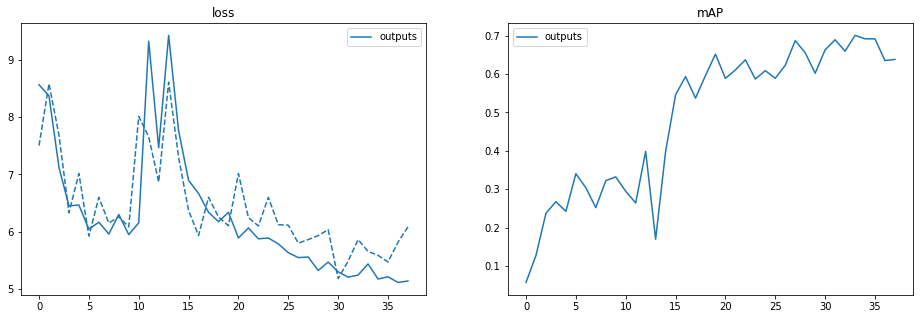

In [123]:
fields_of_interest = (
    'loss',
    'mAP',
    )

plot_logs(log_directory,
          fields_of_interest)

/home/sn/.cache/torch/hub/facebookresearch_detr_master/util/plot_utils.py:65: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['test_coco_eval_bbox'], dtype='object')
  df.interpolate().ewm(com=ewm_col).mean().plot(
/home/sn/.cache/torch/hub/facebookresearch_detr_master/util/plot_utils.py:65: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['test_coco_eval_bbox'], dtype='object')
  df.interpolate().ewm(com=ewm_col).mean().plot(
/home/sn/.cache/torch/hub/facebookresearch_detr_master/util/plot_utils.py:65: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before cal

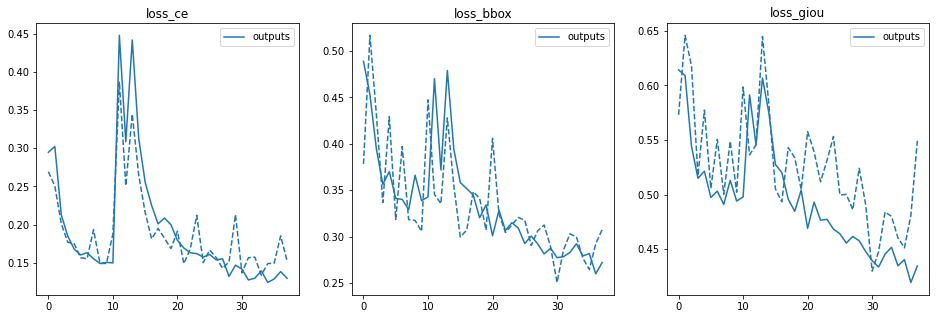

In [124]:
fields_of_interest = (
    'loss_ce',
    'loss_bbox',
    'loss_giou',
    )

plot_logs(log_directory,
          fields_of_interest)

/home/sn/.cache/torch/hub/facebookresearch_detr_master/util/plot_utils.py:65: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['test_coco_eval_bbox'], dtype='object')
  df.interpolate().ewm(com=ewm_col).mean().plot(
/home/sn/.cache/torch/hub/facebookresearch_detr_master/util/plot_utils.py:65: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['test_coco_eval_bbox'], dtype='object')
  df.interpolate().ewm(com=ewm_col).mean().plot(


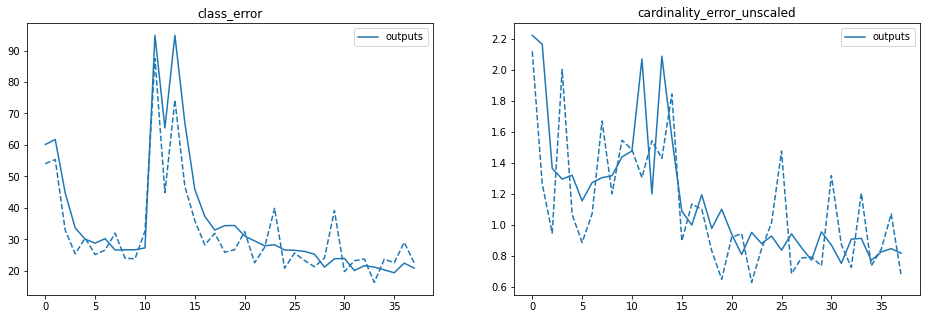

In [125]:
fields_of_interest = (
    'class_error',
    'cardinality_error_unscaled',
    )

plot_logs(log_directory,
          fields_of_interest)   

### Load the fine-tuned model

- How to replace the classification head: https://github.com/facebookresearch/detr/issues/9#issuecomment-636391562

In [126]:
model = torch.hub.load('facebookresearch/detr',
                       'detr_resnet50',
                       pretrained=False,
                       num_classes=num_classes)

checkpoint = torch.load('outputs/checkpoint.pth',
                        map_location='cpu')

model.load_state_dict(checkpoint['model'],
                      strict=False)

model.eval();

Using cache found in /home/sn/.cache/torch/hub/facebookresearch_detr_master


### Boilerplate functions to display fine-tuned results

In [127]:
def plot_finetuned_results(pil_img, prob=None, boxes=None):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    if prob is not None and boxes is not None:
      for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
          ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                    fill=False, color=c, linewidth=3))
          cl = p.argmax()
          text = f'{finetuned_classes[cl]}: {p[cl]:0.2f}'
          ax.text(xmin, ymin, text, fontsize=15,
                  bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [128]:
def run_worflow(my_image, my_model):
  # mean-std normalize the input image (batch-size: 1)
  img = transform(my_image).unsqueeze(0)

  # propagate through the model
  outputs = my_model(img)
#   print(outputs)
#   for threshold in [0.9, 0.7]:
  for threshold in [0.9, 0.7]:
    
    probas_to_keep, bboxes_scaled = filter_bboxes_from_outputs(outputs,
                                                              threshold=threshold)
    print(probas_to_keep)
    plot_finetuned_results(my_image,
                           probas_to_keep, 
                           bboxes_scaled)


### With a training image

tensor([[8.4902e-07, 1.8429e-03, 3.2214e-04, 9.9092e-01]])


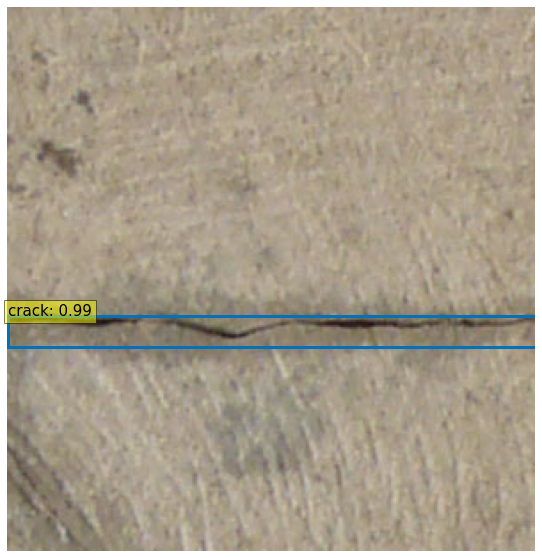

tensor([[8.4902e-07, 1.8429e-03, 3.2214e-04, 9.9092e-01]])


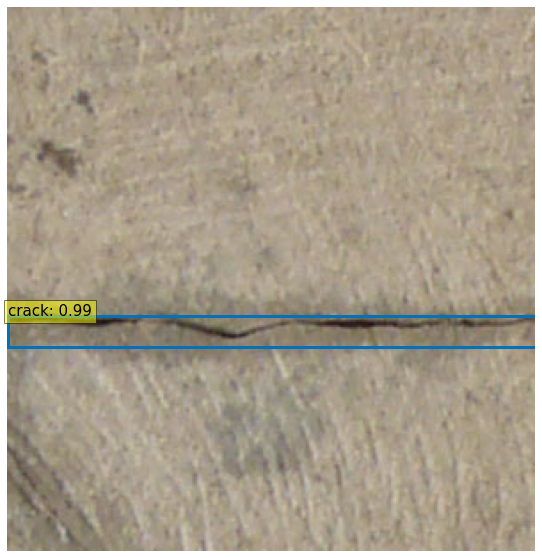

In [129]:
from PIL import Image

img_name = '/home/sn/EVA7/capstone/data/custom/train2017/0008.jpg'
im = Image.open(img_name)

run_worflow(im,
            model)

### With a validation image

tensor([[5.3622e-07, 9.7647e-01, 4.2192e-03, 9.6980e-03]])


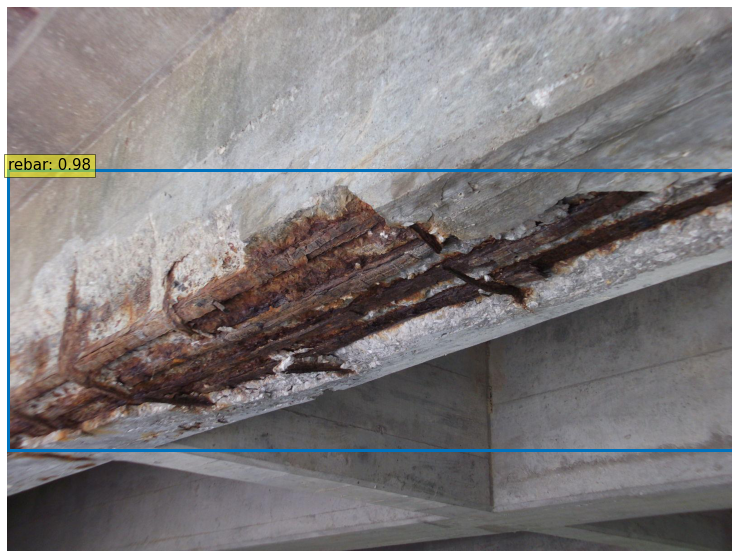

tensor([[5.3622e-07, 9.7647e-01, 4.2192e-03, 9.6980e-03]])


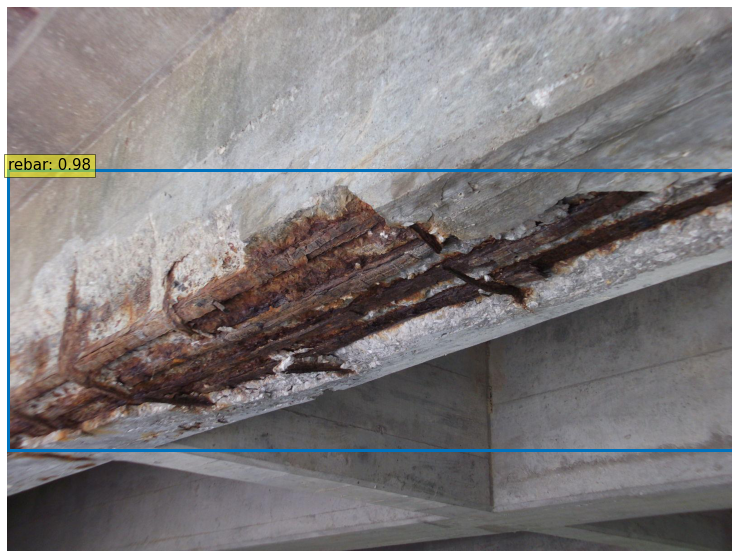

In [130]:
from PIL import Image

img_name = '/home/sn/EVA7/capstone/data/custom/val2017/00013.jpg'
im = Image.open(img_name)

run_worflow(im,
            model)

tensor([[4.5826e-07, 5.4030e-04, 9.9138e-01, 4.3694e-03]])


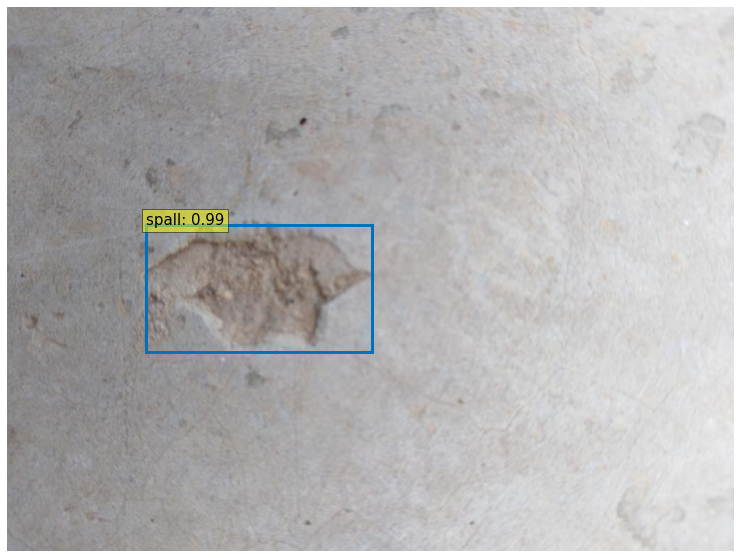

tensor([[4.5826e-07, 5.4030e-04, 9.9138e-01, 4.3694e-03]])


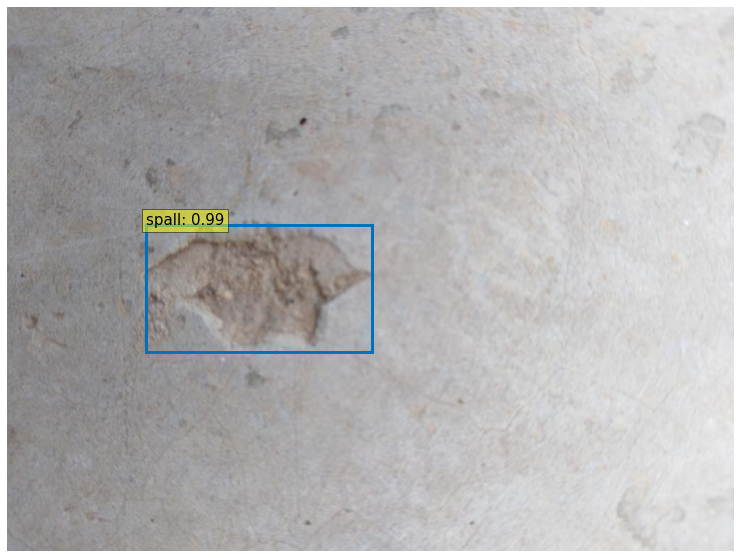

In [131]:
from PIL import Image

img_name = '/home/sn/EVA7/capstone/data/custom/val2017/000936.jpg'
im = Image.open(img_name)

run_worflow(im,
            model)